# Enterprise Medical Imaging: DICOM Metadata Compliance

## Introduction
This Notebook is associated with the Enterprise Medical Imaging in Zambia (EMIZ) Project. Specifically, the notebook is linked to the project Work Package that involves determining the Digital Imaging and Communications in Medicine (DICOM) standard metadata compliance levels for medical images.

### Motivation
The Medical Imaging Technology Association (MITA) has highlighted a set of criteria to consider, in medical imaging workflows, in order to effectively integrate AI in medical imaging, with conformance to the DICOM specification cited as an important point to consider [\(Medical Imaging Technology Association, n.d.\)](https://www.dicomstandard.org/ai).

### Problem Statement
There are a number of modalities generated in public health facilities in Zambia, however, the DICOM compliance levels of medical images generated are largely unknown. This Notebook includes Data Mining pipelines aimed at empirically determining the DICOM compliance levels of medical images generated in public health facilities in Zambia and, additionally, determining the feasibility of automatically classifying medical images using DICOM metadata.

### Code Convention
The Python code convention is based on the [Google Python Style Guide](https://google.github.io/styleguide/pyguide.html)


## Datasets

### COVID-19

## Package Installation and Configuration


### Packages and Libraries Installation

In [1]:
!pip install pydicom
# !sudo apt-get install dcmtk
!pip install scikit-learn
!pip install missingno


/usr/bin/pip:6: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import load_entry_point


/usr/bin/pip:6: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import load_entry_point
     |████████████████████████████████| 13.4 MB 3.1 MB/s eta 0:00:01
     |████████████████████████████████| 38.6 MB 2.4 MB/s eta 0:00:01
     |████████████████████████████████| 301 kB 2.2 MB/s eta 0:00:01
/usr/bin/pip:6: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import load_entry_point
  Using cached missingno-0.5.2-py3-none-any.whl (8.7 kB)
     |████████████████████████████████| 294 kB 226 kB/s eta 0:00:01
ERROR: seaborn 0.13.2 has requirement matplotlib!=3.6.1,>=3.4, but you'll have matplotlib 3.1.2 which is incompatible.


## Packages and Library Imports

In [3]:
# Generic libraries and packages
import os
import glob
import json

import hashlib
import openpyxl
import pandas as pd
from pathlib import Path
import pickle
import numpy as np
# DICOM centric packages
import pydicom
# Packages for Processing the DICOM files
import concurrent.futures
# Packages used for data visualization
import seaborn as sns
import matplotlib.pyplot as plt
# import missingno
from matplotlib.ticker import FuncFormatter




# Packages for accessing Google Sheets spreadsheets
from oauth2client.service_account import ServiceAccountCredentials
import gspread
# from google.colab import auth
# auth.authenticate_user()
# from google.auth import default
# creds, _ = default()
# gc = gspread.authorize(creds)
# # Google Drive access
# from google.colab import drive
# drive.mount('/content/drive')



/home/elijah/.local/lib/python3.9/site-packages/matplotlib/projections/__init__.py:63: UserWarning: Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available.
  warnings.warn("Unable to import Axes3D. This may be due to multiple versions of "


## Notebook Configuration

In [ ]:
# Configure Notebook such that all rows and columns are visible
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

### Utility Functions

#### Loading DICOM Files in Directory into Pandas DataFram

In [ ]:
def fxn_emiz_load_dicom_in_pandas(var_dicom_directory, var_pandas_dataframe):
  """
  Recursively load DICOM files

  This function recursively loads all DICOM files in a given
  directory, into an existing Pandas DataFrame

  Parameters
  ----------
  var_dicom_directory: str
      Root directory comprising of DICOM files to load in DataFrame

  var_pandas_dataframe: pandas.core.frame.DataFrame
      Pandas DataFrame to append DICOM metadata to

  Returns
  -------
  pandas.core.frame.DataFrame
      Modified DataFrame with additional data added

  Examples
  --------
  def fxn_emiz_load_dicom_in_pandas(".", var_uths_pandas_dataframe)
  """
  for var_dicom_file in Path(var_dicom_directory).rglob("*.dcm"):
    #print(var_dicom_file)
    var_dicom_file = pydicom.dcmread(var_dicom_file)
    var_pandas_dataframe = var_pandas_dataframe.append(
        {
            var_key:var_value for var_key in var_dicom_file.to_json_dict().keys() if var_key not in ["7FE00010"] for var_value in var_dicom_file.to_json_dict()[var_key].get("Value", [])
            },
            ignore_index=True)
  return var_pandas_dataframe

#### Generating JSON Representation of DICOM File Metadata

In [ ]:
def fxn_emiz_dicom_file_registry_json(var_dicom_file):
  """
  Output JSON representation of DICOM file

  This function return a JSON output of an input DICOM file, with associated DICOM tag names

  Parameters
  ----------
  var_dicom_file: str
      DICOM file to process

  Returns
  -------
  str
      String representation of JSON DICOM file metadata, excluding pixel data

  Examples
  --------
  def fxn_emiz_dicom_file_registry_json("sample_dicom_file.dcm")
  """
  pass

#### Check for DICOM Metadata Element

In [ ]:
def fxn_emiz_dicom_element():
  pass

In [2]:
#
# Cell for testing function
# Pandas DataFrame for holding entries
var_dicom_files_dataframe = pd.DataFrame(columns = ["00080001","00080005","00080006","00080008","00080010","00080012","00080013","00080014","00080015","00080016","00080017","00080018","00080019","0008001A","0008001B","00080020","00080021","00080022","00080023","00080024","00080025","0008002A","00080030","00080031","00080032","00080033","00080034","00080035","00080040","00080041","00080042","00080050","00080051","00080052","00080053","00080054","00080055","00080056","00080058","00080060","00080061","00080062","00080063","00080064","00080068","00080070","00080080","00080081","00080082","00080090","00080092","00080094","00080096","0008009C","0008009D","00080100","00080101","00080102","00080103","00080104","00080105","00080106","00080107","00080108","00080109","0008010A","0008010B","0008010C","0008010D","0008010E","0008010F","00080110","00080112","00080114","00080115","00080116","00080117","00080118","00080119","00080120","00080121","00080122","00080123","00080124","00080201","00080202","00080220","00080221","00080222","00080300","00080301","00080302","00080303","00080304","00080306","00080305","00080307","00080308","00080309","0008030A","0008030B","0008030C","0008030D","0008030E","0008030F","00080310","00080400","00080401","00080402","00080403","00080404","00080405","00080406","00080407","00080408","00080409","0008040A","0008040B","0008040C","0008040D","0008040E","0008040F","00080410","00080411","00080412","00080413","00080414","00080415","00080416","00080417","00080418","00080419","0008041A","0008041B","0008041C","0008041D","0008041E","0008041F","00080420","00080421","00080422","00080423","00080424","00080425","00080426","00080427","00080428","00080429","00081000","00081010","00081030","00081032","0008103E","0008103F","00081040","00081041","00081048","00081049","00081050","00081052","00081060","00081062","00081070","00081072","00081080","00081084","00081088","00081090","00081100","00081110","00081111","00081115","00081120","00081125","00081130","00081134","0008113A","00081140","00081145","0008114A","0008114B","00081150","00081155","00081156","0008115A","00081160","00081161","00081162","00081163","00081164","00081167","00081190","00081195","00081196","00081197","00081198","00081199","0008119A","00081200","00081250","00082110","00082111","00082112","00082120","00082122","00082124","00082127","00082128","00082129","0008212A","00082130","00082132","00082133","00082134","00082135","00082142","00082143","00082144","00082200","00082204","00082208","00082218","00082220","00082228","00082229","00082230","00082240","00082242","00082244","00082246","00082251","00082253","00082255","00082256","00082257","00082258","00082259","0008225A","0008225C","00083001","00083002","00083010","00083011","00083012","00084000","00089007","00089092","00089121","00089123","00089124","00089154","00089205","00089206","00089207","00089208","00089209","00089215","00089237","00089410","00089458","00089459","00089460","00100010","00100020","00100021","00100022","00100024","00100026","00100027","00100028","00100030","00100032","00100033","00100034","00100035","00100040","00100050","00100101","00100102","00100200","00100201","00100212","00100213","00100214","00100215","00100216","00100217","00100218","00100219","00100221","00100222","00100223","00100229","00101000","00101001","00101002","00101005","00101010","00101020","00101021","00101022","00101023","00101024","00101030","00101040","00101050","00101060","00101080","00101081","00101090","00101100","00102000","00102110","00102150","00102152","00102154","00102155","00102160","00102180","001021A0","001021B0","001021C0","001021D0","001021F0","00102201","00102202","00102203","00102210","00102292","00102293","00102294","00102295","00102296","00102297","00102298","00102299","00104000","00109431","00120010","00120020","00120021","00120030","00120031","00120040","00120042","00120050","00120051","00120052","00120053","00120054","00120060","00120062","00120063","00120064","00120071","00120072","00120081","00120082","00120083","00120084","00120085","00120086","00120087","00140023","00140024","00140025","00140028","00140030","00140032","00140034","00140042","00140044","00140045","00140046","00140050","00140052","00140054","00140056","00140100","00140101","00140102","00140103","00140104","00140105","00140106","00140107","00140108","00140200","00140201","00140202","00140203","00140204","00140205","00140206","00140207","00141010","00141020","00141040","00142002","00142004","00142006","00142008","00142012","00142014","00142016","00142018","0014201A","0014201C","0014201E","00142030","00142032","00142202","00142204","00142206","00142208","0014220A","0014220C","0014220E","00142210","00142220","00142222","00142224","00142226","00142228","0014222A","0014222C","00143011","00143012","00143020","00143022","00143024","00143026","00143028","00143040","00143050","00143060","00143070","00143071","00143072","00143073","00143074","00143075","00143076","00143077","00143080","00143099","00143100","00143101","00144002","00144004","00144006","00144008","0014400A","0014400C","0014400E","0014400F","00144010","00144011","00144012","00144013","00144014","00144015","00144016","00144017","00144018","00144019","0014401A","0014401B","0014401C","0014401D","00144020","00144022","00144024","00144026","00144028","00144030","00144031","00144032","00144033","00144034","00144035","00144036","00144038","0014403A","0014403C","00144040","00144050","00144051","00144052","00144054","00144056","00144057","00144058","00144059","0014405A","0014405C","00144060","00144062","00144064","00144070","00144072","00144074","00144076","00144078","0014407A","0014407C","0014407E","00144080","00144081","00144082","00144083","00144084","00144085","00144086","00144087","00144088","00144089","0014408B","0014408C","0014408D","0014408E","00144091","00144092","0014409A","0014409B","0014409C","0014409D","0014409F","001440A0","001440A1","001440A2","00145002","00145004","00145100","00145101","00145102","00145103","00145104","00145105","00145106","00145107","00145108","00145109","0014510A","0014510B","0014510C","0014510D","0014510E","0014510F","00145110","00145111","00145112","00145113","00145114","00145115","00145116","00145117","00145118","00145119","0014511A","0014511B","0014511C","0014511D","0014511E","0014511F","00160001","00160002","00160003","00160004","00160005","00160006","00160007","00160008","00160009","0016000A","0016000B","0016000C","0016000D","0016000E","0016000F","00160010","00160011","00160012","00160013","00160014","00160015","00160016","00160017","00160018","00160019","0016001A","0016001B","0016001C","0016001D","0016001E","0016001F","00160020","00160021","00160022","00160023","00160024","00160025","00160026","00160027","00160028","00160029","0016002A","0016002B","00160030","00160031","00160032","00160033","00160034","00160035","00160036","00160037","00160038","00160039","0016003A","0016003B","00160041","00160042","00160043","00160044","00160045","00160046","00160047","00160048","00160049","0016004A","0016004B","0016004C","0016004D","0016004E","0016004F","00160050","00160051","00160061","00160062","00160070","00160071","00160072","00160073","00160074","00160075","00160076","00160077","00160078","00160079","0016007A","0016007B","0016007C","0016007D","0016007E","0016007F","00160080","00160081","00160082","00160083","00160084","00160085","00160086","00160087","00160088","00160089","0016008A","0016008B","0016008C","0016008D","0016008E","00161001","00161002","00161003","00161004","00161005","00180010","00180012","00180013","00180014","00180015","00180020","00180021","00180022","00180023","00180024","00180025","00180026","00180027","00180028","00180029","0018002A","00180030","00180031","00180032","00180033","00180034","00180035","00180036","00180037","00180038","00180039","0018003A","00180040","00180042","00180050","00180060","00180061","00180070","00180071","00180072","00180073","00180074","00180075","00180080","00180081","00180082","00180083","00180084","00180085","00180086","00180087","00180088","00180089","00180090","00180091","00180093","00180094","00180095","00181000","00181002","00181003","00181004","00181005","00181006","00181007","00181008","00181009","0018100A","0018100B","00181010","00181011","00181012","00181014","00181016","00181017","00181018","00181019","0018101A","0018101B","00181020","00181022","00181023","00181030","00181040","00181041","00181042","00181043","00181044","00181045","00181046","00181047","00181048","00181049","00181050","00181060","00181061","00181062","00181063","00181064","00181065","00181066","00181067","00181068","00181069","0018106A","0018106C","0018106E","00181070","00181071","00181072","00181073","00181074","00181075","00181076","00181077","00181078","00181079","00181080","00181081","00181082","00181083","00181084","00181085","00181086","00181088","00181090","00181094","00181100","00181110","00181111","00181114","00181120","00181121","00181130","00181131","00181134","00181135","00181136","00181137","00181138","0018113A","00181140","00181141","00181142","00181143","00181144","00181145","00181146","00181147","00181149","00181150","00181151","00181152","00181153","00181154","00181155","00181156","0018115A","0018115E","00181160","00181161","00181162","00181164","00181166","00181170","00181180","00181181","00181182","00181183","00181184","00181190","00181191","001811A0","001811A2","001811A3","001811A4","001811A5","001811B0","001811B1","001811B2","001811B3","001811B4","001811B5","001811B6","001811B7","001811B8","001811B9","001811BA","001811BB","001811BC","001811BD","001811BE","001811BF","001811C0","001811C1","00181200","00181201","00181202","00181203","00181210","00181240","00181242","00181243","00181244","00181250","00181251","00181260","00181261","00181271","00181272","00181300","00181301","00181302","00181310","00181312","00181314","00181315","00181316","00181318","00181320","00181400","00181401","00181402","00181403","00181404","00181405","00181411","00181412","00181413","00181450","00181460","00181470","00181480","00181490","00181491","00181495","00181500","00181508","00181510","00181511","00181520","00181521","00181530","00181531","00181600","00181602","00181604","00181606","00181608","00181610","00181612","00181620","00181622","00181623","00181624","00181630","00181631","00181632","00181633","00181634","00181635","00181636","00181637","00181638","00181700","00181702","00181704","00181706","00181708","00181710","00181712","00181720","00181800","00181801","00181802","00181803","00182001","00182002","00182003","00182004","00182005","00182006","00182010","00182020","00182030","00182041","00182042","00182043","00182044","00182045","00182046","00183100","00183101","00183102","00183103","00183104","00183105","00184000","00185000","00185010","00185011","00185012","00185020","00185021","00185022","00185024","00185026","00185027","00185028","00185029","00185030","00185040","00185050","00185100","00185101","00185104","00185210","00185212","00186000","00186011","00186012","00186014","00186016","00186018","0018601A","0018601C","0018601E","00186020","00186022","00186024","00186026","00186028","0018602A","0018602C","0018602E","00186030","00186031","00186032","00186034","00186036","00186038","00186039","0018603A","0018603B","0018603C","0018603D","0018603E","0018603F","00186040","00186041","00186042","00186043","00186044","00186046","00186048","0018604A","0018604C","0018604E","00186050","00186052","00186054","00186056","00186058","0018605A","00186060","00186070","00187000","00187001","00187004","00187005","00187006","00187008","0018700A","0018700C","0018700E","00187010","00187011","00187012","00187014","00187016","0018701A","00187020","00187022","00187024","00187026","00187028","0018702A","0018702B","00187030","00187032","00187034","00187036","00187038","00187040","00187041","00187042","00187044","00187046","00187048","0018704C","00187050","00187052","00187054","00187056","00187058","00187060","00187062","00187064","00187065","00188150","00188151","00189004","00189005","00189006","00189008","00189009","00189010","00189011","00189012","00189014","00189015","00189016","00189017","00189018","00189019","00189020","00189021","00189022","00189024","00189025","00189026","00189027","00189028","00189029","00189030","00189032","00189033","00189034","00189035","00189036","00189037","00189041","00189042","00189043","00189044","00189045","00189046","00189047","00189048","00189049","00189050","00189051","00189052","00189053","00189054","00189058","00189059","00189060","00189061","00189062","00189063","00189064","00189065","00189066","00189067","00189069","00189070","00189073","00189074","00189075","00189076","00189077","00189078","00189079","00189080","00189081","00189082","00189083","00189084","00189085","00189087","00189089","00189090","00189091","00189092","00189093","00189094","00189095","00189096","00189098","00189100","00189101","00189103","00189104","00189105","00189106","00189107","00189112","00189114","00189115","00189117","00189118","00189119","00189125","00189126","00189127","00189147","00189151","00189152","00189155","00189159","00189166","00189168","00189169","00189170","00189171","00189172","00189173","00189174","00189175","00189176","00189177","00189178","00189179","00189180","00189181","00189182","00189183","00189184","00189185","00189186","00189195","00189196","00189197","00189198","00189199","00189200","00189214","00189217","00189218","00189219","00189220","00189226","00189227","00189231","00189232","00189234","00189236","00189239","00189240","00189241","00189250","00189251","00189252","00189253","00189254","00189255","00189256","00189257","00189258","00189259","0018925A","0018925B","0018925C","0018925D","0018925E","0018925F","00189260","00189295","00189296","00189297","00189298","00189301","00189302","00189303","00189304","00189305","00189306","00189307","00189308","00189309","00189310","00189311","00189312","00189313","00189314","00189315","00189316","00189317","00189318","00189319","00189320","00189321","00189322","00189323","00189324","00189325","00189326","00189327","00189328","00189329","00189330","00189332","00189333","00189334","00189335","00189337","00189338","00189340","00189341","00189342","00189343","00189344","00189345","00189346","00189351","00189352","00189353","00189360","00189361","00189362","00189363","00189364","00189365","00189366","00189367","00189368","00189369","0018936A","0018936B","0018936C","0018936D","0018936E","0018936F","00189370","00189371","00189372","00189373","00189374","00189375","00189376","00189377","00189378","00189379","0018937A","0018937B","0018937C","0018937D","0018937E","0018937F","00189380","00189381","00189382","00189383","00189384","00189401","00189402","00189403","00189404","00189405","00189406","00189407","00189410","00189412","00189417","00189420","00189423","00189424","00189425","00189426","00189427","00189428","00189429","00189430","00189432","00189433","00189434","00189435","00189436","00189437","00189438","00189439","00189440","00189441","00189442","00189445","00189447","00189449","00189451","00189452","00189455","00189456","00189457","00189461","00189462","00189463","00189464","00189465","00189466","00189467","00189468","00189469","00189470","00189471","00189472","00189473","00189474","00189476","00189477","00189504","00189506","00189507","00189508","00189509","00189510","00189511","00189514","00189515","00189516","00189517","00189518","00189519","00189524","00189525","00189526","00189527","00189528","00189530","00189531","00189538","00189541","00189542","00189543","00189544","00189545","00189546","00189547","00189548","00189549","00189550","00189551","00189552","00189553","00189554","00189555","00189556","00189557","00189558","00189559","00189601","00189602","00189603","00189604","00189605","00189606","00189607","00189621","00189622","00189623","00189624","00189701","00189715","00189716","00189717","00189718","00189719","00189720","00189721","00189722","00189723","00189724","00189725","00189726","00189727","00189729","00189732","00189733","00189734","00189735","00189736","00189737","00189738","00189739","00189740","00189749","00189751","00189755","00189756","00189758","00189759","00189760","00189761","00189762","00189763","00189764","00189765","00189766","00189767","00189768","00189769","00189770","00189771","00189772","00189801","00189803","00189804","00189805","00189806","00189807","00189808","00189809","0018980B","0018980C","0018980D","0018980E","0018980F","00189810","00189900","00189901","00189902","00189903","00189904","00189905","00189906","00189907","00189908","00189909","0018990A","0018990B","0018990C","0018990D","0018990E","0018990F","00189910","00189911","00189912","00189913","00189914","00189915","00189916","00189917","00189918","00189919","0018991A","0018991B","0018991C","0018991D","0018991E","0018991F","00189920","00189921","00189922","00189923","00189924","00189930","00189931","00189932","00189933","00189934","00189935","00189936","00189937","00189938","00189939","0018993A","0018993B","0018993C","0018993D","0018993E","00189941","00189942","00189943","00189944","00189945","00189946","00189947","0018A001","0018A002","0018A003","0020000D","0020000E","00200010","00200011","00200012","00200013","00200014","00200015","00200016","00200017","00200018","00200019","00200020","00200022","00200024","00200026","00200027","00200030","00200032","00200035","00200037","00200050","00200052","00200060","00200062","00200070","00200080","002000AA","00200100","00200105","00200110","00200200","00200242","00201000","00201001","00201002","00201003","00201004","00201005","00201020","0020103F","00201040","00201041","00201070","00201200","00201202","00201204","00201206","00201208","00201209","002031xx","00203401","00203402","00203403","00203404","00203405","00203406","00204000","00205000","00205002","00209056","00209057","00209071","00209072","00209111","00209113","00209116","00209128","00209153","00209154","00209155","00209156","00209157","00209158","00209161","00209162","00209163","00209164","00209165","00209167","00209170","00209171","00209172","00209213","00209221","00209222","00209228","00209238","00209241","00209245","00209246","00209247","00209248","00209249","00209250","00209251","00209252","00209253","00209254","00209255","00209256","00209257","00209301","00209302","00209307","00209308","00209309","0020930A","0020930B","0020930C","0020930D","0020930E","0020930F","00209310","00209311","00209312","00209313","00209421","00209450","00209453","00209518","00209529","00209536","00220001","00220002","00220003","00220004","00220005","00220006","00220007","00220008","00220009","0022000A","0022000B","0022000C","0022000D","0022000E","00220010","00220011","00220012","00220013","00220014","00220015","00220016","00220017","00220018","00220019","0022001A","0022001B","0022001C","0022001D","0022001E","00220020","00220021","00220022","00220028","00220030","00220031","00220032","00220035","00220036","00220037","00220038","00220039","00220041","00220042","00220048","00220049","0022004E","00220055","00220056","00220057","00220058","00221007","00221008","00221009","00221010","00221012","00221019","00221024","00221025","00221028","00221029","00221033","00221035","00221036","00221037","00221039","00221040","00221044","00221045","00221046","00221047","00221048","00221049","0022104A","0022104B","00221050","00221053","00221054","00221059","00221065","00221066","00221090","00221092","00221093","00221094","00221095","00221096","00221097","00221100","00221101","00221103","00221121","00221122","00221125","00221127","00221128","0022112A","0022112B","0022112C","00221130","00221131","00221132","00221133","00221134","00221135","00221140","00221150","00221153","00221155","00221159","00221210","00221211","00221212","00221220","00221225","00221230","00221250","00221255","00221257","00221260","00221262","00221265","00221273","00221300","00221310","00221330","00221415","00221420","00221423","00221436","00221443","00221445","00221450","00221452","00221454","00221458","00221460","00221463","00221465","00221466","00221467","00221468","00221470","00221472","00221512","00221513","00221515","00221517","00221518","00221525","00221526","00221527","00221528","00221529","00221530","00221531","00221612","00221615","00221616","00221618","00221620","00221622","00221624","00221626","00221628","00221630","00221640","00221642","00221643","00221644","00221645","00221646","00221649","00221650","00221658","00240010","00240011","00240012","00240016","00240018","00240020","00240021","00240024","00240025","00240028","00240032","00240033","00240034","00240035","00240036","00240037","00240038","00240039","00240040","00240042","00240044","00240045","00240046","00240048","00240050","00240051","00240052","00240053","00240054","00240055","00240056","00240057","00240058","00240059","00240060","00240061","00240062","00240063","00240064","00240065","00240066","00240067","00240068","00240069","00240070","00240071","00240072","00240073","00240074","00240075","00240076","00240077","00240078","00240079","00240080","00240081","00240083","00240085","00240086","00240087","00240088","00240089","00240090","00240091","00240092","00240093","00240094","00240095","00240096","00240097","00240098","00240100","00240102","00240103","00240104","00240105","00240106","00240107","00240108","00240110","00240112","00240113","00240114","00240115","00240117","00240118","00240120","00240122","00240124","00240126","00240202","00240306","00240307","00240308","00240309","00240317","00240320","00240325","00240338","00240341","00240344","00280002","00280003","00280004","00280005","00280006","00280008","00280009","0028000A","00280010","00280011","00280012","00280014","00280020","00280030","00280031","00280032","00280034","00280040","00280050","00280051","0028005F","00280060","00280061","00280062","00280063","00280065","00280066","00280068","00280069","00280070","00280071","00280080","00280081","00280082","00280090","00280091","00280092","00280093","00280094","00280100","00280101","00280102","00280103","00280104","00280105","00280106","00280107","00280108","00280109","00280110","00280111","00280120","00280121","00280122","00280123","00280124","00280125","00280200","00280300","00280301","00280302","00280303","00280304","00280400","00280401","00280402","00280403","00280404","002804x0","002804x1","002804x2","002804x3","00280700","00280701","00280702","00280710","00280720","00280721","00280722","00280730","00280740","002808x0","002808x2","002808x3","002808x4","002808x8","00280A02","00280A04","00281040","00281041","00281050","00281051","00281052","00281053","00281054","00281055","00281056","00281080","00281090","00281100","00281101","00281102","00281103","00281104","00281111","00281112","00281113","00281199","00281200","00281201","00281202","00281203","00281204","00281211","00281212","00281213","00281214","00281221","00281222","00281223","00281224","00281230","00281231","00281232","00281300","00281350","00281351","00281352","0028135A","00281401","00281402","00281403","00281404","00281405","00281406","00281407","00281408","0028140B","0028140C","0028140D","0028140E","0028140F","00281410","00282000","00282002","00282110","00282112","00282114","00283000","00283001","00283002","00283003","00283004","00283006","00283010","00283110","00284000","00285000","00286010","00286020","00286022","00286023","00286030","00286040","00286100","00286101","00286102","00286110","00286112","00286114","00286120","00286190","00287000","00287001","00287002","00287003","00287004","00287005","00287006","00287007","00287008","00287009","0028700A","0028700B","0028700C","0028700D","0028700E","0028700F","00287010","00287011","00287012","00287013","00287014","00287015","00287016","00287017","00287018","00287019","0028701A","0028701B","0028701C","0028701D","0028701E","0028701F","00287020","00287021","00287022","00287023","00287024","00287025","00287026","00287027","00287028","00287029","0028702A","0028702B","0028702C","0028702D","0028702E","00287FE0","00289001","00289002","00289003","00289099","00289108","00289110","00289132","00289145","00289235","00289411","00289415","00289416","00289422","00289443","00289444","00289445","00289446","00289454","00289474","00289478","00289501","00289502","00289503","00289505","00289506","00289507","00289520","00289537","0032000A","0032000C","00320012","00320032","00320033","00320034","00320035","00321000","00321001","00321010","00321011","00321020","00321021","00321030","00321031","00321032","00321033","00321034","00321040","00321041","00321050","00321051","00321055","00321060","00321064","00321065","00321066","00321067","00321070","00324000","00340001","00340002","00340003","00340004","00340005","00340007","00340008","00340009","0034000A","0034000B","0034000C","0034000D","00380004","00380008","00380010","00380011","00380014","00380016","0038001A","0038001B","0038001C","0038001D","0038001E","00380020","00380021","00380030","00380032","00380040","00380044","00380050","00380060","00380061","00380062","00380064","00380100","00380101","00380102","00380300","00380400","00380500","00380502","00384000","003A0004","003A0005","003A0010","003A001A","003A0020","003A0200","003A0202","003A0203","003A0205","003A0208","003A0209","003A020A","003A020C","003A0210","003A0211","003A0212","003A0213","003A0214","003A0215","003A0218","003A021A","003A0220","003A0221","003A0222","003A0223","003A0230","003A0231","003A0240","003A0241","003A0242","003A0244","003A0245","003A0246","003A0247","003A0248","003A0300","003A0301","003A0302","003A0310","003A0311","003A0312","003A0313","003A0314","003A0315","003A0316","003A0317","003A0318","003A0319","003A0320","003A0321","003A0322","003A0323","003A0324","003A0325","003A0326","003A0327","003A0328","003A0329","003A032A","003A032B","003A032C","003A032D","003A032E","00400001","00400002","00400003","00400004","00400005","00400006","00400007","00400008","00400009","0040000A","0040000B","00400010","00400011","00400012","00400020","00400026","00400027","00400031","00400032","00400033","00400035","00400036","00400039","0040003A","00400100","00400220","00400241","00400242","00400243","00400244","00400245","00400250","00400251","00400252","00400253","00400254","00400255","00400260","00400261","00400270","00400275","00400280","00400281","00400293","00400294","00400295","00400296","00400300","00400301","00400302","00400303","00400306","00400307","0040030E","00400310","00400312","00400314","00400316","00400318","00400320","00400321","00400324","00400330","00400340","00400400","00400440","00400441","00400500","0040050A","00400512","00400513","00400515","00400518","0040051A","00400520","00400550","00400551","00400552","00400553","00400554","00400555","00400556","0040059A","00400560","00400562","00400600","00400602","00400610","00400612","00400620","004006FA","00400710","0040071A","0040072A","0040073A","0040074A","004008D8","004008DA","004008EA","004009F8","00401001","00401002","00401003","00401004","00401005","00401006","00401007","00401008","00401009","0040100A","00401010","00401011","00401012","00401060","00401101","00401102","00401103","00401104","00401400","00402001","00402004","00402005","00402006","00402007","00402008","00402009","00402010","00402011","00402016","00402017","00402400","00403001","00404001","00404002","00404003","00404004","00404005","00404006","00404007","00404008","00404009","00404010","00404011","00404015","00404016","00404018","00404019","00404020","00404021","00404022","00404023","00404025","00404026","00404027","00404028","00404029","00404030","00404031","00404032","00404033","00404034","00404035","00404036","00404037","00404040","00404041","00404050","00404051","00404052","00404070","00404071","00404072","00404073","00404074","00408302","00408303","00409092","00409094","00409096","00409098","00409210","00409211","00409212","00409213","00409214","00409216","00409220","00409224","00409225","0040A007","0040A010","0040A020","0040A021","0040A022","0040A023","0040A024","0040A026","0040A027","0040A028","0040A030","0040A032","0040A033","0040A040","0040A043","0040A047","0040A050","0040A057","0040A060","0040A066","0040A067","0040A068","0040A070","0040A073","0040A074","0040A075","0040A076","0040A078","0040A07A","0040A07C","0040A080","0040A082","0040A084","0040A085","0040A088","0040A089","0040A090","0040A0B0","0040A110","0040A112","0040A120","0040A121","0040A122","0040A123","0040A124","0040A125","0040A130","0040A132","0040A136","0040A138","0040A13A","0040A160","0040A161","0040A162","0040A163","0040A167","0040A168","0040A16A","0040A170","0040A171","0040A172","0040A173","0040A174","0040A180","0040A192","0040A193","0040A194","0040A195","0040A224","0040A290","0040A296","0040A297","0040A29A","0040A300","0040A301","0040A307","0040A30A","0040A313","0040A33A","0040A340","0040A352","0040A353","0040A354","0040A358","0040A360","0040A370","0040A372","0040A375","0040A380","0040A385","0040A390","0040A402","0040A403","0040A404","0040A491","0040A492","0040A493","0040A494","0040A496","0040A504","0040A525","0040A600","0040A601","0040A603","0040A730","0040A731","0040A732","0040A744","0040A801","0040A802","0040A803","0040A804","0040A805","0040A806","0040A807","0040A808","0040A992","0040B020","0040DB00","0040DB06","0040DB07","0040DB0B","0040DB0C","0040DB0D","0040DB73","0040E001","0040E004","0040E006","0040E008","0040E010","0040E011","0040E020","0040E021","0040E022","0040E023","0040E024","0040E025","0040E030","0040E031","00420010","00420011","00420012","00420013","00420014","00420015","00440001","00440002","00440003","00440004","00440007","00440008","00440009","0044000A","0044000B","00440010","00440011","00440012","00440013","00440019","00440100","00440101","00440102","00440103","00440104","00440105","00440106","00440107","00440108","00440109","0044010A","00460012","00460014","00460015","00460016","00460018","00460028","00460030","00460032","00460034","00460036","00460038","00460040","00460042","00460044","00460046","00460047","00460050","00460052","00460060","00460062","00460063","00460064","00460070","00460071","00460074","00460075","00460076","00460077","00460080","00460092","00460094","00460095","00460097","00460098","00460100","00460101","00460102","00460104","00460106","00460110","00460111","00460112","00460113","00460114","00460115","00460116","00460117","00460118","00460121","00460122","00460123","00460124","00460125","00460135","00460137","00460139","00460145","00460146","00460147","00460201","00460202","00460203","00460204","00460205","00460207","00460208","00460210","00460211","00460212","00460213","00460215","00460218","00460220","00460224","00460227","00460230","00460232","00460234","00460236","00460238","00460242","00460244","00460247","00460248","00460249","00460250","00460251","00460252","00460253","00480001","00480002","00480003","00480006","00480007","00480008","00480010","00480011","00480012","00480013","00480014","00480015","00480100","00480102","00480105","00480106","00480107","00480108","00480110","00480111","00480112","00480113","00480120","00480200","00480201","00480202","00480207","0048021A","0048021E","0048021F","00480301","00480302","00480303","00500004","00500010","00500012","00500013","00500014","00500015","00500016","00500017","00500018","00500019","0050001A","0050001B","0050001C","0050001D","0050001E","00500020","00500021","00520001","00520002","00520003","00520004","00520006","00520007","00520008","00520009","00520011","00520012","00520013","00520014","00520016","00520025","00520026","00520027","00520028","00520029","00520030","00520031","00520033","00520034","00520036","00520038","00520039","0052003A","00540010","00540011","00540012","00540013","00540014","00540015","00540016","00540017","00540018","00540020","00540021","00540022","00540030","00540031","00540032","00540033","00540036","00540038","00540039","00540050","00540051","00540052","00540053","00540060","00540061","00540062","00540063","00540070","00540071","00540072","00540073","00540080","00540081","00540090","00540100","00540101","00540200","00540202","00540210","00540211","00540220","00540222","00540300","00540302","00540304","00540306","00540308","00540400","00540410","00540412","00540414","00540500","00540501","00541000","00541001","00541002","00541004","00541006","00541100","00541101","00541102","00541103","00541104","00541105","00541200","00541201","00541202","00541203","00541210","00541220","00541300","00541310","00541311","00541320","00541321","00541322","00541323","00541324","00541330","00541400","00541401","00603000","00603002","00603004","00603006","00603008","00603010","00603020","00620001","00620002","00620003","00620004","00620005","00620006","00620007","00620008","00620009","0062000A","0062000B","0062000C","0062000D","0062000E","0062000F","00620010","00620011","00620012","00620013","00620020","00620021","00640002","00640003","00640005","00640007","00640008","00640009","0064000F","00640010","00660001","00660002","00660003","00660004","00660009","0066000A","0066000B","0066000C","0066000D","0066000E","00660010","00660011","00660012","00660013","00660015","00660016","00660017","00660018","00660019","0066001A","0066001B","0066001C","0066001E","0066001F","00660020","00660021","00660022","00660023","00660024","00660025","00660026","00660027","00660028","00660029","0066002A","0066002B","0066002C","0066002D","0066002E","0066002F","00660030","00660031","00660032","00660034","00660035","00660036","00660037","00660038","00660040","00660041","00660042","00660043","00660101","00660102","00660103","00660104","00660105","00660106","00660107","00660108","00660121","00660124","00660125","00660129","00660130","00660132","00660133","00660134","00686210","00686221","00686222","00686223","00686224","00686225","00686226","00686230","00686260","00686265","00686270","00686280","006862A0","006862A5","006862C0","006862D0","006862D5","006862E0","006862F0","006862F2","00686300","00686310","00686320","00686330","00686340","00686345","00686346","00686347","00686350","00686360","00686380","00686390","006863A0","006863A4","006863A8","006863AC","006863B0","006863C0","006863D0","006863E0","006863F0","00686400","00686410","00686420","00686430","00686440","00686450","00686460","00686470","00686490","006864A0","006864C0","006864D0","006864F0","00686500","00686510","00686520","00686530","00686540","00686545","00686550","00686560","00686590","006865A0","006865B0","006865D0","006865E0","006865F0","00686610","00686620","00687001","00687002","00687003","00687004","00687005","006A0001","006A0002","006A0003","006A0005","006A0006","006A0007","006A0008","006A0009","006A000A","006A000B","006A000C","006A000D","006A000E","006A000F","006A0010","006A0011","00700001","00700002","00700003","00700004","00700005","00700006","00700008","00700009","00700010","00700011","00700012","00700014","00700015","00700020","00700021","00700022","00700023","00700024","00700040","00700041","00700042","00700050","00700051","00700052","00700053","0070005A","00700060","00700062","00700066","00700067","00700068","00700080","00700081","00700082","00700083","00700084","00700086","00700087","00700100","00700101","00700102","00700103","00700207","00700208","00700209","00700226","00700227","00700228","00700229","00700230","00700231","00700232","00700233","00700234","00700241","00700242","00700243","00700244","00700245","00700246","00700247","00700248","00700249","00700250","00700251","00700252","00700253","00700254","00700255","00700256","00700257","00700258","00700261","00700262","00700273","00700274","00700278","00700279","00700282","00700284","00700285","00700287","00700288","00700289","00700294","00700295","00700306","00700308","00700309","0070030A","0070030B","0070030C","0070030D","0070030F","00700310","00700311","00700312","00700314","00700315","00700318","0070031A","0070031B","0070031C","0070031E","0070031F","00700401","00700402","00700403","00700404","00700405","00701101","00701102","00701103","00701104","00701201","00701202","00701203","00701204","00701205","00701206","00701207","00701208","00701209","0070120A","0070120B","0070120C","0070120D","00701301","00701302","00701303","00701304","00701305","00701306","00701309","00701501","00701502","00701503","00701505","00701507","00701508","0070150C","0070150D","00701511","00701512","00701602","00701603","00701604","00701605","00701606","00701607","00701701","00701702","00701703","00701704","00701705","00701706","00701801","00701802","00701803","00701804","00701805","00701806","00701807","00701808","00701901","00701903","00701904","00701905","00701907","00701A01","00701A03","00701A04","00701A05","00701A06","00701A07","00701A08","00701A09","00701B01","00701B02","00701B03","00701B04","00701B06","00701B07","00701B08","00701B11","00701B12","00701B13","00701B14","00720002","00720004","00720006","00720008","0072000A","0072000C","0072000E","00720010","00720012","00720014","00720020","00720022","00720024","00720026","00720028","00720030","00720032","00720034","00720038","0072003A","0072003C","0072003E","00720040","00720050","00720052","00720054","00720056","0072005E","0072005F","00720060","00720061","00720062","00720063","00720064","00720065","00720066","00720067","00720068","00720069","0072006A","0072006B","0072006C","0072006D","0072006E","0072006F","00720070","00720071","00720072","00720073","00720074","00720075","00720076","00720078","0072007A","0072007C","0072007E","0072007F","00720080","00720081","00720082","00720083","00720100","00720102","00720104","00720106","00720108","0072010A","0072010C","0072010E","00720200","00720202","00720203","00720204","00720206","00720208","00720210","00720212","00720214","00720216","00720218","00720300","00720302","00720304","00720306","00720308","00720310","00720312","00720314","00720316","00720318","00720320","00720330","00720400","00720402","00720404","00720406","00720420","00720421","00720422","00720424","00720427","00720430","00720432","00720434","00720500","00720510","00720512","00720514","00720516","00720520","00720600","00720602","00720604","00720700","00720702","00720704","00720705","00720706","00720710","00720712","00720714","00720716","00720717","00720718","00740120","00740121","00741000","00741002","00741004","00741006","00741007","00741008","0074100A","0074100C","0074100E","00741020","00741022","00741024","00741025","00741026","00741027","00741028","0074102A","0074102B","0074102C","0074102D","00741030","00741032","00741034","00741036","00741038","0074103A","00741040","00741042","00741044","00741046","00741048","0074104A","0074104C","0074104E","00741050","00741052","00741054","00741056","00741057","00741200","00741202","00741204","00741210","00741212","00741216","00741220","00741222","00741224","00741230","00741234","00741236","00741238","00741242","00741244","00741246","00741324","00741338","0074133A","00741401","00741402","00741403","00741404","00741405","00741406","00741407","00741408","00741409","0074140A","0074140B","0074140C","0074140D","0074140E","00760001","00760003","00760006","00760008","0076000A","0076000C","0076000E","00760010","00760020","00760030","00760032","00760034","00760036","00760038","00760040","00760055","00760060","00760070","00760080","00760090","007600A0","007600B0","007600C0","00780001","00780010","00780020","00780024","00780026","00780028","0078002A","0078002E","00780050","00780060","00780070","00780090","007800A0","007800B0","007800B2","007800B4","007800B6","007800B8","00800001","00800002","00800003","00800004","00800005","00800006","00800007","00800008","00800009","00800010","00800011","00800012","00800013","00820001","00820003","00820004","00820005","00820006","00820007","00820008","0082000A","0082000C","00820010","00820016","00820017","00820018","00820019","00820021","00820022","00820023","00820032","00820033","00820034","00820035","00820036","00820037","00820038","00880130","00880140","00880200","00880904","00880906","00880910","00880912","01000410","01000420","01000424","01000426","04000005","04000010","04000015","04000020","04000100","04000105","04000110","04000115","04000120","04000305","04000310","04000315","04000401","04000402","04000403","04000404","04000500","04000510","04000520","04000550","04000551","04000552","04000561","04000562","04000563","04000564","04000565","04000600","1000xxx0","1000xxx1","1000xxx2","1000xxx3","1000xxx4","1000xxx5","1010xxxx","20000010","2000001E","20000020","20000030","20000040","20000050","20000060","20000061","20000062","20000063","20000065","20000067","20000069","2000006A","200000A0","200000A1","200000A2","200000A4","200000A8","20000500","20000510","20100010","20100030","20100040","20100050","20100052","20100054","20100060","20100080","201000A6","201000A7","201000A8","201000A9","20100100","20100110","20100120","20100130","20100140","20100150","20100152","20100154","2010015E","20100160","20100376","20100500","20100510","20100520","20200010","20200020","20200030","20200040","20200050","202000A0","202000A2","20200110","20200111","20200130","20200140","20300010","20300020","20400010","20400011","20400020","20400060","20400070","20400072","20400074","20400080","20400082","20400090","20400100","20400500","20500010","20500020","20500500","21000010","21000020","21000030","21000040","21000050","21000070","21000140","21000160","21000170","21000500","21100010","21100020","21100030","21100099","21200010","21200050","21200070","21300010","21300015","21300030","21300040","21300050","21300060","21300080","213000A0","213000C0","22000001","22000002","22000003","22000004","22000005","22000006","22000007","22000008","22000009","2200000A","2200000B","2200000C","2200000D","2200000E","2200000F","22000020","30020002","30020003","30020004","3002000A","3002000C","3002000D","3002000E","30020010","30020011","30020012","30020020","30020022","30020024","30020026","30020028","30020029","30020030","30020032","30020034","30020040","30020041","30020042","30020050","30020051","30020052","30020100","30020101","30020102","30020103","30020104","30020105","30020106","30020107","30020108","30020109","3002010A","3002010B","3002010C","3002010D","3002010E","3002010F","30020110","30020111","30020112","30020113","30020114","30020115","30020116","30020117","30020118","30020119","3002011A","3002011B","3002011C","3002011D","3002011E","3002011F","30020120","30020121","30020122","30020123","30020124","30020125","30020126","30020127","30020128","30020129","3002012A","3002012B","3002012C","3002012D","3002012E","3002012F","30020130","30020131","30020132","30020133","30020134","30020135","30040001","30040002","30040004","30040005","30040006","30040008","3004000A","3004000C","3004000E","30040010","30040012","30040014","30040040","30040042","30040050","30040052","30040054","30040056","30040058","30040060","30040062","30040070","30040072","30040074","30060002","30060004","30060006","30060008","30060009","30060010","30060012","30060014","30060016","30060018","30060020","30060022","30060024","30060026","30060028","3006002A","3006002C","30060030","30060033","30060036","30060037","30060038","30060039","30060040","30060042","30060044","30060045","30060046","30060048","30060049","3006004A","30060050","30060080","30060082","30060084","30060085","30060086","30060088","300600A0","300600A4","300600A6","300600B0","300600B2","300600B4","300600B6","300600B7","300600B8","300600B9","300600C0","300600C2","300600C4","300600C6","300600C8","300600C9","300600CA","300600CB","30080010","30080012","30080014","30080016","30080020","30080021","30080022","30080024","30080025","3008002A","3008002B","3008002C","30080030","30080032","30080033","30080036","30080037","3008003A","3008003B","30080040","30080041","30080042","30080044","30080045","30080046","30080047","30080048","30080050","30080052","30080054","30080056","3008005A","30080060","30080061","30080062","30080063","30080064","30080065","30080066","30080067","30080068","3008006A","30080070","30080072","30080074","30080076","30080078","3008007A","30080080","30080082","30080090","30080092","300800A0","300800A1","300800A2","300800A3","300800A4","300800B0","300800C0","300800D0","300800D1","300800E0","300800F0","300800F2","300800F4","300800F6","30080100","30080105","30080110","30080116","30080120","30080122","30080130","30080132","30080134","30080136","30080138","3008013A","3008013C","30080140","30080142","30080150","30080152","30080160","30080162","30080164","30080166","30080168","30080171","30080172","30080173","30080200","30080202","30080220","30080223","30080224","30080230","30080240","30080250","30080251","300A0002","300A0003","300A0004","300A0006","300A0007","300A0009","300A000A","300A000B","300A000C","300A000E","300A0010","300A0012","300A0013","300A0014","300A0015","300A0016","300A0018","300A001A","300A0020","300A0021","300A0022","300A0023","300A0025","300A0026","300A0027","300A0028","300A002A","300A002B","300A002C","300A002D","300A0040","300A0042","300A0043","300A0044","300A0046","300A0048","300A004A","300A004B","300A004C","300A004E","300A004F","300A0050","300A0051","300A0052","300A0053","300A0055","300A0070","300A0071","300A0072","300A0078","300A0079","300A007A","300A007B","300A0080","300A0082","300A0083","300A0084","300A0086","300A0088","300A0089","300A008A","300A008B","300A008C","300A008D","300A008E","300A008F","300A0090","300A0091","300A0092","300A0093","300A0094","300A00A0","300A00A2","300A00A4","300A00B0","300A00B2","300A00B3","300A00B4","300A00B6","300A00B8","300A00BA","300A00BB","300A00BC","300A00BE","300A00C0","300A00C2","300A00C3","300A00C4","300A00C5","300A00C6","300A00C7","300A00C8","300A00CA","300A00CC","300A00CE","300A00D0","300A00D1","300A00D2","300A00D3","300A00D4","300A00D5","300A00D6","300A00D7","300A00D8","300A00D9","300A00DA","300A00DB","300A00DC","300A00DD","300A00DE","300A00E0","300A00E1","300A00E2","300A00E3","300A00E4","300A00E5","300A00E6","300A00E7","300A00E8","300A00E9","300A00EA","300A00EB","300A00EC","300A00ED","300A00EE","300A00EF","300A00F0","300A00F2","300A00F3","300A00F4","300A00F5","300A00F6","300A00F7","300A00F8","300A00F9","300A00FA","300A00FB","300A00FC","300A00FE","300A0100","300A0102","300A0104","300A0106","300A0107","300A0108","300A0109","300A010A","300A010C","300A010E","300A0110","300A0111","300A0112","300A0114","300A0115","300A0116","300A0118","300A011A","300A011C","300A011E","300A011F","300A0120","300A0121","300A0122","300A0123","300A0124","300A0125","300A0126","300A0128","300A0129","300A012A","300A012C","300A012E","300A0130","300A0131","300A0132","300A0133","300A0134","300A0140","300A0142","300A0144","300A0146","300A0148","300A014A","300A014C","300A014E","300A0150","300A0151","300A0152","300A0153","300A0154","300A0155","300A0180","300A0182","300A0183","300A0184","300A0190","300A0192","300A0194","300A0196","300A0198","300A0199","300A019A","300A01A0","300A01A2","300A01A4","300A01A6","300A01A8","300A01B0","300A01B2","300A01B4","300A01B6","300A01B8","300A01BA","300A01BC","300A01D0","300A01D2","300A01D4","300A01D6","300A0200","300A0202","300A0206","300A0210","300A0212","300A0214","300A0216","300A0218","300A021A","300A021B","300A021C","300A0222","300A0224","300A0226","300A0228","300A0229","300A022A","300A022B","300A022C","300A022E","300A0230","300A0232","300A0234","300A0236","300A0238","300A0240","300A0242","300A0244","300A0250","300A0260","300A0262","300A0263","300A0264","300A0266","300A026A","300A026C","300A0271","300A0272","300A0273","300A0274","300A0280","300A0282","300A0284","300A0286","300A0288","300A028A","300A028C","300A0290","300A0291","300A0292","300A0294","300A0296","300A0298","300A029C","300A029E","300A02A0","300A02A1","300A02A2","300A02A4","300A02B0","300A02B2","300A02B3","300A02B4","300A02B8","300A02BA","300A02C8","300A02D0","300A02D2","300A02D4","300A02D6","300A02E0","300A02E1","300A02E2","300A02E3","300A02E4","300A02E5","300A02E6","300A02E7","300A02E8","300A02EA","300A02EB","300A0302","300A0304","300A0306","300A0308","300A0309","300A030A","300A030C","300A030D","300A030F","300A0312","300A0314","300A0316","300A0318","300A0320","300A0322","300A0330","300A0332","300A0334","300A0336","300A0338","300A033A","300A033C","300A0340","300A0342","300A0344","300A0346","300A0348","300A034A","300A034C","300A0350","300A0352","300A0354","300A0355","300A0356","300A0358","300A035A","300A0360","300A0362","300A0364","300A0366","300A0370","300A0372","300A0374","300A0380","300A0382","300A0384","300A0386","300A0388","300A038A","300A038F","300A0390","300A0391","300A0392","300A0393","300A0394","300A0395","300A0396","300A0398","300A0399","300A039A","300A03A0","300A03A2","300A03A4","300A03A6","300A03A8","300A03AA","300A03AC","300A0401","300A0402","300A0410","300A0412","300A0420","300A0421","300A0422","300A0423","300A0424","300A0425","300A0426","300A0431","300A0432","300A0433","300A0434","300A0435","300A0436","300A0440","300A0441","300A0442","300A0443","300A0450","300A0451","300A0452","300A0453","300A0501","300A0502","300A0503","300A0504","300A0505","300A0506","300A0507","300A0508","300A0509","300A0510","300A0511","300A0512","300A0600","300A0601","300A0602","300A0603","300A0604","300A0605","300A0606","300A0607","300A0608","300A0609","300A060A","300A060B","300A060C","300A060D","300A060E","300A060F","300A0610","300A0611","300A0612","300A0613","300A0614","300A0615","300A0616","300A0617","300A0618","300A0619","300A061A","300A061B","300A061C","300A061D","300A061E","300A061F","300A0620","300A0621","300A0622","300A0623","300A0624","300A0625","300A0626","300A0627","300A0628","300A0629","300A062A","300A062B","300A062C","300A062D","300A062E","300A062F","300A0630","300A0631","300A0632","300A0634","300A0635","300A0636","300A0637","300A0638","300A0639","300A063A","300A063B","300A063C","300A063D","300A063E","300A063F","300A0640","300A0641","300A0642","300A0643","300A0644","300A0645","300A0646","300A0647","300A0648","300A0649","300A064A","300A064B","300A064C","300A064D","300A064E","300A064F","300A0650","300A0651","300A0652","300A0653","300A0654","300A0655","300A0656","300A0657","300A0658","300A0659","300A065A","300A065B","300A065C","300A065D","300A065E","300A065F","300A0660","300A0661","300A0662","300A0663","300A0664","300A0665","300A0666","300A0667","300A0668","300A0669","300A066A","300A066B","300A066C","300A066D","300A066E","300A066F","300A0670","300A0671","300A0672","300A0673","300A0674","300A0675","300A0676","300A0677","300A0678","300A0679","300A067A","300A067B","300A067C","300A067D","300A067E","300A067F","300A0680","300A0681","300A0682","300A0683","300A0684","300A0685","300A0686","300A0687","300A0688","300A0689","300A068A","300A0700","300A0701","300A0702","300A0703","300A0704","300A0705","300A0706","300A0707","300A0708","300A0709","300A0714","300A0715","300A0716","300A0722","300A0723","300A0730","300A0731","300A0732","300A0733","300A0734","300A0735","300A0736","300A073A","300A073B","300A073E","300A073F","300A0740","300A0741","300A0742","300A0743","300A0744","300A0745","300A0746","300A0760","300A0761","300A0762","300A0772","300A0773","300A0774","300A0780","300A0782","300A0783","300A0784","300A0785","300A0786","300A0787","300A0788","300A0789","300A078A","300A078B","300A078C","300A078D","300A078E","300A078F","300A0790","300A0791","300A0792","300A0793","300A0794","300A0795","300A0796","300A0797","300A0798","300A0799","300A079A","300A079B","300A079C","300A079D","300A079E","300C0002","300C0004","300C0006","300C0007","300C0008","300C0009","300C000A","300C000C","300C000E","300C0020","300C0022","300C0040","300C0042","300C0050","300C0051","300C0055","300C0060","300C006A","300C0080","300C00A0","300C00B0","300C00C0","300C00D0","300C00E0","300C00F0","300C00F2","300C00F4","300C00F6","300C0100","300C0102","300C0104","300C0111","300C0112","300C0113","300C0114","300C0115","300C0116","300C0117","300C0118","300C0119","300C0120","300C0121","300C0122","300C0123","300C0124","300C0125","300C0126","300C0127","300C0128","300E0002","300E0004","300E0005","300E0008","30100001","30100002","30100003","30100004","30100005","30100006","30100007","30100008","30100009","3010000A","3010000B","3010000C","3010000D","3010000E","3010000F","30100010","30100011","30100012","30100013","30100014","30100015","30100016","30100017","30100018","30100019","3010001A","3010001B","3010001C","3010001D","3010001E","3010001F","30100020","30100021","30100022","30100023","30100024","30100025","30100026","30100027","30100028","30100029","3010002A","3010002B","3010002C","3010002D","3010002E","3010002F","30100030","30100031","30100032","30100033","30100034","30100035","30100036","30100037","30100038","30100039","3010003A","3010003B","3010003C","3010003D","3010003E","3010003F","30100040","30100041","30100042","30100043","30100044","30100045","30100046","30100047","30100048","30100049","3010004A","3010004B","3010004C","3010004D","3010004E","3010004F","30100050","30100051","30100052","30100053","30100054","30100055","30100056","30100057","30100058","30100059","3010005A","3010005B","3010005C","3010005D","3010005E","3010005F","30100060","30100061","30100062","30100063","30100064","30100065","30100066","30100067","30100068","30100069","3010006A","3010006B","3010006C","3010006D","3010006E","3010006F","30100070","30100071","30100073","30100074","30100075","30100076","30100077","30100078","30100079","3010007A","3010007B","3010007C","3010007D","3010007E","3010007F","30100080","30100081","30100082","30100083","30100084","30100085","30100086","30100087","30100088","30100089","30100090","30100091","30100092","30100093","30100094","30100095","30100096","30100097","30100098","30100099","3010009A","301000A0","40000010","40004000","40080040","40080042","40080050","400800FF","40080100","40080101","40080102","40080103","40080108","40080109","4008010A","4008010B","4008010C","40080111","40080112","40080113","40080114","40080115","40080117","40080118","40080119","4008011A","40080200","40080202","40080210","40080212","40080300","40084000","40100001","40100002","40100004","40101001","40101004","40101005","40101006","40101007","40101008","40101009","4010100A","40101010","40101011","40101012","40101013","40101014","40101015","40101016","40101017","40101018","40101019","4010101A","4010101B","4010101C","4010101D","4010101E","4010101F","40101020","40101021","40101023","40101024","40101025","40101026","40101027","40101028","40101029","4010102A","4010102B","40101031","40101033","40101034","40101037","40101038","40101039","4010103A","40101041","40101042","40101043","40101044","40101045","40101046","40101047","40101048","40101051","40101052","40101053","40101054","40101055","40101056","40101058","40101059","40101060","40101061","40101062","40101064","40101067","40101068","40101069","4010106C","4010106D","4010106E","4010106F","40101070","40101071","40101072","40101073","40101075","40101076","40101077","40101078","40101079","4010107A","4010107B","4010107C","4010107D","4010107E","4FFE0001","50xx0005","50xx0010","50xx0020","50xx0022","50xx0030","50xx0040","50xx0103","50xx0104","50xx0105","50xx0106","50xx0110","50xx0112","50xx0114","50xx1001","50xx2000","50xx2002","50xx2004","50xx2006","50xx2008","50xx200A","50xx200C","50xx200E","50xx2500","50xx2600","50xx2610","50xx3000","52009229","52009230","54000100","54000110","54000112","54001004","54001006","5400100A","54001010","56000010","56000020","60xx0010","60xx0011","60xx0012","60xx0015","60xx0022","60xx0040","60xx0045","60xx0050","60xx0051","60xx0052","60xx0060","60xx0061","60xx0062","60xx0063","60xx0066","60xx0068","60xx0069","60xx0100","60xx0102","60xx0110","60xx0200","60xx0800","60xx0802","60xx0803","60xx0804","60xx1001","60xx1100","60xx1101","60xx1102","60xx1103","60xx1200","60xx1201","60xx1202","60xx1203","60xx1301","60xx1302","60xx1303","60xx1500","60xx3000","60xx4000","7FE00001","7FE00002","7FE00003","7FE00008","7FE00009","7FE00010","7FE00020","7FE00030","7FE00040","7Fxx0010","7Fxx0011","7Fxx0020","7Fxx0030","7Fxx0040","FFFAFFFA","FFFCFFFC","FFFEE000","FFFEE00D","FFFEE0DD"])

In [ ]:
# "/content/drive/Shareddrives/Projects | Academic | Medical Imaging Project/projects/misc-emiz23-google_award_for_inclusion_research_program/work_packages/work_package_3-dicom_compliance/sample_images/MOONO_OZWELL 1570_CT_23"
var_sample_dicom_files = "/content/drive/Shareddrives/Projects | Academic | Medical Imaging Project/projects/misc-emiz23-google_award_for_inclusion_research_program/work_packages/work_package_3-dicom_compliance/sample_images/Covid-Dataset-DICOM-Images"
var_dicom_files_dataframe_output = fxn_emiz_load_dicom_in_pandas(var_sample_dicom_files, var_dicom_files_dataframe)

<ipython-input-7-0e675a1b0d53>:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  var_pandas_dataframe = var_pandas_dataframe.append(
<ipython-input-7-0e675a1b0d53>:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  var_pandas_dataframe = var_pandas_dataframe.append(
<ipython-input-7-0e675a1b0d53>:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  var_pandas_dataframe = var_pandas_dataframe.append(
<ipython-input-7-0e675a1b0d53>:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  var_pandas_dataframe = var_pandas_dataframe.append(
<ipython-input-7-0e675a1b0d53>:28: FutureWarning: The frame.append method is deprecated and will be removed from

In [ ]:
help(fxn_emiz_load_dicom_in_pandas)

Help on function fxn_emiz_load_dicom_in_pandas in module __main__:

fxn_emiz_load_dicom_in_pandas(var_dicom_directory, var_pandas_dataframe)
    Recursively load DICOM files
    
    This function recursively loads all DICOM files in a given 
    directory, into an existing Pandas DataFrame
    
    Parameters
    ----------
    var_dicom_directory: str
        Root directory comprising of DICOM files to load in DataFrame
    
    var_pandas_dataframe: pandas.core.frame.DataFrame
        Pandas DataFrame to append DICOM metadata to
    
    Returns
    -------
    pandas.core.frame.DataFrame
        Modified DataFrame with additional data added
    
    Examples
    --------
    def fxn_emiz_load_dicom_in_pandas(".", var_uths_pandas_dataframe)



In [ ]:
var_dicom_files_dataframe_output.head(2).T

,0,1
00080001,NaN,NaN
00080005,ISO 2022 IR 6,ISO 2022 IR 6
00080006,NaN,NaN
00080008,PRIMARY,PRIMARY
00080010,NaN,NaN
...,...,...
FFFAFFFA,NaN,NaN
FFFCFFFC,NaN,NaN
FFFEE000,NaN,NaN
FFFEE00D,NaN,NaN


In [ ]:
#
#
# Display Keys for Processed DICOM files
var_dicom_files_dataframe_output.keys()

Index(['00080001', '00080005', '00080006', '00080008', '00080010', '00080012',
       '00080013', '00080014', '00080015', '00080016',
       ...
       '0051100D', '0051100E', '0051100F', '00511011', '00511012', '00511013',
       '00511015', '00511016', '00511017', '00511019'],
      dtype='object', length=5076)

In [ ]:
# Conversion of DICOM files dataframe to set
var_dataframe = var_dicom_files_dataframe.columns.tolist()

var_converted_dataframe_set_keys = set(var_dataframe)

var_converted_dataframe_set_keys

{'0008041C',
 '0014511A',
 '00160045',
 '00240202',
 '00189047',
 '00340007',
 '00760038',
 '00741007',
 '3010003A',
 '0016000E',
 '00700258',
 '00189554',
 '00700405',
 '00409098',
 '0016004C',
 '00080406',
 '00741027',
 '00820037',
 '300A0316',
 '00145111',
 '00142018',
 '00280081',
 '006862E0',
 '00181706',
 '04000403',
 '300A061A',
 '300A062E',
 '00082135',
 '00480102',
 '00101021',
 '00540211',
 '22000001',
 '0008010A',
 '00189543',
 '00820038',
 '04000552',
 '300A0630',
 '00700103',
 '7Fxx0010',
 '00741038',
 '00144086',
 '00720514',
 '300600A0',
 '006862F2',
 '0040051A',
 '300C0020',
 '00281050',
 '00189947',
 '00160071',
 '00220012',
 '0014409F',
 '00720421',
 '003A0318',
 '30060020',
 '00540010',
 '60xx0069',
 '00186060',
 '300A008D',
 '300A01B6',
 '300A0271',
 '00741407',
 '001811C0',
 '00400314',
 '0040A047',
 '00181302',
 '00181043',
 '00080411',
 '00280071',
 '00180081',
 '30100092',
 '00287018',
 '00145107',
 '300A00B2',
 '3008005A',
 '300A079B',
 '0040A074',
 '00720062',

In [ ]:
# JOHN_ZULU 4325-X-ray: All keys in DICOM File are in the Dataframe
# MOONO_OZWELL 1570_CT_23: not in DataFrame: {'00090010', '00190010', '00211011', '00291140', '00290011', '001910B0', '00291008', '00210010', '00290010', '00291009'}
# NDHLOVU_WINDY-MRI: not in DataFrame: {'00511012', '00511016', '0051100B', '00291009', '0051100A', '00291019', '00511015', '0051100C', '00190010', '00511019', '00291008', '00290010', '00191008', '00511011', '00191013', '00191015', '00511009', '00511013', '00191016', '00191014', '00511008', '0019100F', '0051100F', '00291160', '00191018', '00510010', '00191012', '0051100D', '00191017', '00511017', '0019100B', '0051100E', '00290011', '00191009', '00191011', '00291018'}

In [ ]:
# Store set in different variable
var_dicom_files_dataframe_output_keys = set(var_dicom_files_dataframe_output.keys())

# Compute the set difference between the keys and the column names
var_diff = var_dicom_files_dataframe_output_keys - var_converted_dataframe_set_keys

# Print the difference
if var_dicom_files_dataframe_output_keys.issubset(var_converted_dataframe_set_keys):
    print("All keys in var_dicom_files_dataframe_output_keys are also in DataFrame columns.")
else:
    print("Not all keys in var_dicom_files_dataframe_output_keys are in DataFrame columns.")
    var_keys_not_found = var_dicom_files_dataframe_output_keys - var_converted_dataframe_set_keys
    print("Keys in var_dicom_files_dataframe_output_keys but not in DataFrame:", var_keys_not_found)


Not all keys in var_dicom_files_dataframe_output_keys are in DataFrame columns.
Keys in var_dicom_files_dataframe_output_keys but not in DataFrame: {'00511012', '00511016', '0051100B', '00291009', '0051100A', '00291019', '00511015', '0051100C', '00190010', '00511019', '00291008', '00290010', '00191008', '00511011', '00191013', '00191015', '00511009', '00511013', '00191016', '00191014', '00511008', '0019100F', '0051100F', '00291160', '00191018', '00510010', '00191012', '0051100D', '00191017', '00511017', '0019100B', '0051100E', '00290011', '00191009', '00191011', '00291018'}


# New Section

### Suggested Hueristic
1 Create empty DataFrame with from "Registry of DICOM Data Elements": https://dicom.nema.org/medical/dicom/current/output/html/part06.html

2 Loops through DICOM files

    2.1 For each DICOM file
        2.1.1 Read DICOM file using pydicom
        2.1.2 Convert DICOM file read to JSON/Dictionary (to_json_dict)
        2.1.3 For each DICOM Tag
            2.1.3.1 Extract 'Value' list from nested dictionary
            2.1.3.2 Re-map dictionary with 'Value' to Tag (Tag: Value) mapping
            2.1.3.3 Append re-mapped dictionary to pandas DataFrame in 1
        

In [11]:
# STEP 1:
# Create new empty DataFrame
import os
import pydicom
import pandas as pd

var_uths_dicom_files_columns = pd.DataFrame(columns = ["00080001","00080005","00080006","00080008","00080010","00080012","00080013","00080014","00080015","00080016","00080017","00080018","00080019","0008001A","0008001B","00080020","00080021","00080022","00080023","00080024","00080025","0008002A","00080030","00080031","00080032","00080033","00080034","00080035","00080040","00080041","00080042","00080050","00080051","00080052","00080053","00080054","00080055","00080056","00080058","00080060","00080061","00080062","00080063","00080064","00080068","00080070","00080080","00080081","00080082","00080090","00080092","00080094","00080096","0008009C","0008009D","00080100","00080101","00080102","00080103","00080104","00080105","00080106","00080107","00080108","00080109","0008010A","0008010B","0008010C","0008010D","0008010E","0008010F","00080110","00080112","00080114","00080115","00080116","00080117","00080118","00080119","00080120","00080121","00080122","00080123","00080124","00080201","00080202","00080220","00080221","00080222","00080300","00080301","00080302","00080303","00080304","00080306","00080305","00080307","00080308","00080309","0008030A","0008030B","0008030C","0008030D","0008030E","0008030F","00080310","00080400","00080401","00080402","00080403","00080404","00080405","00080406","00080407","00080408","00080409","0008040A","0008040B","0008040C","0008040D","0008040E","0008040F","00080410","00080411","00080412","00080413","00080414","00080415","00080416","00080417","00080418","00080419","0008041A","0008041B","0008041C","0008041D","0008041E","0008041F","00080420","00080421","00080422","00080423","00080424","00080425","00080426","00080427","00080428","00080429","00081000","00081010","00081030","00081032","0008103E","0008103F","00081040","00081041","00081048","00081049","00081050","00081052","00081060","00081062","00081070","00081072","00081080","00081084","00081088","00081090","00081100","00081110","00081111","00081115","00081120","00081125","00081130","00081134","0008113A","00081140","00081145","0008114A","0008114B","00081150","00081155","00081156","0008115A","00081160","00081161","00081162","00081163","00081164","00081167","00081190","00081195","00081196","00081197","00081198","00081199","0008119A","00081200","00081250","00082110","00082111","00082112","00082120","00082122","00082124","00082127","00082128","00082129","0008212A","00082130","00082132","00082133","00082134","00082135","00082142","00082143","00082144","00082200","00082204","00082208","00082218","00082220","00082228","00082229","00082230","00082240","00082242","00082244","00082246","00082251","00082253","00082255","00082256","00082257","00082258","00082259","0008225A","0008225C","00083001","00083002","00083010","00083011","00083012","00084000","00089007","00089092","00089121","00089123","00089124","00089154","00089205","00089206","00089207","00089208","00089209","00089215","00089237","00089410","00089458","00089459","00089460","00100010","00100020","00100021","00100022","00100024","00100026","00100027","00100028","00100030","00100032","00100033","00100034","00100035","00100040","00100050","00100101","00100102","00100200","00100201","00100212","00100213","00100214","00100215","00100216","00100217","00100218","00100219","00100221","00100222","00100223","00100229","00101000","00101001","00101002","00101005","00101010","00101020","00101021","00101022","00101023","00101024","00101030","00101040","00101050","00101060","00101080","00101081","00101090","00101100","00102000","00102110","00102150","00102152","00102154","00102155","00102160","00102180","001021A0","001021B0","001021C0","001021D0","001021F0","00102201","00102202","00102203","00102210","00102292","00102293","00102294","00102295","00102296","00102297","00102298","00102299","00104000","00109431","00120010","00120020","00120021","00120030","00120031","00120040","00120042","00120050","00120051","00120052","00120053","00120054","00120060","00120062","00120063","00120064","00120071","00120072","00120081","00120082","00120083","00120084","00120085","00120086","00120087","00140023","00140024","00140025","00140028","00140030","00140032","00140034","00140042","00140044","00140045","00140046","00140050","00140052","00140054","00140056","00140100","00140101","00140102","00140103","00140104","00140105","00140106","00140107","00140108","00140200","00140201","00140202","00140203","00140204","00140205","00140206","00140207","00141010","00141020","00141040","00142002","00142004","00142006","00142008","00142012","00142014","00142016","00142018","0014201A","0014201C","0014201E","00142030","00142032","00142202","00142204","00142206","00142208","0014220A","0014220C","0014220E","00142210","00142220","00142222","00142224","00142226","00142228","0014222A","0014222C","00143011","00143012","00143020","00143022","00143024","00143026","00143028","00143040","00143050","00143060","00143070","00143071","00143072","00143073","00143074","00143075","00143076","00143077","00143080","00143099","00143100","00143101","00144002","00144004","00144006","00144008","0014400A","0014400C","0014400E","0014400F","00144010","00144011","00144012","00144013","00144014","00144015","00144016","00144017","00144018","00144019","0014401A","0014401B","0014401C","0014401D","00144020","00144022","00144024","00144026","00144028","00144030","00144031","00144032","00144033","00144034","00144035","00144036","00144038","0014403A","0014403C","00144040","00144050","00144051","00144052","00144054","00144056","00144057","00144058","00144059","0014405A","0014405C","00144060","00144062","00144064","00144070","00144072","00144074","00144076","00144078","0014407A","0014407C","0014407E","00144080","00144081","00144082","00144083","00144084","00144085","00144086","00144087","00144088","00144089","0014408B","0014408C","0014408D","0014408E","00144091","00144092","0014409A","0014409B","0014409C","0014409D","0014409F","001440A0","001440A1","001440A2","00145002","00145004","00145100","00145101","00145102","00145103","00145104","00145105","00145106","00145107","00145108","00145109","0014510A","0014510B","0014510C","0014510D","0014510E","0014510F","00145110","00145111","00145112","00145113","00145114","00145115","00145116","00145117","00145118","00145119","0014511A","0014511B","0014511C","0014511D","0014511E","0014511F","00160001","00160002","00160003","00160004","00160005","00160006","00160007","00160008","00160009","0016000A","0016000B","0016000C","0016000D","0016000E","0016000F","00160010","00160011","00160012","00160013","00160014","00160015","00160016","00160017","00160018","00160019","0016001A","0016001B","0016001C","0016001D","0016001E","0016001F","00160020","00160021","00160022","00160023","00160024","00160025","00160026","00160027","00160028","00160029","0016002A","0016002B","00160030","00160031","00160032","00160033","00160034","00160035","00160036","00160037","00160038","00160039","0016003A","0016003B","00160041","00160042","00160043","00160044","00160045","00160046","00160047","00160048","00160049","0016004A","0016004B","0016004C","0016004D","0016004E","0016004F","00160050","00160051","00160061","00160062","00160070","00160071","00160072","00160073","00160074","00160075","00160076","00160077","00160078","00160079","0016007A","0016007B","0016007C","0016007D","0016007E","0016007F","00160080","00160081","00160082","00160083","00160084","00160085","00160086","00160087","00160088","00160089","0016008A","0016008B","0016008C","0016008D","0016008E","00161001","00161002","00161003","00161004","00161005","00180010","00180012","00180013","00180014","00180015","00180020","00180021","00180022","00180023","00180024","00180025","00180026","00180027","00180028","00180029","0018002A","00180030","00180031","00180032","00180033","00180034","00180035","00180036","00180037","00180038","00180039","0018003A","00180040","00180042","00180050","00180060","00180061","00180070","00180071","00180072","00180073","00180074","00180075","00180080","00180081","00180082","00180083","00180084","00180085","00180086","00180087","00180088","00180089","00180090","00180091","00180093","00180094","00180095","00181000","00181002","00181003","00181004","00181005","00181006","00181007","00181008","00181009","0018100A","0018100B","00181010","00181011","00181012","00181014","00181016","00181017","00181018","00181019","0018101A","0018101B","00181020","00181022","00181023","00181030","00181040","00181041","00181042","00181043","00181044","00181045","00181046","00181047","00181048","00181049","00181050","00181060","00181061","00181062","00181063","00181064","00181065","00181066","00181067","00181068","00181069","0018106A","0018106C","0018106E","00181070","00181071","00181072","00181073","00181074","00181075","00181076","00181077","00181078","00181079","00181080","00181081","00181082","00181083","00181084","00181085","00181086","00181088","00181090","00181094","00181100","00181110","00181111","00181114","00181120","00181121","00181130","00181131","00181134","00181135","00181136","00181137","00181138","0018113A","00181140","00181141","00181142","00181143","00181144","00181145","00181146","00181147","00181149","00181150","00181151","00181152","00181153","00181154","00181155","00181156","0018115A","0018115E","00181160","00181161","00181162","00181164","00181166","00181170","00181180","00181181","00181182","00181183","00181184","00181190","00181191","001811A0","001811A2","001811A3","001811A4","001811A5","001811B0","001811B1","001811B2","001811B3","001811B4","001811B5","001811B6","001811B7","001811B8","001811B9","001811BA","001811BB","001811BC","001811BD","001811BE","001811BF","001811C0","001811C1","00181200","00181201","00181202","00181203","00181210","00181240","00181242","00181243","00181244","00181250","00181251","00181260","00181261","00181271","00181272","00181300","00181301","00181302","00181310","00181312","00181314","00181315","00181316","00181318","00181320","00181400","00181401","00181402","00181403","00181404","00181405","00181411","00181412","00181413","00181450","00181460","00181470","00181480","00181490","00181491","00181495","00181500","00181508","00181510","00181511","00181520","00181521","00181530","00181531","00181600","00181602","00181604","00181606","00181608","00181610","00181612","00181620","00181622","00181623","00181624","00181630","00181631","00181632","00181633","00181634","00181635","00181636","00181637","00181638","00181700","00181702","00181704","00181706","00181708","00181710","00181712","00181720","00181800","00181801","00181802","00181803","00182001","00182002","00182003","00182004","00182005","00182006","00182010","00182020","00182030","00182041","00182042","00182043","00182044","00182045","00182046","00183100","00183101","00183102","00183103","00183104","00183105","00184000","00185000","00185010","00185011","00185012","00185020","00185021","00185022","00185024","00185026","00185027","00185028","00185029","00185030","00185040","00185050","00185100","00185101","00185104","00185210","00185212","00186000","00186011","00186012","00186014","00186016","00186018","0018601A","0018601C","0018601E","00186020","00186022","00186024","00186026","00186028","0018602A","0018602C","0018602E","00186030","00186031","00186032","00186034","00186036","00186038","00186039","0018603A","0018603B","0018603C","0018603D","0018603E","0018603F","00186040","00186041","00186042","00186043","00186044","00186046","00186048","0018604A","0018604C","0018604E","00186050","00186052","00186054","00186056","00186058","0018605A","00186060","00186070","00187000","00187001","00187004","00187005","00187006","00187008","0018700A","0018700C","0018700E","00187010","00187011","00187012","00187014","00187016","0018701A","00187020","00187022","00187024","00187026","00187028","0018702A","0018702B","00187030","00187032","00187034","00187036","00187038","00187040","00187041","00187042","00187044","00187046","00187048","0018704C","00187050","00187052","00187054","00187056","00187058","00187060","00187062","00187064","00187065","00188150","00188151","00189004","00189005","00189006","00189008","00189009","00189010","00189011","00189012","00189014","00189015","00189016","00189017","00189018","00189019","00189020","00189021","00189022","00189024","00189025","00189026","00189027","00189028","00189029","00189030","00189032","00189033","00189034","00189035","00189036","00189037","00189041","00189042","00189043","00189044","00189045","00189046","00189047","00189048","00189049","00189050","00189051","00189052","00189053","00189054","00189058","00189059","00189060","00189061","00189062","00189063","00189064","00189065","00189066","00189067","00189069","00189070","00189073","00189074","00189075","00189076","00189077","00189078","00189079","00189080","00189081","00189082","00189083","00189084","00189085","00189087","00189089","00189090","00189091","00189092","00189093","00189094","00189095","00189096","00189098","00189100","00189101","00189103","00189104","00189105","00189106","00189107","00189112","00189114","00189115","00189117","00189118","00189119","00189125","00189126","00189127","00189147","00189151","00189152","00189155","00189159","00189166","00189168","00189169","00189170","00189171","00189172","00189173","00189174","00189175","00189176","00189177","00189178","00189179","00189180","00189181","00189182","00189183","00189184","00189185","00189186","00189195","00189196","00189197","00189198","00189199","00189200","00189214","00189217","00189218","00189219","00189220","00189226","00189227","00189231","00189232","00189234","00189236","00189239","00189240","00189241","00189250","00189251","00189252","00189253","00189254","00189255","00189256","00189257","00189258","00189259","0018925A","0018925B","0018925C","0018925D","0018925E","0018925F","00189260","00189295","00189296","00189297","00189298","00189301","00189302","00189303","00189304","00189305","00189306","00189307","00189308","00189309","00189310","00189311","00189312","00189313","00189314","00189315","00189316","00189317","00189318","00189319","00189320","00189321","00189322","00189323","00189324","00189325","00189326","00189327","00189328","00189329","00189330","00189332","00189333","00189334","00189335","00189337","00189338","00189340","00189341","00189342","00189343","00189344","00189345","00189346","00189351","00189352","00189353","00189360","00189361","00189362","00189363","00189364","00189365","00189366","00189367","00189368","00189369","0018936A","0018936B","0018936C","0018936D","0018936E","0018936F","00189370","00189371","00189372","00189373","00189374","00189375","00189376","00189377","00189378","00189379","0018937A","0018937B","0018937C","0018937D","0018937E","0018937F","00189380","00189381","00189382","00189383","00189384","00189401","00189402","00189403","00189404","00189405","00189406","00189407","00189410","00189412","00189417","00189420","00189423","00189424","00189425","00189426","00189427","00189428","00189429","00189430","00189432","00189433","00189434","00189435","00189436","00189437","00189438","00189439","00189440","00189441","00189442","00189445","00189447","00189449","00189451","00189452","00189455","00189456","00189457","00189461","00189462","00189463","00189464","00189465","00189466","00189467","00189468","00189469","00189470","00189471","00189472","00189473","00189474","00189476","00189477","00189504","00189506","00189507","00189508","00189509","00189510","00189511","00189514","00189515","00189516","00189517","00189518","00189519","00189524","00189525","00189526","00189527","00189528","00189530","00189531","00189538","00189541","00189542","00189543","00189544","00189545","00189546","00189547","00189548","00189549","00189550","00189551","00189552","00189553","00189554","00189555","00189556","00189557","00189558","00189559","00189601","00189602","00189603","00189604","00189605","00189606","00189607","00189621","00189622","00189623","00189624","00189701","00189715","00189716","00189717","00189718","00189719","00189720","00189721","00189722","00189723","00189724","00189725","00189726","00189727","00189729","00189732","00189733","00189734","00189735","00189736","00189737","00189738","00189739","00189740","00189749","00189751","00189755","00189756","00189758","00189759","00189760","00189761","00189762","00189763","00189764","00189765","00189766","00189767","00189768","00189769","00189770","00189771","00189772","00189801","00189803","00189804","00189805","00189806","00189807","00189808","00189809","0018980B","0018980C","0018980D","0018980E","0018980F","00189810","00189900","00189901","00189902","00189903","00189904","00189905","00189906","00189907","00189908","00189909","0018990A","0018990B","0018990C","0018990D","0018990E","0018990F","00189910","00189911","00189912","00189913","00189914","00189915","00189916","00189917","00189918","00189919","0018991A","0018991B","0018991C","0018991D","0018991E","0018991F","00189920","00189921","00189922","00189923","00189924","00189930","00189931","00189932","00189933","00189934","00189935","00189936","00189937","00189938","00189939","0018993A","0018993B","0018993C","0018993D","0018993E","00189941","00189942","00189943","00189944","00189945","00189946","00189947","0018A001","0018A002","0018A003","0020000D","0020000E","00200010","00200011","00200012","00200013","00200014","00200015","00200016","00200017","00200018","00200019","00200020","00200022","00200024","00200026","00200027","00200030","00200032","00200035","00200037","00200050","00200052","00200060","00200062","00200070","00200080","002000AA","00200100","00200105","00200110","00200200","00200242","00201000","00201001","00201002","00201003","00201004","00201005","00201020","0020103F","00201040","00201041","00201070","00201200","00201202","00201204","00201206","00201208","00201209","002031xx","00203401","00203402","00203403","00203404","00203405","00203406","00204000","00205000","00205002","00209056","00209057","00209071","00209072","00209111","00209113","00209116","00209128","00209153","00209154","00209155","00209156","00209157","00209158","00209161","00209162","00209163","00209164","00209165","00209167","00209170","00209171","00209172","00209213","00209221","00209222","00209228","00209238","00209241","00209245","00209246","00209247","00209248","00209249","00209250","00209251","00209252","00209253","00209254","00209255","00209256","00209257","00209301","00209302","00209307","00209308","00209309","0020930A","0020930B","0020930C","0020930D","0020930E","0020930F","00209310","00209311","00209312","00209313","00209421","00209450","00209453","00209518","00209529","00209536","00220001","00220002","00220003","00220004","00220005","00220006","00220007","00220008","00220009","0022000A","0022000B","0022000C","0022000D","0022000E","00220010","00220011","00220012","00220013","00220014","00220015","00220016","00220017","00220018","00220019","0022001A","0022001B","0022001C","0022001D","0022001E","00220020","00220021","00220022","00220028","00220030","00220031","00220032","00220035","00220036","00220037","00220038","00220039","00220041","00220042","00220048","00220049","0022004E","00220055","00220056","00220057","00220058","00221007","00221008","00221009","00221010","00221012","00221019","00221024","00221025","00221028","00221029","00221033","00221035","00221036","00221037","00221039","00221040","00221044","00221045","00221046","00221047","00221048","00221049","0022104A","0022104B","00221050","00221053","00221054","00221059","00221065","00221066","00221090","00221092","00221093","00221094","00221095","00221096","00221097","00221100","00221101","00221103","00221121","00221122","00221125","00221127","00221128","0022112A","0022112B","0022112C","00221130","00221131","00221132","00221133","00221134","00221135","00221140","00221150","00221153","00221155","00221159","00221210","00221211","00221212","00221220","00221225","00221230","00221250","00221255","00221257","00221260","00221262","00221265","00221273","00221300","00221310","00221330","00221415","00221420","00221423","00221436","00221443","00221445","00221450","00221452","00221454","00221458","00221460","00221463","00221465","00221466","00221467","00221468","00221470","00221472","00221512","00221513","00221515","00221517","00221518","00221525","00221526","00221527","00221528","00221529","00221530","00221531","00221612","00221615","00221616","00221618","00221620","00221622","00221624","00221626","00221628","00221630","00221640","00221642","00221643","00221644","00221645","00221646","00221649","00221650","00221658","00240010","00240011","00240012","00240016","00240018","00240020","00240021","00240024","00240025","00240028","00240032","00240033","00240034","00240035","00240036","00240037","00240038","00240039","00240040","00240042","00240044","00240045","00240046","00240048","00240050","00240051","00240052","00240053","00240054","00240055","00240056","00240057","00240058","00240059","00240060","00240061","00240062","00240063","00240064","00240065","00240066","00240067","00240068","00240069","00240070","00240071","00240072","00240073","00240074","00240075","00240076","00240077","00240078","00240079","00240080","00240081","00240083","00240085","00240086","00240087","00240088","00240089","00240090","00240091","00240092","00240093","00240094","00240095","00240096","00240097","00240098","00240100","00240102","00240103","00240104","00240105","00240106","00240107","00240108","00240110","00240112","00240113","00240114","00240115","00240117","00240118","00240120","00240122","00240124","00240126","00240202","00240306","00240307","00240308","00240309","00240317","00240320","00240325","00240338","00240341","00240344","00280002","00280003","00280004","00280005","00280006","00280008","00280009","0028000A","00280010","00280011","00280012","00280014","00280020","00280030","00280031","00280032","00280034","00280040","00280050","00280051","0028005F","00280060","00280061","00280062","00280063","00280065","00280066","00280068","00280069","00280070","00280071","00280080","00280081","00280082","00280090","00280091","00280092","00280093","00280094","00280100","00280101","00280102","00280103","00280104","00280105","00280106","00280107","00280108","00280109","00280110","00280111","00280120","00280121","00280122","00280123","00280124","00280125","00280200","00280300","00280301","00280302","00280303","00280304","00280400","00280401","00280402","00280403","00280404","002804x0","002804x1","002804x2","002804x3","00280700","00280701","00280702","00280710","00280720","00280721","00280722","00280730","00280740","002808x0","002808x2","002808x3","002808x4","002808x8","00280A02","00280A04","00281040","00281041","00281050","00281051","00281052","00281053","00281054","00281055","00281056","00281080","00281090","00281100","00281101","00281102","00281103","00281104","00281111","00281112","00281113","00281199","00281200","00281201","00281202","00281203","00281204","00281211","00281212","00281213","00281214","00281221","00281222","00281223","00281224","00281230","00281231","00281232","00281300","00281350","00281351","00281352","0028135A","00281401","00281402","00281403","00281404","00281405","00281406","00281407","00281408","0028140B","0028140C","0028140D","0028140E","0028140F","00281410","00282000","00282002","00282110","00282112","00282114","00283000","00283001","00283002","00283003","00283004","00283006","00283010","00283110","00284000","00285000","00286010","00286020","00286022","00286023","00286030","00286040","00286100","00286101","00286102","00286110","00286112","00286114","00286120","00286190","00287000","00287001","00287002","00287003","00287004","00287005","00287006","00287007","00287008","00287009","0028700A","0028700B","0028700C","0028700D","0028700E","0028700F","00287010","00287011","00287012","00287013","00287014","00287015","00287016","00287017","00287018","00287019","0028701A","0028701B","0028701C","0028701D","0028701E","0028701F","00287020","00287021","00287022","00287023","00287024","00287025","00287026","00287027","00287028","00287029","0028702A","0028702B","0028702C","0028702D","0028702E","00287FE0","00289001","00289002","00289003","00289099","00289108","00289110","00289132","00289145","00289235","00289411","00289415","00289416","00289422","00289443","00289444","00289445","00289446","00289454","00289474","00289478","00289501","00289502","00289503","00289505","00289506","00289507","00289520","00289537","0032000A","0032000C","00320012","00320032","00320033","00320034","00320035","00321000","00321001","00321010","00321011","00321020","00321021","00321030","00321031","00321032","00321033","00321034","00321040","00321041","00321050","00321051","00321055","00321060","00321064","00321065","00321066","00321067","00321070","00324000","00340001","00340002","00340003","00340004","00340005","00340007","00340008","00340009","0034000A","0034000B","0034000C","0034000D","00380004","00380008","00380010","00380011","00380014","00380016","0038001A","0038001B","0038001C","0038001D","0038001E","00380020","00380021","00380030","00380032","00380040","00380044","00380050","00380060","00380061","00380062","00380064","00380100","00380101","00380102","00380300","00380400","00380500","00380502","00384000","003A0004","003A0005","003A0010","003A001A","003A0020","003A0200","003A0202","003A0203","003A0205","003A0208","003A0209","003A020A","003A020C","003A0210","003A0211","003A0212","003A0213","003A0214","003A0215","003A0218","003A021A","003A0220","003A0221","003A0222","003A0223","003A0230","003A0231","003A0240","003A0241","003A0242","003A0244","003A0245","003A0246","003A0247","003A0248","003A0300","003A0301","003A0302","003A0310","003A0311","003A0312","003A0313","003A0314","003A0315","003A0316","003A0317","003A0318","003A0319","003A0320","003A0321","003A0322","003A0323","003A0324","003A0325","003A0326","003A0327","003A0328","003A0329","003A032A","003A032B","003A032C","003A032D","003A032E","00400001","00400002","00400003","00400004","00400005","00400006","00400007","00400008","00400009","0040000A","0040000B","00400010","00400011","00400012","00400020","00400026","00400027","00400031","00400032","00400033","00400035","00400036","00400039","0040003A","00400100","00400220","00400241","00400242","00400243","00400244","00400245","00400250","00400251","00400252","00400253","00400254","00400255","00400260","00400261","00400270","00400275","00400280","00400281","00400293","00400294","00400295","00400296","00400300","00400301","00400302","00400303","00400306","00400307","0040030E","00400310","00400312","00400314","00400316","00400318","00400320","00400321","00400324","00400330","00400340","00400400","00400440","00400441","00400500","0040050A","00400512","00400513","00400515","00400518","0040051A","00400520","00400550","00400551","00400552","00400553","00400554","00400555","00400556","0040059A","00400560","00400562","00400600","00400602","00400610","00400612","00400620","004006FA","00400710","0040071A","0040072A","0040073A","0040074A","004008D8","004008DA","004008EA","004009F8","00401001","00401002","00401003","00401004","00401005","00401006","00401007","00401008","00401009","0040100A","00401010","00401011","00401012","00401060","00401101","00401102","00401103","00401104","00401400","00402001","00402004","00402005","00402006","00402007","00402008","00402009","00402010","00402011","00402016","00402017","00402400","00403001","00404001","00404002","00404003","00404004","00404005","00404006","00404007","00404008","00404009","00404010","00404011","00404015","00404016","00404018","00404019","00404020","00404021","00404022","00404023","00404025","00404026","00404027","00404028","00404029","00404030","00404031","00404032","00404033","00404034","00404035","00404036","00404037","00404040","00404041","00404050","00404051","00404052","00404070","00404071","00404072","00404073","00404074","00408302","00408303","00409092","00409094","00409096","00409098","00409210","00409211","00409212","00409213","00409214","00409216","00409220","00409224","00409225","0040A007","0040A010","0040A020","0040A021","0040A022","0040A023","0040A024","0040A026","0040A027","0040A028","0040A030","0040A032","0040A033","0040A040","0040A043","0040A047","0040A050","0040A057","0040A060","0040A066","0040A067","0040A068","0040A070","0040A073","0040A074","0040A075","0040A076","0040A078","0040A07A","0040A07C","0040A080","0040A082","0040A084","0040A085","0040A088","0040A089","0040A090","0040A0B0","0040A110","0040A112","0040A120","0040A121","0040A122","0040A123","0040A124","0040A125","0040A130","0040A132","0040A136","0040A138","0040A13A","0040A160","0040A161","0040A162","0040A163","0040A167","0040A168","0040A16A","0040A170","0040A171","0040A172","0040A173","0040A174","0040A180","0040A192","0040A193","0040A194","0040A195","0040A224","0040A290","0040A296","0040A297","0040A29A","0040A300","0040A301","0040A307","0040A30A","0040A313","0040A33A","0040A340","0040A352","0040A353","0040A354","0040A358","0040A360","0040A370","0040A372","0040A375","0040A380","0040A385","0040A390","0040A402","0040A403","0040A404","0040A491","0040A492","0040A493","0040A494","0040A496","0040A504","0040A525","0040A600","0040A601","0040A603","0040A730","0040A731","0040A732","0040A744","0040A801","0040A802","0040A803","0040A804","0040A805","0040A806","0040A807","0040A808","0040A992","0040B020","0040DB00","0040DB06","0040DB07","0040DB0B","0040DB0C","0040DB0D","0040DB73","0040E001","0040E004","0040E006","0040E008","0040E010","0040E011","0040E020","0040E021","0040E022","0040E023","0040E024","0040E025","0040E030","0040E031","00420010","00420011","00420012","00420013","00420014","00420015","00440001","00440002","00440003","00440004","00440007","00440008","00440009","0044000A","0044000B","00440010","00440011","00440012","00440013","00440019","00440100","00440101","00440102","00440103","00440104","00440105","00440106","00440107","00440108","00440109","0044010A","00460012","00460014","00460015","00460016","00460018","00460028","00460030","00460032","00460034","00460036","00460038","00460040","00460042","00460044","00460046","00460047","00460050","00460052","00460060","00460062","00460063","00460064","00460070","00460071","00460074","00460075","00460076","00460077","00460080","00460092","00460094","00460095","00460097","00460098","00460100","00460101","00460102","00460104","00460106","00460110","00460111","00460112","00460113","00460114","00460115","00460116","00460117","00460118","00460121","00460122","00460123","00460124","00460125","00460135","00460137","00460139","00460145","00460146","00460147","00460201","00460202","00460203","00460204","00460205","00460207","00460208","00460210","00460211","00460212","00460213","00460215","00460218","00460220","00460224","00460227","00460230","00460232","00460234","00460236","00460238","00460242","00460244","00460247","00460248","00460249","00460250","00460251","00460252","00460253","00480001","00480002","00480003","00480006","00480007","00480008","00480010","00480011","00480012","00480013","00480014","00480015","00480100","00480102","00480105","00480106","00480107","00480108","00480110","00480111","00480112","00480113","00480120","00480200","00480201","00480202","00480207","0048021A","0048021E","0048021F","00480301","00480302","00480303","00500004","00500010","00500012","00500013","00500014","00500015","00500016","00500017","00500018","00500019","0050001A","0050001B","0050001C","0050001D","0050001E","00500020","00500021","00520001","00520002","00520003","00520004","00520006","00520007","00520008","00520009","00520011","00520012","00520013","00520014","00520016","00520025","00520026","00520027","00520028","00520029","00520030","00520031","00520033","00520034","00520036","00520038","00520039","0052003A","00540010","00540011","00540012","00540013","00540014","00540015","00540016","00540017","00540018","00540020","00540021","00540022","00540030","00540031","00540032","00540033","00540036","00540038","00540039","00540050","00540051","00540052","00540053","00540060","00540061","00540062","00540063","00540070","00540071","00540072","00540073","00540080","00540081","00540090","00540100","00540101","00540200","00540202","00540210","00540211","00540220","00540222","00540300","00540302","00540304","00540306","00540308","00540400","00540410","00540412","00540414","00540500","00540501","00541000","00541001","00541002","00541004","00541006","00541100","00541101","00541102","00541103","00541104","00541105","00541200","00541201","00541202","00541203","00541210","00541220","00541300","00541310","00541311","00541320","00541321","00541322","00541323","00541324","00541330","00541400","00541401","00603000","00603002","00603004","00603006","00603008","00603010","00603020","00620001","00620002","00620003","00620004","00620005","00620006","00620007","00620008","00620009","0062000A","0062000B","0062000C","0062000D","0062000E","0062000F","00620010","00620011","00620012","00620013","00620020","00620021","00640002","00640003","00640005","00640007","00640008","00640009","0064000F","00640010","00660001","00660002","00660003","00660004","00660009","0066000A","0066000B","0066000C","0066000D","0066000E","00660010","00660011","00660012","00660013","00660015","00660016","00660017","00660018","00660019","0066001A","0066001B","0066001C","0066001E","0066001F","00660020","00660021","00660022","00660023","00660024","00660025","00660026","00660027","00660028","00660029","0066002A","0066002B","0066002C","0066002D","0066002E","0066002F","00660030","00660031","00660032","00660034","00660035","00660036","00660037","00660038","00660040","00660041","00660042","00660043","00660101","00660102","00660103","00660104","00660105","00660106","00660107","00660108","00660121","00660124","00660125","00660129","00660130","00660132","00660133","00660134","00686210","00686221","00686222","00686223","00686224","00686225","00686226","00686230","00686260","00686265","00686270","00686280","006862A0","006862A5","006862C0","006862D0","006862D5","006862E0","006862F0","006862F2","00686300","00686310","00686320","00686330","00686340","00686345","00686346","00686347","00686350","00686360","00686380","00686390","006863A0","006863A4","006863A8","006863AC","006863B0","006863C0","006863D0","006863E0","006863F0","00686400","00686410","00686420","00686430","00686440","00686450","00686460","00686470","00686490","006864A0","006864C0","006864D0","006864F0","00686500","00686510","00686520","00686530","00686540","00686545","00686550","00686560","00686590","006865A0","006865B0","006865D0","006865E0","006865F0","00686610","00686620","00687001","00687002","00687003","00687004","00687005","006A0001","006A0002","006A0003","006A0005","006A0006","006A0007","006A0008","006A0009","006A000A","006A000B","006A000C","006A000D","006A000E","006A000F","006A0010","006A0011","00700001","00700002","00700003","00700004","00700005","00700006","00700008","00700009","00700010","00700011","00700012","00700014","00700015","00700020","00700021","00700022","00700023","00700024","00700040","00700041","00700042","00700050","00700051","00700052","00700053","0070005A","00700060","00700062","00700066","00700067","00700068","00700080","00700081","00700082","00700083","00700084","00700086","00700087","00700100","00700101","00700102","00700103","00700207","00700208","00700209","00700226","00700227","00700228","00700229","00700230","00700231","00700232","00700233","00700234","00700241","00700242","00700243","00700244","00700245","00700246","00700247","00700248","00700249","00700250","00700251","00700252","00700253","00700254","00700255","00700256","00700257","00700258","00700261","00700262","00700273","00700274","00700278","00700279","00700282","00700284","00700285","00700287","00700288","00700289","00700294","00700295","00700306","00700308","00700309","0070030A","0070030B","0070030C","0070030D","0070030F","00700310","00700311","00700312","00700314","00700315","00700318","0070031A","0070031B","0070031C","0070031E","0070031F","00700401","00700402","00700403","00700404","00700405","00701101","00701102","00701103","00701104","00701201","00701202","00701203","00701204","00701205","00701206","00701207","00701208","00701209","0070120A","0070120B","0070120C","0070120D","00701301","00701302","00701303","00701304","00701305","00701306","00701309","00701501","00701502","00701503","00701505","00701507","00701508","0070150C","0070150D","00701511","00701512","00701602","00701603","00701604","00701605","00701606","00701607","00701701","00701702","00701703","00701704","00701705","00701706","00701801","00701802","00701803","00701804","00701805","00701806","00701807","00701808","00701901","00701903","00701904","00701905","00701907","00701A01","00701A03","00701A04","00701A05","00701A06","00701A07","00701A08","00701A09","00701B01","00701B02","00701B03","00701B04","00701B06","00701B07","00701B08","00701B11","00701B12","00701B13","00701B14","00720002","00720004","00720006","00720008","0072000A","0072000C","0072000E","00720010","00720012","00720014","00720020","00720022","00720024","00720026","00720028","00720030","00720032","00720034","00720038","0072003A","0072003C","0072003E","00720040","00720050","00720052","00720054","00720056","0072005E","0072005F","00720060","00720061","00720062","00720063","00720064","00720065","00720066","00720067","00720068","00720069","0072006A","0072006B","0072006C","0072006D","0072006E","0072006F","00720070","00720071","00720072","00720073","00720074","00720075","00720076","00720078","0072007A","0072007C","0072007E","0072007F","00720080","00720081","00720082","00720083","00720100","00720102","00720104","00720106","00720108","0072010A","0072010C","0072010E","00720200","00720202","00720203","00720204","00720206","00720208","00720210","00720212","00720214","00720216","00720218","00720300","00720302","00720304","00720306","00720308","00720310","00720312","00720314","00720316","00720318","00720320","00720330","00720400","00720402","00720404","00720406","00720420","00720421","00720422","00720424","00720427","00720430","00720432","00720434","00720500","00720510","00720512","00720514","00720516","00720520","00720600","00720602","00720604","00720700","00720702","00720704","00720705","00720706","00720710","00720712","00720714","00720716","00720717","00720718","00740120","00740121","00741000","00741002","00741004","00741006","00741007","00741008","0074100A","0074100C","0074100E","00741020","00741022","00741024","00741025","00741026","00741027","00741028","0074102A","0074102B","0074102C","0074102D","00741030","00741032","00741034","00741036","00741038","0074103A","00741040","00741042","00741044","00741046","00741048","0074104A","0074104C","0074104E","00741050","00741052","00741054","00741056","00741057","00741200","00741202","00741204","00741210","00741212","00741216","00741220","00741222","00741224","00741230","00741234","00741236","00741238","00741242","00741244","00741246","00741324","00741338","0074133A","00741401","00741402","00741403","00741404","00741405","00741406","00741407","00741408","00741409","0074140A","0074140B","0074140C","0074140D","0074140E","00760001","00760003","00760006","00760008","0076000A","0076000C","0076000E","00760010","00760020","00760030","00760032","00760034","00760036","00760038","00760040","00760055","00760060","00760070","00760080","00760090","007600A0","007600B0","007600C0","00780001","00780010","00780020","00780024","00780026","00780028","0078002A","0078002E","00780050","00780060","00780070","00780090","007800A0","007800B0","007800B2","007800B4","007800B6","007800B8","00800001","00800002","00800003","00800004","00800005","00800006","00800007","00800008","00800009","00800010","00800011","00800012","00800013","00820001","00820003","00820004","00820005","00820006","00820007","00820008","0082000A","0082000C","00820010","00820016","00820017","00820018","00820019","00820021","00820022","00820023","00820032","00820033","00820034","00820035","00820036","00820037","00820038","00880130","00880140","00880200","00880904","00880906","00880910","00880912","01000410","01000420","01000424","01000426","04000005","04000010","04000015","04000020","04000100","04000105","04000110","04000115","04000120","04000305","04000310","04000315","04000401","04000402","04000403","04000404","04000500","04000510","04000520","04000550","04000551","04000552","04000561","04000562","04000563","04000564","04000565","04000600","1000xxx0","1000xxx1","1000xxx2","1000xxx3","1000xxx4","1000xxx5","1010xxxx","20000010","2000001E","20000020","20000030","20000040","20000050","20000060","20000061","20000062","20000063","20000065","20000067","20000069","2000006A","200000A0","200000A1","200000A2","200000A4","200000A8","20000500","20000510","20100010","20100030","20100040","20100050","20100052","20100054","20100060","20100080","201000A6","201000A7","201000A8","201000A9","20100100","20100110","20100120","20100130","20100140","20100150","20100152","20100154","2010015E","20100160","20100376","20100500","20100510","20100520","20200010","20200020","20200030","20200040","20200050","202000A0","202000A2","20200110","20200111","20200130","20200140","20300010","20300020","20400010","20400011","20400020","20400060","20400070","20400072","20400074","20400080","20400082","20400090","20400100","20400500","20500010","20500020","20500500","21000010","21000020","21000030","21000040","21000050","21000070","21000140","21000160","21000170","21000500","21100010","21100020","21100030","21100099","21200010","21200050","21200070","21300010","21300015","21300030","21300040","21300050","21300060","21300080","213000A0","213000C0","22000001","22000002","22000003","22000004","22000005","22000006","22000007","22000008","22000009","2200000A","2200000B","2200000C","2200000D","2200000E","2200000F","22000020","30020002","30020003","30020004","3002000A","3002000C","3002000D","3002000E","30020010","30020011","30020012","30020020","30020022","30020024","30020026","30020028","30020029","30020030","30020032","30020034","30020040","30020041","30020042","30020050","30020051","30020052","30020100","30020101","30020102","30020103","30020104","30020105","30020106","30020107","30020108","30020109","3002010A","3002010B","3002010C","3002010D","3002010E","3002010F","30020110","30020111","30020112","30020113","30020114","30020115","30020116","30020117","30020118","30020119","3002011A","3002011B","3002011C","3002011D","3002011E","3002011F","30020120","30020121","30020122","30020123","30020124","30020125","30020126","30020127","30020128","30020129","3002012A","3002012B","3002012C","3002012D","3002012E","3002012F","30020130","30020131","30020132","30020133","30020134","30020135","30040001","30040002","30040004","30040005","30040006","30040008","3004000A","3004000C","3004000E","30040010","30040012","30040014","30040040","30040042","30040050","30040052","30040054","30040056","30040058","30040060","30040062","30040070","30040072","30040074","30060002","30060004","30060006","30060008","30060009","30060010","30060012","30060014","30060016","30060018","30060020","30060022","30060024","30060026","30060028","3006002A","3006002C","30060030","30060033","30060036","30060037","30060038","30060039","30060040","30060042","30060044","30060045","30060046","30060048","30060049","3006004A","30060050","30060080","30060082","30060084","30060085","30060086","30060088","300600A0","300600A4","300600A6","300600B0","300600B2","300600B4","300600B6","300600B7","300600B8","300600B9","300600C0","300600C2","300600C4","300600C6","300600C8","300600C9","300600CA","300600CB","30080010","30080012","30080014","30080016","30080020","30080021","30080022","30080024","30080025","3008002A","3008002B","3008002C","30080030","30080032","30080033","30080036","30080037","3008003A","3008003B","30080040","30080041","30080042","30080044","30080045","30080046","30080047","30080048","30080050","30080052","30080054","30080056","3008005A","30080060","30080061","30080062","30080063","30080064","30080065","30080066","30080067","30080068","3008006A","30080070","30080072","30080074","30080076","30080078","3008007A","30080080","30080082","30080090","30080092","300800A0","300800A1","300800A2","300800A3","300800A4","300800B0","300800C0","300800D0","300800D1","300800E0","300800F0","300800F2","300800F4","300800F6","30080100","30080105","30080110","30080116","30080120","30080122","30080130","30080132","30080134","30080136","30080138","3008013A","3008013C","30080140","30080142","30080150","30080152","30080160","30080162","30080164","30080166","30080168","30080171","30080172","30080173","30080200","30080202","30080220","30080223","30080224","30080230","30080240","30080250","30080251","300A0002","300A0003","300A0004","300A0006","300A0007","300A0009","300A000A","300A000B","300A000C","300A000E","300A0010","300A0012","300A0013","300A0014","300A0015","300A0016","300A0018","300A001A","300A0020","300A0021","300A0022","300A0023","300A0025","300A0026","300A0027","300A0028","300A002A","300A002B","300A002C","300A002D","300A0040","300A0042","300A0043","300A0044","300A0046","300A0048","300A004A","300A004B","300A004C","300A004E","300A004F","300A0050","300A0051","300A0052","300A0053","300A0055","300A0070","300A0071","300A0072","300A0078","300A0079","300A007A","300A007B","300A0080","300A0082","300A0083","300A0084","300A0086","300A0088","300A0089","300A008A","300A008B","300A008C","300A008D","300A008E","300A008F","300A0090","300A0091","300A0092","300A0093","300A0094","300A00A0","300A00A2","300A00A4","300A00B0","300A00B2","300A00B3","300A00B4","300A00B6","300A00B8","300A00BA","300A00BB","300A00BC","300A00BE","300A00C0","300A00C2","300A00C3","300A00C4","300A00C5","300A00C6","300A00C7","300A00C8","300A00CA","300A00CC","300A00CE","300A00D0","300A00D1","300A00D2","300A00D3","300A00D4","300A00D5","300A00D6","300A00D7","300A00D8","300A00D9","300A00DA","300A00DB","300A00DC","300A00DD","300A00DE","300A00E0","300A00E1","300A00E2","300A00E3","300A00E4","300A00E5","300A00E6","300A00E7","300A00E8","300A00E9","300A00EA","300A00EB","300A00EC","300A00ED","300A00EE","300A00EF","300A00F0","300A00F2","300A00F3","300A00F4","300A00F5","300A00F6","300A00F7","300A00F8","300A00F9","300A00FA","300A00FB","300A00FC","300A00FE","300A0100","300A0102","300A0104","300A0106","300A0107","300A0108","300A0109","300A010A","300A010C","300A010E","300A0110","300A0111","300A0112","300A0114","300A0115","300A0116","300A0118","300A011A","300A011C","300A011E","300A011F","300A0120","300A0121","300A0122","300A0123","300A0124","300A0125","300A0126","300A0128","300A0129","300A012A","300A012C","300A012E","300A0130","300A0131","300A0132","300A0133","300A0134","300A0140","300A0142","300A0144","300A0146","300A0148","300A014A","300A014C","300A014E","300A0150","300A0151","300A0152","300A0153","300A0154","300A0155","300A0180","300A0182","300A0183","300A0184","300A0190","300A0192","300A0194","300A0196","300A0198","300A0199","300A019A","300A01A0","300A01A2","300A01A4","300A01A6","300A01A8","300A01B0","300A01B2","300A01B4","300A01B6","300A01B8","300A01BA","300A01BC","300A01D0","300A01D2","300A01D4","300A01D6","300A0200","300A0202","300A0206","300A0210","300A0212","300A0214","300A0216","300A0218","300A021A","300A021B","300A021C","300A0222","300A0224","300A0226","300A0228","300A0229","300A022A","300A022B","300A022C","300A022E","300A0230","300A0232","300A0234","300A0236","300A0238","300A0240","300A0242","300A0244","300A0250","300A0260","300A0262","300A0263","300A0264","300A0266","300A026A","300A026C","300A0271","300A0272","300A0273","300A0274","300A0280","300A0282","300A0284","300A0286","300A0288","300A028A","300A028C","300A0290","300A0291","300A0292","300A0294","300A0296","300A0298","300A029C","300A029E","300A02A0","300A02A1","300A02A2","300A02A4","300A02B0","300A02B2","300A02B3","300A02B4","300A02B8","300A02BA","300A02C8","300A02D0","300A02D2","300A02D4","300A02D6","300A02E0","300A02E1","300A02E2","300A02E3","300A02E4","300A02E5","300A02E6","300A02E7","300A02E8","300A02EA","300A02EB","300A0302","300A0304","300A0306","300A0308","300A0309","300A030A","300A030C","300A030D","300A030F","300A0312","300A0314","300A0316","300A0318","300A0320","300A0322","300A0330","300A0332","300A0334","300A0336","300A0338","300A033A","300A033C","300A0340","300A0342","300A0344","300A0346","300A0348","300A034A","300A034C","300A0350","300A0352","300A0354","300A0355","300A0356","300A0358","300A035A","300A0360","300A0362","300A0364","300A0366","300A0370","300A0372","300A0374","300A0380","300A0382","300A0384","300A0386","300A0388","300A038A","300A038F","300A0390","300A0391","300A0392","300A0393","300A0394","300A0395","300A0396","300A0398","300A0399","300A039A","300A03A0","300A03A2","300A03A4","300A03A6","300A03A8","300A03AA","300A03AC","300A0401","300A0402","300A0410","300A0412","300A0420","300A0421","300A0422","300A0423","300A0424","300A0425","300A0426","300A0431","300A0432","300A0433","300A0434","300A0435","300A0436","300A0440","300A0441","300A0442","300A0443","300A0450","300A0451","300A0452","300A0453","300A0501","300A0502","300A0503","300A0504","300A0505","300A0506","300A0507","300A0508","300A0509","300A0510","300A0511","300A0512","300A0600","300A0601","300A0602","300A0603","300A0604","300A0605","300A0606","300A0607","300A0608","300A0609","300A060A","300A060B","300A060C","300A060D","300A060E","300A060F","300A0610","300A0611","300A0612","300A0613","300A0614","300A0615","300A0616","300A0617","300A0618","300A0619","300A061A","300A061B","300A061C","300A061D","300A061E","300A061F","300A0620","300A0621","300A0622","300A0623","300A0624","300A0625","300A0626","300A0627","300A0628","300A0629","300A062A","300A062B","300A062C","300A062D","300A062E","300A062F","300A0630","300A0631","300A0632","300A0634","300A0635","300A0636","300A0637","300A0638","300A0639","300A063A","300A063B","300A063C","300A063D","300A063E","300A063F","300A0640","300A0641","300A0642","300A0643","300A0644","300A0645","300A0646","300A0647","300A0648","300A0649","300A064A","300A064B","300A064C","300A064D","300A064E","300A064F","300A0650","300A0651","300A0652","300A0653","300A0654","300A0655","300A0656","300A0657","300A0658","300A0659","300A065A","300A065B","300A065C","300A065D","300A065E","300A065F","300A0660","300A0661","300A0662","300A0663","300A0664","300A0665","300A0666","300A0667","300A0668","300A0669","300A066A","300A066B","300A066C","300A066D","300A066E","300A066F","300A0670","300A0671","300A0672","300A0673","300A0674","300A0675","300A0676","300A0677","300A0678","300A0679","300A067A","300A067B","300A067C","300A067D","300A067E","300A067F","300A0680","300A0681","300A0682","300A0683","300A0684","300A0685","300A0686","300A0687","300A0688","300A0689","300A068A","300A0700","300A0701","300A0702","300A0703","300A0704","300A0705","300A0706","300A0707","300A0708","300A0709","300A0714","300A0715","300A0716","300A0722","300A0723","300A0730","300A0731","300A0732","300A0733","300A0734","300A0735","300A0736","300A073A","300A073B","300A073E","300A073F","300A0740","300A0741","300A0742","300A0743","300A0744","300A0745","300A0746","300A0760","300A0761","300A0762","300A0772","300A0773","300A0774","300A0780","300A0782","300A0783","300A0784","300A0785","300A0786","300A0787","300A0788","300A0789","300A078A","300A078B","300A078C","300A078D","300A078E","300A078F","300A0790","300A0791","300A0792","300A0793","300A0794","300A0795","300A0796","300A0797","300A0798","300A0799","300A079A","300A079B","300A079C","300A079D","300A079E","300C0002","300C0004","300C0006","300C0007","300C0008","300C0009","300C000A","300C000C","300C000E","300C0020","300C0022","300C0040","300C0042","300C0050","300C0051","300C0055","300C0060","300C006A","300C0080","300C00A0","300C00B0","300C00C0","300C00D0","300C00E0","300C00F0","300C00F2","300C00F4","300C00F6","300C0100","300C0102","300C0104","300C0111","300C0112","300C0113","300C0114","300C0115","300C0116","300C0117","300C0118","300C0119","300C0120","300C0121","300C0122","300C0123","300C0124","300C0125","300C0126","300C0127","300C0128","300E0002","300E0004","300E0005","300E0008","30100001","30100002","30100003","30100004","30100005","30100006","30100007","30100008","30100009","3010000A","3010000B","3010000C","3010000D","3010000E","3010000F","30100010","30100011","30100012","30100013","30100014","30100015","30100016","30100017","30100018","30100019","3010001A","3010001B","3010001C","3010001D","3010001E","3010001F","30100020","30100021","30100022","30100023","30100024","30100025","30100026","30100027","30100028","30100029","3010002A","3010002B","3010002C","3010002D","3010002E","3010002F","30100030","30100031","30100032","30100033","30100034","30100035","30100036","30100037","30100038","30100039","3010003A","3010003B","3010003C","3010003D","3010003E","3010003F","30100040","30100041","30100042","30100043","30100044","30100045","30100046","30100047","30100048","30100049","3010004A","3010004B","3010004C","3010004D","3010004E","3010004F","30100050","30100051","30100052","30100053","30100054","30100055","30100056","30100057","30100058","30100059","3010005A","3010005B","3010005C","3010005D","3010005E","3010005F","30100060","30100061","30100062","30100063","30100064","30100065","30100066","30100067","30100068","30100069","3010006A","3010006B","3010006C","3010006D","3010006E","3010006F","30100070","30100071","30100073","30100074","30100075","30100076","30100077","30100078","30100079","3010007A","3010007B","3010007C","3010007D","3010007E","3010007F","30100080","30100081","30100082","30100083","30100084","30100085","30100086","30100087","30100088","30100089","30100090","30100091","30100092","30100093","30100094","30100095","30100096","30100097","30100098","30100099","3010009A","301000A0","40000010","40004000","40080040","40080042","40080050","400800FF","40080100","40080101","40080102","40080103","40080108","40080109","4008010A","4008010B","4008010C","40080111","40080112","40080113","40080114","40080115","40080117","40080118","40080119","4008011A","40080200","40080202","40080210","40080212","40080300","40084000","40100001","40100002","40100004","40101001","40101004","40101005","40101006","40101007","40101008","40101009","4010100A","40101010","40101011","40101012","40101013","40101014","40101015","40101016","40101017","40101018","40101019","4010101A","4010101B","4010101C","4010101D","4010101E","4010101F","40101020","40101021","40101023","40101024","40101025","40101026","40101027","40101028","40101029","4010102A","4010102B","40101031","40101033","40101034","40101037","40101038","40101039","4010103A","40101041","40101042","40101043","40101044","40101045","40101046","40101047","40101048","40101051","40101052","40101053","40101054","40101055","40101056","40101058","40101059","40101060","40101061","40101062","40101064","40101067","40101068","40101069","4010106C","4010106D","4010106E","4010106F","40101070","40101071","40101072","40101073","40101075","40101076","40101077","40101078","40101079","4010107A","4010107B","4010107C","4010107D","4010107E","4FFE0001","50xx0005","50xx0010","50xx0020","50xx0022","50xx0030","50xx0040","50xx0103","50xx0104","50xx0105","50xx0106","50xx0110","50xx0112","50xx0114","50xx1001","50xx2000","50xx2002","50xx2004","50xx2006","50xx2008","50xx200A","50xx200C","50xx200E","50xx2500","50xx2600","50xx2610","50xx3000","52009229","52009230","54000100","54000110","54000112","54001004","54001006","5400100A","54001010","56000010","56000020","60xx0010","60xx0011","60xx0012","60xx0015","60xx0022","60xx0040","60xx0045","60xx0050","60xx0051","60xx0052","60xx0060","60xx0061","60xx0062","60xx0063","60xx0066","60xx0068","60xx0069","60xx0100","60xx0102","60xx0110","60xx0200","60xx0800","60xx0802","60xx0803","60xx0804","60xx1001","60xx1100","60xx1101","60xx1102","60xx1103","60xx1200","60xx1201","60xx1202","60xx1203","60xx1301","60xx1302","60xx1303","60xx1500","60xx3000","60xx4000","7FE00001","7FE00002","7FE00003","7FE00008","7FE00009","7FE00010","7FE00020","7FE00030","7FE00040","7Fxx0010","7Fxx0011","7Fxx0020","7Fxx0030","7Fxx0040","FFFAFFFA","FFFCFFFC","FFFEE000","FFFEE00D","FFFEE0DD"])


In [2]:
# STEP 1:
# Create new empty DataFrame
import os
import pydicom
import pandas as pd

var_uths_dicom_files_columns = pd.DataFrame(columns = ["00080001",
"00080005",
"00080006",
"00080008",
"00080010",
"00080012",
"00080013",
"00080014",
"00080015",
"00080016",
"00080017",
"00080018",
"00080019",
"0008001A",
"0008001B",
"00080020",
"00080021",
"00080022",
"00080023",
"00080024",
"00080025",
"0008002A",
"00080030",
"00080031",
"00080032",
"00080033",
"00080034",
"00080035",
"00080040",
"00080041",
"00080042",
"00080050",
"00080051",
"00080052",
"00080053",
"00080054",
"00080055",
"00080056",
"00080058",
"00080060",
"00080061",
"00080062",
"00080063",
"00080064",
"00080068",
"00080070",
"00080080",
"00080081",
"00080082",
"00080090",
"00080092",
"00080094",
"00080096",
"0008009C",
"0008009D",
"00080100",
"00080101",
"00080102",
"00080103",
"00080104",
"00080105",
"00080106",
"00080107",
"00080108",
"00080109",
"0008010A",
"0008010B",
"0008010C",
"0008010D",
"0008010E",
"0008010F",
"00080110",
"00080112",
"00080114",
"00080115",
"00080116",
"00080117",
"00080118",
"00080119",
"00080120",
"00080121",
"00080122",
"00080123",
"00080124",
"00080201",
"00080202",
"00080220",
"00080221",
"00080222",
"00080300",
"00080301",
"00080302",
"00080303",
"00080304",
"00080306",
"00080305",
"00080307",
"00080308",
"00080309",
"0008030A",
"0008030B",
"0008030C",
"0008030D",
"0008030E",
"0008030F",
"00080310",
"00080400",
"00080401",
"00080402",
"00080403",
"00080404",
"00080405",
"00080406",
"00080407",
"00080408",
"00080409",
"0008040A",
"0008040B",
"0008040C",
"0008040D",
"0008040E",
"0008040F",
"00080410",
"00080411",
"00080412",
"00080413",
"00080414",
"00080415",
"00080416",
"00080417",
"00080418",
"00080419",
"0008041A",
"0008041B",
"0008041C",
"0008041D",
"0008041E",
"0008041F",
"00080420",
"00080421",
"00080422",
"00080423",
"00080424",
"00080425",
"00080426",
"00080427",
"00080428",
"00080429",
"00081000",
"00081010",
"00081030",
"00081032",
"0008103E",
"0008103F",
"00081040",
"00081041",
"00081048",
"00081049",
"00081050",
"00081052",
"00081060",
"00081062",
"00081070",
"00081072",
"00081080",
"00081084",
"00081088",
"00081090",
"00081100",
"00081110",
"00081111",
"00081112",
"00081115",
"00081120",
"00081125",
"00081130",
"00081134",
"0008113A",
"00081140",
"00081145",
"0008114A",
"0008114B",
"00081150",
"00081155",
"00081156",
"0008115A",
"00081160",
"00081161",
"00081162",
"00081163",
"00081164",
"00081167",
"00081190",
"00081195",
"00081196",
"00081197",
"00081198",
"00081199",
"0008119A",
"0008119B",
"00081200",
"00081250",
"00082110",
"00082111",
"00082112",
"00082120",
"00082122",
"00082124",
"00082127",
"00082128",
"00082129",
"0008212A",
"00082130",
"00082132",
"00082133",
"00082134",
"00082135",
"00082142",
"00082143",
"00082144",
"00082200",
"00082204",
"00082208",
"00082218",
"00082220",
"00082228",
"00082229",
"00082230",
"00082240",
"00082242",
"00082244",
"00082246",
"00082251",
"00082253",
"00082255",
"00082256",
"00082257",
"00082258",
"00082259",
"0008225A",
"0008225C",
"00083001",
"00083002",
"00083010",
"00083011",
"00083012",
"00084000",
"00089007",
"00089092",
"00089121",
"00089123",
"00089124",
"00089154",
"00089205",
"00089206",
"00089207",
"00089208",
"00089209",
"00089215",
"00089237",
"00089410",
"00089458",
"00089459",
"00089460",
"00100010",
"00100020",
"00100021",
"00100022",
"00100024",
"00100026",
"00100027",
"00100028",
"00100030",
"00100032",
"00100033",
"00100034",
"00100035",
"00100040",
"00100050",
"00100101",
"00100102",
"00100200",
"00100201",
"00100212",
"00100213",
"00100214",
"00100215",
"00100216",
"00100217",
"00100218",
"00100219",
"00100221",
"00100222",
"00100223",
"00100229",
"00101000",
"00101001",
"00101002",
"00101005",
"00101010",
"00101020",
"00101021",
"00101022",
"00101023",
"00101024",
"00101030",
"00101040",
"00101050",
"00101060",
"00101080",
"00101081",
"00101090",
"00101100",
"00102000",
"00102110",
"00102150",
"00102152",
"00102154",
"00102155",
"00102160",
"00102180",
"001021A0",
"001021B0",
"001021C0",
"001021D0",
"001021F0",
"00102201",
"00102202",
"00102203",
"00102210",
"00102292",
"00102293",
"00102294",
"00102295",
"00102296",
"00102297",
"00102298",
"00102299",
"00104000",
"00109431",
"00120010",
"00120020",
"00120021",
"00120030",
"00120031",
"00120040",
"00120042",
"00120050",
"00120051",
"00120052",
"00120053",
"00120054",
"00120060",
"00120062",
"00120063",
"00120064",
"00120071",
"00120072",
"00120081",
"00120082",
"00120083",
"00120084",
"00120085",
"00120086",
"00120087",
"00140023",
"00140024",
"00140025",
"00140028",
"00140030",
"00140032",
"00140034",
"00140042",
"00140044",
"00140045",
"00140046",
"00140050",
"00140052",
"00140054",
"00140056",
"00140100",
"00140101",
"00140102",
"00140103",
"00140104",
"00140105",
"00140106",
"00140107",
"00140108",
"00140200",
"00140201",
"00140202",
"00140203",
"00140204",
"00140205",
"00140206",
"00140207",
"00141010",
"00141020",
"00141040",
"00142002",
"00142004",
"00142006",
"00142008",
"00142012",
"00142014",
"00142016",
"00142018",
"0014201A",
"0014201C",
"0014201E",
"00142030",
"00142032",
"00142202",
"00142204",
"00142206",
"00142208",
"0014220A",
"0014220C",
"0014220E",
"00142210",
"00142220",
"00142222",
"00142224",
"00142226",
"00142228",
"0014222A",
"0014222C",
"00143011",
"00143012",
"00143020",
"00143022",
"00143024",
"00143026",
"00143028",
"00143040",
"00143050",
"00143060",
"00143070",
"00143071",
"00143072",
"00143073",
"00143074",
"00143075",
"00143076",
"00143077",
"00143080",
"00143099",
"00143100",
"00143101",
"00144002",
"00144004",
"00144006",
"00144008",
"0014400A",
"0014400C",
"0014400E",
"0014400F",
"00144010",
"00144011",
"00144012",
"00144013",
"00144014",
"00144015",
"00144016",
"00144017",
"00144018",
"00144019",
"0014401A",
"0014401B",
"0014401C",
"0014401D",
"00144020",
"00144022",
"00144024",
"00144026",
"00144028",
"00144030",
"00144031",
"00144032",
"00144033",
"00144034",
"00144035",
"00144036",
"00144038",
"0014403A",
"0014403C",
"00144040",
"00144050",
"00144051",
"00144052",
"00144054",
"00144056",
"00144057",
"00144058",
"00144059",
"0014405A",
"0014405C",
"00144060",
"00144062",
"00144064",
"00144070",
"00144072",
"00144074",
"00144076",
"00144078",
"0014407A",
"0014407C",
"0014407E",
"00144080",
"00144081",
"00144082",
"00144083",
"00144084",
"00144085",
"00144086",
"00144087",
"00144088",
"00144089",
"0014408B",
"0014408C",
"0014408D",
"0014408E",
"00144091",
"00144092",
"0014409A",
"0014409B",
"0014409C",
"0014409D",
"0014409F",
"001440A0",
"001440A1",
"001440A2",
"00145002",
"00145004",
"00145100",
"00145101",
"00145102",
"00145103",
"00145104",
"00145105",
"00145106",
"00145107",
"00145108",
"00145109",
"0014510A",
"0014510B",
"0014510C",
"0014510D",
"0014510E",
"0014510F",
"00145110",
"00145111",
"00145112",
"00145113",
"00145114",
"00145115",
"00145116",
"00145117",
"00145118",
"00145119",
"0014511A",
"0014511B",
"0014511C",
"0014511D",
"0014511E",
"0014511F",
"00160001",
"00160002",
"00160003",
"00160004",
"00160005",
"00160006",
"00160007",
"00160008",
"00160009",
"0016000A",
"0016000B",
"0016000C",
"0016000D",
"0016000E",
"0016000F",
"00160010",
"00160011",
"00160012",
"00160013",
"00160014",
"00160015",
"00160016",
"00160017",
"00160018",
"00160019",
"0016001A",
"0016001B",
"0016001C",
"0016001D",
"0016001E",
"0016001F",
"00160020",
"00160021",
"00160022",
"00160023",
"00160024",
"00160025",
"00160026",
"00160027",
"00160028",
"00160029",
"0016002A",
"0016002B",
"00160030",
"00160031",
"00160032",
"00160033",
"00160034",
"00160035",
"00160036",
"00160037",
"00160038",
"00160039",
"0016003A",
"0016003B",
"00160041",
"00160042",
"00160043",
"00160044",
"00160045",
"00160046",
"00160047",
"00160048",
"00160049",
"0016004A",
"0016004B",
"0016004C",
"0016004D",
"0016004E",
"0016004F",
"00160050",
"00160051",
"00160061",
"00160062",
"00160070",
"00160071",
"00160072",
"00160073",
"00160074",
"00160075",
"00160076",
"00160077",
"00160078",
"00160079",
"0016007A",
"0016007B",
"0016007C",
"0016007D",
"0016007E",
"0016007F",
"00160080",
"00160081",
"00160082",
"00160083",
"00160084",
"00160085",
"00160086",
"00160087",
"00160088",
"00160089",
"0016008A",
"0016008B",
"0016008C",
"0016008D",
"0016008E",
"00161001",
"00161002",
"00161003",
"00161004",
"00161005",
"00180010",
"00180012",
"00180013",
"00180014",
"00180015",
"00180020",
"00180021",
"00180022",
"00180023",
"00180024",
"00180025",
"00180026",
"00180027",
"00180028",
"00180029",
"0018002A",
"00180030",
"00180031",
"00180032",
"00180033",
"00180034",
"00180035",
"00180036",
"00180037",
"00180038",
"00180039",
"0018003A",
"00180040",
"00180042",
"00180050",
"00180060",
"00180061",
"00180070",
"00180071",
"00180072",
"00180073",
"00180074",
"00180075",
"00180080",
"00180081",
"00180082",
"00180083",
"00180084",
"00180085",
"00180086",
"00180087",
"00180088",
"00180089",
"00180090",
"00180091",
"00180093",
"00180094",
"00180095",
"00181000",
"00181002",
"00181003",
"00181004",
"00181005",
"00181006",
"00181007",
"00181008",
"00181009",
"0018100A",
"0018100B",
"00181010",
"00181011",
"00181012",
"00181014",
"00181016",
"00181017",
"00181018",
"00181019",
"0018101A",
"0018101B",
"00181020",
"00181022",
"00181023",
"00181030",
"00181040",
"00181041",
"00181042",
"00181043",
"00181044",
"00181045",
"00181046",
"00181047",
"00181048",
"00181049",
"00181050",
"00181060",
"00181061",
"00181062",
"00181063",
"00181064",
"00181065",
"00181066",
"00181067",
"00181068",
"00181069",
"0018106A",
"0018106C",
"0018106E",
"00181070",
"00181071",
"00181072",
"00181073",
"00181074",
"00181075",
"00181076",
"00181077",
"00181078",
"00181079",
"00181080",
"00181081",
"00181082",
"00181083",
"00181084",
"00181085",
"00181086",
"00181088",
"00181090",
"00181094",
"00181100",
"00181110",
"00181111",
"00181114",
"00181120",
"00181121",
"00181130",
"00181131",
"00181134",
"00181135",
"00181136",
"00181137",
"00181138",
"0018113A",
"00181140",
"00181141",
"00181142",
"00181143",
"00181144",
"00181145",
"00181146",
"00181147",
"00181149",
"00181150",
"00181151",
"00181152",
"00181153",
"00181154",
"00181155",
"00181156",
"0018115A",
"0018115E",
"00181160",
"00181161",
"00181162",
"00181164",
"00181166",
"00181170",
"00181180",
"00181181",
"00181182",
"00181183",
"00181184",
"00181190",
"00181191",
"001811A0",
"001811A2",
"001811A3",
"001811A4",
"001811A5",
"001811B0",
"001811B1",
"001811B2",
"001811B3",
"001811B4",
"001811B5",
"001811B6",
"001811B7",
"001811B8",
"001811B9",
"001811BA",
"001811BB",
"001811BC",
"001811BD",
"001811BE",
"001811BF",
"001811C0",
"001811C1",
"00181200",
"00181201",
"00181202",
"00181203",
"00181204",
"00181205",
"00181210",
"00181240",
"00181242",
"00181243",
"00181244",
"00181250",
"00181251",
"00181260",
"00181261",
"00181271",
"00181272",
"00181300",
"00181301",
"00181302",
"00181310",
"00181312",
"00181314",
"00181315",
"00181316",
"00181318",
"00181320",
"00181400",
"00181401",
"00181402",
"00181403",
"00181404",
"00181405",
"00181411",
"00181412",
"00181413",
"00181450",
"00181460",
"00181470",
"00181480",
"00181490",
"00181491",
"00181495",
"00181500",
"00181508",
"00181510",
"00181511",
"00181520",
"00181521",
"00181530",
"00181531",
"00181600",
"00181602",
"00181604",
"00181606",
"00181608",
"00181610",
"00181612",
"00181620",
"00181622",
"00181623",
"00181624",
"00181630",
"00181631",
"00181632",
"00181633",
"00181634",
"00181635",
"00181636",
"00181637",
"00181638",
"00181700",
"00181702",
"00181704",
"00181706",
"00181708",
"00181710",
"00181712",
"00181720",
"00181800",
"00181801",
"00181802",
"00181803",
"00182001",
"00182002",
"00182003",
"00182004",
"00182005",
"00182006",
"00182010",
"00182020",
"00182030",
"00182041",
"00182042",
"00182043",
"00182044",
"00182045",
"00182046",
"00183100",
"00183101",
"00183102",
"00183103",
"00183104",
"00183105",
"00184000",
"00185000",
"00185010",
"00185011",
"00185012",
"00185020",
"00185021",
"00185022",
"00185024",
"00185026",
"00185027",
"00185028",
"00185029",
"00185030",
"00185040",
"00185050",
"00185100",
"00185101",
"00185104",
"00185210",
"00185212",
"00186000",
"00186011",
"00186012",
"00186014",
"00186016",
"00186018",
"0018601A",
"0018601C",
"0018601E",
"00186020",
"00186022",
"00186024",
"00186026",
"00186028",
"0018602A",
"0018602C",
"0018602E",
"00186030",
"00186031",
"00186032",
"00186034",
"00186036",
"00186038",
"00186039",
"0018603A",
"0018603B",
"0018603C",
"0018603D",
"0018603E",
"0018603F",
"00186040",
"00186041",
"00186042",
"00186043",
"00186044",
"00186046",
"00186048",
"0018604A",
"0018604C",
"0018604E",
"00186050",
"00186052",
"00186054",
"00186056",
"00186058",
"0018605A",
"00186060",
"00186070",
"00187000",
"00187001",
"00187004",
"00187005",
"00187006",
"00187008",
"0018700A",
"0018700C",
"0018700E",
"00187010",
"00187011",
"00187012",
"00187014",
"00187016",
"0018701A",
"00187020",
"00187022",
"00187024",
"00187026",
"00187028",
"0018702A",
"0018702B",
"00187030",
"00187032",
"00187034",
"00187036",
"00187038",
"00187040",
"00187041",
"00187042",
"00187044",
"00187046",
"00187048",
"0018704C",
"00187050",
"00187052",
"00187054",
"00187056",
"00187058",
"00187060",
"00187062",
"00187064",
"00187065",
"00188150",
"00188151",
"00189004",
"00189005",
"00189006",
"00189008",
"00189009",
"00189010",
"00189011",
"00189012",
"00189014",
"00189015",
"00189016",
"00189017",
"00189018",
"00189019",
"00189020",
"00189021",
"00189022",
"00189024",
"00189025",
"00189026",
"00189027",
"00189028",
"00189029",
"00189030",
"00189032",
"00189033",
"00189034",
"00189035",
"00189036",
"00189037",
"00189041",
"00189042",
"00189043",
"00189044",
"00189045",
"00189046",
"00189047",
"00189048",
"00189049",
"00189050",
"00189051",
"00189052",
"00189053",
"00189054",
"00189058",
"00189059",
"00189060",
"00189061",
"00189062",
"00189063",
"00189064",
"00189065",
"00189066",
"00189067",
"00189069",
"00189070",
"00189073",
"00189074",
"00189075",
"00189076",
"00189077",
"00189078",
"00189079",
"00189080",
"00189081",
"00189082",
"00189083",
"00189084",
"00189085",
"00189087",
"00189089",
"00189090",
"00189091",
"00189092",
"00189093",
"00189094",
"00189095",
"00189096",
"00189098",
"00189100",
"00189101",
"00189103",
"00189104",
"00189105",
"00189106",
"00189107",
"00189112",
"00189114",
"00189115",
"00189117",
"00189118",
"00189119",
"00189125",
"00189126",
"00189127",
"00189147",
"00189151",
"00189152",
"00189155",
"00189159",
"00189166",
"00189168",
"00189169",
"00189170",
"00189171",
"00189172",
"00189173",
"00189174",
"00189175",
"00189176",
"00189177",
"00189178",
"00189179",
"00189180",
"00189181",
"00189182",
"00189183",
"00189184",
"00189185",
"00189186",
"00189195",
"00189196",
"00189197",
"00189198",
"00189199",
"00189200",
"00189214",
"00189217",
"00189218",
"00189219",
"00189220",
"00189226",
"00189227",
"00189231",
"00189232",
"00189234",
"00189236",
"00189239",
"00189240",
"00189241",
"00189250",
"00189251",
"00189252",
"00189253",
"00189254",
"00189255",
"00189256",
"00189257",
"00189258",
"00189259",
"0018925A",
"0018925B",
"0018925C",
"0018925D",
"0018925E",
"0018925F",
"00189260",
"00189295",
"00189296",
"00189297",
"00189298",
"00189301",
"00189302",
"00189303",
"00189304",
"00189305",
"00189306",
"00189307",
"00189308",
"00189309",
"00189310",
"00189311",
"00189312",
"00189313",
"00189314",
"00189315",
"00189316",
"00189317",
"00189318",
"00189319",
"00189320",
"00189321",
"00189322",
"00189323",
"00189324",
"00189325",
"00189326",
"00189327",
"00189328",
"00189329",
"00189330",
"00189332",
"00189333",
"00189334",
"00189335",
"00189337",
"00189338",
"00189340",
"00189341",
"00189342",
"00189343",
"00189344",
"00189345",
"00189346",
"00189351",
"00189352",
"00189353",
"00189360",
"00189361",
"00189362",
"00189363",
"00189364",
"00189365",
"00189366",
"00189367",
"00189368",
"00189369",
"0018936A",
"0018936B",
"0018936C",
"0018936D",
"0018936E",
"0018936F",
"00189370",
"00189371",
"00189372",
"00189373",
"00189374",
"00189375",
"00189376",
"00189377",
"00189378",
"00189379",
"0018937A",
"0018937B",
"0018937C",
"0018937D",
"0018937E",
"0018937F",
"00189380",
"00189381",
"00189382",
"00189383",
"00189384",
"00189401",
"00189402",
"00189403",
"00189404",
"00189405",
"00189406",
"00189407",
"00189410",
"00189412",
"00189417",
"00189420",
"00189423",
"00189424",
"00189425",
"00189426",
"00189427",
"00189428",
"00189429",
"00189430",
"00189432",
"00189433",
"00189434",
"00189435",
"00189436",
"00189437",
"00189438",
"00189439",
"00189440",
"00189441",
"00189442",
"00189445",
"00189447",
"00189449",
"00189451",
"00189452",
"00189455",
"00189456",
"00189457",
"00189461",
"00189462",
"00189463",
"00189464",
"00189465",
"00189466",
"00189467",
"00189468",
"00189469",
"00189470",
"00189471",
"00189472",
"00189473",
"00189474",
"00189476",
"00189477",
"00189504",
"00189506",
"00189507",
"00189508",
"00189509",
"00189510",
"00189511",
"00189514",
"00189515",
"00189516",
"00189517",
"00189518",
"00189519",
"00189524",
"00189525",
"00189526",
"00189527",
"00189528",
"00189530",
"00189531",
"00189538",
"00189541",
"00189542",
"00189543",
"00189544",
"00189545",
"00189546",
"00189547",
"00189548",
"00189549",
"00189550",
"00189551",
"00189552",
"00189553",
"00189554",
"00189555",
"00189556",
"00189557",
"00189558",
"00189559",
"00189601",
"00189602",
"00189603",
"00189604",
"00189605",
"00189606",
"00189607",
"00189621",
"00189622",
"00189623",
"00189624",
"00189701",
"00189715",
"00189716",
"00189717",
"00189718",
"00189719",
"00189720",
"00189721",
"00189722",
"00189723",
"00189724",
"00189725",
"00189726",
"00189727",
"00189729",
"00189732",
"00189733",
"00189734",
"00189735",
"00189736",
"00189737",
"00189738",
"00189739",
"00189740",
"00189749",
"00189751",
"00189755",
"00189756",
"00189758",
"00189759",
"00189760",
"00189761",
"00189762",
"00189763",
"00189764",
"00189765",
"00189766",
"00189767",
"00189768",
"00189769",
"00189770",
"00189771",
"00189772",
"00189801",
"00189803",
"00189804",
"00189805",
"00189806",
"00189807",
"00189808",
"00189809",
"0018980B",
"0018980C",
"0018980D",
"0018980E",
"0018980F",
"00189810",
"00189821",
"00189822",
"00189823",
"00189824",
"00189825",
"00189826",
"00189828",
"00189829",
"0018982A",
"0018982B",
"0018982C",
"0018982D",
"0018982E",
"0018982F",
"00189830",
"00189831",
"00189832",
"00189833",
"00189834",
"00189835",
"00189836",
"00189900",
"00189901",
"00189902",
"00189903",
"00189904",
"00189905",
"00189906",
"00189907",
"00189908",
"00189909",
"0018990A",
"0018990B",
"0018990C",
"0018990D",
"0018990E",
"0018990F",
"00189910",
"00189911",
"00189912",
"00189913",
"00189914",
"00189915",
"00189916",
"00189917",
"00189918",
"00189919",
"0018991A",
"0018991B",
"0018991C",
"0018991D",
"0018991E",
"0018991F",
"00189920",
"00189921",
"00189922",
"00189923",
"00189924",
"00189930",
"00189931",
"00189932",
"00189933",
"00189934",
"00189935",
"00189936",
"00189937",
"00189938",
"00189939",
"0018993A",
"0018993B",
"0018993C",
"0018993D",
"0018993E",
"00189941",
"00189942",
"00189943",
"00189944",
"00189945",
"00189946",
"00189947",
"0018A001",
"0018A002",
"0018A003",
"0020000D",
"0020000E",
"00200010",
"00200011",
"00200012",
"00200013",
"00200014",
"00200015",
"00200016",
"00200017",
"00200018",
"00200019",
"00200020",
"00200022",
"00200024",
"00200026",
"00200027",
"00200030",
"00200032",
"00200035",
"00200037",
"00200050",
"00200052",
"00200060",
"00200062",
"00200070",
"00200080",
"002000AA",
"00200100",
"00200105",
"00200110",
"00200200",
"00200242",
"00201000",
"00201001",
"00201002",
"00201003",
"00201004",
"00201005",
"00201020",
"0020103F",
"00201040",
"00201041",
"00201070",
"00201200",
"00201202",
"00201204",
"00201206",
"00201208",
"00201209",
"002031xx",
"00203401",
"00203402",
"00203403",
"00203404",
"00203405",
"00203406",
"00204000",
"00205000",
"00205002",
"00209056",
"00209057",
"00209071",
"00209072",
"00209111",
"00209113",
"00209116",
"00209128",
"00209153",
"00209154",
"00209155",
"00209156",
"00209157",
"00209158",
"00209161",
"00209162",
"00209163",
"00209164",
"00209165",
"00209167",
"00209170",
"00209171",
"00209172",
"00209213",
"00209221",
"00209222",
"00209228",
"00209238",
"00209241",
"00209245",
"00209246",
"00209247",
"00209248",
"00209249",
"00209250",
"00209251",
"00209252",
"00209253",
"00209254",
"00209255",
"00209256",
"00209257",
"00209301",
"00209302",
"00209307",
"00209308",
"00209309",
"0020930A",
"0020930B",
"0020930C",
"0020930D",
"0020930E",
"0020930F",
"00209310",
"00209311",
"00209312",
"00209313",
"00209421",
"00209450",
"00209453",
"00209518",
"00209529",
"00209536",
"00220001",
"00220002",
"00220003",
"00220004",
"00220005",
"00220006",
"00220007",
"00220008",
"00220009",
"0022000A",
"0022000B",
"0022000C",
"0022000D",
"0022000E",
"00220010",
"00220011",
"00220012",
"00220013",
"00220014",
"00220015",
"00220016",
"00220017",
"00220018",
"00220019",
"0022001A",
"0022001B",
"0022001C",
"0022001D",
"0022001E",
"00220020",
"00220021",
"00220022",
"00220028",
"00220030",
"00220031",
"00220032",
"00220035",
"00220036",
"00220037",
"00220038",
"00220039",
"00220041",
"00220042",
"00220048",
"00220049",
"0022004E",
"00220055",
"00220056",
"00220057",
"00220058",
"00221007",
"00221008",
"00221009",
"00221010",
"00221012",
"00221019",
"00221024",
"00221025",
"00221028",
"00221029",
"00221033",
"00221035",
"00221036",
"00221037",
"00221039",
"00221040",
"00221044",
"00221045",
"00221046",
"00221047",
"00221048",
"00221049",
"0022104A",
"0022104B",
"00221050",
"00221053",
"00221054",
"00221059",
"00221065",
"00221066",
"00221090",
"00221092",
"00221093",
"00221094",
"00221095",
"00221096",
"00221097",
"00221100",
"00221101",
"00221103",
"00221121",
"00221122",
"00221125",
"00221127",
"00221128",
"0022112A",
"0022112B",
"0022112C",
"00221130",
"00221131",
"00221132",
"00221133",
"00221134",
"00221135",
"00221140",
"00221150",
"00221153",
"00221155",
"00221159",
"00221210",
"00221211",
"00221212",
"00221220",
"00221225",
"00221230",
"00221250",
"00221255",
"00221257",
"00221260",
"00221262",
"00221265",
"00221273",
"00221300",
"00221310",
"00221330",
"00221415",
"00221420",
"00221423",
"00221436",
"00221443",
"00221445",
"00221450",
"00221452",
"00221454",
"00221458",
"00221460",
"00221463",
"00221465",
"00221466",
"00221467",
"00221468",
"00221470",
"00221472",
"00221512",
"00221513",
"00221515",
"00221517",
"00221518",
"00221525",
"00221526",
"00221527",
"00221528",
"00221529",
"00221530",
"00221531",
"00221612",
"00221615",
"00221616",
"00221618",
"00221620",
"00221622",
"00221624",
"00221626",
"00221628",
"00221630",
"00221640",
"00221642",
"00221643",
"00221644",
"00221645",
"00221646",
"00221649",
"00221650",
"00221658",
"00240010",
"00240011",
"00240012",
"00240016",
"00240018",
"00240020",
"00240021",
"00240024",
"00240025",
"00240028",
"00240032",
"00240033",
"00240034",
"00240035",
"00240036",
"00240037",
"00240038",
"00240039",
"00240040",
"00240042",
"00240044",
"00240045",
"00240046",
"00240048",
"00240050",
"00240051",
"00240052",
"00240053",
"00240054",
"00240055",
"00240056",
"00240057",
"00240058",
"00240059",
"00240060",
"00240061",
"00240062",
"00240063",
"00240064",
"00240065",
"00240066",
"00240067",
"00240068",
"00240069",
"00240070",
"00240071",
"00240072",
"00240073",
"00240074",
"00240075",
"00240076",
"00240077",
"00240078",
"00240079",
"00240080",
"00240081",
"00240083",
"00240085",
"00240086",
"00240087",
"00240088",
"00240089",
"00240090",
"00240091",
"00240092",
"00240093",
"00240094",
"00240095",
"00240096",
"00240097",
"00240098",
"00240100",
"00240102",
"00240103",
"00240104",
"00240105",
"00240106",
"00240107",
"00240108",
"00240110",
"00240112",
"00240113",
"00240114",
"00240115",
"00240117",
"00240118",
"00240120",
"00240122",
"00240124",
"00240126",
"00240202",
"00240306",
"00240307",
"00240308",
"00240309",
"00240317",
"00240320",
"00240325",
"00240338",
"00240341",
"00240344",
"00280002",
"00280003",
"00280004",
"00280005",
"00280006",
"00280008",
"00280009",
"0028000A",
"00280010",
"00280011",
"00280012",
"00280014",
"00280020",
"00280030",
"00280031",
"00280032",
"00280034",
"00280040",
"00280050",
"00280051",
"0028005F",
"00280060",
"00280061",
"00280062",
"00280063",
"00280065",
"00280066",
"00280068",
"00280069",
"00280070",
"00280071",
"00280080",
"00280081",
"00280082",
"00280090",
"00280091",
"00280092",
"00280093",
"00280094",
"00280100",
"00280101",
"00280102",
"00280103",
"00280104",
"00280105",
"00280106",
"00280107",
"00280108",
"00280109",
"00280110",
"00280111",
"00280120",
"00280121",
"00280122",
"00280123",
"00280124",
"00280125",
"00280200",
"00280300",
"00280301",
"00280302",
"00280303",
"00280304",
"00280400",
"00280401",
"00280402",
"00280403",
"00280404",
"002804x0",
"002804x1",
"002804x2",
"002804x3",
"00280700",
"00280701",
"00280702",
"00280710",
"00280720",
"00280721",
"00280722",
"00280730",
"00280740",
"002808x0",
"002808x2",
"002808x3",
"002808x4",
"002808x8",
"00280A02",
"00280A04",
"00281040",
"00281041",
"00281050",
"00281051",
"00281052",
"00281053",
"00281054",
"00281055",
"00281056",
"00281080",
"00281090",
"00281100",
"00281101",
"00281102",
"00281103",
"00281104",
"00281111",
"00281112",
"00281113",
"00281199",
"00281200",
"00281201",
"00281202",
"00281203",
"00281204",
"00281211",
"00281212",
"00281213",
"00281214",
"00281221",
"00281222",
"00281223",
"00281224",
"00281230",
"00281231",
"00281232",
"00281300",
"00281350",
"00281351",
"00281352",
"0028135A",
"00281401",
"00281402",
"00281403",
"00281404",
"00281405",
"00281406",
"00281407",
"00281408",
"0028140B",
"0028140C",
"0028140D",
"0028140E",
"0028140F",
"00281410",
"00282000",
"00282002",
"00282110",
"00282112",
"00282114",
"00283000",
"00283001",
"00283002",
"00283003",
"00283004",
"00283006",
"00283010",
"00283110",
"00284000",
"00285000",
"00286010",
"00286020",
"00286022",
"00286023",
"00286030",
"00286040",
"00286100",
"00286101",
"00286102",
"00286110",
"00286112",
"00286114",
"00286120",
"00286190",
"00287000",
"00287001",
"00287002",
"00287003",
"00287004",
"00287005",
"00287006",
"00287007",
"00287008",
"00287009",
"0028700A",
"0028700B",
"0028700C",
"0028700D",
"0028700E",
"0028700F",
"00287010",
"00287011",
"00287012",
"00287013",
"00287014",
"00287015",
"00287016",
"00287017",
"00287018",
"00287019",
"0028701A",
"0028701B",
"0028701C",
"0028701D",
"0028701E",
"0028701F",
"00287020",
"00287021",
"00287022",
"00287023",
"00287024",
"00287025",
"00287026",
"00287027",
"00287028",
"00287029",
"0028702A",
"0028702B",
"0028702C",
"0028702D",
"0028702E",
"00287FE0",
"00289001",
"00289002",
"00289003",
"00289099",
"00289108",
"00289110",
"00289132",
"00289145",
"00289235",
"00289411",
"00289415",
"00289416",
"00289422",
"00289443",
"00289444",
"00289445",
"00289446",
"00289454",
"00289474",
"00289478",
"00289501",
"00289502",
"00289503",
"00289505",
"00289506",
"00289507",
"00289520",
"00289537",
"0032000A",
"0032000C",
"00320012",
"00320032",
"00320033",
"00320034",
"00320035",
"00321000",
"00321001",
"00321010",
"00321011",
"00321020",
"00321021",
"00321030",
"00321031",
"00321032",
"00321033",
"00321034",
"00321040",
"00321041",
"00321050",
"00321051",
"00321055",
"00321060",
"00321064",
"00321065",
"00321066",
"00321067",
"00321070",
"00324000",
"00340001",
"00340002",
"00340003",
"00340004",
"00340005",
"00340007",
"00340008",
"00340009",
"0034000A",
"0034000B",
"0034000C",
"0034000D",
"00380004",
"00380008",
"00380010",
"00380011",
"00380014",
"00380016",
"0038001A",
"0038001B",
"0038001C",
"0038001D",
"0038001E",
"00380020",
"00380021",
"00380030",
"00380032",
"00380040",
"00380044",
"00380050",
"00380060",
"00380061",
"00380062",
"00380064",
"00380100",
"00380101",
"00380102",
"00380300",
"00380400",
"00380500",
"00380502",
"00384000",
"003A0004",
"003A0005",
"003A0010",
"003A001A",
"003A0020",
"003A0200",
"003A0202",
"003A0203",
"003A0205",
"003A0208",
"003A0209",
"003A020A",
"003A020C",
"003A0210",
"003A0211",
"003A0212",
"003A0213",
"003A0214",
"003A0215",
"003A0218",
"003A021A",
"003A0220",
"003A0221",
"003A0222",
"003A0223",
"003A0230",
"003A0231",
"003A0240",
"003A0241",
"003A0242",
"003A0244",
"003A0245",
"003A0246",
"003A0247",
"003A0248",
"003A0300",
"003A0301",
"003A0302",
"003A0310",
"003A0311",
"003A0312",
"003A0313",
"003A0314",
"003A0315",
"003A0316",
"003A0317",
"003A0318",
"003A0319",
"003A0320",
"003A0321",
"003A0322",
"003A0323",
"003A0324",
"003A0325",
"003A0326",
"003A0327",
"003A0328",
"003A0329",
"003A032A",
"003A032B",
"003A032C",
"003A032D",
"003A032E",
"00400001",
"00400002",
"00400003",
"00400004",
"00400005",
"00400006",
"00400007",
"00400008",
"00400009",
"0040000A",
"0040000B",
"00400010",
"00400011",
"00400012",
"00400020",
"00400026",
"00400027",
"00400031",
"00400032",
"00400033",
"00400035",
"00400036",
"00400039",
"0040003A",
"00400100",
"00400220",
"00400241",
"00400242",
"00400243",
"00400244",
"00400245",
"00400250",
"00400251",
"00400252",
"00400253",
"00400254",
"00400255",
"00400260",
"00400261",
"00400270",
"00400275",
"00400280",
"00400281",
"00400293",
"00400294",
"00400295",
"00400296",
"00400300",
"00400301",
"00400302",
"00400303",
"00400306",
"00400307",
"0040030E",
"00400310",
"00400312",
"00400314",
"00400316",
"00400318",
"00400320",
"00400321",
"00400324",
"00400330",
"00400340",
"00400400",
"00400440",
"00400441",
"00400500",
"0040050A",
"00400512",
"00400513",
"00400515",
"00400518",
"0040051A",
"00400520",
"00400550",
"00400551",
"00400552",
"00400553",
"00400554",
"00400555",
"00400556",
"0040059A",
"00400560",
"00400562",
"00400600",
"00400602",
"00400610",
"00400612",
"00400620",
"004006FA",
"00400710",
"0040071A",
"0040072A",
"0040073A",
"0040074A",
"004008D8",
"004008DA",
"004008EA",
"004009F8",
"00401001",
"00401002",
"00401003",
"00401004",
"00401005",
"00401006",
"00401007",
"00401008",
"00401009",
"0040100A",
"00401010",
"00401011",
"00401012",
"00401060",
"00401101",
"00401102",
"00401103",
"00401104",
"00401400",
"00402001",
"00402004",
"00402005",
"00402006",
"00402007",
"00402008",
"00402009",
"00402010",
"00402011",
"00402016",
"00402017",
"00402400",
"00403001",
"00404001",
"00404002",
"00404003",
"00404004",
"00404005",
"00404006",
"00404007",
"00404008",
"00404009",
"00404010",
"00404011",
"00404015",
"00404016",
"00404018",
"00404019",
"00404020",
"00404021",
"00404022",
"00404023",
"00404025",
"00404026",
"00404027",
"00404028",
"00404029",
"00404030",
"00404031",
"00404032",
"00404033",
"00404034",
"00404035",
"00404036",
"00404037",
"00404040",
"00404041",
"00404050",
"00404051",
"00404052",
"00404070",
"00404071",
"00404072",
"00404073",
"00404074",
"00408302",
"00408303",
"00409092",
"00409094",
"00409096",
"00409098",
"00409210",
"00409211",
"00409212",
"00409213",
"00409214",
"00409216",
"00409220",
"00409224",
"00409225",
"0040A007",
"0040A010",
"0040A020",
"0040A021",
"0040A022",
"0040A023",
"0040A024",
"0040A026",
"0040A027",
"0040A028",
"0040A030",
"0040A032",
"0040A033",
"0040A040",
"0040A043",
"0040A047",
"0040A050",
"0040A057",
"0040A060",
"0040A066",
"0040A067",
"0040A068",
"0040A070",
"0040A073",
"0040A074",
"0040A075",
"0040A076",
"0040A078",
"0040A07A",
"0040A07C",
"0040A080",
"0040A082",
"0040A084",
"0040A085",
"0040A088",
"0040A089",
"0040A090",
"0040A0B0",
"0040A110",
"0040A112",
"0040A120",
"0040A121",
"0040A122",
"0040A123",
"0040A124",
"0040A125",
"0040A130",
"0040A132",
"0040A136",
"0040A138",
"0040A13A",
"0040A160",
"0040A161",
"0040A162",
"0040A163",
"0040A167",
"0040A168",
"0040A16A",
"0040A170",
"0040A171",
"0040A172",
"0040A173",
"0040A174",
"0040A180",
"0040A192",
"0040A193",
"0040A194",
"0040A195",
"0040A224",
"0040A290",
"0040A296",
"0040A297",
"0040A29A",
"0040A300",
"0040A301",
"0040A307",
"0040A30A",
"0040A313",
"0040A33A",
"0040A340",
"0040A352",
"0040A353",
"0040A354",
"0040A358",
"0040A360",
"0040A370",
"0040A372",
"0040A375",
"0040A380",
"0040A385",
"0040A390",
"0040A402",
"0040A403",
"0040A404",
"0040A491",
"0040A492",
"0040A493",
"0040A494",
"0040A496",
"0040A504",
"0040A525",
"0040A600",
"0040A601",
"0040A603",
"0040A730",
"0040A731",
"0040A732",
"0040A744",
"0040A801",
"0040A802",
"0040A803",
"0040A804",
"0040A805",
"0040A806",
"0040A807",
"0040A808",
"0040A992",
"0040B020",
"0040DB00",
"0040DB06",
"0040DB07",
"0040DB0B",
"0040DB0C",
"0040DB0D",
"0040DB73",
"0040E001",
"0040E004",
"0040E006",
"0040E008",
"0040E010",
"0040E011",
"0040E020",
"0040E021",
"0040E022",
"0040E023",
"0040E024",
"0040E025",
"0040E030",
"0040E031",
"00420010",
"00420011",
"00420012",
"00420013",
"00420014",
"00420015",
"00440001",
"00440002",
"00440003",
"00440004",
"00440007",
"00440008",
"00440009",
"0044000A",
"0044000B",
"00440010",
"00440011",
"00440012",
"00440013",
"00440019",
"00440100",
"00440101",
"00440102",
"00440103",
"00440104",
"00440105",
"00440106",
"00440107",
"00440108",
"00440109",
"0044010A",
"00460012",
"00460014",
"00460015",
"00460016",
"00460018",
"00460028",
"00460030",
"00460032",
"00460034",
"00460036",
"00460038",
"00460040",
"00460042",
"00460044",
"00460046",
"00460047",
"00460050",
"00460052",
"00460060",
"00460062",
"00460063",
"00460064",
"00460070",
"00460071",
"00460074",
"00460075",
"00460076",
"00460077",
"00460080",
"00460092",
"00460094",
"00460095",
"00460097",
"00460098",
"00460100",
"00460101",
"00460102",
"00460104",
"00460106",
"00460110",
"00460111",
"00460112",
"00460113",
"00460114",
"00460115",
"00460116",
"00460117",
"00460118",
"00460121",
"00460122",
"00460123",
"00460124",
"00460125",
"00460135",
"00460137",
"00460139",
"00460145",
"00460146",
"00460147",
"00460201",
"00460202",
"00460203",
"00460204",
"00460205",
"00460207",
"00460208",
"00460210",
"00460211",
"00460212",
"00460213",
"00460215",
"00460218",
"00460220",
"00460224",
"00460227",
"00460230",
"00460232",
"00460234",
"00460236",
"00460238",
"00460242",
"00460244",
"00460247",
"00460248",
"00460249",
"00460250",
"00460251",
"00460252",
"00460253",
"00480001",
"00480002",
"00480003",
"00480006",
"00480007",
"00480008",
"00480010",
"00480011",
"00480012",
"00480013",
"00480014",
"00480015",
"00480100",
"00480102",
"00480105",
"00480106",
"00480107",
"00480108",
"00480110",
"00480111",
"00480112",
"00480113",
"00480114",
"00480115",
"00480116",
"00480117",
"00480120",
"00480200",
"00480201",
"00480202",
"00480207",
"0048021A",
"0048021E",
"0048021F",
"00480301",
"00480302",
"00480303",
"00500004",
"00500010",
"00500012",
"00500013",
"00500014",
"00500015",
"00500016",
"00500017",
"00500018",
"00500019",
"0050001A",
"0050001B",
"0050001C",
"0050001D",
"0050001E",
"00500020",
"00500021",
"00520001",
"00520002",
"00520003",
"00520004",
"00520006",
"00520007",
"00520008",
"00520009",
"00520011",
"00520012",
"00520013",
"00520014",
"00520016",
"00520025",
"00520026",
"00520027",
"00520028",
"00520029",
"00520030",
"00520031",
"00520033",
"00520034",
"00520036",
"00520038",
"00520039",
"0052003A",
"00540010",
"00540011",
"00540012",
"00540013",
"00540014",
"00540015",
"00540016",
"00540017",
"00540018",
"00540020",
"00540021",
"00540022",
"00540030",
"00540031",
"00540032",
"00540033",
"00540036",
"00540038",
"00540039",
"00540050",
"00540051",
"00540052",
"00540053",
"00540060",
"00540061",
"00540062",
"00540063",
"00540070",
"00540071",
"00540072",
"00540073",
"00540080",
"00540081",
"00540090",
"00540100",
"00540101",
"00540200",
"00540202",
"00540210",
"00540211",
"00540220",
"00540222",
"00540300",
"00540302",
"00540304",
"00540306",
"00540308",
"00540400",
"00540410",
"00540412",
"00540414",
"00540500",
"00540501",
"00541000",
"00541001",
"00541002",
"00541004",
"00541006",
"00541100",
"00541101",
"00541102",
"00541103",
"00541104",
"00541105",
"00541200",
"00541201",
"00541202",
"00541203",
"00541210",
"00541220",
"00541300",
"00541310",
"00541311",
"00541320",
"00541321",
"00541322",
"00541323",
"00541324",
"00541330",
"00541400",
"00541401",
"00603000",
"00603002",
"00603004",
"00603006",
"00603008",
"00603010",
"00603020",
"00620001",
"00620002",
"00620003",
"00620004",
"00620005",
"00620006",
"00620007",
"00620008",
"00620009",
"0062000A",
"0062000B",
"0062000C",
"0062000D",
"0062000E",
"0062000F",
"00620010",
"00620011",
"00620012",
"00620013",
"00620020",
"00620021",
"00640002",
"00640003",
"00640005",
"00640007",
"00640008",
"00640009",
"0064000F",
"00640010",
"00660001",
"00660002",
"00660003",
"00660004",
"00660009",
"0066000A",
"0066000B",
"0066000C",
"0066000D",
"0066000E",
"00660010",
"00660011",
"00660012",
"00660013",
"00660015",
"00660016",
"00660017",
"00660018",
"00660019",
"0066001A",
"0066001B",
"0066001C",
"0066001E",
"0066001F",
"00660020",
"00660021",
"00660022",
"00660023",
"00660024",
"00660025",
"00660026",
"00660027",
"00660028",
"00660029",
"0066002A",
"0066002B",
"0066002C",
"0066002D",
"0066002E",
"0066002F",
"00660030",
"00660031",
"00660032",
"00660034",
"00660035",
"00660036",
"00660037",
"00660038",
"00660040",
"00660041",
"00660042",
"00660043",
"00660101",
"00660102",
"00660103",
"00660104",
"00660105",
"00660106",
"00660107",
"00660108",
"00660121",
"00660124",
"00660125",
"00660129",
"00660130",
"00660132",
"00660133",
"00660134",
"00686210",
"00686221",
"00686222",
"00686223",
"00686224",
"00686225",
"00686226",
"00686230",
"00686260",
"00686265",
"00686270",
"00686280",
"006862A0",
"006862A5",
"006862C0",
"006862D0",
"006862D5",
"006862E0",
"006862F0",
"006862F2",
"00686300",
"00686310",
"00686320",
"00686330",
"00686340",
"00686345",
"00686346",
"00686347",
"00686350",
"00686360",
"00686380",
"00686390",
"006863A0",
"006863A4",
"006863A8",
"006863AC",
"006863B0",
"006863C0",
"006863D0",
"006863E0",
"006863F0",
"00686400",
"00686410",
"00686420",
"00686430",
"00686440",
"00686450",
"00686460",
"00686470",
"00686490",
"006864A0",
"006864C0",
"006864D0",
"006864F0",
"00686500",
"00686510",
"00686520",
"00686530",
"00686540",
"00686545",
"00686550",
"00686560",
"00686590",
"006865A0",
"006865B0",
"006865D0",
"006865E0",
"006865F0",
"00686610",
"00686620",
"00687001",
"00687002",
"00687003",
"00687004",
"00687005",
"006A0001",
"006A0002",
"006A0003",
"006A0005",
"006A0006",
"006A0007",
"006A0008",
"006A0009",
"006A000A",
"006A000B",
"006A000C",
"006A000D",
"006A000E",
"006A000F",
"006A0010",
"006A0011",
"00700001",
"00700002",
"00700003",
"00700004",
"00700005",
"00700006",
"00700008",
"00700009",
"00700010",
"00700011",
"00700012",
"00700014",
"00700015",
"00700020",
"00700021",
"00700022",
"00700023",
"00700024",
"00700040",
"00700041",
"00700042",
"00700050",
"00700051",
"00700052",
"00700053",
"0070005A",
"00700060",
"00700062",
"00700066",
"00700067",
"00700068",
"00700080",
"00700081",
"00700082",
"00700083",
"00700084",
"00700086",
"00700087",
"00700100",
"00700101",
"00700102",
"00700103",
"00700207",
"00700208",
"00700209",
"00700226",
"00700227",
"00700228",
"00700229",
"00700230",
"00700231",
"00700232",
"00700233",
"00700234",
"00700241",
"00700242",
"00700243",
"00700244",
"00700245",
"00700246",
"00700247",
"00700248",
"00700249",
"00700250",
"00700251",
"00700252",
"00700253",
"00700254",
"00700255",
"00700256",
"00700257",
"00700258",
"00700261",
"00700262",
"00700273",
"00700274",
"00700278",
"00700279",
"00700282",
"00700284",
"00700285",
"00700287",
"00700288",
"00700289",
"00700294",
"00700295",
"00700306",
"00700308",
"00700309",
"0070030A",
"0070030B",
"0070030C",
"0070030D",
"0070030F",
"00700310",
"00700311",
"00700312",
"00700314",
"00700315",
"00700318",
"0070031A",
"0070031B",
"0070031C",
"0070031E",
"0070031F",
"00700401",
"00700402",
"00700403",
"00700404",
"00700405",
"00701101",
"00701102",
"00701103",
"00701104",
"00701201",
"00701202",
"00701203",
"00701204",
"00701205",
"00701206",
"00701207",
"00701208",
"00701209",
"0070120A",
"0070120B",
"0070120C",
"0070120D",
"00701301",
"00701302",
"00701303",
"00701304",
"00701305",
"00701306",
"00701309",
"00701501",
"00701502",
"00701503",
"00701505",
"00701507",
"00701508",
"0070150C",
"0070150D",
"00701511",
"00701512",
"00701602",
"00701603",
"00701604",
"00701605",
"00701606",
"00701607",
"00701701",
"00701702",
"00701703",
"00701704",
"00701705",
"00701706",
"00701801",
"00701802",
"00701803",
"00701804",
"00701805",
"00701806",
"00701807",
"00701808",
"00701901",
"00701903",
"00701904",
"00701905",
"00701907",
"00701A01",
"00701A03",
"00701A04",
"00701A05",
"00701A06",
"00701A07",
"00701A08",
"00701A09",
"00701B01",
"00701B02",
"00701B03",
"00701B04",
"00701B06",
"00701B07",
"00701B08",
"00701B11",
"00701B12",
"00701B13",
"00701B14",
"00720002",
"00720004",
"00720006",
"00720008",
"0072000A",
"0072000C",
"0072000E",
"00720010",
"00720012",
"00720014",
"00720020",
"00720022",
"00720024",
"00720026",
"00720028",
"00720030",
"00720032",
"00720034",
"00720038",
"0072003A",
"0072003C",
"0072003E",
"00720040",
"00720050",
"00720052",
"00720054",
"00720056",
"0072005E",
"0072005F",
"00720060",
"00720061",
"00720062",
"00720063",
"00720064",
"00720065",
"00720066",
"00720067",
"00720068",
"00720069",
"0072006A",
"0072006B",
"0072006C",
"0072006D",
"0072006E",
"0072006F",
"00720070",
"00720071",
"00720072",
"00720073",
"00720074",
"00720075",
"00720076",
"00720078",
"0072007A",
"0072007C",
"0072007E",
"0072007F",
"00720080",
"00720081",
"00720082",
"00720083",
"00720100",
"00720102",
"00720104",
"00720106",
"00720108",
"0072010A",
"0072010C",
"0072010E",
"00720200",
"00720202",
"00720203",
"00720204",
"00720206",
"00720208",
"00720210",
"00720212",
"00720214",
"00720216",
"00720218",
"00720300",
"00720302",
"00720304",
"00720306",
"00720308",
"00720310",
"00720312",
"00720314",
"00720316",
"00720318",
"00720320",
"00720330",
"00720400",
"00720402",
"00720404",
"00720406",
"00720420",
"00720421",
"00720422",
"00720424",
"00720427",
"00720430",
"00720432",
"00720434",
"00720500",
"00720510",
"00720512",
"00720514",
"00720516",
"00720520",
"00720600",
"00720602",
"00720604",
"00720700",
"00720702",
"00720704",
"00720705",
"00720706",
"00720710",
"00720712",
"00720714",
"00720716",
"00720717",
"00720718",
"00740120",
"00740121",
"00741000",
"00741002",
"00741004",
"00741006",
"00741007",
"00741008",
"0074100A",
"0074100C",
"0074100E",
"00741020",
"00741022",
"00741024",
"00741025",
"00741026",
"00741027",
"00741028",
"0074102A",
"0074102B",
"0074102C",
"0074102D",
"00741030",
"00741032",
"00741034",
"00741036",
"00741038",
"0074103A",
"00741040",
"00741042",
"00741044",
"00741046",
"00741048",
"0074104A",
"0074104C",
"0074104E",
"00741050",
"00741052",
"00741054",
"00741056",
"00741057",
"00741200",
"00741202",
"00741204",
"00741210",
"00741212",
"00741216",
"00741220",
"00741222",
"00741224",
"00741230",
"00741234",
"00741236",
"00741238",
"00741242",
"00741244",
"00741246",
"00741324",
"00741338",
"0074133A",
"00741401",
"00741402",
"00741403",
"00741404",
"00741405",
"00741406",
"00741407",
"00741408",
"00741409",
"0074140A",
"0074140B",
"0074140C",
"0074140D",
"0074140E",
"00760001",
"00760003",
"00760006",
"00760008",
"0076000A",
"0076000C",
"0076000E",
"00760010",
"00760020",
"00760030",
"00760032",
"00760034",
"00760036",
"00760038",
"00760040",
"00760055",
"00760060",
"00760070",
"00760080",
"00760090",
"007600A0",
"007600B0",
"007600C0",
"00780001",
"00780010",
"00780020",
"00780024",
"00780026",
"00780028",
"0078002A",
"0078002E",
"00780050",
"00780060",
"00780070",
"00780090",
"007800A0",
"007800B0",
"007800B2",
"007800B4",
"007800B6",
"007800B8",
"00800001",
"00800002",
"00800003",
"00800004",
"00800005",
"00800006",
"00800007",
"00800008",
"00800009",
"00800010",
"00800011",
"00800012",
"00800013",
"00820001",
"00820003",
"00820004",
"00820005",
"00820006",
"00820007",
"00820008",
"0082000A",
"0082000C",
"00820010",
"00820016",
"00820017",
"00820018",
"00820019",
"00820021",
"00820022",
"00820023",
"00820032",
"00820033",
"00820034",
"00820035",
"00820036",
"00820037",
"00820038",
"00880130",
"00880140",
"00880200",
"00880904",
"00880906",
"00880910",
"00880912",
"01000410",
"01000420",
"01000424",
"01000426",
"04000005",
"04000010",
"04000015",
"04000020",
"04000100",
"04000105",
"04000110",
"04000115",
"04000120",
"04000305",
"04000310",
"04000315",
"04000401",
"04000402",
"04000403",
"04000404",
"04000500",
"04000510",
"04000520",
"04000550",
"04000551",
"04000552",
"04000561",
"04000562",
"04000563",
"04000564",
"04000565",
"04000600",
"1000xxx0",
"1000xxx1",
"1000xxx2",
"1000xxx3",
"1000xxx4",
"1000xxx5",
"1010xxxx",
"20000010",
"2000001E",
"20000020",
"20000030",
"20000040",
"20000050",
"20000060",
"20000061",
"20000062",
"20000063",
"20000065",
"20000067",
"20000069",
"2000006A",
"200000A0",
"200000A1",
"200000A2",
"200000A4",
"200000A8",
"20000500",
"20000510",
"20100010",
"20100030",
"20100040",
"20100050",
"20100052",
"20100054",
"20100060",
"20100080",
"201000A6",
"201000A7",
"201000A8",
"201000A9",
"20100100",
"20100110",
"20100120",
"20100130",
"20100140",
"20100150",
"20100152",
"20100154",
"2010015E",
"20100160",
"20100376",
"20100500",
"20100510",
"20100520",
"20200010",
"20200020",
"20200030",
"20200040",
"20200050",
"202000A0",
"202000A2",
"20200110",
"20200111",
"20200130",
"20200140",
"20300010",
"20300020",
"20400010",
"20400011",
"20400020",
"20400060",
"20400070",
"20400072",
"20400074",
"20400080",
"20400082",
"20400090",
"20400100",
"20400500",
"20500010",
"20500020",
"20500500",
"21000010",
"21000020",
"21000030",
"21000040",
"21000050",
"21000070",
"21000140",
"21000160",
"21000170",
"21000500",
"21100010",
"21100020",
"21100030",
"21100099",
"21200010",
"21200050",
"21200070",
"21300010",
"21300015",
"21300030",
"21300040",
"21300050",
"21300060",
"21300080",
"213000A0",
"213000C0",
"22000001",
"22000002",
"22000003",
"22000004",
"22000005",
"22000006",
"22000007",
"22000008",
"22000009",
"2200000A",
"2200000B",
"2200000C",
"2200000D",
"2200000E",
"2200000F",
"22000020",
"30020002",
"30020003",
"30020004",
"3002000A",
"3002000C",
"3002000D",
"3002000E",
"30020010",
"30020011",
"30020012",
"30020020",
"30020022",
"30020024",
"30020026",
"30020028",
"30020029",
"30020030",
"30020032",
"30020034",
"30020040",
"30020041",
"30020042",
"30020050",
"30020051",
"30020052",
"30020100",
"30020101",
"30020102",
"30020103",
"30020104",
"30020105",
"30020106",
"30020107",
"30020108",
"30020109",
"3002010A",
"3002010B",
"3002010C",
"3002010D",
"3002010E",
"3002010F",
"30020110",
"30020111",
"30020112",
"30020113",
"30020114",
"30020115",
"30020116",
"30020117",
"30020118",
"30020119",
"3002011A",
"3002011B",
"3002011C",
"3002011D",
"3002011E",
"3002011F",
"30020120",
"30020121",
"30020122",
"30020123",
"30020124",
"30020125",
"30020126",
"30020127",
"30020128",
"30020129",
"3002012A",
"3002012B",
"3002012C",
"3002012D",
"3002012E",
"3002012F",
"30020130",
"30020131",
"30020132",
"30020133",
"30020134",
"30020135",
"30040001",
"30040002",
"30040004",
"30040005",
"30040006",
"30040008",
"3004000A",
"3004000C",
"3004000E",
"30040010",
"30040012",
"30040014",
"30040040",
"30040042",
"30040050",
"30040052",
"30040054",
"30040056",
"30040058",
"30040060",
"30040062",
"30040070",
"30040072",
"30040074",
"30060002",
"30060004",
"30060006",
"30060008",
"30060009",
"30060010",
"30060012",
"30060014",
"30060016",
"30060018",
"30060020",
"30060022",
"30060024",
"30060026",
"30060028",
"3006002A",
"3006002C",
"3006002D",
"3006002E",
"30060030",
"30060033",
"30060036",
"30060037",
"30060038",
"30060039",
"30060040",
"30060042",
"30060044",
"30060045",
"30060046",
"30060048",
"30060049",
"3006004A",
"3006004B",
"3006004C",
"3006004D",
"3006004E",
"3006004F",
"30060050",
"30060080",
"30060082",
"30060084",
"30060085",
"30060086",
"30060088",
"300600A0",
"300600A4",
"300600A6",
"300600B0",
"300600B2",
"300600B4",
"300600B6",
"300600B7",
"300600B8",
"300600B9",
"300600C0",
"300600C2",
"300600C4",
"300600C6",
"300600C8",
"300600C9",
"300600CA",
"300600CB",
"30080010",
"30080012",
"30080014",
"30080016",
"30080020",
"30080021",
"30080022",
"30080024",
"30080025",
"3008002A",
"3008002B",
"3008002C",
"30080030",
"30080032",
"30080033",
"30080036",
"30080037",
"3008003A",
"3008003B",
"30080040",
"30080041",
"30080042",
"30080044",
"30080045",
"30080046",
"30080047",
"30080048",
"30080050",
"30080052",
"30080054",
"30080056",
"3008005A",
"30080060",
"30080061",
"30080062",
"30080063",
"30080064",
"30080065",
"30080066",
"30080067",
"30080068",
"3008006A",
"30080070",
"30080072",
"30080074",
"30080076",
"30080078",
"3008007A",
"30080080",
"30080082",
"30080090",
"30080092",
"300800A0",
"300800A1",
"300800A2",
"300800A3",
"300800A4",
"300800B0",
"300800C0",
"300800D0",
"300800D1",
"300800E0",
"300800F0",
"300800F2",
"300800F4",
"300800F6",
"30080100",
"30080105",
"30080110",
"30080116",
"30080120",
"30080122",
"30080130",
"30080132",
"30080134",
"30080136",
"30080138",
"3008013A",
"3008013C",
"30080140",
"30080142",
"30080150",
"30080152",
"30080160",
"30080162",
"30080164",
"30080166",
"30080168",
"30080171",
"30080172",
"30080173",
"30080200",
"30080202",
"30080220",
"30080223",
"30080224",
"30080230",
"30080240",
"30080250",
"30080251",
"300A0002",
"300A0003",
"300A0004",
"300A0006",
"300A0007",
"300A0009",
"300A000A",
"300A000B",
"300A000C",
"300A000E",
"300A0010",
"300A0012",
"300A0013",
"300A0014",
"300A0015",
"300A0016",
"300A0018",
"300A001A",
"300A0020",
"300A0021",
"300A0022",
"300A0023",
"300A0025",
"300A0026",
"300A0027",
"300A0028",
"300A002A",
"300A002B",
"300A002C",
"300A002D",
"300A0040",
"300A0042",
"300A0043",
"300A0044",
"300A0046",
"300A0048",
"300A004A",
"300A004B",
"300A004C",
"300A004E",
"300A004F",
"300A0050",
"300A0051",
"300A0052",
"300A0053",
"300A0055",
"300A0070",
"300A0071",
"300A0072",
"300A0078",
"300A0079",
"300A007A",
"300A007B",
"300A0080",
"300A0082",
"300A0083",
"300A0084",
"300A0086",
"300A0088",
"300A0089",
"300A008A",
"300A008B",
"300A008C",
"300A008D",
"300A008E",
"300A008F",
"300A0090",
"300A0091",
"300A0092",
"300A0093",
"300A0094",
"300A00A0",
"300A00A2",
"300A00A4",
"300A00B0",
"300A00B2",
"300A00B3",
"300A00B4",
"300A00B6",
"300A00B8",
"300A00BA",
"300A00BB",
"300A00BC",
"300A00BE",
"300A00C0",
"300A00C2",
"300A00C3",
"300A00C4",
"300A00C5",
"300A00C6",
"300A00C7",
"300A00C8",
"300A00CA",
"300A00CC",
"300A00CE",
"300A00D0",
"300A00D1",
"300A00D2",
"300A00D3",
"300A00D4",
"300A00D5",
"300A00D6",
"300A00D7",
"300A00D8",
"300A00D9",
"300A00DA",
"300A00DB",
"300A00DC",
"300A00DD",
"300A00DE",
"300A00E0",
"300A00E1",
"300A00E2",
"300A00E3",
"300A00E4",
"300A00E5",
"300A00E6",
"300A00E7",
"300A00E8",
"300A00E9",
"300A00EA",
"300A00EB",
"300A00EC",
"300A00ED",
"300A00EE",
"300A00EF",
"300A00F0",
"300A00F2",
"300A00F3",
"300A00F4",
"300A00F5",
"300A00F6",
"300A00F7",
"300A00F8",
"300A00F9",
"300A00FA",
"300A00FB",
"300A00FC",
"300A00FE",
"300A0100",
"300A0102",
"300A0104",
"300A0106",
"300A0107",
"300A0108",
"300A0109",
"300A010A",
"300A010C",
"300A010E",
"300A0110",
"300A0111",
"300A0112",
"300A0114",
"300A0115",
"300A0116",
"300A0118",
"300A011A",
"300A011C",
"300A011E",
"300A011F",
"300A0120",
"300A0121",
"300A0122",
"300A0123",
"300A0124",
"300A0125",
"300A0126",
"300A0128",
"300A0129",
"300A012A",
"300A012C",
"300A012E",
"300A0130",
"300A0131",
"300A0132",
"300A0133",
"300A0134",
"300A0140",
"300A0142",
"300A0144",
"300A0146",
"300A0148",
"300A014A",
"300A014C",
"300A014E",
"300A0150",
"300A0151",
"300A0152",
"300A0153",
"300A0154",
"300A0155",
"300A0180",
"300A0182",
"300A0183",
"300A0184",
"300A0190",
"300A0192",
"300A0194",
"300A0196",
"300A0198",
"300A0199",
"300A019A",
"300A01A0",
"300A01A2",
"300A01A4",
"300A01A6",
"300A01A8",
"300A01B0",
"300A01B2",
"300A01B4",
"300A01B6",
"300A01B8",
"300A01BA",
"300A01BC",
"300A01D0",
"300A01D2",
"300A01D4",
"300A01D6",
"300A0200",
"300A0202",
"300A0206",
"300A0210",
"300A0212",
"300A0214",
"300A0216",
"300A0218",
"300A021A",
"300A021B",
"300A021C",
"300A0222",
"300A0224",
"300A0226",
"300A0228",
"300A0229",
"300A022A",
"300A022B",
"300A022C",
"300A022E",
"300A0230",
"300A0232",
"300A0234",
"300A0236",
"300A0238",
"300A0240",
"300A0242",
"300A0244",
"300A0250",
"300A0260",
"300A0262",
"300A0263",
"300A0264",
"300A0266",
"300A026A",
"300A026C",
"300A0271",
"300A0272",
"300A0273",
"300A0274",
"300A0280",
"300A0282",
"300A0284",
"300A0286",
"300A0288",
"300A028A",
"300A028C",
"300A0290",
"300A0291",
"300A0292",
"300A0294",
"300A0296",
"300A0298",
"300A029C",
"300A029E",
"300A02A0",
"300A02A1",
"300A02A2",
"300A02A4",
"300A02B0",
"300A02B2",
"300A02B3",
"300A02B4",
"300A02B8",
"300A02BA",
"300A02C8",
"300A02D0",
"300A02D2",
"300A02D4",
"300A02D6",
"300A02E0",
"300A02E1",
"300A02E2",
"300A02E3",
"300A02E4",
"300A02E5",
"300A02E6",
"300A02E7",
"300A02E8",
"300A02EA",
"300A02EB",
"300A0302",
"300A0304",
"300A0306",
"300A0308",
"300A0309",
"300A030A",
"300A030C",
"300A030D",
"300A030F",
"300A0312",
"300A0314",
"300A0316",
"300A0318",
"300A0320",
"300A0322",
"300A0330",
"300A0332",
"300A0334",
"300A0336",
"300A0338",
"300A033A",
"300A033C",
"300A0340",
"300A0342",
"300A0344",
"300A0346",
"300A0348",
"300A034A",
"300A034C",
"300A0350",
"300A0352",
"300A0354",
"300A0355",
"300A0356",
"300A0358",
"300A035A",
"300A0360",
"300A0362",
"300A0364",
"300A0366",
"300A0370",
"300A0372",
"300A0374",
"300A0380",
"300A0382",
"300A0384",
"300A0386",
"300A0388",
"300A038A",
"300A038F",
"300A0390",
"300A0391",
"300A0392",
"300A0393",
"300A0394",
"300A0395",
"300A0396",
"300A0398",
"300A0399",
"300A039A",
"300A03A0",
"300A03A2",
"300A03A4",
"300A03A6",
"300A03A8",
"300A03AA",
"300A03AC",
"300A0401",
"300A0402",
"300A0410",
"300A0412",
"300A0420",
"300A0421",
"300A0422",
"300A0423",
"300A0424",
"300A0425",
"300A0426",
"300A0431",
"300A0432",
"300A0433",
"300A0434",
"300A0435",
"300A0436",
"300A0440",
"300A0441",
"300A0442",
"300A0443",
"300A0450",
"300A0451",
"300A0452",
"300A0453",
"300A0501",
"300A0502",
"300A0503",
"300A0504",
"300A0505",
"300A0506",
"300A0507",
"300A0508",
"300A0509",
"300A0510",
"300A0511",
"300A0512",
"300A0600",
"300A0601",
"300A0602",
"300A0603",
"300A0604",
"300A0605",
"300A0606",
"300A0607",
"300A0608",
"300A0609",
"300A060A",
"300A060B",
"300A060C",
"300A060D",
"300A060E",
"300A060F",
"300A0610",
"300A0611",
"300A0612",
"300A0613",
"300A0614",
"300A0615",
"300A0616",
"300A0617",
"300A0618",
"300A0619",
"300A061A",
"300A061B",
"300A061C",
"300A061D",
"300A061E",
"300A061F",
"300A0620",
"300A0621",
"300A0622",
"300A0623",
"300A0624",
"300A0625",
"300A0626",
"300A0627",
"300A0628",
"300A0629",
"300A062A",
"300A062B",
"300A062C",
"300A062D",
"300A062E",
"300A062F",
"300A0630",
"300A0631",
"300A0632",
"300A0634",
"300A0635",
"300A0636",
"300A0637",
"300A0638",
"300A0639",
"300A063A",
"300A063B",
"300A063C",
"300A063D",
"300A063E",
"300A063F",
"300A0640",
"300A0641",
"300A0642",
"300A0643",
"300A0644",
"300A0645",
"300A0646",
"300A0647",
"300A0648",
"300A0649",
"300A064A",
"300A064B",
"300A064C",
"300A064D",
"300A064E",
"300A064F",
"300A0650",
"300A0651",
"300A0652",
"300A0653",
"300A0654",
"300A0655",
"300A0656",
"300A0657",
"300A0658",
"300A0659",
"300A065A",
"300A065B",
"300A065C",
"300A065D",
"300A065E",
"300A065F",
"300A0660",
"300A0661",
"300A0662",
"300A0663",
"300A0664",
"300A0665",
"300A0666",
"300A0667",
"300A0668",
"300A0669",
"300A066A",
"300A066B",
"300A066C",
"300A066D",
"300A066E",
"300A066F",
"300A0670",
"300A0671",
"300A0672",
"300A0673",
"300A0674",
"300A0675",
"300A0676",
"300A0677",
"300A0678",
"300A0679",
"300A067A",
"300A067B",
"300A067C",
"300A067D",
"300A067E",
"300A067F",
"300A0680",
"300A0681",
"300A0682",
"300A0683",
"300A0684",
"300A0685",
"300A0686",
"300A0687",
"300A0688",
"300A0689",
"300A068A",
"300A068B",
"300A0700",
"300A0701",
"300A0702",
"300A0703",
"300A0704",
"300A0705",
"300A0706",
"300A0707",
"300A0708",
"300A0709",
"300A0714",
"300A0715",
"300A0716",
"300A0722",
"300A0723",
"300A0730",
"300A0731",
"300A0732",
"300A0733",
"300A0734",
"300A0735",
"300A0736",
"300A073A",
"300A073B",
"300A073E",
"300A073F",
"300A0740",
"300A0741",
"300A0742",
"300A0743",
"300A0744",
"300A0745",
"300A0746",
"300A0760",
"300A0761",
"300A0762",
"300A0772",
"300A0773",
"300A0774",
"300A0780",
"300A0782",
"300A0783",
"300A0784",
"300A0785",
"300A0786",
"300A0787",
"300A0788",
"300A0789",
"300A078A",
"300A078B",
"300A078C",
"300A078D",
"300A078E",
"300A078F",
"300A0790",
"300A0791",
"300A0792",
"300A0793",
"300A0794",
"300A0795",
"300A0796",
"300A0797",
"300A0798",
"300A0799",
"300A079A",
"300A079B",
"300A079C",
"300A079D",
"300A079E",
"300C0002",
"300C0004",
"300C0006",
"300C0007",
"300C0008",
"300C0009",
"300C000A",
"300C000C",
"300C000E",
"300C0020",
"300C0022",
"300C0040",
"300C0042",
"300C0050",
"300C0051",
"300C0055",
"300C0060",
"300C006A",
"300C0080",
"300C00A0",
"300C00B0",
"300C00C0",
"300C00D0",
"300C00E0",
"300C00F0",
"300C00F2",
"300C00F4",
"300C00F6",
"300C0100",
"300C0102",
"300C0104",
"300C0111",
"300C0112",
"300C0113",
"300C0114",
"300C0115",
"300C0116",
"300C0117",
"300C0118",
"300C0119",
"300C0120",
"300C0121",
"300C0122",
"300C0123",
"300C0124",
"300C0125",
"300C0126",
"300C0127",
"300C0128",
"300C0129",
"300E0002",
"300E0004",
"300E0005",
"300E0008",
"30100001",
"30100002",
"30100003",
"30100004",
"30100005",
"30100006",
"30100007",
"30100008",
"30100009",
"3010000A",
"3010000B",
"3010000C",
"3010000D",
"3010000E",
"3010000F",
"30100010",
"30100011",
"30100012",
"30100013",
"30100014",
"30100015",
"30100016",
"30100017",
"30100018",
"30100019",
"3010001A",
"3010001B",
"3010001C",
"3010001D",
"3010001E",
"3010001F",
"30100020",
"30100021",
"30100022",
"30100023",
"30100024",
"30100025",
"30100026",
"30100027",
"30100028",
"30100029",
"3010002A",
"3010002B",
"3010002C",
"3010002D",
"3010002E",
"3010002F",
"30100030",
"30100031",
"30100032",
"30100033",
"30100034",
"30100035",
"30100036",
"30100037",
"30100038",
"30100039",
"3010003A",
"3010003B",
"3010003C",
"3010003D",
"3010003E",
"3010003F",
"30100040",
"30100041",
"30100042",
"30100043",
"30100044",
"30100045",
"30100046",
"30100047",
"30100048",
"30100049",
"3010004A",
"3010004B",
"3010004C",
"3010004D",
"3010004E",
"3010004F",
"30100050",
"30100051",
"30100052",
"30100053",
"30100054",
"30100055",
"30100056",
"30100057",
"30100058",
"30100059",
"3010005A",
"3010005B",
"3010005C",
"3010005D",
"3010005E",
"3010005F",
"30100060",
"30100061",
"30100062",
"30100063",
"30100064",
"30100065",
"30100066",
"30100067",
"30100068",
"30100069",
"3010006A",
"3010006B",
"3010006C",
"3010006D",
"3010006E",
"3010006F",
"30100070",
"30100071",
"30100073",
"30100074",
"30100075",
"30100076",
"30100077",
"30100078",
"30100079",
"3010007A",
"3010007B",
"3010007C",
"3010007D",
"3010007E",
"3010007F",
"30100080",
"30100081",
"30100082",
"30100083",
"30100084",
"30100085",
"30100086",
"30100087",
"30100088",
"30100089",
"30100090",
"30100091",
"30100092",
"30100093",
"30100094",
"30100095",
"30100096",
"30100097",
"30100098",
"30100099",
"3010009A",
"301000A0",
"40000010",
"40004000",
"40080040",
"40080042",
"40080050",
"400800FF",
"40080100",
"40080101",
"40080102",
"40080103",
"40080108",
"40080109",
"4008010A",
"4008010B",
"4008010C",
"40080111",
"40080112",
"40080113",
"40080114",
"40080115",
"40080117",
"40080118",
"40080119",
"4008011A",
"40080200",
"40080202",
"40080210",
"40080212",
"40080300",
"40084000",
"40100001",
"40100002",
"40100004",
"40101001",
"40101004",
"40101005",
"40101006",
"40101007",
"40101008",
"40101009",
"4010100A",
"40101010",
"40101011",
"40101012",
"40101013",
"40101014",
"40101015",
"40101016",
"40101017",
"40101018",
"40101019",
"4010101A",
"4010101B",
"4010101C",
"4010101D",
"4010101E",
"4010101F",
"40101020",
"40101021",
"40101023",
"40101024",
"40101025",
"40101026",
"40101027",
"40101028",
"40101029",
"4010102A",
"4010102B",
"40101031",
"40101033",
"40101034",
"40101037",
"40101038",
"40101039",
"4010103A",
"40101041",
"40101042",
"40101043",
"40101044",
"40101045",
"40101046",
"40101047",
"40101048",
"40101051",
"40101052",
"40101053",
"40101054",
"40101055",
"40101056",
"40101058",
"40101059",
"40101060",
"40101061",
"40101062",
"40101064",
"40101067",
"40101068",
"40101069",
"4010106C",
"4010106D",
"4010106E",
"4010106F",
"40101070",
"40101071",
"40101072",
"40101073",
"40101075",
"40101076",
"40101077",
"40101078",
"40101079",
"4010107A",
"4010107B",
"4010107C",
"4010107D",
"4010107E",
"4FFE0001",
"50xx0005",
"50xx0010",
"50xx0020",
"50xx0022",
"50xx0030",
"50xx0040",
"50xx0103",
"50xx0104",
"50xx0105",
"50xx0106",
"50xx0110",
"50xx0112",
"50xx0114",
"50xx1001",
"50xx2000",
"50xx2002",
"50xx2004",
"50xx2006",
"50xx2008",
"50xx200A",
"50xx200C",
"50xx200E",
"50xx2500",
"50xx2600",
"50xx2610",
"50xx3000",
"52009229",
"52009230",
"54000100",
"54000110",
"54000112",
"54001004",
"54001006",
"5400100A",
"54001010",
"56000010",
"56000020",
"60xx0010",
"60xx0011",
"60xx0012",
"60xx0015",
"60xx0022",
"60xx0040",
"60xx0045",
"60xx0050",
"60xx0051",
"60xx0052",
"60xx0060",
"60xx0061",
"60xx0062",
"60xx0063",
"60xx0066",
"60xx0068",
"60xx0069",
"60xx0100",
"60xx0102",
"60xx0110",
"60xx0200",
"60xx0800",
"60xx0802",
"60xx0803",
"60xx0804",
"60xx1001",
"60xx1100",
"60xx1101",
"60xx1102",
"60xx1103",
"60xx1200",
"60xx1201",
"60xx1202",
"60xx1203",
"60xx1301",
"60xx1302",
"60xx1303",
"60xx1500",
"60xx3000",
"60xx4000",
"7FE00001",
"7FE00002",
"7FE00003",
"7FE00008",
"7FE00009",
"7FE00010",
"7FE00020",
"7FE00030",
"7FE00040",
"7Fxx0010",
"7Fxx0011",
"7Fxx0020",
"7Fxx0030",
"7Fxx0040",
"FFFAFFFA",
"FFFCFFFC",
"FFFEE000",
"FFFEE00D",
"FFFEE0DD"])


In [3]:
var_uths_dicom_files_columns.shape[1]

5078

In [ ]:
# # STEPS: 2.1.1 to 2.1.3..3
# var_count = 0

# for var_os_file in os.listdir(var_data_dir):
#     if var_os_file.endswith('.dcm'):
#         var_count += 1
#         print ('Processing the file: ', var_count ,os.path.join(var_data_dir, var_os_file))
#         var_dicom_file = pydicom.dcmread(os.path.join(var_data_dir, var_os_file))
#         var_uths_dicom_files = var_uths_dicom_files.append({var_key:var_value for var_key in var_dicom_file.to_json_dict().keys() if var_key not in ["7FE00010"] for var_value in var_dicom_file.to_json_dict()[var_key].get("Value", [])}, ignore_index=True)

#### Process the DICOM files and store metadata in dataframe

In [ ]:
import os
import pydicom
import pandas as pd
import concurrent.futures

# Function to find all DICOM files
def fxn_find_dcm_files(var_root_dir, extension=('.DCM', '.dcm')):
    var_dcm_files = []  # Create list to store paths
    for var_dirpath, _, var_filenames in os.walk(var_root_dir):
        for var_filename in var_filenames:
            if var_filename.endswith(extension):
                var_dcm_path = os.path.join(var_dirpath, var_filename)
                var_dcm_files.append(var_dcm_path)
    return var_dcm_files

# Function to process a single DICOM file
def fxn_process_dicom_file(var_file_path):
    var_dicom_file = pydicom.dcmread(var_file_path, force=True)
    var_dicom_data = var_dicom_file.to_json_dict()
    var_processed_data = {var_key: var_value for var_key in var_dicom_data.keys() if var_key != "7FE00010" for var_value in var_dicom_data[var_key].get("Value", [])}
    return var_processed_data

# Function to process a batch of DICOM files
def fxn_process_batch(futures):
    var_processed_data_list = []
    var_count1 = 0
    for future, file in futures:
        var_count1 += 1
        try:
            var_processed_data = future.result()
            print('Processing file:', var_count1, file)
            var_processed_data_list.append(var_processed_data)
        except Exception as e:
            print('Error processing file:', file)
            print('Error:', e)
    return var_processed_data_list

# Function to process DICOM files in batches
def fxn_process_files(dicom_files, batch_size=1000):
    var_uths_dicom_files_DATAFRAME = pd.DataFrame()  # Initialize an empty DataFrame
    var_count = 0
    futures = []

    with concurrent.futures.ThreadPoolExecutor() as executor:
        for file in dicom_files:
            future = executor.submit(fxn_process_dicom_file, file)
            futures.append((future, file))
            var_count += 1
            if var_count % batch_size == 0:
                var_processed_data_list = fxn_process_batch(futures)
                var_dataframe = pd.DataFrame(var_processed_data_list)
                var_uths_dicom_files_DATAFRAME = pd.concat([var_uths_dicom_files_DATAFRAME, var_dataframe], ignore_index=True)
                futures = []

        # Process any remaining futures
        if futures:
            var_processed_data_list = fxn_process_batch(futures)
            var_dataframe = pd.DataFrame(var_processed_data_list)
            var_uths_dicom_files_DATAFRAME = pd.concat([var_uths_dicom_files_DATAFRAME, var_dataframe], ignore_index=True)

    return var_uths_dicom_files_DATAFRAME

# Replace 'root_directory' with the actual path to your root folder containing the .dcm files
root_directory = '/home/elijah/Documents/EMI-Project/Datasets/process'
dcm_files_list = fxn_find_dcm_files(root_directory)

# Process all the DICOM files   
var_uths_dicom_files_DATAFRAME = fxn_process_files(dcm_files_list, batch_size=1000)

print(var_uths_dicom_files_DATAFRAME)


In [10]:
var_uths_dicom_files_DATAFRAME['00080080']

0       UTH Zambia
1              NaN
2       UTH Zambia
3       UTH Zambia
4              NaN
           ...    
6704           NaN
6705           NaN
6706           NaN
6707           NaN
6708    UTH Zambia
Name: 00080080, Length: 6709, dtype: object

In [4]:
var_uths_dicom_files_DATAFRAME = var_uths_dicom_files_columns

- Save the state of the Dataframe

In [4]:
# Save the state of var_uths_dicom_files after processing the 1630 DICOM files
#
with open('/home/elijah/Documents/EMI-Project/Pickle Files/var_uths_dicom_files.pickle', 'wb') as f:
    pickle.dump(var_uths_dicom_files_DATAFRAME, f)

- Load the pickle file back to memory

In [4]:
import pickle
import os

# Load the pickle var_uths_dicom_files state back to memory
pickle_file_path = '/home/elijah/Documents/EMI-Project/Datasets/PKL-files/UTH/Backup of classificatoin dataset full 22556/classification_dataset.pkl'

with open(pickle_file_path, 'rb') as f:
    var_uths_dicom_files_DATAFRAMEs = pickle.load(f)


/home/elijah/.local/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '1.3.6.1.4.1.19179.000000000000.20140419032989.1.1'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/home/elijah/.local/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '1.3.6.1.4.1.19179.000000000000.20140421033068.1.1'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/home/elijah/.local/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '1.2.276.0.90.100.4.0.2637961183.01608'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/home/elijah/.local/lib/python3.9/site-packages/pydicom/valuerep.py:443: UserWa

In [11]:
# Assuming var_uths_dicom_files_DATAFRAMEs is your DataFrame
# Assuming '00080080' is the column name for the institution name

# Count the number of non-null values in the specified column
institution_name_count = var_uths_dicom_files_DATAFRAMEs['00081040'].notnull().sum()

print("Number of records with an institution name:", institution_name_count)


Number of records with an institution name: 3220


In [19]:
var_uths_dicom_files_DATAFRAMEs

,00080000,00080008,00080016,00080018,00080020,00080021,00080022,00080023,00080030,00080031,...,0040A160,0040A491,0040A493,0040A730,0008002A,00187022,00283010,70050000,70051063,00400100
0,452.0,AXIAL,1.2.840.10008.5.1.4.1.1.2,1.2.392.200036.9116.2.5.1.37.2427071460.158148...,20200212,20200212,20200212,20200212,150526.000,150706.538,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,448.0,AXIAL,1.2.840.10008.5.1.4.1.1.2,1.2.392.200036.9116.2.5.1.37.2427071460.158450...,20200318,20200318,20200318,20200318,120809.000,121010.160,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,446.0,AXIAL,1.2.840.10008.5.1.4.1.1.2,1.2.392.200036.9116.2.5.1.37.2427071460.157788...,20200101,20200101,20200101,20200101,230507.000,230639.278,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,432.0,AXIAL,1.2.840.10008.5.1.4.1.1.2,1.2.392.200036.9116.2.5.1.37.2427071460.157790...,20200102,20200102,20200102,20200102,044604.000,044734.298,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22551,NaN,PRIMARY,1.2.840.10008.5.1.4.1.1.1.1,1.2.840.887072.1.9.1.1.20220407050416.360.1921...,20220407,20220407,20220407,20220407,045724,050416,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
22552,NaN,PRIMARY,1.2.840.10008.5.1.4.1.1.1.1,1.2.840.887072.1.9.1.1.20220407053636.15.19216...,20220407,20220407,20220407,20220407,053620,053636,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
22553,NaN,PRIMARY,1.2.840.10008.5.1.4.1.1.1.1,1.2.840.887072.1.9.1.1.20220407054526.20.19216...,20220407,20220407,20220407,20220407,054025,054526,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
22554,NaN,PRIMARY,1.2.840.10008.5.1.4.1.1.1.1,1.2.840.887072.1.9.1.1.20220407055137.25.19216...,20220407,20220407,20220407,20220407,054731,055137,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [7]:
# Get unique institution names
unique_institution_names = var_uths_dicom_files_DATAFRAMEs['00080080'].unique()

# Count how many are null
null_count = var_uths_dicom_files_DATAFRAMEs['00080080'].isnull().sum()

print("Unique institution names:")
for name in unique_institution_names:
    print("-", name)

print("Number of null institution names:", null_count)


Unique institution names:
- UTH - ADULT
- nan
- University Teaching Hospital
- UTH RADIOLOGY
- UTH Lusaka
- Levy Mwanawasa U.T.H
- CDH
- KALINGALINGA HEALTH CENTRE
- INSTITUTIONNAME
- UTH Zambia
- Hospital
Number of null institution names: 2357


##### Combine the individual dataframes

In [30]:
# Combine / Merge Pickle Files

# Load the first pickle file
file1_path = '/home/elijah/Documents/EMI-Project/Datasets/PKL-files/UTH/combined_final_dataset.pkl'
df1 = pd.read_pickle(file1_path)

# Load the second pickle file
file2_path = '/home/elijah/Documents/EMI-Project/Datasets/PKL-files/UTH/levy_gilbert.pkl'
df2 = pd.read_pickle(file2_path)

# Combine the two DataFrames
combined_df = pd.concat([df1, df2], ignore_index=True)

# Save the combined DataFrame to a new pickle file
combined_file_path = '/home/elijah/Documents/EMI-Project/Datasets/PKL-files/UTH/uth_levy_dataset_final.pkl'
combined_df.to_pickle(combined_file_path)

# Display the combined DataFrame
combined_df


,00080000,00080008,00080016,00080018,00080020,00080021,00080022,00080023,00080030,00080031,00080032,00080033,00080050,00080060,00080070,00080080,00081010,00081030,0008103E,00081040,00081060,00081070,00081090,00100000,00100010,00100020,00100040,00101010,00180000,00180015,00180022,00180050,00180060,00180090,00181000,00181020,00181030,00181100,00181120,00181130,00181140,00181150,00181151,00181152,00181160,00181170,00181190,00181210,00185100,00189311,00189345,00200000,0020000D,0020000E,00200010,00200011,00200012,00200013,00200020,00200032,00200037,00200052,00201041,00204000,00209056,00209057,00209128,00280000,00280002,00280004,00280010,00280011,00280030,00280100,00280101,00280102,00280103,00281050,00281051,00281052,00281053,00400000,00400002,00400003,00400004,00400005,00400244,00400245,00400253,70050010,70051007,70051008,70051009,7005100A,7005100B,7005100D,7005100E,7005100F,70051011,70051012,70051013,70051016,70051017,70051018,70051019,7005101A,7005101B,7005101D,7005101E,7005101F,70051020,70051022,70051023,70051024,70051030,70051040,70051043,7FE00000,00080090,00104000,00180010,00189323,00189324,7005101C,70051021,70051015,00320000,00321033,00100030,00080064,00280006,00101030,00102110,00181040,00181041,00380000,00380016,00080005,00080068,0008103F,00081111,00181153,0018115E,00181164,00181400,00181401,00181411,00181412,00181413,00186000,00187001,00187004,00187005,00187006,00187008,0018700A,00187060,00187062,00280008,00280034,00280301,00281040,00281041,00281054,00282110,00400254,20500020,00181600,00181602,00181604,00181606,00181608,00082112,00080012,00080013,00080014,00080081,00081050,00082144,00101020,00181042,00181063,00181065,00181110,00181111,00181114,00181134,00181138,00181147,00181149,00181154,00181155,00181500,00181510,00181511,00181520,00181521,00280009,00280300,00286010,0032000A,50000005,50000010,50000020,50000030,50000103,50000110,50000112,50000114,70790010,70791021,70791022,70791025,70791026,70791027,70791028,7079102A,7079102C,7079102D,7079102E,7079102F,70791030,70791032,70791034,70791035,70791036,70791037,70791038,70791039,7079103A,7079103B,7079103C,7079103D,7079103E,7079103F,70791040,70791041,70791042,70791043,70791044,70791045,70791046,70791047,70791048,70791049,7079104A,7079104B,7079104D,7079104E,7079104F,70791050,70791052,70791053,70791054,70791055,7079106C,7079106D,7079106F,70791070,70791073,70791074,70791075,70791076,70791077,70791078,70791079,7079107B,7079107C,7079107D,7079107F,70791080,00082111,00083010,00170010,0017100A,0017100B,0017100C,0017100D,0017100E,0017100F,00171010,00171011,00171014,00171016,00171017,00171018,00171019,0017101A,0017101B,0017101C,0017101E,0017101F,00171020,00171021,00171022,00171023,00171024,00171025,00171026,00171027,00171028,00171029,00171048,00171049,0017104D,0017104E,0017104F,00171050,00171052,00171053,00171054,00171055,00171064,00171066,00171067,00171068,00171085,00171086,00171087,00171088,00171089,0017108A,0017108B,0017108C,0017108D,0017108E,0017108F,00171090,00171091,00171092,00171093,001710A0,001710A1,001710A2,001710AA,001710AB,001710B0,001710BF,001710C0,001710C1,001710C2,001710C3,00181004,0018113A,0018115A,00181166,00181200,00181450,00181508,00187000,0018700C,0018700E,00187030,00187032,00187034,0018704C,00188151,00190010,00191006,00191007,00191008,00191009,00210010,00211008,00211009,0021100A,0021100B,00211013,00211014,00211015,00211016,00211017,00211018,00211030,00211031,00250010,00251000,0025100C,0025100D,0025100E,0025100F,00251010,00251018,00251019,0025101A,0025101B,0025101C,0025101D,00251030,00251031,00251032,00251033,00251034,00251036,00251037,00082218,00181201,00185101,0018701A,0018702A,0018702B,00188150,00280106,00280107,00280108,00280109,00401003,00540220,00181050,00200060,00280120,00081080,00081140,00090010,001910B0,00211011,00281055,00290010,00290011,00291008,00291009,00291140,00880140,00090000,00091008,00091009,00091010,000910F0,000910F1,000910F2,000910F3,000910F4,00190000,00191040,00191050,00191081,00191090,00210000,00211010,00211040,00211050,00250000,00251011,00251012,002

In [13]:
# combined_df['0020000E'].unique()

# Assuming '0020000D' is the column for which you want to count duplicate values
unique_records = var_uths_dicom_files_DATAFRAMEs["0020000D"].unique()

print(f"Number of Unique values in the '0020000D' column: {len(unique_records)}")

# 

Number of Unique values in the '0020000D' column: 22556


In [ ]:
var_uths_dicom_files_DATAFRAMEs

In [7]:
total_records = len(var_uths_dicom_files_DATAFRAMEs)
total_duplicates = var_uths_dicom_files_DATAFRAMEs.duplicated(subset=["0020000E"]).sum()

# Filter DataFrame to get unique values for those with duplicates
unique_values_with_duplicates = var_uths_dicom_files_DATAFRAMEs.loc[var_uths_dicom_files_DATAFRAMEs["0020000E"].duplicated(keep="first"), "0020000E"]

# Filter DataFrame to get unique values for those without duplicates
unique_values_without_duplicates = var_uths_dicom_files_DATAFRAMEs.loc[~var_uths_dicom_files_DATAFRAMEs["0020000E"].duplicated(), "0020000E"]

unique_counts_with_duplicates = len(unique_values_with_duplicates)
unique_counts_without_duplicates = len(unique_values_without_duplicates)

print(f"Total number of records in the DataFrame: {total_records}")
print(f"Number of duplicate values in the '0020000E' column: {total_duplicates}")
print(f"Number of unique values with duplicates in the '0020000E' column: {unique_counts_with_duplicates}")
print(f"Number of unique values without duplicates in the '0020000E' column: {unique_counts_without_duplicates}")


Total number of records in the DataFrame: 22556
Number of duplicate values in the '0020000E' column: 0
Number of unique values with duplicates in the '0020000E' column: 0
Number of unique values without duplicates in the '0020000E' column: 22556


##### combine all the dicom tags

In [7]:
import pandas as pd

combined_dataframe = pd.concat([var_uths_dicom_files_DATAFRAMEs, var_uths_dicom_files_DATAFRAME], axis=0, ignore_index=True)

In [ ]:
var_uths_dicom_files_DATAFRAMEs

In [26]:
# Save the state of var_uths_dicom_files after processing the 1630 DICOM files
#
with open('/home/elijah/Documents/EMI-Project/Datasets/PKL-files/UTH/classification_dataset.pkl', 'wb') as f:
    pickle.dump(combined, f)

NameError: name 'combined' is not defined

In [4]:
file1_path = '/home/elijah/Documents/EMI-Project/Datasets/PKL-files/UTH/Backup of classificatoin dataset full 22556/classification_dataset.pkl'
combined = pd.read_pickle(file1_path)

In [ ]:
combined

In [37]:
combined.drop(index=4, inplace=True)

In [6]:
# Add new row 

new_row_values = {
    '00100010': 0,
}

# Add a new row above the existing columns
combined.loc[-1] = new_row_values
combined.index = combined.index + 1
combined.sort_index(inplace=True)

# Display the updated DataFrame
# print(combined)

In [ ]:
combined

#### Update the google sheets document with the weights

In [8]:
# # Update weights in sheets from E2

import pandas as pd
import gspread
from oauth2client.service_account import ServiceAccountCredentials

# Replace 'path/to/credentials.json' with the path to your downloaded JSON file.
credentials = ServiceAccountCredentials.from_json_keyfile_name('/home/elijah/Downloads/iron-radio-410009-9534231da42b.json', ['https://spreadsheets.google.com/feeds'])

gc = gspread.authorize(credentials)

spreadsheet_key = '1WKprsxBRUxuRaexAInKBFjh5ON9p3yOtLyCXhQAJjBY'
worksheet_name = "DICOM Tags"

# Open the worksheet
worksheet = gc.open_by_key(spreadsheet_key).worksheet(worksheet_name)

# Load data from CSV file into a DataFrame
csv_file_path = '/home/elijah/Documents/EMI-Project/dicom_weights_input_file.csv'  # Replace with the path to your CSV file
weights_df = pd.read_csv(csv_file_path)

# Assuming the CSV file has a column named 'Weights'
weights_to_insert = weights_df['Weights'].tolist()

# Update the header of the new column
worksheet.update_cell(1, 5, 'Weights')

# Update the 'Weights' column starting from cell E2
worksheet.update('G2', [[weight] for weight in weights_to_insert])

# Print the updated DataFrame
print(weights_df)


/tmp/ipykernel_33155/995197354.py:29: DeprecationWarning: The order of arguments in worksheet.update() has changed. Please pass values first and range_name secondor used named arguments (range_name=, values=)
  worksheet.update('G2', [[weight] for weight in weights_to_insert])


      Weights  Unnamed: 1                  Unnamed: 2
0         0.0         NaN               Length to End
1         0.5         NaN      Specific Character Set
2         0.5         NaN      Language Code Sequence
3         0.5         NaN                  Image Type
4         0.0         NaN            Recognition Code
...       ...         ...                         ...
5074      0.5         NaN   Data Set Trailing Padding
5075      0.5         NaN                        Item
5076      0.5         NaN      Item Delimitation Item
5077      0.5         NaN  Sequence Delimitation Item
5078   2315.5         NaN                         NaN

[5079 rows x 3 columns]


#### Update the dataframe var_dicom_registry with the new weight values

In [9]:
# Update the dataframe var_dicom_registry with the new weight values


# Replace 'path/to/credentials.json' with the path to your downloaded JSON file.
credentials = ServiceAccountCredentials.from_json_keyfile_name('/home/elijah/Downloads/iron-radio-410009-9534231da42b.json', ['https://spreadsheets.google.com/feeds'])

gc = gspread.authorize(credentials)

# Replace 'your-spreadsheet-key' with the key from your Google Sheets URL.
spreadsheet_key = '1WKprsxBRUxuRaexAInKBFjh5ON9p3yOtLyCXhQAJjBY'
worksheet = gc.open_by_key(spreadsheet_key).worksheet("DICOM Tags")

worksheet.add_cols(1)

# Update the header of the new column
worksheet.update_cell(1, 7, 'Weights')

# Get all values from the sheet
rows = worksheet.get_all_values()
var_dicom_registry = pd.DataFrame.from_records(rows[1:], columns=rows[0])

# Display the first 5 rows
var_dicom_registry.head(20)


,Tag,Name,Keyword,VR,,,Weights
0,"(0008,0001)",Length to End,Length​To​End,UL,1,RET,0
1,"(0008,0005)",Specific Character Set,Specific​Character​Set,CS,1-n,,0.5
2,"(0008,0006)",Language Code Sequence,Language​Code​Sequence,SQ,1,,0.5
3,"(0008,0008)",Image Type,Image​Type,CS,2-n,,0.5
4,"(0008,0010)",Recognition Code,Recognition​Code,SH,1,RET,0
5,"(0008,0012)",Instance Creation Date,Instance​Creation​Date,DA,1,,0.5
6,"(0008,0013)",Instance Creation Time,Instance​Creation​Time,TM,1,,0.5
7,"(0008,0014)",Instance Creator UID,Instance​Creator​UID,UI,1,,0.5
8,"(0008,0015)",Instance Coercion DateTime,Instance​Coercion​Date​Time,DT,1,,0.5
9,"(0008,0016)",SOP Class UID,SOP​Class​UID,UI,1,,0.5


#### Update the dataframe with the weights

In [ ]:
# Update the dataframe "Combined" with the new weight values


# Extract the tag values without parentheses and commas
combined_tags = combined.columns.astype(str).str.replace('[(),]', '', regex=True)
registry_tags = var_dicom_registry['Tag'].str.replace('[(),]', '', regex=True)

# Create a mapping between the tags in the two dataframes
tag_mapping = dict(zip(registry_tags, var_dicom_registry['Weights']))

# Update the "combined" dataframe based on the weights for the first row only
for tag, weight in tag_mapping.items():
    if tag in combined_tags:
        combined.loc[0, tag] = weight

# print(combined[["00100020", "00100010", "00100030", "00100040", "00180015", "00081030", "00204000"]])

In [17]:
combined.iloc[0] = combined.iloc[0].fillna(0.5)

In [19]:

# Assuming 'combined' is your DataFrame
row_0_non_nan_count = combined.iloc[0].count()

print(f"Number of non-NaN values in row 0: {row_0_non_nan_count}")


Number of non-NaN values in row 0: 5350


In [ ]:
    # # Set the maximum number of displayed columns
    # pd.set_option('display.max_columns', None)

    # Display the DataFrame
combined[["00080020", "00080060", "00100010", "00100020", "00100040", "00101010", 
            "00102160", "00102154", "00081030", "00180015", "00080090", "00080094", 
            "00101030", "00102110", "00081070", "001021C0", "00400002", "00400003", 
            "00180010", "00380502", "00081040", "0020000D" ,"7079102A", "70051022"]]


In [12]:

# Add new columns 'Weighting Score' and 'Completeness Score' to the DataFrame with NaN values
combined['Weighting Score'] = np.nan
combined['Completeness Score'] = np.nan
combined['Completeness Score UTHs'] = np.nan
combined['Weighting Score UTHs'] = np.nan


/tmp/ipykernel_33155/739246758.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  combined['Weighting Score'] = np.nan
/tmp/ipykernel_33155/739246758.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  combined['Completeness Score'] = np.nan
/tmp/ipykernel_33155/739246758.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `ne

In [13]:

# Convert the entire DataFrame (excluding 'Weighting Score' and 'Completeness Score') to numeric
combined_numeric = combined.iloc[:, :-2].apply(pd.to_numeric, errors='coerce')

# Add all values in the first row
sum_of_first_row = combined_numeric.iloc[0].sum()

# Print the result
print(f"Sum of values in the first row: {sum_of_first_row}")

# Delete all values in 'Weighting Score' and 'Completeness Score' columns
combined.loc[:, ['Weighting Score', 'Completeness Score', 'Completeness Score UTHs', 'Weighting Score UTHs']] = np.nan





Sum of values in the first row: 2315.5


In [14]:
combined.loc[:, ['Weighting Score', 'Completeness Score', 'Completeness Score UTHs', 'Weighting Score UTHs']] = np.nan


In [15]:

count_per_row = combined.count(axis=1)

# Update the 'Weighting Score' column with the count_per_row values
combined['Weighting Score'] = count_per_row

# Update the 'Completeness Score' column with the calculated values
combined['Completeness Score'] = count_per_row / sum_of_first_row * 100

# Display the results, excluding the first row
for i, count in enumerate(count_per_row[1:], start=1):
    print(f'row {i} = {count}')



row 1 = 118
row 2 = 123
row 3 = 119
row 4 = 0
row 5 = 118
row 6 = 118
row 7 = 120
row 8 = 117
row 9 = 114
row 10 = 116
row 11 = 115
row 12 = 118
row 13 = 119
row 14 = 124
row 15 = 121
row 16 = 118
row 17 = 119
row 18 = 121
row 19 = 114
row 20 = 119
row 21 = 119
row 22 = 116
row 23 = 122
row 24 = 119
row 25 = 118
row 26 = 118
row 27 = 117
row 28 = 119
row 29 = 119
row 30 = 119
row 31 = 119
row 32 = 119
row 33 = 123
row 34 = 121
row 35 = 126
row 36 = 119
row 37 = 121
row 38 = 119
row 39 = 119
row 40 = 119
row 41 = 123
row 42 = 118
row 43 = 104
row 44 = 116
row 45 = 118
row 46 = 120
row 47 = 118
row 48 = 117
row 49 = 118
row 50 = 120
row 51 = 117
row 52 = 116
row 53 = 119
row 54 = 115
row 55 = 119
row 56 = 119
row 57 = 116
row 58 = 117
row 59 = 121
row 60 = 119
row 61 = 118
row 62 = 119
row 63 = 118
row 64 = 119
row 65 = 119
row 66 = 119
row 67 = 118
row 68 = 119
row 69 = 120
row 70 = 117
row 71 = 118
row 72 = 119
row 73 = 117
row 74 = 120
row 75 = 117
row 76 = 117
row 77 = 118
row 78 = 1

In [16]:
combined[["Weighting Score", "Completeness Score"]]

,Weighting Score,Completeness Score
0,5078,219.304686
1,118,5.096092
2,123,5.312028
3,119,5.139279
4,0,0.000000
...,...,...
22552,73,3.152667
22553,73,3.152667
22554,68,2.936731
22555,73,3.152667


In [17]:
# CompletenessScoreUTHs for UTH Data 

# List of specific fields
specific_fields = ["00080020", "00080060", "00100010", "00100020", "00100040", "00101010", 
                   "00102160", "00102154", "00081030", "00180015", "00080090", "00080094", 
                   "00101030", "00102110", "00081070", "001021C0", "00400002", "00400003", 
                   "00180010", "00380502", "00081040"]

# Convert the specific fields to numeric
combined_numeric_specific = combined[specific_fields]

# Add all values in the first row for specific fields
sum_of_first_row_specific = combined_numeric_specific.iloc[0].sum()

# Convert the sum to a NumPy array of integers and sum them up
individual_digits_sum = np.sum(np.array([int(digit) for digit in str(sum_of_first_row_specific)]))

# Print the result
print(f"Sum of values in the first row for specific fields: {individual_digits_sum}")

count_per_row = combined_numeric_specific.count(axis=1)

combined["Weighting Score UTHs"] = count_per_row

print(count_per_row[1:])

# Calculate CompletenessScoreUTHs based on specific fields using broadcasting
combined['Completeness Score UTHs'] = count_per_row / individual_digits_sum * 100


Sum of values in the first row for specific fields: 21
1        12
2        13
3        12
4         0
5        11
         ..
22552    11
22553    11
22554    11
22555    11
22556    11
Length: 22556, dtype: int64


In [11]:
import pandas as pd

# Assuming combined_numeric is a DataFrame
# sum_of_first_row is the sum of the values in the first row
sum_of_first_row = combined_numeric.iloc[0].sum()

# Find the number of columns in the first row
num_columns_used = combined_numeric.shape[1]

# Print the result
print(f"Sum of values in the first row: {sum_of_first_row}")
print(f"Number of columns used: {num_columns_used}")


NameError: name 'combined_numeric' is not defined

In [ ]:
combined

In [19]:
last_10_columns = combined.iloc[:, -5:]

# Display the last 10 columns
print(last_10_columns)

      FFFEE0DD  Weighting Score  Completeness Score  Completeness Score UTHs  \
0          0.5             5078          219.304686               100.000000   
1          NaN              118            5.096092                57.142857   
2          NaN              123            5.312028                61.904762   
3          NaN              119            5.139279                57.142857   
4          NaN                0            0.000000                 0.000000   
...        ...              ...                 ...                      ...   
22552      NaN               73            3.152667                52.380952   
22553      NaN               73            3.152667                52.380952   
22554      NaN               68            2.936731                52.380952   
22555      NaN               73            3.152667                52.380952   
22556      NaN               73            3.152667                52.380952   

       Weighting Score UTHs  
0        

In [ ]:
combined.iloc[1:][["00100020", "00100010", "00100030", "00100040", "00180015", "00081030", "00204000", "Weighting Score", "Weighting Score UTHs", "Completeness Score", "Completeness Score UTHs"]].round(2)

In [22]:
sum = combined.loc[2:]["Completeness Score"].sum()

round(sum,2)

np.float64(80135.56)

In [63]:
sum = np.nan

In [24]:
sum / 22555

3.3557944992983595

In [14]:
sr_count = combined[combined['00080060'] == 'SR'].shape[0]

# Display the count
print(f"Number of records with 'SR' in the '00080060' column: {sr_count}")

Number of records with 'SR' in the '00080060' column: 72


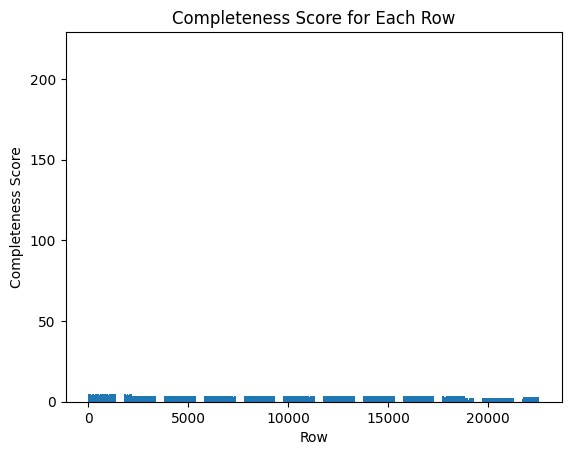

In [59]:


# Plotting a bar graph for Completeness Score
plt.bar(combined.index, combined['Completeness Score'])
plt.xlabel('Row')
plt.ylabel('Completeness Score')
plt.title('Completeness Score for Each Row')
plt.show()


/tmp/ipykernel_284066/3413687886.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  combined['Completeness Band'] = pd.cut(combined['Completeness Score'], bins=score_bands, labels=['0-10%', '10-20%', '20-30%', '30-40%', '40-50%', '50-60%', '60-70%', '70-80%', '80-90%', '90-100%'], include_lowest=True)


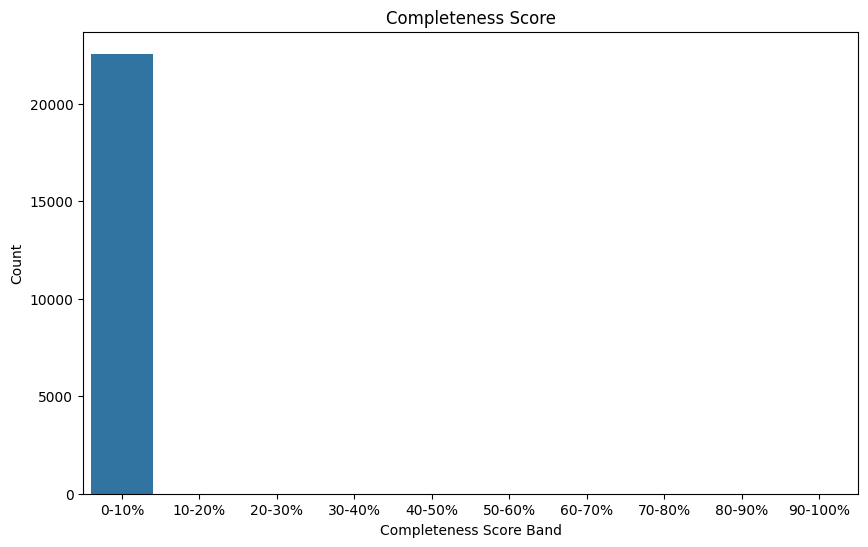

In [60]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'combined' DataFrame is available

# Define the completeness score bands
# score_bands = [0, 25, 50, 75, 100]
score_bands = [0, 10, 20, 30, 40, 50, 60, 70, 80, 90 ,100]

# Create a new column 'Completeness Band' based on the score bands
# combined['Completeness Band'] = pd.cut(combined['Completeness Score'], bins=score_bands, labels=['0-25%', '25-50%', '50-75%', '75-100%'], include_lowest=True)
combined['Completeness Band'] = pd.cut(combined['Completeness Score'], bins=score_bands, labels=['0-10%', '10-20%', '20-30%', '30-40%', '40-50%', '50-60%', '60-70%', '70-80%', '80-90%', '90-100%'], include_lowest=True)

# Plotting a bar graph for Completeness Score bands
plt.figure(figsize=(10, 6))
sns.countplot(x='Completeness Band', data=combined, order=['0-10%', '10-20%', '20-30%', '30-40%', '40-50%', '50-60%', '60-70%', '70-80%', '80-90%', '90-100%'])
plt.xlabel('Completeness Score Band')
plt.ylabel('Count')
plt.title('Completeness Score')
plt.show()


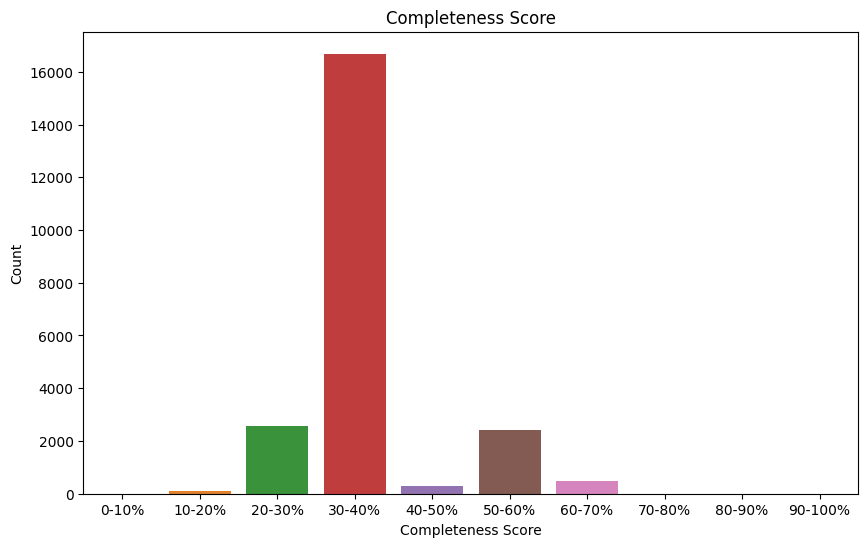

In [61]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'combined' DataFrame is available

# Define the completeness score bands
# score_bands = [0, 25, 50, 75, 100]
score_bands = [0, 10, 20, 30, 40, 50, 60, 70, 80, 90 ,100]

# Create a new column 'Completeness Band' based on the score bands
# combined['Completeness Band'] = pd.cut(combined['Completeness Score'], bins=score_bands, labels=['0-25%', '25-50%', '50-75%', '75-100%'], include_lowest=True)
combined['Completeness Band'] = pd.cut(combined['Completeness Score UTHs'], bins=score_bands, labels=['0-10%', '10-20%', '20-30%', '30-40%', '40-50%', '50-60%', '60-70%', '70-80%', '80-90%', '90-100%'], include_lowest=True)

# Plotting a bar graph for Completeness Score bands
plt.figure(figsize=(10, 6))
sns.countplot(x='Completeness Band', data=combined, order=['0-10%', '10-20%', '20-30%', '30-40%', '40-50%', '50-60%', '60-70%', '70-80%', '80-90%', '90-100%'])
plt.xlabel('Completeness Score')
plt.ylabel('Count')
plt.title('Completeness Score')
plt.show()


findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times Ne

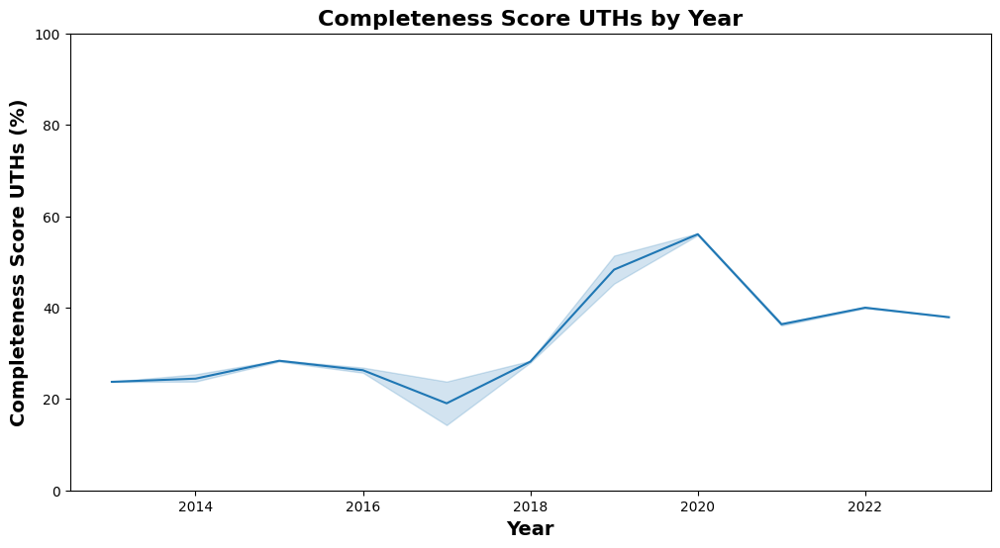

In [38]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.font_manager as font_manager

# Assuming 'combined' DataFrame is available

# Convert '00080020' column to datetime
combined['00080020'] = pd.to_datetime(combined['00080020'], format='%Y%m%d', errors='coerce')

# Extract the year from the DICOM date tag
combined['Year'] = combined['00080020'].dt.year

# Specify the path to the directory containing Times New Roman font files
font_path = '/home/elijah/Downloads/Times-New-Roman/Times New Roman/'

# Register the font files with Matplotlib
font_manager.fontManager.addfont(f'{font_path}times new roman.ttf')

# Set the font to 'Times New Roman'
plt.rcParams['font.family'] = 'Times New Roman'

# Plotting a line plot for Completeness Score UTHs by year
plt.figure(figsize=(12, 6))
lineplot = sns.lineplot(x='Year', y='Completeness Score UTHs', data=combined)
plt.xlabel('Year', fontweight='bold', fontsize=14)  # Set font properties for X-axis label
plt.ylabel('Completeness Score UTHs (%)', fontweight='bold', fontsize=14)  # Set font properties for Y-axis label
plt.title('Completeness Score UTHs by Year', fontweight='bold', fontsize=16)  # Set font properties for title

# Set the y-axis limits to the maximum value in the dataset
plt.ylim(0, combined['Completeness Score UTHs'].max())

plt.show()


findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times Ne

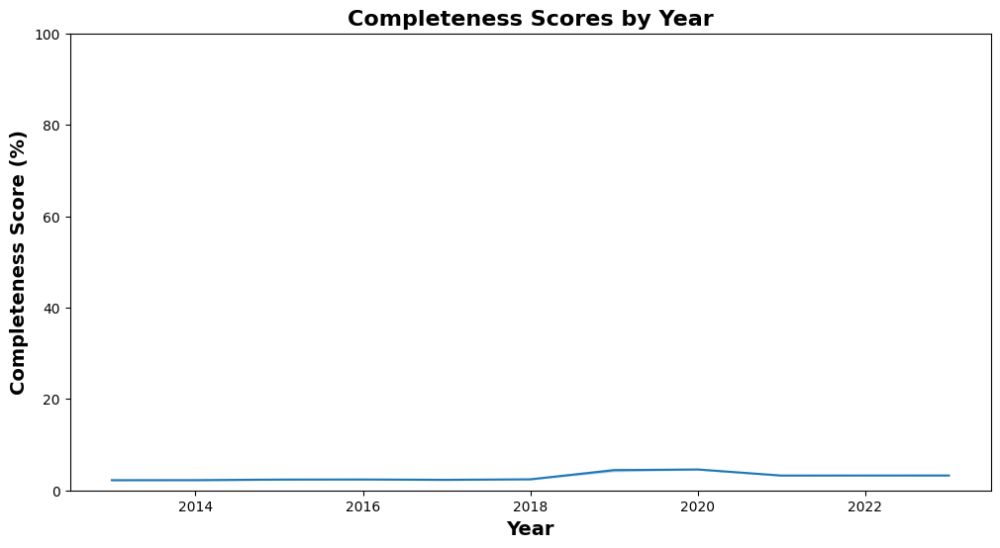

In [23]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.font_manager as font_manager

# Assuming 'combined' DataFrame is available

# Convert '00080020' column to datetime
combined['00080020'] = pd.to_datetime(combined['00080020'], format='%Y%m%d', errors='coerce')

# Extract the year from the DICOM date tag
combined['Year'] = combined['00080020'].dt.year

# Specify the path to the directory containing Times New Roman font files
font_path = '/home/elijah/Downloads/Times-New-Roman/Times New Roman/'

# Register the font files with Matplotlib

font_manager.fontManager.addfont(f'{font_path}times new roman.ttf')

# Set the font to 'Times New Roman'
plt.rcParams['font.family'] = 'Times New Roman'

# Plotting a line plot for Completeness Score by year
plt.figure(figsize=(12, 6))
sns.lineplot(x='Year', y='Completeness Score', data=combined)
plt.xlabel('Year', fontweight='bold', fontsize=14)  # Set font properties for X-axis label
plt.ylabel('Completeness Score (%)', fontweight='bold', fontsize=14)  # Set font properties for Y-axis label
plt.title('Completeness Scores by Year', fontweight='bold', fontsize=16)  # Set font properties for title
plt.ylim(0, 100)  # Set the Y-axis limits to 0-100%
plt.show()


In [26]:
# Assuming var_dicom_registry is your DataFrame
# Replace 'VR' with the actual column name if it's different in your DataFrame

# Extract the "VR" column
vr_column = var_dicom_registry['VR']

# Count unique values and their occurrences
vr_value_counts = vr_column.value_counts()

# Display the unique values and their counts in a table
table_vr = pd.DataFrame({'Unique Values': vr_value_counts.index, 'Counts': vr_value_counts.values})
print(table_vr)


     Unique Values  Counts
0               SQ    1272
1               CS     799
2               DS     483
3               US     379
4               LO     355
5               FD     309
6               FL     292
7               IS     239
8               SH     130
9               ST     101
10              UI      91
11              UL      79
12              DT      64
13              DA      61
14              LT      60
15              TM      55
16              UT      44
17              PN      32
18              OB      30
19        US or SS      25
20              OW      24
21              AT      24
22              SS      18
23              OF      15
24              SL      15
25              UR      13
26              UC      13
27        OB or OW      11
28              AE      11
29              OL       7
30              UV       6
31              OD       6
32                       3
33              OV       3
34      See Note 2       3
35              AS       2
3

Export Table 1

In [34]:
var_dicom_registry

,Tag,Name,Keyword,VR,,,Weights
0,"(0008,0001)",Length to End,Length​To​End,UL,1,RET,0
1,"(0008,0005)",Specific Character Set,Specific​Character​Set,CS,1-n,,0.5
2,"(0008,0006)",Language Code Sequence,Language​Code​Sequence,SQ,1,,0.5
3,"(0008,0008)",Image Type,Image​Type,CS,2-n,,0.5
4,"(0008,0010)",Recognition Code,Recognition​Code,SH,1,RET,0
...,...,...,...,...,...,...,...
5073,"(FFFA,FFFA)",Digital Signatures Sequence,Digital​Signatures​Sequence,SQ,1,,0.5
5074,"(FFFC,FFFC)",Data Set Trailing Padding,Data​Set​Trailing​Padding,OB,1,,0.5
5075,"(FFFE,E000)",Item,Item,See Note 2,1,,0.5
5076,"(FFFE,E00D)",Item Delimitation Item,Item​Delimitation​Item,See Note 2,1,,0.5


In [36]:
# Convert 'Weights' column to numeric
var_dicom_registry['Weights'] = pd.to_numeric(var_dicom_registry['Weights'], errors='coerce')

# Count unique values and their occurrences in VR column
vr_value_counts = var_dicom_registry['VR'].value_counts()

# Calculate average weights for each unique VR
vr_avg_weights = var_dicom_registry.groupby('VR')['Weights'].mean()

# Display the unique values, their counts, and average weights in a table
table_vr = pd.DataFrame({
    'Unique Values': vr_value_counts.index,
    'Counts': vr_value_counts.values,
    'Average Weights': vr_avg_weights[vr_value_counts.index].values  # Use the index from value counts
})
print(table_vr)

     Unique Values  Counts  Average Weights
0               SQ    1272         0.468947
1               CS     799         0.459950
2               DS     483         0.481366
3               US     379         0.406332
4               LO     355         0.436620
5               FD     309         0.493528
6               FL     292         0.493151
7               IS     239         0.460251
8               SH     130         0.442308
9               ST     101         0.415842
10              UI      91         0.445055
11              UL      79         0.436709
12              DT      64         0.484375
13              DA      61         0.368852
14              LT      60         0.425000
15              TM      55         0.345455
16              UT      44         0.500000
17              PN      32         0.421875
18              OB      30         0.466667
19        US or SS      25         0.320000
20              OW      24         0.229167
21              AT      24      

In [ ]:
combined[["00100020", "00100010", "00100030", "00100040", "00180015", "00081030", "00204000", "00080000"]]

In [60]:
# Initialize a dictionary to store the counts
column_counts = {}

# Iterate over columns
for column in combined.columns:
    # Exclude NaN values in the first row
    values_row_0 = combined.loc[0, column]
    if pd.notna(values_row_0):
        # Count non-NaN values in the column (excluding the first row)
        count = combined[column].apply(lambda x: 1 if pd.notna(x) else 0).sum()
        column_counts[column] = count * values_row_0

# Display the counts
for column, count in column_counts.items():
    print(f'{column} has {count}')


00080008 has 0.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.50.5

In [75]:
# Columns to exclude from the calculation
exclude_columns = ['Completeness Score', 'Completeness Score UTHs', 'Weighting Score UTHs', 'Completeness Band', 'Weighting Score']

# Initialize a dictionary to store the total counts
total_counts = {}

# Initialize a counter for the total number of columns
total_columns_count = 0

# Iterate over columns
for column in combined.columns:
    # Skip excluded columns
    if column in exclude_columns:
        continue

    # Exclude NaN values in the first row
    values_row_0 = combined.loc[0, column]
    if pd.notna(values_row_0):
        # Count non-NaN values in the column (excluding the first row)
        count = combined[column].iloc[1:].apply(lambda x: 1 if pd.notna(x) else 0).sum()
        
        # Accumulate the counts for each column
        if column in total_counts:
            total_counts[column] += count
        else:
            total_counts[column] = count

        # Increment the total number of columns counter
        total_columns_count += 1

# Count total values for '00080001'
total_00080001_count = combined['00080000'].apply(lambda x: 1 if pd.notna(x) else 0).sum()
print(f'00080001 has {total_00080001_count}')
# Display the total number of columns
print(f'Total number of columns: {total_columns_count}')

# Display the counts for each individual column
for column, count in total_counts.items():
    print(f'{column} has {count}')

# Display the total count for '00080001'


00080001 has 2264
Total number of columns: 5078
00080008 has 21100
00080016 has 22555
00080018 has 22555
00080020 has 22555
00080021 has 22481
00080022 has 19761
00080023 has 21331
00080030 has 22555
00080031 has 22481
00080032 has 19761
00080033 has 21232
00080050 has 5819
00080060 has 22555
00080070 has 22553
00080080 has 20199
00081010 has 22368
00081030 has 19884
0008103E has 22435
00081040 has 3220
00081060 has 3415
00081070 has 19145
00081090 has 21256
00100010 has 22479
00100020 has 22059
00100040 has 21034
00101010 has 3115
00180015 has 21130
00180022 has 2201
00180050 has 2202
00180060 has 22350
00180090 has 2202
00181000 has 21061
00181020 has 21064
00181030 has 18964
00181100 has 2202
00181120 has 2202
00181130 has 2281
00181140 has 2202
00181150 has 21521
00181151 has 5906
00181152 has 21012
00181160 has 2206
00181170 has 2202
00181190 has 18795
00181210 has 2281
00185100 has 2316
00189311 has 1897
00189345 has 1907
0020000D has 22555
0020000E has 22555
00200010 has 22550
0

In [72]:
total_values_count = combined['00080000'].iloc[1:].count()

# Display the result
print(f'Total number of values in column 00080008 (excluding the first row): {total_values_count}')

Total number of values in column 00080008 (excluding the first row): 2264


In [38]:
combined[["70791045", "50000005", "0017108C", "7079102E", "70791027", "00190000"]]

,70791045,50000005,0017108C,7079102E,70791027,00190000
0,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...
22552,NaN,NaN,NaN,NaN,NaN,NaN
22553,NaN,NaN,NaN,NaN,NaN,NaN
22554,NaN,NaN,NaN,NaN,NaN,NaN
22555,NaN,NaN,NaN,NaN,NaN,NaN


In [100]:
# Arrage accouring to VR group


import pandas as pd
import re

# Columns to exclude from the calculation
exclude_columns = ['Completeness Score', 'Completeness Score UTHs', 'Weighting Score UTHs', 'Completeness Band', 'Weighting Score']

# Initialize a dictionary to store the total counts
total_counts = {}

# Initialize a counter for the total number of columns
total_columns_count = 0

# Initialize a dictionary to store the tag mappings
tag_mappings = {}

# Initialize counters for mappings found and not found
mappings_found_count = 0
mappings_not_found_count = 0

# Iterate over columns
for column in combined.columns:
    # Skip excluded columns
    if column in exclude_columns:
        continue

    # Exclude NaN values in the first row
    values_row_0 = combined.loc[0, column]
    if pd.notna(values_row_0):
        # Count non-NaN values in the column (excluding the first row)
        count = combined[column].iloc[1:].apply(lambda x: 1 if pd.notna(x) else 0).sum()

        # Accumulate the counts for each column
        if column in total_counts:
            total_counts[column] += count
        else:
            total_counts[column] = count

        # Increment the total number of columns counter
        total_columns_count += 1

        # Check if the tag is already in the correct format
        # Check if the tag is already in the correct format
# Check if the tag is already in the correct format
        if '(' in values_row_0:
            transformed_tag = values_row_0
        else:
            # Extract all characters from 'column'
            numerical_part = re.sub('[^0-9A-Za-z]', '', column)

            # Ensure numerical part has at most 8 characters
            numerical_part = numerical_part[:8]

            # Transform the tag to match the format in var_dicom_registry
            transformed_tag = f'({numerical_part[:4]},{numerical_part[4:]})'



        # Print intermediate results
        print(f'{column} transformed to {transformed_tag}')

        # Map the column to the corresponding tag in var_dicom_registry
        if transformed_tag in var_dicom_registry['Tag'].values:
            tag_mapping = var_dicom_registry.loc[var_dicom_registry['Tag'] == transformed_tag, 'Tag'].values[0]
            tag_mappings[column] = tag_mapping
            print(f'Mapping found: {column} maps to {tag_mapping}')
            mappings_found_count += 1
        else:
            print(f'No mapping found for {column}')
            mappings_not_found_count += 1

# Display the total number of columns
print(f'Total number of columns: {total_columns_count}')

# Display the counts for each individual column
for column, count in total_counts.items():
    print(f'{column} has {count}')

# Display the tag mappings
print('\nTag Mappings:')
for column, tag in tag_mappings.items():
    print(f'{column} maps to {tag}')

# Display counts for mappings found and not found
print(f'\nMappings Found: {mappings_found_count}')
print(f'Mappings Not Found: {mappings_not_found_count}')


00080008 transformed to (0008,0008)
Mapping found: 00080008 maps to (0008,0008)
00080016 transformed to (0008,0016)
Mapping found: 00080016 maps to (0008,0016)
00080018 transformed to (0008,0018)
Mapping found: 00080018 maps to (0008,0018)
00080020 transformed to (0008,0020)
Mapping found: 00080020 maps to (0008,0020)
00080021 transformed to (0008,0021)
Mapping found: 00080021 maps to (0008,0021)
00080022 transformed to (0008,0022)
Mapping found: 00080022 maps to (0008,0022)
00080023 transformed to (0008,0023)
Mapping found: 00080023 maps to (0008,0023)
00080030 transformed to (0008,0030)
Mapping found: 00080030 maps to (0008,0030)
00080031 transformed to (0008,0031)
Mapping found: 00080031 maps to (0008,0031)
00080032 transformed to (0008,0032)
Mapping found: 00080032 maps to (0008,0032)
00080033 transformed to (0008,0033)
Mapping found: 00080033 maps to (0008,0033)
00080050 transformed to (0008,0050)
Mapping found: 00080050 maps to (0008,0050)
00080060 transformed to (0008,0060)
Mapp

In [108]:
# adding counts alongside tags in VR


import pandas as pd
import re

# Columns to exclude from the calculation
exclude_columns = ['Completeness Score', 'Completeness Score UTHs', 'Weighting Score UTHs', 'Completeness Band', 'Weighting Score']

# Initialize a dictionary to store the total counts
total_counts = {}

# Initialize a counter for the total number of columns
total_columns_count = 0

# Initialize a dictionary to store the tag mappings and counts
tag_mappings = {}
tag_counts = {}

# Initialize counters for mappings found and not found
mappings_found_count = 0
mappings_not_found_count = 0

# Iterate over columns
for column in combined.columns:
    # Skip excluded columns
    if column in exclude_columns:
        continue

    # Exclude NaN values in the first row
    values_row_0 = combined.loc[0, column]
    if pd.notna(values_row_0):
        # Count non-NaN values in the column (excluding the first row)
        count = combined[column].iloc[1:].apply(lambda x: 1 if pd.notna(x) else 0).sum()

        # Accumulate the counts for each column
        if column in total_counts:
            total_counts[column] += count
        else:
            total_counts[column] = count

        # Increment the total number of columns counter
        total_columns_count += 1

        # Check if the tag is already in the correct format
        if '(' in values_row_0:
            transformed_tag = values_row_0
        else:
            # Extract all characters from 'column'
            numerical_part = re.sub('[^0-9A-Za-z]', '', column)

            # Ensure numerical part has at most 8 characters
            numerical_part = numerical_part[:8]

            # Transform the tag to match the format in var_dicom_registry
            transformed_tag = f'({numerical_part[:4]},{numerical_part[4:]})'

        # Print intermediate results
        print(f'{column} transformed to {transformed_tag}')

        # Map the column to the corresponding tag in var_dicom_registry
        if transformed_tag in var_dicom_registry['Tag'].values:
            tag_mapping = var_dicom_registry.loc[var_dicom_registry['Tag'] == transformed_tag, 'Tag'].values[0]
            tag_mappings[column] = tag_mapping
            tag_counts[tag_mapping] = count
            print(f'Mapping found: {column} maps to {tag_mapping} with count {count}')
            mappings_found_count += 1
        else:
            print(f'No mapping found for {column}')
            mappings_not_found_count += 1

# Display the total number of columns
print(f'Total number of columns: {total_columns_count}')

# Display the counts for each individual column
for column, count in total_counts.items():
    print(f'{column} has {count}')

# Display the tag mappings with counts
print('\nTag Mappings:')
for column, tag in tag_mappings.items():
    print(f'{column} maps to {tag} with count {tag_counts[tag]}')

# Group tags by VR
unique_vr_groups = var_dicom_registry.groupby('VR')['Tag'].unique()

# Display unique VR groups and associated tags with counts
for vr, tags in unique_vr_groups.items():
    print(f'\nUnique VR group {vr}:')
    for tag in tags:
        print(f'{tag} with count {tag_counts.get(tag, 0)}')


00080008 transformed to (0008,0008)
Mapping found: 00080008 maps to (0008,0008) with count 21100
00080016 transformed to (0008,0016)
Mapping found: 00080016 maps to (0008,0016) with count 22555
00080018 transformed to (0008,0018)
Mapping found: 00080018 maps to (0008,0018) with count 22555
00080020 transformed to (0008,0020)
Mapping found: 00080020 maps to (0008,0020) with count 22555
00080021 transformed to (0008,0021)
Mapping found: 00080021 maps to (0008,0021) with count 22481
00080022 transformed to (0008,0022)
Mapping found: 00080022 maps to (0008,0022) with count 19761
00080023 transformed to (0008,0023)
Mapping found: 00080023 maps to (0008,0023) with count 21331
00080030 transformed to (0008,0030)
Mapping found: 00080030 maps to (0008,0030) with count 22555
00080031 transformed to (0008,0031)
Mapping found: 00080031 maps to (0008,0031) with count 22481
00080032 transformed to (0008,0032)
Mapping found: 00080032 maps to (0008,0032) with count 19761
00080033 transformed to (0008,

KeyboardInterrupt: 

In [109]:
# Displaying Averge

import pandas as pd
import re

# Columns to exclude from the calculation
exclude_columns = ['Completeness Score', 'Completeness Score UTHs', 'Weighting Score UTHs', 'Completeness Band', 'Weighting Score']

# Initialize a dictionary to store the total counts
total_counts = {}

# Initialize a counter for the total number of columns
total_columns_count = 0

# Initialize a dictionary to store the tag mappings and counts
tag_mappings = {}
tag_counts = {}

# Initialize a dictionary to store the total counts for each VR group
vr_group_counts = {}

# Initialize counters for mappings found and not found
mappings_found_count = 0
mappings_not_found_count = 0

# Iterate over columns
for column in combined.columns:
    # Skip excluded columns
    if column in exclude_columns:
        continue

    # Exclude NaN values in the first row
    values_row_0 = combined.loc[0, column]
    if pd.notna(values_row_0):
        # Count non-NaN values in the column (excluding the first row)
        count = combined[column].iloc[1:].apply(lambda x: 1 if pd.notna(x) else 0).sum()

        # Accumulate the counts for each column
        if column in total_counts:
            total_counts[column] += count
        else:
            total_counts[column] = count

        # Increment the total number of columns counter
        total_columns_count += 1

        # Check if the tag is already in the correct format
        if '(' in values_row_0:
            transformed_tag = values_row_0
        else:
            # Extract all characters from 'column'
            numerical_part = re.sub('[^0-9A-Za-z]', '', column)

            # Ensure numerical part has at most 8 characters
            numerical_part = numerical_part[:8]

            # Transform the tag to match the format in var_dicom_registry
            transformed_tag = f'({numerical_part[:4]},{numerical_part[4:]})'

        # Print intermediate results
        print(f'{column} transformed to {transformed_tag}')

        # Map the column to the corresponding tag in var_dicom_registry
        if transformed_tag in var_dicom_registry['Tag'].values:
            tag_mapping = var_dicom_registry.loc[var_dicom_registry['Tag'] == transformed_tag, 'Tag'].values[0]
            tag_mappings[column] = tag_mapping
            tag_counts[tag_mapping] = count
            print(f'Mapping found: {column} maps to {tag_mapping} with count {count}')
            mappings_found_count += 1

            # Accumulate counts for VR group
            vr_group = var_dicom_registry.loc[var_dicom_registry['Tag'] == tag_mapping, 'VR'].values[0]
            vr_group_counts[vr_group] = vr_group_counts.get(vr_group, 0) + count
        else:
            print(f'No mapping found for {column}')
            mappings_not_found_count += 1

# Display the total number of columns
print(f'Total number of columns: {total_columns_count}')

# Display the counts for each individual column
for column, count in total_counts.items():
    print(f'{column} has {count}')

# Display the tag mappings with counts
print('\nTag Mappings:')
for column, tag in tag_mappings.items():
    print(f'{column} maps to {tag} with count {tag_counts[tag]}')

# Display the average count for each VR group
print('\nAverage Counts by VR Group:')
for vr_group, total_count in vr_group_counts.items():
    print(f'Average count for VR group {vr_group}: {total_count / len(unique_vr_groups[vr_group])}')

# Group tags by VR
unique_vr_groups = var_dicom_registry.groupby('VR')['Tag'].unique()

# Display unique VR groups and associated tags with counts
for vr, tags in unique_vr_groups.items():
    print(f'\nUnique VR group {vr}:')
    for tag in tags:
        print(f'{tag} with count {tag_counts.get(tag, 0)}')


00080008 transformed to (0008,0008)
Mapping found: 00080008 maps to (0008,0008) with count 21100
00080016 transformed to (0008,0016)
Mapping found: 00080016 maps to (0008,0016) with count 22555
00080018 transformed to (0008,0018)
Mapping found: 00080018 maps to (0008,0018) with count 22555
00080020 transformed to (0008,0020)
Mapping found: 00080020 maps to (0008,0020) with count 22555
00080021 transformed to (0008,0021)
Mapping found: 00080021 maps to (0008,0021) with count 22481
00080022 transformed to (0008,0022)
Mapping found: 00080022 maps to (0008,0022) with count 19761
00080023 transformed to (0008,0023)
Mapping found: 00080023 maps to (0008,0023) with count 21331
00080030 transformed to (0008,0030)
Mapping found: 00080030 maps to (0008,0030) with count 22555
00080031 transformed to (0008,0031)
Mapping found: 00080031 maps to (0008,0031) with count 22481
00080032 transformed to (0008,0032)
Mapping found: 00080032 maps to (0008,0032) with count 19761
00080033 transformed to (0008,

In [110]:
import pandas as pd
import re

# Columns to exclude from the calculation
exclude_columns = ['Completeness Score', 'Completeness Score UTHs', 'Weighting Score UTHs', 'Completeness Band', 'Weighting Score']

# Initialize a dictionary to store the total counts
total_counts = {}

# Initialize a counter for the total number of columns
total_columns_count = 0

# Initialize a dictionary to store the tag mappings and counts
tag_mappings = {}
tag_counts = {}

# Initialize a dictionary to store the total counts for each VR group
vr_group_counts = {}

# Initialize counters for mappings found and not found
mappings_found_count = 0
mappings_not_found_count = 0

# Iterate over columns
for column in combined.columns:
    # Skip excluded columns
    if column in exclude_columns:
        continue

    # Exclude NaN values in the first row
    values_row_0 = combined.loc[0, column]
    if pd.notna(values_row_0):
        # Count non-NaN values in the column (excluding the first row)
        count = combined[column].iloc[1:].apply(lambda x: 1 if pd.notna(x) else 0).sum()

        # Accumulate the counts for each column
        if column in total_counts:
            total_counts[column] += count
        else:
            total_counts[column] = count

        # Increment the total number of columns counter
        total_columns_count += 1

        # Check if the tag is already in the correct format
        if '(' in values_row_0:
            transformed_tag = values_row_0
        else:
            # Extract all characters from 'column'
            numerical_part = re.sub('[^0-9A-Za-z]', '', column)

            # Ensure numerical part has at most 8 characters
            numerical_part = numerical_part[:8]

            # Transform the tag to match the format in var_dicom_registry
            transformed_tag = f'({numerical_part[:4]},{numerical_part[4:]})'

        # Print intermediate results
        print(f'{column} transformed to {transformed_tag}')

        # Map the column to the corresponding tag in var_dicom_registry
        if transformed_tag in var_dicom_registry['Tag'].values:
            tag_mapping = var_dicom_registry.loc[var_dicom_registry['Tag'] == transformed_tag, 'Tag'].values[0]
            tag_mappings[column] = tag_mapping
            tag_counts[tag_mapping] = count
            print(f'Mapping found: {column} maps to {tag_mapping} with count {count}')
            mappings_found_count += 1

            # Accumulate counts for VR group
            vr_group = var_dicom_registry.loc[var_dicom_registry['Tag'] == tag_mapping, 'VR'].values[0]
            vr_group_counts[vr_group] = vr_group_counts.get(vr_group, 0) + count
        else:
            print(f'No mapping found for {column}')
            mappings_not_found_count += 1

# Display the total number of columns
print(f'Total number of columns: {total_columns_count}')

# Display the counts for each individual column
for column, count in total_counts.items():
    print(f'{column} has {count}')

# Display the tag mappings with counts
print('\nTag Mappings:')
for column, tag in tag_mappings.items():
    print(f'{column} maps to {tag} with count {tag_counts[tag]}')

# Display the average count for each VR group
print('\nAverage Counts by VR Group:')
for vr_group, total_count in vr_group_counts.items():
    avg_percentage = (total_count / len(unique_vr_groups[vr_group])) * 100
    print(f'Average count for VR group {vr_group}: {avg_percentage:.2f}%')

# Group tags by VR
unique_vr_groups = var_dicom_registry.groupby('VR')['Tag'].unique()

# Display unique VR groups and associated tags with counts
for vr, tags in unique_vr_groups.items():
    print(f'\nUnique VR group {vr}:')
    for tag in tags:
        print(f'{tag} with count {tag_counts.get(tag, 0)}')


00080008 transformed to (0008,0008)
Mapping found: 00080008 maps to (0008,0008) with count 21100
00080016 transformed to (0008,0016)
Mapping found: 00080016 maps to (0008,0016) with count 22555
00080018 transformed to (0008,0018)
Mapping found: 00080018 maps to (0008,0018) with count 22555
00080020 transformed to (0008,0020)
Mapping found: 00080020 maps to (0008,0020) with count 22555
00080021 transformed to (0008,0021)
Mapping found: 00080021 maps to (0008,0021) with count 22481
00080022 transformed to (0008,0022)
Mapping found: 00080022 maps to (0008,0022) with count 19761
00080023 transformed to (0008,0023)
Mapping found: 00080023 maps to (0008,0023) with count 21331
00080030 transformed to (0008,0030)
Mapping found: 00080030 maps to (0008,0030) with count 22555
00080031 transformed to (0008,0031)
Mapping found: 00080031 maps to (0008,0031) with count 22481
00080032 transformed to (0008,0032)
Mapping found: 00080032 maps to (0008,0032) with count 19761
00080033 transformed to (0008,

In [117]:
import pandas as pd
import re

# Columns to exclude from the calculation
exclude_columns = ['Completeness Score', 'Completeness Score UTHs', 'Weighting Score UTHs', 'Completeness Band', 'Weighting Score']

# Initialize a dictionary to store the total counts
total_counts = {}

# Initialize a counter for the total number of columns
total_columns_count = 0

# Initialize a dictionary to store the tag mappings and counts
tag_mappings = {}
tag_counts = {}

# Initialize a dictionary to store the total counts for each VR group
vr_group_counts = {}

# Iterate over columns
for column in combined.columns:
    # Skip excluded columns
    if column in exclude_columns:
        continue

    # Exclude NaN values in the first row
    values_row_0 = combined.loc[0, column]
    if pd.notna(values_row_0):
        # Count non-NaN values in the column (excluding the first row)
        count = combined[column].iloc[1:].apply(lambda x: 1 if pd.notna(x) else 0).sum()

        # Accumulate the counts for each column
        if column in total_counts:
            total_counts[column] += count
        else:
            total_counts[column] = count

        # Increment the total number of columns counter
        total_columns_count += 1

        # Check if the tag is already in the correct format
        if '(' in values_row_0:
            transformed_tag = values_row_0
        else:
            # Extract all characters from 'column'
            numerical_part = re.sub('[^0-9A-Za-z]', '', column)

            # Ensure numerical part has at most 8 characters
            numerical_part = numerical_part[:8]

            # Transform the tag to match the format in var_dicom_registry
            transformed_tag = f'({numerical_part[:4]},{numerical_part[4:]})'

        # Map the column to the corresponding tag in var_dicom_registry
        if transformed_tag in var_dicom_registry['Tag'].values:
            tag_mapping = var_dicom_registry.loc[var_dicom_registry['Tag'] == transformed_tag, 'Tag'].values[0]
            tag_mappings[column] = tag_mapping
            tag_counts[tag_mapping] = count
            # Accumulate counts for VR group
            vr_group = var_dicom_registry.loc[var_dicom_registry['Tag'] == tag_mapping, 'VR'].values[0]
            vr_group_counts[vr_group] = vr_group_counts.get(vr_group, 0) + count
        else:
            mappings_not_found_count += 1

# Create a DataFrame for average counts by VR group
average_counts_df = pd.DataFrame(list(vr_group_counts.items()), columns=['Unique VR', 'Count'])

# Calculate and add the average percentages
average_counts_df['Average'] = (average_counts_df['Count'] / total_columns_count).map(lambda x: f'{x:.2%}')

# Save the DataFrame to a CSV file
average_counts_df.to_csv('average_counts_by_vr_group.csv', index=False, columns=['Unique VR', 'Count', 'Average'])

# Display the total number of columns
print(f'Total number of columns: {total_columns_count}')

# Display the counts for each individual column
for column, count in total_counts.items():
    print(f'{column} has {count}')

# Display the tag mappings with counts
print('\nTag Mappings:')
for column, tag in tag_mappings.items():
    print(f'{column} maps to {tag} with count {tag_counts[tag]}')

# Display the DataFrame for average counts by VR group
print('\nAverage Counts DataFrame:')
print(average_counts_df)


Total number of columns: 5078
00080008 has 21100
00080016 has 22555
00080018 has 22555
00080020 has 22555
00080021 has 22481
00080022 has 19761
00080023 has 21331
00080030 has 22555
00080031 has 22481
00080032 has 19761
00080033 has 21232
00080050 has 5819
00080060 has 22555
00080070 has 22553
00080080 has 20199
00081010 has 22368
00081030 has 19884
0008103E has 22435
00081040 has 3220
00081060 has 3415
00081070 has 19145
00081090 has 21256
00100010 has 22479
00100020 has 22059
00100040 has 21034
00101010 has 3115
00180015 has 21130
00180022 has 2201
00180050 has 2202
00180060 has 22350
00180090 has 2202
00181000 has 21061
00181020 has 21064
00181030 has 18964
00181100 has 2202
00181120 has 2202
00181130 has 2281
00181140 has 2202
00181150 has 21521
00181151 has 5906
00181152 has 21012
00181160 has 2206
00181170 has 2202
00181190 has 18795
00181210 has 2281
00185100 has 2316
00189311 has 1897
00189345 has 1907
0020000D has 22555
0020000E has 22555
00200010 has 22550
00200011 has 22555


In [121]:
# Working Generating CSV with Group, Count and ADICOM Compliance

import pandas as pd
import re

# Columns to exclude from the calculation
exclude_columns = ['Completeness Score', 'Completeness Score UTHs', 'Weighting Score UTHs', 'Completeness Band', 'Weighting Score']

# Initialize a dictionary to store the total counts
total_counts = {}

# Initialize a counter for the total number of columns
total_columns_count = 0

# Initialize a dictionary to store the tag mappings and counts
tag_mappings = {}
tag_counts = {}

# Initialize a dictionary to store the total counts for each VR group
vr_group_counts = {}

# Iterate over columns
for column in combined.columns:
    # Skip excluded columns
    if column in exclude_columns:
        continue

    # Exclude NaN values in the first row
    values_row_0 = combined.loc[0, column]
    if pd.notna(values_row_0):
        # Count non-NaN values in the column (excluding the first row)
        count = combined[column].iloc[1:].apply(lambda x: 1 if pd.notna(x) else 0).sum()

        # Accumulate the counts for each column
        if column in total_counts:
            total_counts[column] += count
        else:
            total_counts[column] = count

        # Increment the total number of columns counter
        total_columns_count += 1

        # Check if the tag is already in the correct format
        if '(' in values_row_0:
            transformed_tag = values_row_0
        else:
            # Extract all characters from 'column'
            numerical_part = re.sub('[^0-9A-Za-z]', '', column)

            # Ensure numerical part has at most 8 characters
            numerical_part = numerical_part[:8]

            # Transform the tag to match the format in var_dicom_registry
            transformed_tag = f'({numerical_part[:4]},{numerical_part[4:]})'

        # Map the column to the corresponding tag in var_dicom_registry
        if transformed_tag in var_dicom_registry['Tag'].values:
            tag_mapping = var_dicom_registry.loc[var_dicom_registry['Tag'] == transformed_tag, 'Tag'].values[0]
            tag_mappings[column] = tag_mapping
            tag_counts[tag_mapping] = count
            # Accumulate counts for VR group
            vr_group = var_dicom_registry.loc[var_dicom_registry['Tag'] == tag_mapping, 'VR'].values[0]
            vr_group_counts[vr_group] = vr_group_counts.get(vr_group, 0) + 1  # Count based on how many times VR appears
        else:
            mappings_not_found_count += 1

# Create a DataFrame with counts by VR group
counts_df = pd.DataFrame(list(vr_group_counts.items()), columns=['Unique VR', 'Count'])

# Merge counts_df with the existing average_counts_df to keep other columns
result_df = pd.merge(average_counts_df, counts_df, on='Unique VR', how='left')

# Save the DataFrame to a CSV file
result_df.to_csv('result_counts_by_vr_group.csv', index=False)

# Display the total number of columns
print(f'Total number of columns: {total_columns_count}')

# Display the counts for each individual column
for column, count in total_counts.items():
    print(f'{column} has {count}')

# Display the tag mappings with counts
print('\nTag Mappings:')
for column, tag in tag_mappings.items():
    print(f'{column} maps to {tag} with count {tag_counts[tag]}')

# Display the DataFrame for counts by VR group
print('\nResult DataFrame:')
print(result_df)


Total number of columns: 5078
00080008 has 21100
00080016 has 22555
00080018 has 22555
00080020 has 22555
00080021 has 22481
00080022 has 19761
00080023 has 21331
00080030 has 22555
00080031 has 22481
00080032 has 19761
00080033 has 21232
00080050 has 5819
00080060 has 22555
00080070 has 22553
00080080 has 20199
00081010 has 22368
00081030 has 19884
0008103E has 22435
00081040 has 3220
00081060 has 3415
00081070 has 19145
00081090 has 21256
00100010 has 22479
00100020 has 22059
00100040 has 21034
00101010 has 3115
00180015 has 21130
00180022 has 2201
00180050 has 2202
00180060 has 22350
00180090 has 2202
00181000 has 21061
00181020 has 21064
00181030 has 18964
00181100 has 2202
00181120 has 2202
00181130 has 2281
00181140 has 2202
00181150 has 21521
00181151 has 5906
00181152 has 21012
00181160 has 2206
00181170 has 2202
00181190 has 18795
00181210 has 2281
00185100 has 2316
00189311 has 1897
00189345 has 1907
0020000D has 22555
0020000E has 22555
00200010 has 22550
00200011 has 22555


In [120]:
# Assuming combined is your DataFrame
combined_except_row_0 = combined.iloc[1:, :]

# Export the DataFrame to a CSV file
combined_except_row_0.to_csv('combined_except_row_0.csv', index=False)


In [ ]:
tag_to_check = '(0040,A076)'

if tag_to_check in var_dicom_registry['Tag'].values:
    print(f'{tag_to_check} is present in var_dicom_registry.')
else:
    print(f'{tag_to_check} is not present in var_dicom_registry.')


(0040,A076) is present in var_dicom_registry.


In [28]:
import pandas as pd
import re

# Columns to exclude from the calculation
exclude_columns = ['Completeness Score', 'Completeness Score UTHs', 'Weighting Score UTHs', 'Completeness Band', 'Weighting Score']

# Initialize a dictionary to store the total counts
total_counts = {}

# Initialize a counter for the total number of columns
total_columns_count = 0

# Initialize a dictionary to store the tag mappings and counts
tag_mappings = {}
tag_counts = {}

# Initialize a dictionary to store the tags under each group
group_tags = {}

# Initialize a dictionary to store the counts and total counts for each group
group_counts = {}

# Iterate over columns
for column in combined.columns:
    # Skip excluded columns
    if column in exclude_columns:
        continue

    # Exclude NaN values in the first row
    values_row_0 = combined.loc[0, column]
    if pd.notna(values_row_0):
        # Count non-NaN values in the column (excluding the first row)
        count = combined[column].iloc[1:].apply(lambda x: 1 if pd.notna(x) else 0).sum()

        # Accumulate the counts for each column
        if column in total_counts:
            total_counts[column] += count
        else:
            total_counts[column] = count

        # Increment the total number of columns counter
        total_columns_count += 1

        # Check if the tag is already in the correct format
        if '(' in values_row_0:
            transformed_tag = values_row_0
        else:
            # Extract the first 4 digits from 'column'
            numerical_part = re.sub('[^0-9A-Za-z]', '', column)[:4]

            # Transform the tag to match the format
            transformed_tag = f'({numerical_part},0000)'

        # Map the column to the corresponding tag
        tag_mappings[column] = transformed_tag
        tag_counts[transformed_tag] = count

        # Accumulate tags under each group
        group = transformed_tag.split(',')[0][1:]
        group_tags[group] = group_tags.get(group, []) + [column]

        # Accumulate counts for each group
        group_counts[group] = group_counts.get(group, {'count': 0, 'total': 0})
        group_counts[group]['count'] += 1
        group_counts[group]['total'] += count

# Display the total number of columns
print(f'Total number of columns: {total_columns_count}')

# Display the counts for each individual column
for column, count in total_counts.items():
    print(f'{column} has {count}')

# Display the tag mappings with counts
print('\nTag Mappings:')
for column, tag in tag_mappings.items():
    print(f'{column} maps to {tag} with count {tag_counts[tag]}')

# Display tags under each group with counts
print('\nTags Under Each Group:')
for group, tags in group_tags.items():
    print(f'\nGroup {group}:')
    for tag in tags:
        count = total_counts.get(tag, 0)
        print(f'{tag} has {count}')

# Display the averages per group in percentage form
print('\nAverages Per Group:')
for group, counts in group_counts.items():
    average_percentage = (counts['total'] / counts['count']) / total_columns_count * 100
    print(f'Average percentage for Group {group}: {average_percentage:.2f}%')


Total number of columns: 5078
00080008 has 21100
00080016 has 22555
00080018 has 22555
00080020 has 22555
00080021 has 22481
00080022 has 19761
00080023 has 21331
00080030 has 22555
00080031 has 22481
00080032 has 19761
00080033 has 21232
00080050 has 5819
00080060 has 22555
00080070 has 22553
00080080 has 20199
00081010 has 22368
00081030 has 19884
0008103E has 22435
00081040 has 3220
00081060 has 3415
00081070 has 19145
00081090 has 21256
00100010 has 22479
00100020 has 22059
00100040 has 21034
00101010 has 3115
00180015 has 21130
00180022 has 2201
00180050 has 2202
00180060 has 22350
00180090 has 2202
00181000 has 21061
00181020 has 21064
00181030 has 18964
00181100 has 2202
00181120 has 2202
00181130 has 2281
00181140 has 2202
00181150 has 21521
00181151 has 5906
00181152 has 21012
00181160 has 2206
00181170 has 2202
00181190 has 18795
00181210 has 2281
00185100 has 2316
00189311 has 1897
00189345 has 1907
0020000D has 22555
0020000E has 22555
00200010 has 22550
00200011 has 22555


In [27]:
# Assuming '00800010' is the DICOM tag you are interested in
tag_column = '00080013'

# Exclude the first row and get the values in the specified column
values_column_00800010 = combined[tag_column].iloc[1:]

# Count the non-NaN values
count_values_column_00800010 = values_column_00800010.count()

print(f'Number of values in {tag_column}: {count_values_column_00800010}')


Number of values in 00080013: 1


In [32]:
# WORKING printing Per Group

import pandas as pd
import re

# Columns to exclude from the calculation
exclude_columns = ['Completeness Score', 'Completeness Score UTHs', 'Weighting Score UTHs', 'Completeness Band', 'Weighting Score']

# Initialize a dictionary to store the total counts
total_counts = {}

# Initialize a counter for the total number of columns
total_columns_count = 0

# Initialize a dictionary to store the tag mappings and counts
tag_mappings = {}
tag_counts = {}

# Initialize a dictionary to store the tags under each group
group_tags = {}

# Initialize a dictionary to store the counts and total counts for each group
group_counts = {}

# Iterate over columns
for column in combined.columns:
    # Skip excluded columns
    if column in exclude_columns:
        continue

    # Exclude NaN values in the first row
    values_row_0 = combined.loc[0, column]
    if pd.notna(values_row_0):
        # Count non-NaN values in the column (excluding the first row)
        count = combined[column].iloc[1:].apply(lambda x: 1 if pd.notna(x) else 0).sum()

        # Accumulate the counts for each column
        if column in total_counts:
            total_counts[column] += count
        else:
            total_counts[column] = count

        # Increment the total number of columns counter
        total_columns_count += 1

        # Check if the tag is already in the correct format
        if '(' in values_row_0:
            transformed_tag = values_row_0
        else:
            # Extract the first 4 digits from 'column'
            numerical_part = re.sub('[^0-9A-Za-z]', '', column)[:4]

            # Transform the tag to match the format
            transformed_tag = f'({numerical_part},0000)'

        # Map the column to the corresponding tag
        tag_mappings[column] = transformed_tag
        tag_counts[transformed_tag] = count

        # Accumulate tags under each group
        group = transformed_tag.split(',')[0][1:]
        group_tags[group] = group_tags.get(group, []) + [column]

        # Accumulate counts for each group
        group_counts[group] = group_counts.get(group, {'count': 0, 'total': 0})
        group_counts[group]['count'] += 1
        group_counts[group]['total'] += count

# Create a list of dictionaries for averages per group
averages_list = []

# Display the averages per group in percentage form
for group, counts in group_counts.items():
    average_percentage = (counts['total'] / counts['count']) / total_columns_count * 100
    averages_list.append({'Group': group, 'Average': round(average_percentage, 2)})

# Create a DataFrame from the list
averages_df = pd.DataFrame(averages_list)

# Save the DataFrame to a CSV file as plain text
averages_df.to_csv('averages_per_group.csv', index=False, float_format='%.2f', header=True)

# Display the total number of columns
print(f'Total number of columns: {total_columns_count}')

# Display the counts for each individual column
for column, count in total_counts.items():
    print(f'{column} has {count}')

# Display the tag mappings with counts
print('\nTag Mappings:')
for column, tag in tag_mappings.items():
    print(f'{column} maps to {tag} with count {tag_counts[tag]}')

# Display tags under each group with counts
print('\nTags Under Each Group:')
for group, tags in group_tags.items():
    print(f'\nGroup {group}:')
    for tag in tags:
        count = total_counts.get(tag, 0)
        print(f'{tag} has {count}')

# Display the DataFrame for averages per group
print('\nAverages Per Group:')
print(averages_df)


Total number of columns: 5078
00080008 has 21100
00080016 has 22555
00080018 has 22555
00080020 has 22555
00080021 has 22481
00080022 has 19761
00080023 has 21331
00080030 has 22555
00080031 has 22481
00080032 has 19761
00080033 has 21232
00080050 has 5819
00080060 has 22555
00080070 has 22553
00080080 has 20199
00081010 has 22368
00081030 has 19884
0008103E has 22435
00081040 has 3220
00081060 has 3415
00081070 has 19145
00081090 has 21256
00100010 has 22479
00100020 has 22059
00100040 has 21034
00101010 has 3115
00180015 has 21130
00180022 has 2201
00180050 has 2202
00180060 has 22350
00180090 has 2202
00181000 has 21061
00181020 has 21064
00181030 has 18964
00181100 has 2202
00181120 has 2202
00181130 has 2281
00181140 has 2202
00181150 has 21521
00181151 has 5906
00181152 has 21012
00181160 has 2206
00181170 has 2202
00181190 has 18795
00181210 has 2281
00185100 has 2316
00189311 has 1897
00189345 has 1907
0020000D has 22555
0020000E has 22555
00200010 has 22550
00200011 has 22555


In [ ]:
# # Assuming '0020000E' is the column name
# column_to_check = '00180015'

# # Check for duplicate records
# duplicate_records = combined[combined.duplicated(subset=[column_to_check], keep=False)]

# # Print duplicate records
# print("Duplicate Records:")
# print(duplicate_records)


# Assuming '0020000D' is the column name for study IDs
# study_ids = combined['0020000D'].unique()[:10]

# # Print the first 5 unique study IDs
# print("First 5 Unique Study IDs:")
# print(study_ids)


# Assuming 'SOP Instance UID' is the column name for SOP instances
# sop_instances_to_print = [
#     '1.2.392.200036.9116.2.5.1.37.2427071460.1577938400.68760',
#     '1.2.392.200036.9116.2.5.1.37.2427071460.1577936307.77686'
# ]

# # Filter the DataFrame based on SOP instances
# selected_records = combined[combined['0020000D'].isin(sop_instances_to_print)]

# # Print the selected records
# print("Selected Records:")
# print(selected_records)


In [ ]:
combined

In [40]:
import pandas as pd

# Assuming 'var_dicom_registry' and 'combined' are your DataFrames

# Convert 'Tag' column in var_dicom_registry to match the format of 'Tag' in combined
var_dicom_registry['Tag'] = var_dicom_registry['Tag'].apply(lambda x: x.replace('(', '').replace(')', '').replace(',', ''))

# List of columns in combined
combined_columns = combined.columns

# Convert the 'Tag' column to the appropriate data type in var_dicom_registry
var_dicom_registry['Tag'] = pd.to_numeric(var_dicom_registry['Tag'], errors='coerce')

# Convert the corresponding column in combined to the appropriate data type
combined[combined_columns[0]] = pd.to_numeric(combined[combined_columns[0]], errors='coerce')

# Merge the DataFrames based on the modified 'Tag' column
merged_df = pd.merge(var_dicom_registry, combined, left_on='Tag', right_on=combined_columns[0], how='right')

# Count unique values and their occurrences for the 'VR' column
vr_value_counts = merged_df['VR'].value_counts()

# Create a DataFrame with unique values and their counts for the 'VR' column
table_vr = pd.DataFrame({'VR': vr_value_counts.index, 'Counts': vr_value_counts.values})

# Display the resulting DataFrame
print(table_vr)


: 

: 

In [ ]:
# Assuming '00100010' is the column name for Patient ID
patient_id_column = '00100010'

# Check for duplicate records in the '00100010' column
duplicate_records = combined[combined.duplicated(subset=[patient_id_column], keep=False)]

# Print the duplicate records
print("Duplicate Records based on Patient ID (00100010):")
print(duplicate_records)


In [25]:
# Select the desired columns
selected_columns = ['00080020', '0020000E','00080060', 'Weighting Score', 'Weighting Score UTHs', 'Completeness Score', 'Completeness Score UTHs']

# Export to CSV without the first row and rounded values
combined[selected_columns].iloc[1:].round(2).to_csv('/home/elijah/Documents/EMI-Project/Jupyter_Notebooks/emiz_project-wp3-dicom_compliance/outputs/emiz-wp3_results-dicom_compliance-table_1-PT_0.5.csv', index=False, header=['Date', 'UUID' ,'Modality Type', 'Weighting Score', 'Weighting Score UTHs', 'Completeness Score', 'Completeness Score UTHs'])

- Export Table 2

In [40]:
# Select the desired columns
selected_columns = ['00080020', '00080060', 'Weighting Score', 'Weighting Score UTHs', 'Completeness Score', 'Completeness Score UTHs']

# Export to CSV without the first row and rounded values
combined[selected_columns].iloc[1:].round(2).to_csv('/home/elijah/Documents/EMI-Project/Jupyter_Notebooks/emiz_project-wp3-dicom_compliance/outputs/emiz-wp3_results-dicom_compliance-table_2.csv', index=False, header=['Date', 'Modality Type', 'Weighting Score', 'Weighting Score UTHs', 'Completeness Score', 'Completeness Score UTHs'])

- Export Table 3

In [41]:
# Select the desired columns
selected_columns = ['00080020', 'Weighting Score', 'Weighting Score UTHs', 'Completeness Score', 'Completeness Score UTHs']

# Export to CSV without the first row and rounded values
combined[selected_columns].iloc[1:].round(2).to_csv('/home/elijah/Documents/EMI-Project/Jupyter_Notebooks/emiz_project-wp3-dicom_compliance/outputs/emiz-wp3_results-dicom_compliance-table_3.csv', index=False, header=['Date', 'Weighting Score', 'Weighting Score UTHs', 'Completeness Score', 'Completeness Score UTHs'])

Export Table 4

In [42]:
# Select the desired columns
selected_columns = ['00080060', 'Weighting Score', 'Weighting Score UTHs', 'Completeness Score', 'Completeness Score UTHs']

# Export to CSV without the first row and rounded values
combined[selected_columns].iloc[1:].round(2).to_csv('/home/elijah/Documents/EMI-Project/Jupyter_Notebooks/emiz_project-wp3-dicom_compliance/outputs/emiz-wp3_results-dicom_compliance-table_4.csv', index=False, header=['Modality Type', 'Weighting Score', 'Weighting Score UTHs', 'Completeness Score', 'Completeness Score UTHs'])

In [28]:
# # Find and display the duplicate values in "00080060" column
# duplicates = combined.loc[combined["00080060"].duplicated(keep=False), "00080060"]

# if not duplicates.empty:
#     print("Duplicate values in the '0020000E' column:")
#     print(duplicates)
# else:
#     print("No duplicate values found in the '0020000E' column.")

# Print the count of each unique value in "00080060" column
unique_value_counts = combined["00080060"].value_counts()

print("Count of each unique value in the '00080060' column:")
print(unique_value_counts)


Count of each unique value in the '00080060' column:
00080060
DX    17864
CT     2288
CR     1385
SR       72
RF        4
1         1
XA        1
Name: count, dtype: int64


In [29]:
# Check for duplicate columns
duplicates = combined.columns[combined.columns.duplicated()]

if duplicates.any():
    print("Duplicate columns found:", duplicates)
else:
    print("No duplicate columns.")

No duplicate columns.


In [1]:

# Replace 'path/to/credentials.json' with the path to your downloaded JSON file.
credentials = ServiceAccountCredentials.from_json_keyfile_name('/home/elijah/Downloads/iron-radio-410009-9534231da42b.json', ['https://spreadsheets.google.com/feeds'])

gc = gspread.authorize(credentials)

# Replace 'your-spreadsheet-key' with the key from your Google Sheets URL.
spreadsheet_key = '1WKprsxBRUxuRaexAInKBFjh5ON9p3yOtLyCXhQAJjBY'
worksheet = gc.open_by_key(spreadsheet_key).worksheet("DICOM Tags")

worksheet.add_cols(1)

# Update the header of the new column
worksheet.update_cell(1, 5, 'Weights')

# Get all values from the sheet
rows = worksheet.get_all_values()
var_dicom_registry = pd.DataFrame.from_records(rows[1:], columns=rows[0])

# Display the first 5 rows
var_dicom_registry.head(265)


NameError: name 'ServiceAccountCredentials' is not defined

In [ ]:
import pandas as pd
import gspread
from oauth2client.service_account import ServiceAccountCredentials

# Assuming 'combined' is your DataFrame and you have already authenticated with Google Sheets

# Convert the 'combined' DataFrame to a list of lists
combined_values = combined.values.tolist()

# Open the worksheet by key and title
spreadsheet_key = '1WKprsxBRUxuRaexAInKBFjh5ON9p3yOtLyCXhQAJjBY'
worksheet_title = 'DICOM Tags'
gc = gspread.authorize(ServiceAccountCredentials.from_json_keyfile_name('/home/elijah/Downloads/iron-radio-410009-9534231da42b.json', ['https://spreadsheets.google.com/feeds']))
worksheet = gc.open_by_key(spreadsheet_key).worksheet(worksheet_title)

# Update the values in column G starting from the second row (index 2 in Python)
worksheet.update('G2', combined_values)

# Print a message indicating successful update
print(f"Values in column G updated successfully.")


In [5]:
unique_values = var_uths_dicom_files_DATAFRAME["00100020"].unique()

with open("uniquePatientIDs.txt", "w") as file:
        for value in unique_values:
                file.write(str(value) + '\n')

In [ ]:
# Extract the tag values without parentheses and commas
combined_tags = combined.columns.astype(str).str.replace('[(),]', '', regex=True)
registry_tags = var_dicom_registry['Tag'].str.replace('[(),]', '', regex=True)

# Create a mapping between the tags in the two dataframes
tag_mapping = dict(zip(registry_tags, var_dicom_registry['Weights']))

# Update the "combined" dataframe based on the weights for the first row only
for tag, weight in tag_mapping.items():
    if tag in combined_tags:
        combined.loc[0, tag] = weight

print(combined[["00100020", "00100010", "00100030", "00100040", "00180015", "00081030", "00204000"]])

- Combine the pickle files

In [ ]:
# import pandas as pd

# # Load the first pickle file
# df1 = pd.read_pickle('/home/elijah/Documents/EMI-Project/Datasets/PKL-files/UTH/processed_dicom_data_CT_external_drive.pkl')

# # Load the second pickle file
# df2 = pd.read_pickle('/home/elijah/Documents/EMI-Project/Datasets/PKL-files/UTH/processed_dicom_data_xrays.pkl')

# # Concatenate the two DataFrames vertically
# combined_df = pd.concat([df1, df2], axis=0, ignore_index=True)

# # Save the combined DataFrame to a new pickle file in the specified path
# combined_df.to_pickle('/home/elijah/Documents/EMI-Project/Datasets/PKL-files/UTH/combined_file.pkl')


- Add Modified Institution column

In [69]:
var_uths_dicom_files_DATAFRAME['modified_institution'] = None

/tmp/ipykernel_4391/1781991721.py:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  var_uths_dicom_files_DATAFRAME['modified_institution'] = None


In [76]:
# if 'UTH' in pickle_file_path:
#     var_uths_dicom_files_DATAFRAME['modified_institution'] = "University Teaching Hospital"
# elif 'Levy' in pickle_file_path:
#     var_uths_dicom_files_DATAFRAME['modified_institution'] = "Levy Mwanawasa Hospital"




# Use the values from '00080080' as the 'modified_institution'
var_uths_dicom_files_DATAFRAME['modified_institution'] = var_uths_dicom_files_DATAFRAME['00080080']


/tmp/ipykernel_4391/3019536178.py:10: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  var_uths_dicom_files_DATAFRAME['modified_institution'] = var_uths_dicom_files_DATAFRAME['00080080']


In [77]:
var_uths_dicom_files_DATAFRAME['modified_institution'].unique()

array(['UTH - ADULT', nan, 'University Teaching Hospital',
       'UTH RADIOLOGY', 'UTH Lusaka', 'Levy Mwanawasa U.T.H', 'CDH',
       'KALINGALINGA HEALTH CENTRE', 'INSTITUTIONNAME'], dtype=object)

In [ ]:
# and 'DICOM_Tag_for_Studies' is the column containing DICOM tag values for studies
import pandas as pd

# Assuming var_uths_dicom_files_DATAFRAME is your DataFrame
# and 'DICOM_Tag_for_Studies' is the column containing DICOM tag values for studies
unique_names_count = var_uths_dicom_files_DATAFRAME['00100010'].astype(str)

print(f"{unique_names_count}")


# var_uths_dicom_files_DATAFRAME['0020000D']


### Anonymization of Patient Identifying Information

#### Function to anonymize Patient Names and PatientIDs in the DICOM files


In [ ]:

def hash_string(s):
    return hashlib.sha256(s.encode()).hexdigest()

def modify_dicom_files(folder_path, excel_path):
    # Load patient names from the Excel file
    patient_names = []
    wb = openpyxl.load_workbook(excel_path)
    ws = wb.active
    for row in ws.iter_rows(min_row=2, max_row=15515, max_col=1, values_only=True):
        patient_names.append(row[0])
    wb.close()

    # Iterate through DICOM files and modify patient information
    for root, _, files in os.walk(folder_path):
        for file in files:
            if file.lower().endswith(('.dcm', '.DCM')):
                file_path = os.path.join(root, file)
                
                try:
                    dicom_data = pydicom.dcmread(file_path)
                    
                    # Hash the Patient ID
                    patient_id = dicom_data.PatientID
                    hashed_patient_id = hash_string(patient_id)
                    dicom_data.PatientID = hashed_patient_id

                    # Set Patient Name from the list of names
                    if patient_names:
                        patient_name = patient_names.pop(0)
                        dicom_data.PatientName = patient_name

                    dicom_data.save_as(file_path)
                    print(f"Modified {file_path}")
                except Exception as e:
                    print(f"Error modifying {file_path}: {e}")

# Provide the folder path where the DICOM files are located
folder_path = '/home/elijah/Documents/EXP/'
excel_path = '/home/elijah/Documents/db-emiz23-work_package3-fake_names_commenters.xlsx'
modify_dicom_files(folder_path, excel_path)


#### Anonymize Patient Names in the DataFrame

In [36]:

# Load the names from the Excel file into a list
excel_df = pd.read_excel('/home/elijah/Downloads/db-emiz23-work_package3-fake_names_commenters.xlsx', usecols="A", skiprows=1, nrows=15514, names=['Names'])
names_map = excel_df['Names'].dropna().tolist()

# Create a mapping dictionary
name_mapping = dict(enumerate(names_map, start=2))  # Assuming the DataFrame index starts from 2

# Replace values in the specified column using the map function
var_uths_dicom_files_DATAFRAME['00100010'] = var_uths_dicom_files_DATAFRAME.index.to_series().map(name_mapping)


#### Anonymize Patient IDs in the DataFrame

In [38]:
# Hash Patient IDs
def fxn_multiply_and_hash_data(dataframe):
    # Check if the column with tag "00100020" exists in the DataFrame
    if '00100020' not in dataframe.columns:
        print("Column with tag '00100020' not found in the DataFrame.")
        return dataframe

    # Function to multiply numeric value by 5 and generate a hash value
    def fxn_multiply_and_hash(value):
        if pd.notna(value):
            try:
                numeric_value = pd.to_numeric(value)
                multiplied_value = numeric_value * 5
                hashed_value = hashlib.sha256(str(multiplied_value).encode()).hexdigest()
                return hashed_value
            except ValueError:
                pass
        # If value is non-numeric or cannot be converted to numeric, hash it directly
        hashed_value = hashlib.sha256(str(value).encode()).hexdigest()
        return hashed_value

    # Update the column with tag "00100020" using the apply function
    dataframe['00100020'] = dataframe['00100020'].apply(fxn_multiply_and_hash)

    return dataframe

# Apply the transformation and update the DataFrame with hashed values
var_uths_dicom_files_DATAFRAME = fxn_multiply_and_hash_data(var_uths_dicom_files_DATAFRAME)


##### Rename columns

In [55]:
# Obtain columns from dataframe and add descriptive information and column names

var_uths_dicom_files_pickle = var_uths_dicom_files_DATAFRAME.get(['00081070', '00080090','00100010','00100020','00100040', '00101010', '00080020', '00200010'])

var_uths_dicom_files_pickle = var_uths_dicom_files_pickle.rename(columns={'00081070': '00081070 (Operators Name)', '00080090': '00080090 (Ref Phy Name)',
                                                                          '00100010': '00100010 (Patient Name)', '00100020': '00100020 (Patient ID)',
                                                                          '00100040': '00100040 (Patients Sex)',
                                                                          '00101010': '00101010 (Patients Age)', '00200010': '00200010 (Study ID)',
                                                                          '00080020': '00080020 (Study Date)' })
# '00100030': '00100030 (Patients DOB)'

In [ ]:

# Define the pattern using a regular expression
pattern = r'[A-Za-z]-\d+/\d+'

# Filter rows that conform to the pattern in tag 00100020
matching_rows = var_uths_dicom_files_DATAFRAME[var_uths_dicom_files_DATAFRAME['00100020'].str.match(pattern, na=False)]

# Get the values that conform
conforming_values = matching_rows['00100020'].tolist()

# Count the total number of files that conform
num_conforming_files = len(conforming_values)

# Count the total number of files in the DataFrame
total_files = len(var_uths_dicom_files_DATAFRAME)

# Calculate the number of files that do not conform
num_non_conforming_files = total_files - num_conforming_files

# Print the matching rows
print("Rows conforming to the pattern:")
print(matching_rows)
print("Number of conforming rows:", num_conforming_files)
print("Number of non-conforming rows:", num_non_conforming_files)
print("Total number of files:", total_files)

# Print the values that conform
print("Values conforming to the pattern:")
for value in conforming_values:
    print(value)


In [20]:

# Define the pattern using a regular expression
pattern = r'[A-Za-z]-\d+/\d+'


# Open a text file for writing
output_file = open('/home/elijah/Documents/EMI-Project/Jupyter_Notebooks/emiz_project-wp3-dicom_compliance/outputs/output.txt', 'w')

# Filter rows that conform to the pattern in column 00100020
matching_rows = var_uths_dicom_files_DATAFRAME[var_uths_dicom_files_DATAFRAME['00100020'].str.match(pattern, na=False)]

# Get the values that conform
conforming_values = matching_rows['00100020'].tolist()

# Count the total number of files that conform
num_conforming_files = len(conforming_values)

# Count the total number of files in the DataFrame
total_files = len(var_uths_dicom_files_DATAFRAME)

# Calculate the number of files that do not conform
num_non_conforming_files = total_files - num_conforming_files

# Write the matching rows to the output file
output_file.write("Rows conforming to the pattern:\n")
output_file.write(str(matching_rows) + "\n")
output_file.write("Number of conforming rows: " + str(num_conforming_files) + "\n")
output_file.write("Number of non-conforming rows: " + str(num_non_conforming_files) + "\n")
output_file.write("Total number of files: " + str(total_files) + "\n")

# Write the values that conform to the output file
output_file.write("Values conforming to the pattern:\n")
for value in conforming_values:
    output_file.write(value + "\n")

# Write all values that have letters and numbers combined to the output file
output_file.write("All values with letters and numbers combined:\n")
for value in var_uths_dicom_files_DATAFRAME['00100020']:
    if any(c.isalpha() for c in value) and any(c.isdigit() for c in value):
        output_file.write(value + "\n")

# Close the output file
output_file.close()

print("Output written to 'output.txt'")


Output written to 'output.txt'


In [19]:
# Get the unique values from the DataFrame's Study ID column
unique_study_ids = set(var_uths_dicom_files_DATAFRAME['00200010'])

# Write unique values to the output text file
with open('/home/elijah/Documents/EMI-Project/Jupyter_Notebooks/emiz_project-wp3-dicom_compliance/outputs/unique_study_ids.txt', 'w') as output_file:
    for value in unique_study_ids:
        output_file.write(value + "\n")

print("Unique Study IDs written to 'unique_study_ids.txt'")


Unique Study IDs written to 'unique_study_ids.txt'


In [18]:
import re

# Get the values from the DataFrame
all_values = var_uths_dicom_files_DATAFRAME['00100020'].tolist()

# Create a dictionary to store unique values
unique_values = {}

# Process each value
for value in all_values:
    # Convert the value to uppercase
    upper_value = value.upper()
    
    # Extract the letter part and the number part
    match = re.match(r'([A-Z]+)-?([0-9A-Z]+)', upper_value)
    
    if match:
        letter_part = match.group(1)
        number_part = match.group(2)
        
        # Store the unique value based on letter and number
        unique_key = f"{letter_part}-{len(number_part)}"
        unique_values[unique_key] = value

# Write unique values to the output text file
with open('/home/elijah/Documents/EMI-Project/Jupyter_Notebooks/emiz_project-wp3-dicom_compliance/outputs/unique_patient_ids.txt', 'w') as output_file:
    for value in unique_values.values():
        output_file.write(value + "\n")

print("Unique values written to 'unique_patient_ids.txt'")


Unique values written to 'unique_patient_ids.txt'


In [18]:
# import re

# # Define the specific value to search for
# specific_value = "JANET HARA"

# # Get the values from the DataFrame
# all_values = var_uths_dicom_files_DATAFRAME['00100020'].tolist()

# # Check if the specific value is in the list of values
# if specific_value in all_values:
#     print(f"Specific value '{specific_value}' found in column '00100020'.")
# else:
#     print(f"Specific value '{specific_value}' not found in column '00100020'.")


Specific value 'JANET HARA' found in column '00100020'.


### Metadata Analysis and Visualizations 

- Analysis by Modality for null vs non-null values

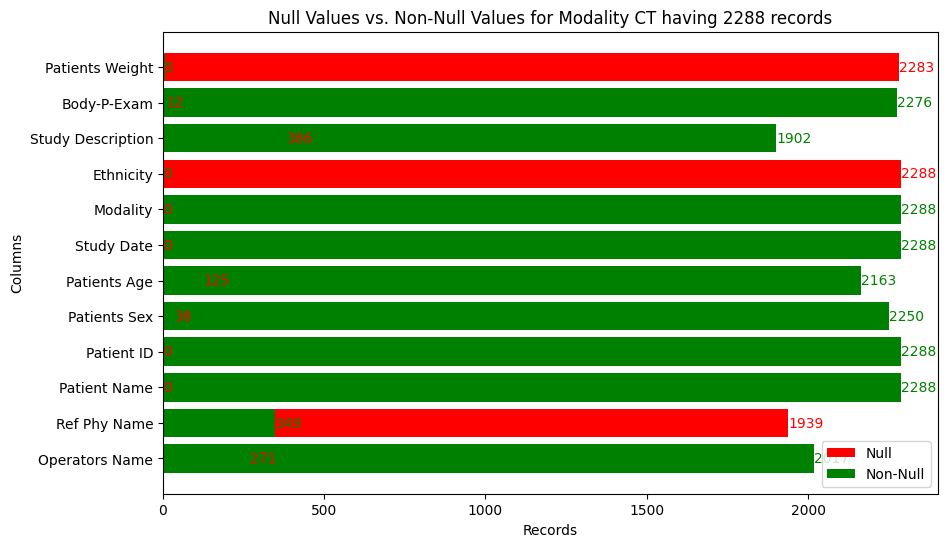

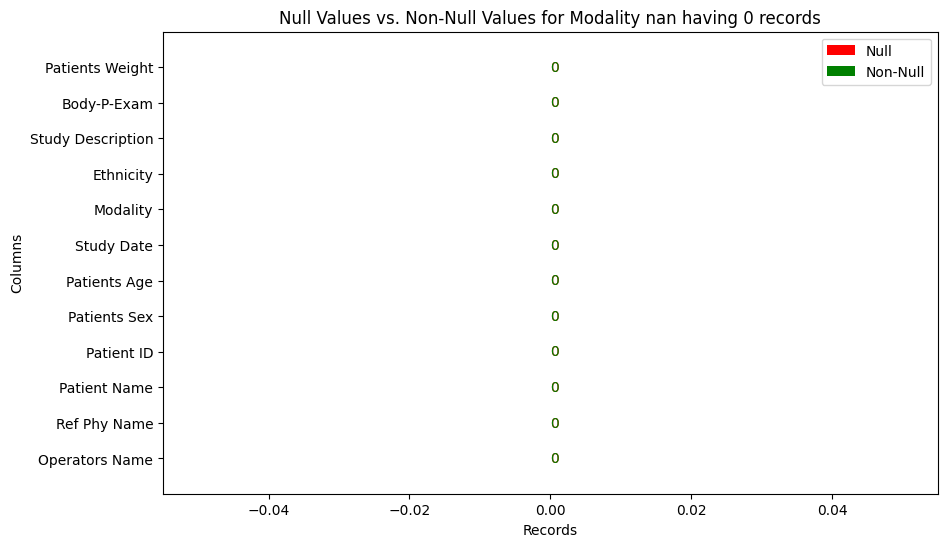

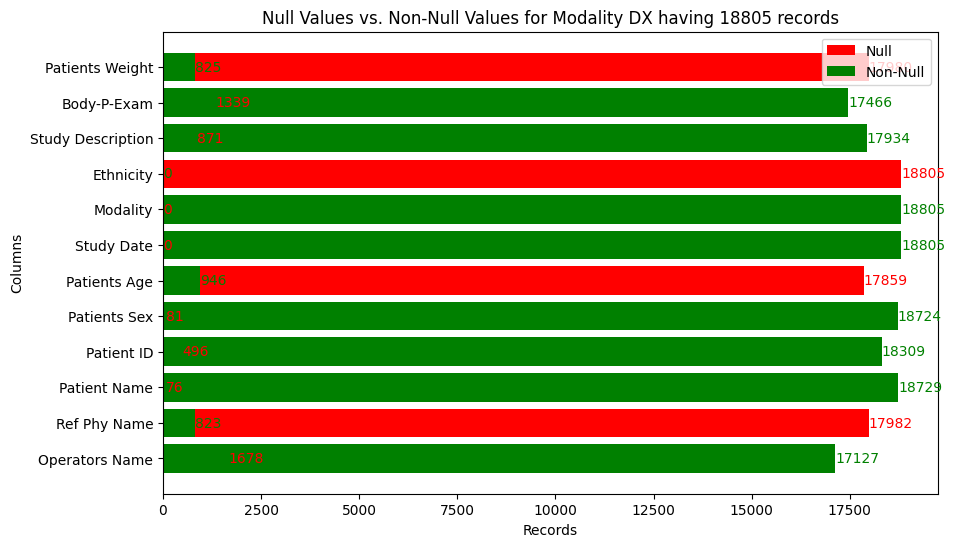

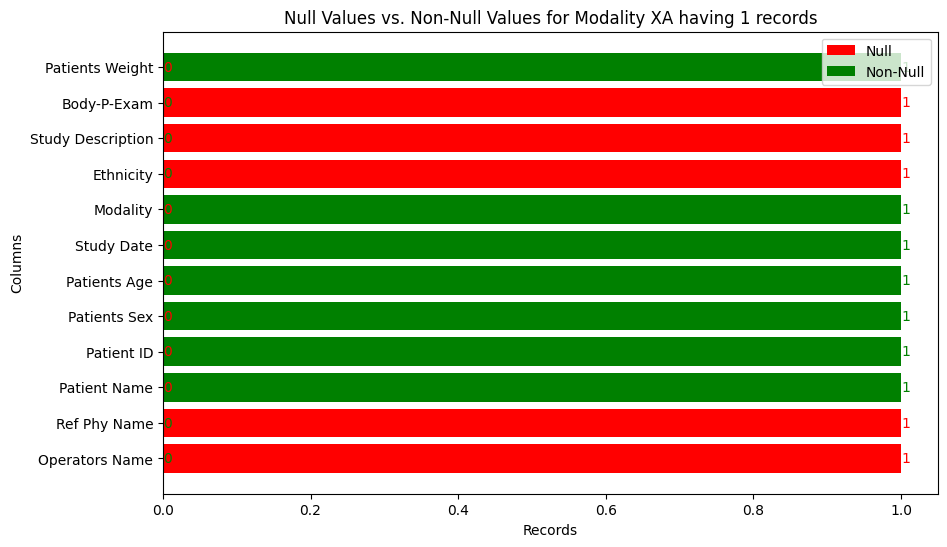

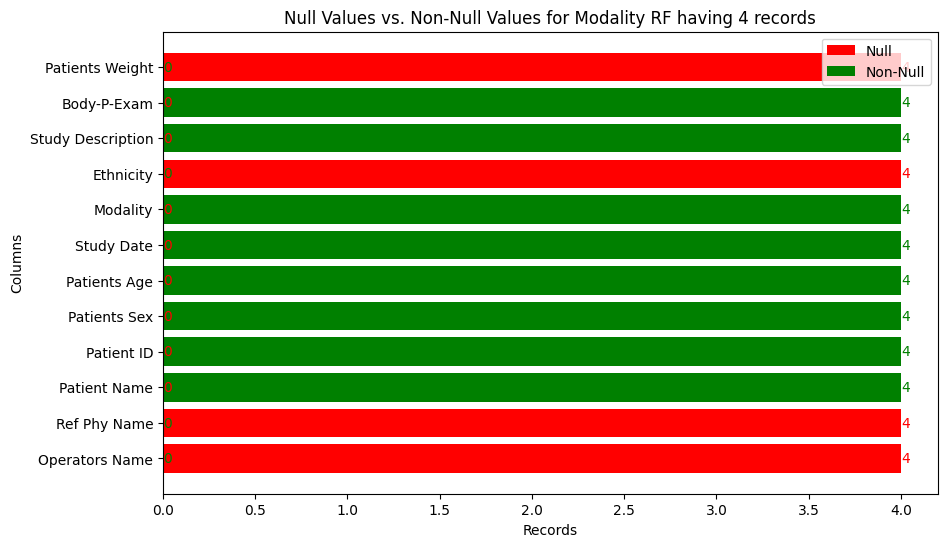

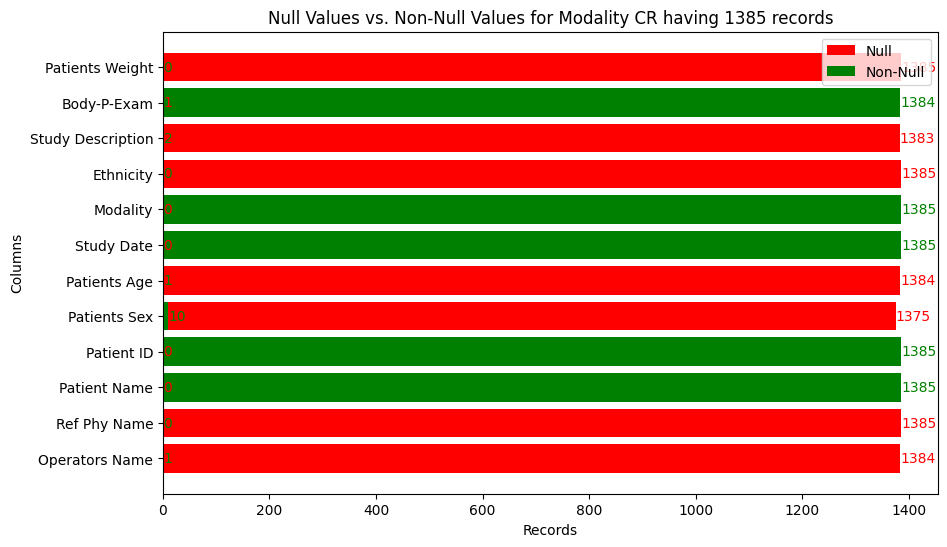

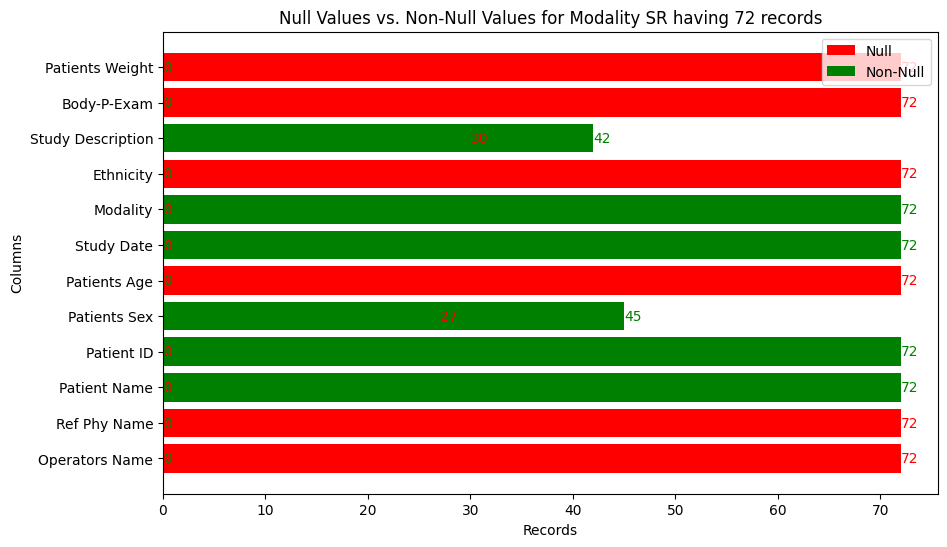

In [12]:
import pandas as pd
import matplotlib.pyplot as plt

df = combined

# Column to analyze
columns_to_analyze = ['00081070', '00080090', '00100010', '00100020', '00100040', '00101010', '00080020', '00080060', '00102160', '00081030', '00180015', '00101030']

# Get unique modalities from column '00080060'
unique_modalities = df['00080060'].unique()

# Mapping to replace column tags with descriptions
column_descriptions = {
    '00081070': 'Operators Name',
    '00080090': 'Ref Phy Name',
    '00100010': 'Patient Name',
    '00100020': 'Patient ID',
    '00100040': 'Patients Sex',
    '00101010': 'Patients Age',
    '00080020': 'Study Date',
    '00080060': 'Modality',
    '00102160': 'Ethnicity',
    '00081030': 'Study Description',
    '00180015': 'Body-P-Exam',
    '00101030': 'Patients Weight'

}

# Iterate through each unique modality and create a separate plot
for modality in unique_modalities:
    # Create a mask to identify null and non-null values for the current modality and columns
    mask = df[df['00080060'] == modality][columns_to_analyze].isnull()
    total_records = len(df[df['00080060'] == modality])

    # Plot the bar chart for null and non-null values for each column
    plt.figure(figsize=(10, 6))  # Adjust the figure size

    null_counts = mask.sum()
    non_null_counts = df[df['00080060'] == modality][columns_to_analyze].count()

    bars_null = plt.barh([column_descriptions[col] for col in columns_to_analyze], null_counts, color='red', label='Null')
    bars_non_null = plt.barh([column_descriptions[col] for col in columns_to_analyze], non_null_counts, color='green', label='Non-Null')

    # Customize the plot
    plt.xlabel('Records')
    plt.ylabel('Columns')
    plt.title(f'Null Values vs. Non-Null Values for Modality {modality} having {total_records} records')
    plt.legend()

    # Annotate each bar with the number of records
    for bar in bars_null:
        width = bar.get_width()
        plt.text(width, bar.get_y() + bar.get_height() / 2, str(int(width)), ha='left', va='center', color='red')
    for bar in bars_non_null:
        width = bar.get_width()
        plt.text(width, bar.get_y() + bar.get_height() / 2, str(int(width)), ha='left', va='center', color='green')
    
    # Display the plot
    plt.show()


In [ ]:
import pandas as pd

# Assuming 'combined' is your DataFrame

# Create a DataFrame to store the information
result_df = pd.DataFrame(index=['Null', 'Not Null'], columns=combined.columns)

# Iterate through each column in the original DataFrame
for column in combined.columns:
    # Count the occurrences of Null and Not Null values
    null_count = combined[column].isnull().sum()
    not_null_count = combined[column].count()
    
    # Assign the counts to the result DataFrame
    result_df.loc['Null', column] = null_count
    result_df.loc['Not Null', column] = not_null_count

# Save the result DataFrame to a CSV file
result_df.to_csv('result_counts2.csv')

# Display the result DataFrame
print(result_df)


- Analysis of trends by year for each modality checking for null vs non-null values

In [10]:
import pandas as pd

# Assuming 'combined' is your DataFrame

# Create a DataFrame to store the information
result_df = pd.DataFrame(index=['Null', 'Not Null'], columns=['00100010'])

# Count the occurrences of Null and Not Null values for the column '00100010'
null_count = combined['00100010'].isnull().sum()
not_null_count = combined['00100010'].count()

# Assign the counts to the result DataFrame
result_df.loc['Null', '00100010'] = null_count
result_df.loc['Not Null', '00100010'] = not_null_count

# Display the result DataFrame
print(result_df)


         00100010
Null           76
Not Null    22479


In [ ]:
import pandas as pd

# Assuming 'combined' is your DataFrame

# Create a DataFrame to store the information
result_df = pd.DataFrame(index=['Null', 'Not Null'], columns=combined.columns)

# Iterate through each column in the original DataFrame
for column in combined.columns:
    # Get the top 5 occurrences of Null and Not Null values
    null_values = combined[column][combined[column].isnull()].head(3)
    not_null_values = combined[column][combined[column].notnull()].head(3)
    
    # Assign the counts to the result DataFrame
    result_df.loc['Null', column] = null_values.to_list()
    result_df.loc['Not Null', column] = not_null_values.to_list()

# Display the result DataFrame
print(result_df)


In [ ]:
combined

In [ ]:
# Select the desired columns
selected_columns = ['00080020', '00080060', 'Weighting Score', 'Weighting Score UTHs', 'Completeness Score', 'Completeness Score UTHs']

# Export to CSV without the first row and rounded values
combined[selected_columns].iloc[1:].round(2).to_csv('/home/elijah/Documents/EMI-Project/Jupyter_Notebooks/emiz_project-wp3-dicom_compliance/outputs/emiz-wp3_results-dicom_compliance-table_2.csv', index=False, header=['Date', 'Modality Type', 'Weighting Score', 'Weighting Score UTHs', 'Completeness Score', 'Completeness Score UTHs'])

In [19]:
import pandas as pd

# Assuming 'combined' is your DataFrame and '00100010' is the column name
column_name = '00100030'

# Count the null and non-null values for the specified column
null_count = combined[column_name].isnull().sum()
not_null_count = combined[column_name].count()

# Calculate the percentage of null and non-null values
total_count = len(combined[column_name])
null_percentage = (null_count / total_count) * 100
not_null_percentage = (not_null_count / total_count) * 100

# Display the results
print(f"Column '{column_name}':")
print(f"Null count: {null_count}  ({null_percentage:.2f}%)")
print(f"Not Null count: {not_null_count}  ({not_null_percentage:.2f}%)")
print(f"total count", total_count)

Column '00100030':
Null count: 3882  (17.21%)
Not Null count: 18674  (82.79%)
total count 22556


In [14]:
import pandas as pd

# Assuming 'combined' is your DataFrame
column_name = '00080000'

# Count the null or NaN values in the specified column
null_values_count = combined[column_name].isnull().sum()

# Display the result
print(f"Number of null or NaN values in column '{column_name}': {null_values_count}")


Number of null or NaN values in column '00080000': 20292


In [9]:
import pandas as pd

# Assuming 'combined' is your DataFrame

# Create a DataFrame to store the information
result_df = pd.DataFrame(index=['Null', 'Not Null'], columns=combined.columns)

# Iterate through each column in the original DataFrame
for column in combined.columns:
    # Exclude the first row when checking for null vs not null values
    null_count = combined[column].isnull().sum()
    not_null_count = combined[column].count()
    total_count = len(combined) - 1  # Exclude the first row
    
    if total_count > 0:  # Exclude the first row (if any)
        null_percentage = (null_count / total_count) * 100
        not_null_percentage = 100 - null_percentage
        
        # Assign the percentages to the result DataFrame with 2 decimal places
        result_df.loc['Null', column] = round(null_percentage, 2)
        result_df.loc['Not Null', column] = round(not_null_percentage, 2)

# Export the result DataFrame to a CSV file (excluding NaN values)
result_df.to_csv('result.csv', na_rep='NaN')

# Display the result DataFrame
print(result_df)


         00080000 00080008 00080016 00080018 00080020 00080021 00080022  \
Null        89.97     6.46      0.0      0.0      0.0     0.33    12.39   
Not Null    10.03    93.54    100.0    100.0    100.0    99.67    87.61   

         00080023 00080030 00080031  ... 7Fxx0010 7Fxx0011 7Fxx0020 7Fxx0030  \
Null         5.43      0.0     0.33  ...    100.0    100.0    100.0    100.0   
Not Null    94.57    100.0    99.67  ...     -0.0     -0.0     -0.0     -0.0   

         7Fxx0040 FFFAFFFA FFFCFFFC FFFEE000 FFFEE00D FFFEE0DD  
Null        100.0    100.0    100.0    100.0    100.0    100.0  
Not Null     -0.0     -0.0     -0.0     -0.0     -0.0     -0.0  

[2 rows x 5350 columns]


In [ ]:
# import pandas as pd
# import matplotlib.pyplot as plt

# # Copy the DataFrame
# df = var_uths_dicom_files_DATAFRAME.copy()

# # Extract the year from the '00080020' (Study Date) column and assign it to a new 'Year' column
# df['Year'] = pd.to_datetime(df['00080020']).dt.year

# # Set a nice Matplotlib style
# plt.style.use("seaborn-whitegrid")

# # Define columns to analyze
# columns_to_analyze = ['00081070', '00080090', '00100010', '00100020', '00100040', '00101010', '00080020', '00200010', '00080080']

# # Get unique DICOM tags
# unique_tags = df[columns_to_analyze].columns

# # Get unique modalities
# unique_modalities = df['00080060'].unique()

# # Get unique years
# unique_years = df['Year'].unique()

# # Calculate the number of rows and columns based on the unique DICOM tags
# num_cols = 2
# num_rows = (len(unique_tags) + num_cols - 1) // num_cols

# fig, axs = plt.subplots(num_rows, num_cols, figsize=(15*num_cols, 5*num_rows))
# fig.suptitle('DICOM Tag Trends', fontsize=16)

# for row in range(num_rows):
#     for col in range(num_cols):
#         index = row * num_cols + col
#         if index < len(unique_tags):
#             tag = unique_tags[index]
            
#             tag_data = df[tag]
            
#             modality_data = df.groupby(['Year', '00080060'])[tag].count().unstack()
#             ax = axs[row, col] if num_rows > 1 else axs[col]
#             modality_data.plot(kind='bar', ax=ax)
            
#             ax.set_title(column_descriptions[tag])
#             ax.set_xlabel('Years')
#             ax.set_ylabel('Number of Records')
#             ax.set_xticklabels(unique_years, rotation=45)
#             ax.legend(title='Modality', bbox_to_anchor=(1.02, 1), loc='upper left')
#             ax.grid(True)

# plt.tight_layout(rect=[0, 0.03, 1, 0.95])
# plt.show()


In [ ]:
# import pandas as pd
# import matplotlib.pyplot as plt

# # Copy the DataFrame
# df = var_uths_dicom_files_DATAFRAME.copy()

# # Extract the year from the '00080020' (Study Date) column and assign it to a new 'Year' column
# df['Year'] = pd.to_datetime(df['00080020']).dt.year

# # Set a nice Matplotlib style
# plt.style.use("seaborn-whitegrid")

# # Define columns to analyze
# columns_to_analyze = ['00081070', '00080090', '00100010', '00100020', '00100040', '00101010', '00080020', '00200010', '00080080']

# # Get unique DICOM tags
# unique_tags = df[columns_to_analyze].columns

# # Get unique modalities
# unique_modalities = df['00080060'].unique()

# # Get unique years
# unique_years = df['Year'].unique()

# # Calculate the number of rows and columns based on the unique DICOM tags
# num_cols = 2
# num_rows = (len(unique_tags) + num_cols - 1) // num_cols

# fig, axs = plt.subplots(num_rows, num_cols, figsize=(15*num_cols, 5*num_rows))
# fig.suptitle('DICOM Tag Trends', fontsize=16)

# total_records_per_modality = {}  # To store total records per modality and year

# for row in range(num_rows):
#     for col in range(num_cols):
#         index = row * num_cols + col
#         if index < len(unique_tags):
#             tag = unique_tags[index]
            
#             tag_data = df[tag]
            
#             modality_data = df.groupby(['Year', '00080060'])[tag].count().unstack()
#             ax = axs[row, col] if num_rows > 1 else axs[col]
#             modality_data.plot(kind='bar', ax=ax)
            
#             ax.set_title(column_descriptions[tag])
#             ax.set_xlabel('Years')
#             ax.set_ylabel('Number of Records')
#             ax.set_xticklabels(unique_years, rotation=45)
#             ax.legend(title='Modality', bbox_to_anchor=(1.02, 1), loc='upper left')
#             ax.grid(True)
            
#             total_records_per_modality[tag] = modality_data

# plt.tight_layout(rect=[0, 0.03, 1, 0.95])
# plt.show()

# # Display total records per modality and year
# for tag, modality_data in total_records_per_modality.items():
#     print(f"{column_descriptions[tag]}:")
#     for year in unique_years:
#         year_records = modality_data.loc[year]
#         print(f"Year {year}: {year_records.sum()}")
#         for modality in unique_modalities:
#             modality_records = modality_data.loc[year, modality]
#             print(f"  {modality}: {modality_records}")
#     print()


In [7]:
var_uths_dicom_files_DATAFRAME["modified_institution"]

0       University Teaching Hospital's
1       University Teaching Hospital's
2       University Teaching Hospital's
3       University Teaching Hospital's
4       University Teaching Hospital's
                     ...              
7896           Levy Mwanawasa Hospital
7897           Levy Mwanawasa Hospital
7898           Levy Mwanawasa Hospital
7899           Levy Mwanawasa Hospital
7900           Levy Mwanawasa Hospital
Name: modified_institution, Length: 7901, dtype: object

/tmp/ipykernel_18442/4054554700.py:11: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use("seaborn-whitegrid")


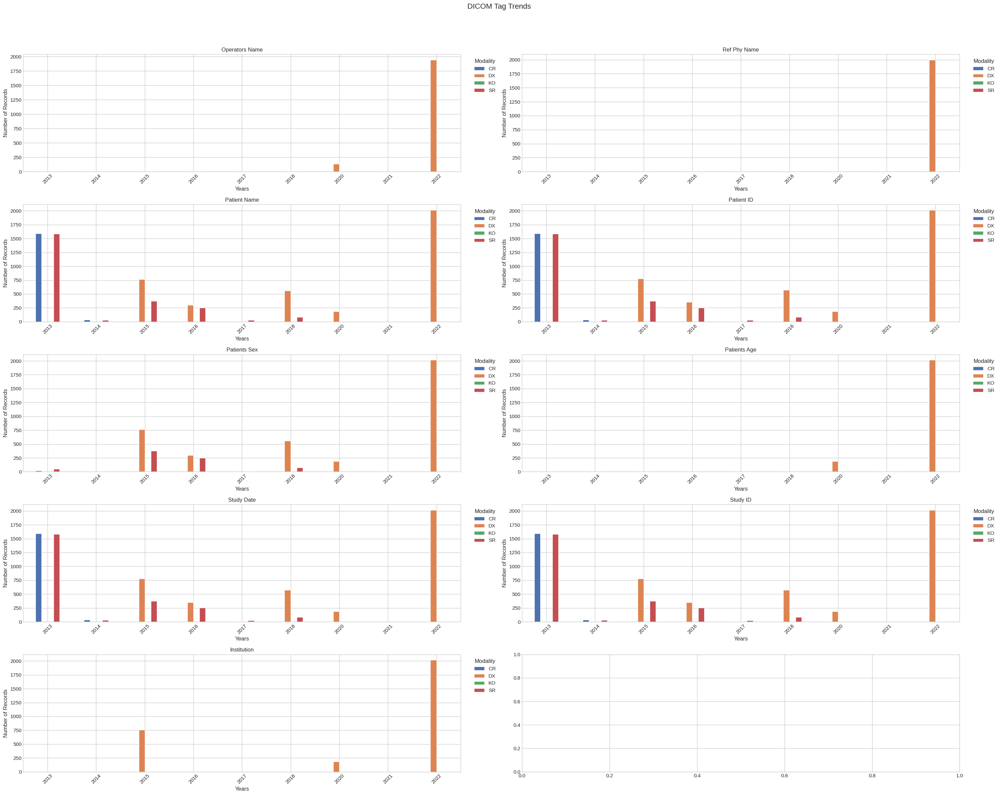

Operators Name:
Year 2013: 0.0
  SR: 0.0
  CR: 0.0
  DX: nan
  KO: nan
Year 2014: 0.0
  SR: 0.0
  CR: 0.0
  DX: nan
  KO: nan
Year 2015: 0.0
  SR: 0.0
  CR: nan
  DX: 0.0
  KO: 0.0
Year 2016: 0.0
  SR: 0.0
  CR: nan
  DX: 0.0
  KO: nan
Year 2017: 0.0
  SR: 0.0
  CR: nan
  DX: 0.0
  KO: nan
Year 2018: 0.0
  SR: 0.0
  CR: nan
  DX: 0.0
  KO: 0.0
Year 2020: 136.0
  SR: nan
  CR: nan
  DX: 136.0
  KO: nan
Year 2021: 2.0
  SR: nan
  CR: nan
  DX: 2.0
  KO: nan
Year 2022: 1943.0
  SR: nan
  CR: nan
  DX: 1943.0
  KO: nan

Ref Phy Name:
Year 2013: 0.0
  SR: 0.0
  CR: 0.0
  DX: nan
  KO: nan
Year 2014: 0.0
  SR: 0.0
  CR: 0.0
  DX: nan
  KO: nan
Year 2015: 0.0
  SR: 0.0
  CR: nan
  DX: 0.0
  KO: 0.0
Year 2016: 0.0
  SR: 0.0
  CR: nan
  DX: 0.0
  KO: nan
Year 2017: 0.0
  SR: 0.0
  CR: nan
  DX: 0.0
  KO: nan
Year 2018: 0.0
  SR: 0.0
  CR: nan
  DX: 0.0
  KO: 0.0
Year 2020: 0.0
  SR: nan
  CR: nan
  DX: 0.0
  KO: nan
Year 2021: 0.0
  SR: nan
  CR: nan
  DX: 0.0
  KO: nan
Year 2022: 1997.0
  SR: 

In [60]:
import pandas as pd
import matplotlib.pyplot as plt

# Copy the DataFrame
df = var_uths_dicom_files_DATAFRAME.copy()

# Extract the year from the '00080020' (Study Date) column and assign it to a new 'Year' column
df['Year'] = pd.to_datetime(df['00080020']).dt.year

# Set a nice Matplotlib style
plt.style.use("seaborn-whitegrid")

# Define columns to analyze
columns_to_analyze = ['00081070', '00080090', '00100010', '00100020', '00100040', '00101010', '00080020', '00200010', '00080080']

# Get unique DICOM tags
unique_tags = df[columns_to_analyze].columns

# Get unique modalities
unique_modalities = df['00080060'].unique()

# Get unique years and sort them in ascending order
unique_years = sorted(df['Year'].unique())

# Calculate the number of rows and columns based on the unique DICOM tags
num_cols = 2
num_rows = (len(unique_tags) + num_cols - 1) // num_cols

fig, axs = plt.subplots(num_rows, num_cols, figsize=(15*num_cols, 5*num_rows))
fig.suptitle('DICOM Tag Trends', fontsize=16)

total_records_per_modality = {}  # To store total records per modality and year

for row in range(num_rows):
    for col in range(num_cols):
        index = row * num_cols + col
        if index < len(unique_tags):
            tag = unique_tags[index]
            
            tag_data = df[tag]
            
            modality_data = df.groupby(['Year', '00080060'])[tag].count().unstack()
            ax = axs[row, col] if num_rows > 1 else axs[col]
            modality_data.plot(kind='bar', ax=ax)
            
            ax.set_title(column_descriptions[tag])
            ax.set_xlabel('Years')
            ax.set_ylabel('Number of Records')
            ax.set_xticklabels(unique_years, rotation=45)
            ax.legend(title='Modality', bbox_to_anchor=(1.02, 1), loc='upper left')
            ax.grid(True)
            
            total_records_per_modality[tag] = modality_data

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

# Display total records per modality and year
for tag, modality_data in total_records_per_modality.items():
    print(f"{column_descriptions[tag]}:")
    for year in unique_years:
        year_records = modality_data.loc[year]
        print(f"Year {year}: {year_records.sum()}")
        for modality in unique_modalities:
            modality_records = modality_data.loc[year, modality]
            print(f"  {modality}: {modality_records}")
    print()


In [55]:
var_uths_dicom_files_DATAFRAME["modified_institution"]

0       University Teaching Hospital's
1       University Teaching Hospital's
2       University Teaching Hospital's
3       University Teaching Hospital's
4       University Teaching Hospital's
                     ...              
7896           Levy Mwanawasa Hospital
7897           Levy Mwanawasa Hospital
7898           Levy Mwanawasa Hospital
7899           Levy Mwanawasa Hospital
7900           Levy Mwanawasa Hospital
Name: modified_institution, Length: 7901, dtype: object

/tmp/ipykernel_102180/3218078390.py:11: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use("seaborn-whitegrid")


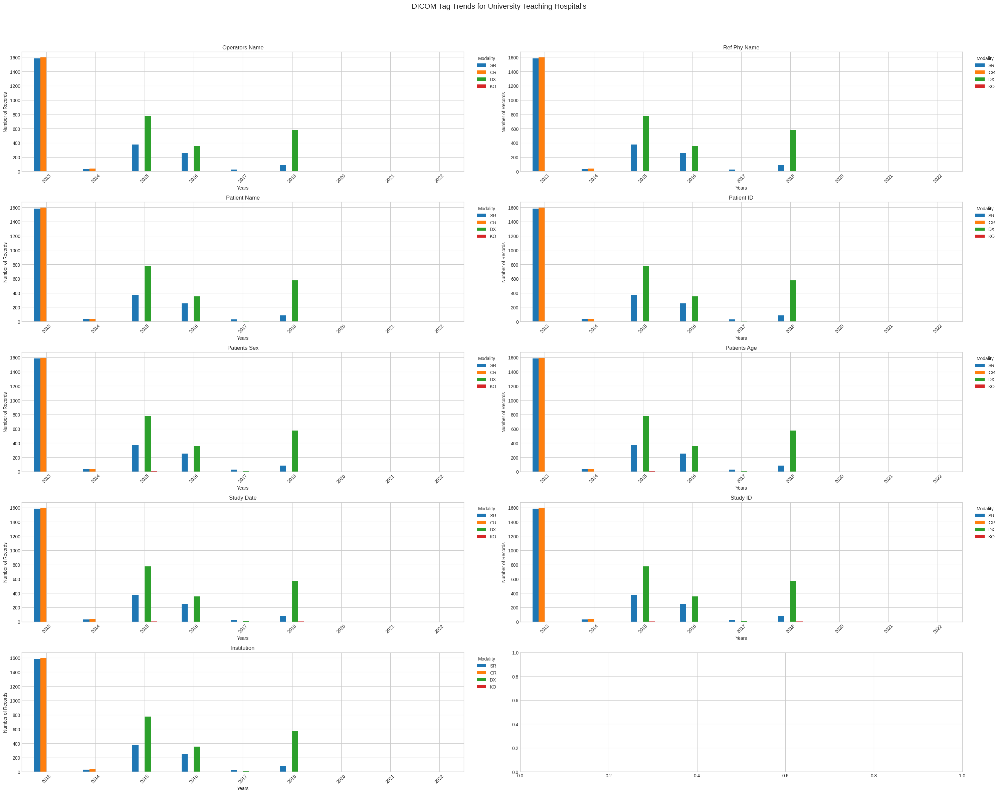

Operators Name:

Ref Phy Name:

Patient Name:

Patient ID:

Patients Sex:

Patients Age:

Study Date:

Study ID:

Institution:



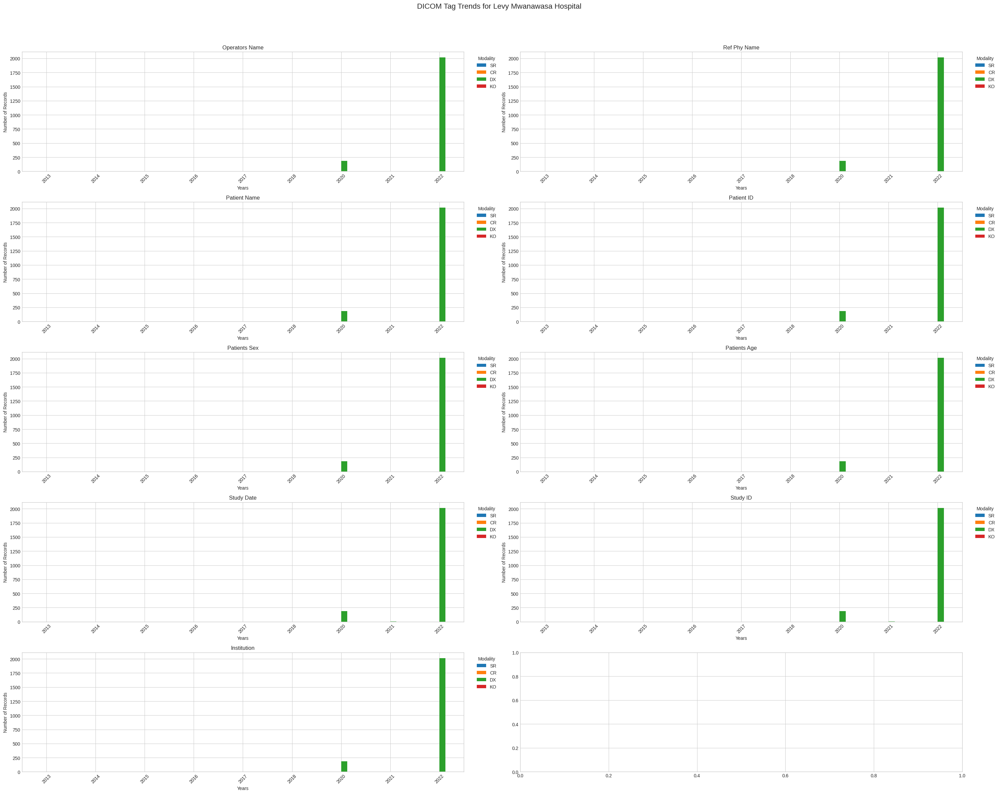

Operators Name:

Ref Phy Name:

Patient Name:

Patient ID:

Patients Sex:

Patients Age:

Study Date:

Study ID:

Institution:



In [98]:
import pandas as pd
import matplotlib.pyplot as plt

# Copy the DataFrame
df = var_uths_dicom_files_DATAFRAME.copy()

# Extract the year from the '00080020' (Study Date) column and assign it to a new 'Year' column
df['Year'] = pd.to_datetime(df['00080020']).dt.year

# Set a nice Matplotlib style
plt.style.use("seaborn-whitegrid")

# Define columns to analyze
columns_to_analyze = ['00081070', '00080090', '00100010', '00100020', '00100040', '00101010', '00080020', '00200010', '00080080']

# Get unique DICOM tags
unique_tags = df[columns_to_analyze].columns

# Get unique modalities, excluding '0'
unique_modalities = df[df['00080060'] != '0']['00080060'].unique()

# Get unique institutions
unique_institutions = df['modified_institution'].unique()

# Get the unique years for the entire dataset
unique_years = sorted(df['Year'].unique())

# Calculate the number of rows and columns based on the unique DICOM tags
num_cols = 2
num_rows = (len(unique_tags) + num_cols - 1) // num_cols

# Create a complete set of years
complete_years_df = pd.DataFrame({'Year': unique_years})

# Iterate over each institution
for institution in unique_institutions:
    institution_df = df[df['modified_institution'] == institution]

    # Merge the institution's data with the complete set of years, filling missing data with zeros
    merged_df = pd.merge(complete_years_df, institution_df, on='Year', how='left').fillna(0)

    fig, axs = plt.subplots(num_rows, num_cols, figsize=(15*num_cols, 5*num_rows))
    fig.suptitle(f'DICOM Tag Trends for {institution}', fontsize=16)

    total_records_per_modality = {}  # To store total records per modality and year

    for row in range(num_rows):
        for col in range(num_cols):
            index = row * num_cols + col
            if index < len(unique_tags):
                tag = unique_tags[index]

                tag_data = merged_df[tag]

                # Pivot the institution's data directly
                modality_data = merged_df.pivot_table(index='Year', columns='00080060', values=tag, aggfunc='count')
                
                # Ensure all modalities are in the index
                modality_data = modality_data.reindex(columns=unique_modalities, fill_value=0)
                
                ax = axs[row, col] if num_rows > 1 else axs[col]
                modality_data = modality_data[unique_modalities]  # Filter out '0' from the legend
                modality_data.plot(kind='bar', ax=ax)

                # Add DICOM tag information to the title
                ax.set_title(column_descriptions[tag])
                ax.set_xlabel('Years')
                ax.set_ylabel('Number of Records')
                ax.set_xticks(range(len(unique_years)))  # Set the number of tick locations
                ax.set_xticklabels(unique_years, rotation=45)  # Set the tick labels
                ax.legend(title='Modality', bbox_to_anchor=(1.02, 1), loc='upper left')
                ax.grid(True)

                total_records_per_modality[tag] = modality_data

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

    # Display total records per modality and year
    for tag, modality_data in total_records_per_modality.items():
        print(f"{column_descriptions[tag]}:")
        for year in unique_years:
            year_records = modality_data.get(year)
            if year_records is not None:
                print(f"Year {year}: {year_records.sum()}")
                for modality in unique_modalities:
                    modality_records = modality_data.get(modality)
                    if modality_records is not None:
                        print(f"  {modality}: {modality_records.get(year)}")
        print()


/tmp/ipykernel_102180/580931637.py:11: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use("seaborn-whitegrid")


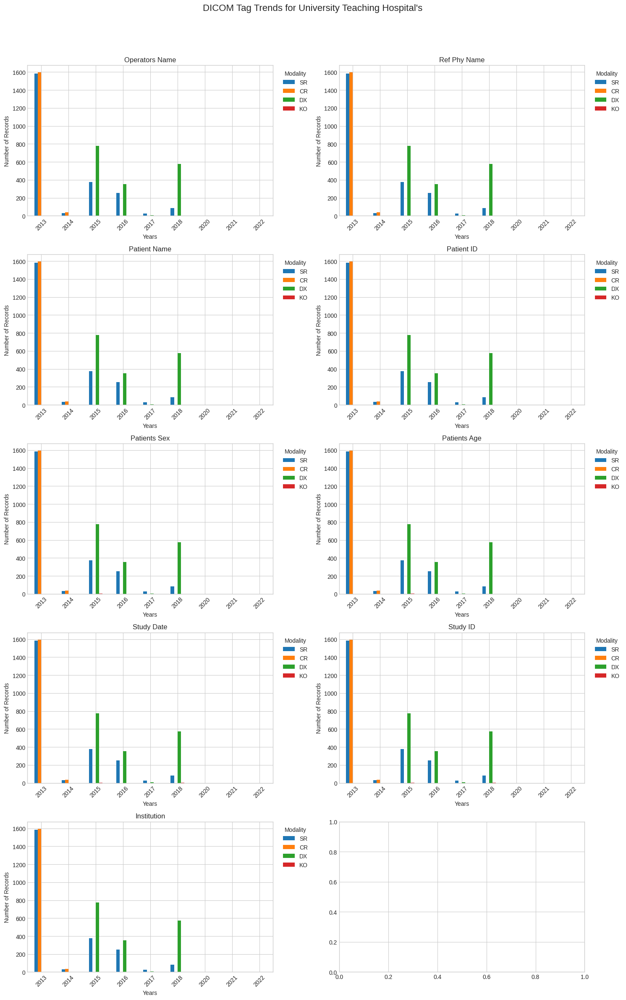

Operators Name:

Ref Phy Name:

Patient Name:

Patient ID:

Patients Sex:

Patients Age:

Study Date:

Study ID:

Institution:



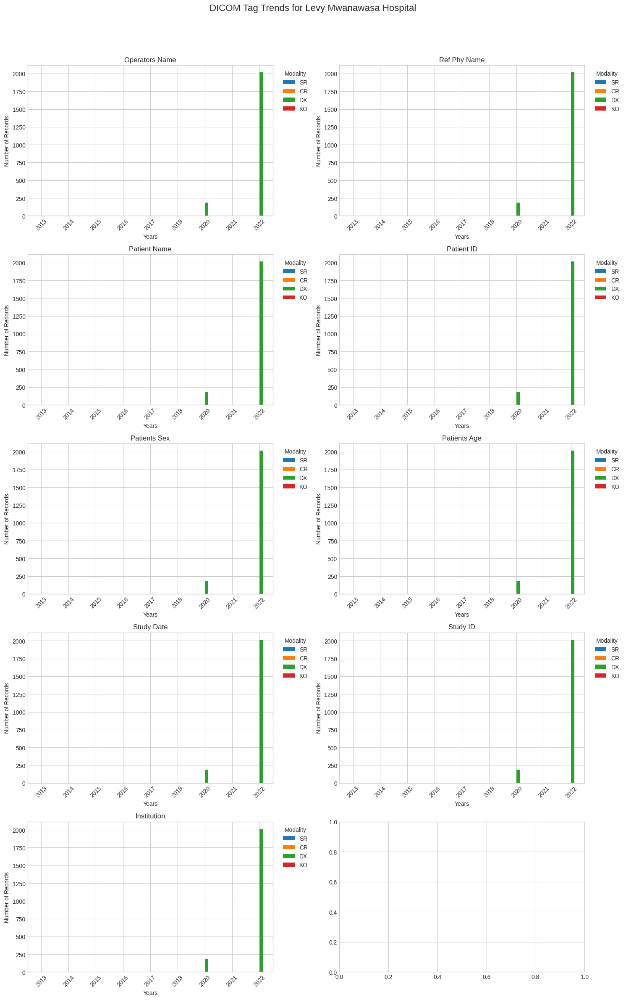

Operators Name:

Ref Phy Name:

Patient Name:

Patient ID:

Patients Sex:

Patients Age:

Study Date:

Study ID:

Institution:



In [102]:
import pandas as pd
import matplotlib.pyplot as plt

# Copy the DataFrame
df = var_uths_dicom_files_DATAFRAME.copy()

# Extract the year from the '00080020' (Study Date) column and assign it to a new 'Year' column
df['Year'] = pd.to_datetime(df['00080020']).dt.year

# Set a nice Matplotlib style
plt.style.use("seaborn-whitegrid")

# Define columns to analyze
columns_to_analyze = ['00081070', '00080090', '00100010', '00100020', '00100040', '00101010', '00080020', '00200010', '00080080']

# Get unique DICOM tags
unique_tags = df[columns_to_analyze].columns

# Get unique modalities, excluding '0'
unique_modalities = df[df['00080060'] != '0']['00080060'].unique()

# Get unique institutions
unique_institutions = df['modified_institution'].unique()

# Get the unique years for the entire dataset
unique_years = sorted(df['Year'].unique())

# Calculate the number of rows and columns based on the unique DICOM tags
num_cols = 2
num_rows = (len(unique_tags) + num_cols - 1) // num_cols

# Create a complete set of years
complete_years_df = pd.DataFrame({'Year': unique_years})

# Iterate over each institution
for institution in unique_institutions:
    institution_df = df[df['modified_institution'] == institution]

    # Merge the institution's data with the complete set of years, filling missing data with zeros
    merged_df = pd.merge(complete_years_df, institution_df, on='Year', how='left').fillna(0)

    fig, axs = plt.subplots(num_rows, 2, figsize=(15, 5*num_rows))
    fig.suptitle(f'DICOM Tag Trends for {institution}', fontsize=16)

    total_records_per_modality = {}  # To store total records per modality and year

    for row in range(num_rows):
        left_col = axs[row, 0]
        right_col = axs[row, 1]

        if row * 2 < len(unique_tags):
            left_tag = unique_tags[row * 2]
            right_tag = None
            left_tag_data = merged_df[left_tag]

            if (row * 2 + 1) < len(unique_tags):
                right_tag = unique_tags[row * 2 + 1]
                right_tag_data = merged_df[right_tag]

            # Pivot the institution's data directly for left tag
            modality_data_left = merged_df.pivot_table(index='Year', columns='00080060', values=left_tag, aggfunc='count')

            # Ensure all modalities are in the index for left tag
            modality_data_left = modality_data_left.reindex(columns=unique_modalities, fill_value=0)

            # Plot left tag
            modality_data_left = modality_data_left[unique_modalities]  # Filter out '0' from the legend
            modality_data_left.plot(kind='bar', ax=left_col)

            # Add DICOM tag information to the title for left tag
            left_col.set_title(column_descriptions[left_tag])
            left_col.set_xlabel('Years')
            left_col.set_ylabel('Number of Records')
            left_col.set_xticks(range(len(unique_years)))  # Set the number of tick locations
            left_col.set_xticklabels(unique_years, rotation=45)  # Set the tick labels
            left_col.legend(title='Modality', bbox_to_anchor=(1.02, 1), loc='upper left')
            left_col.grid(True)

            total_records_per_modality[left_tag] = modality_data_left

            # Plot right tag if it exists
            if right_tag:
                # Pivot the institution's data directly for right tag
                modality_data_right = merged_df.pivot_table(index='Year', columns='00080060', values=right_tag, aggfunc='count')

                # Ensure all modalities are in the index for right tag
                modality_data_right = modality_data_right.reindex(columns=unique_modalities, fill_value=0)

                # Plot right tag
                modality_data_right = modality_data_right[unique_modalities]  # Filter out '0' from the legend
                modality_data_right.plot(kind='bar', ax=right_col)

                # Add DICOM tag information to the title for right tag
                right_col.set_title(column_descriptions[right_tag])
                right_col.set_xlabel('Years')
                right_col.set_ylabel('Number of Records')
                right_col.set_xticks(range(len(unique_years)))  # Set the number of tick locations
                right_col.set_xticklabels(unique_years, rotation=45)  # Set the tick labels
                right_col.legend(title='Modality', bbox_to_anchor=(1.02, 1), loc='upper left')
                right_col.grid(True)

                total_records_per_modality[right_tag] = modality_data_right

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

    # Display total records per modality and year
    for tag, modality_data in total_records_per_modality.items():
        print(f"{column_descriptions[tag]}:")
        for year in unique_years:
            year_records = modality_data.get(year)
            if year_records is not None:
                print(f"Year {year}: {year_records.sum()}")
                for modality in unique_modalities:
                    modality_records = modality_data.get(modality)
                    if modality_records is not None:
                        print(f"  {modality}: {modality_records.get(year)}")
        print()


/tmp/ipykernel_102180/4180196717.py:11: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use("seaborn-whitegrid")


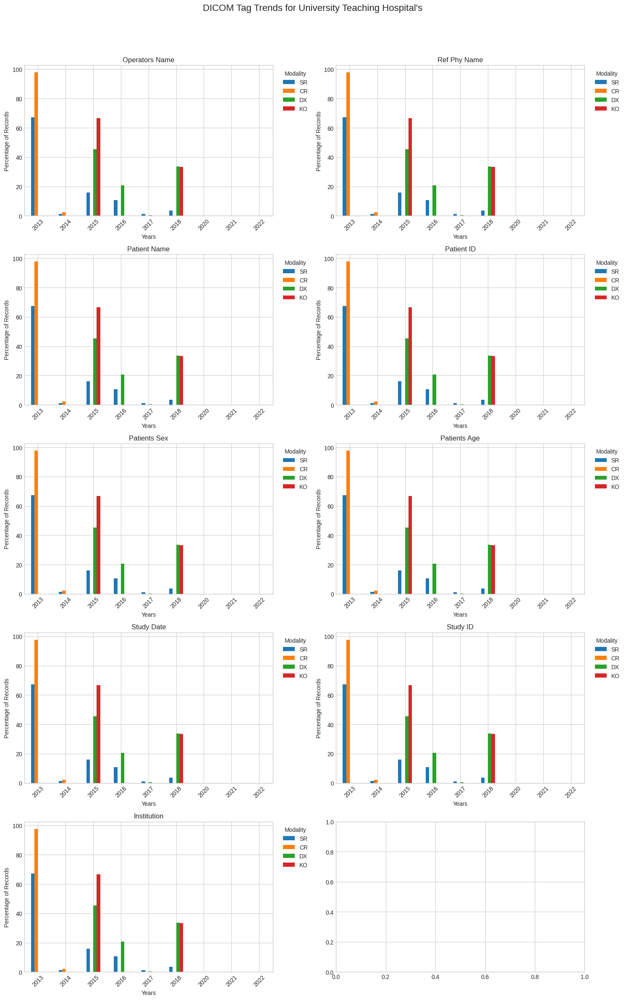

Operators Name:

Ref Phy Name:

Patient Name:

Patient ID:

Patients Sex:

Patients Age:

Study Date:

Study ID:

Institution:



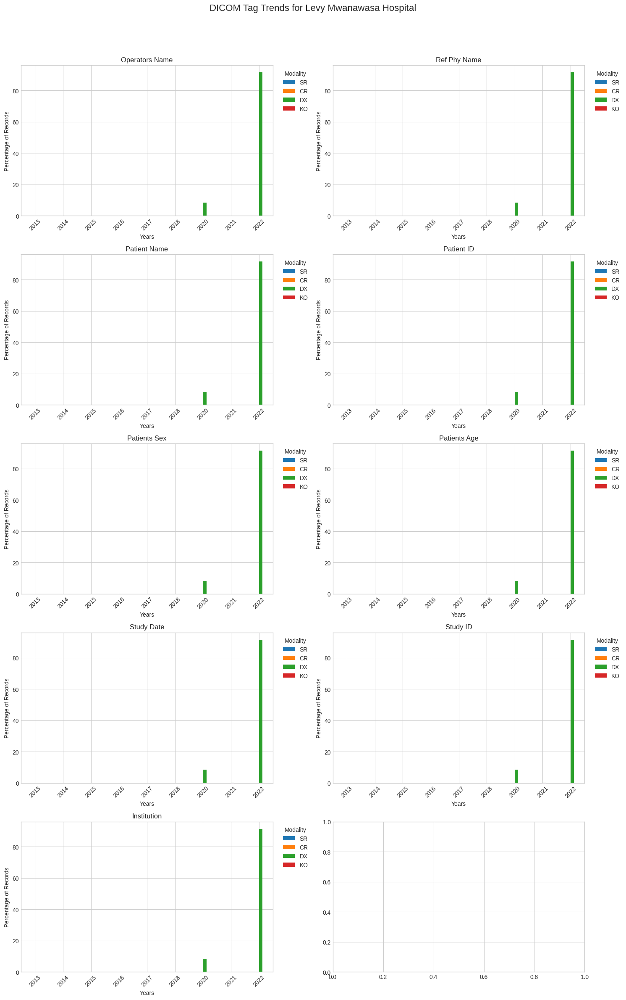

Operators Name:

Ref Phy Name:

Patient Name:

Patient ID:

Patients Sex:

Patients Age:

Study Date:

Study ID:

Institution:



In [120]:
import pandas as pd
import matplotlib.pyplot as plt

# Copy the DataFrame
df = var_uths_dicom_files_DATAFRAME.copy()

# Extract the year from the '00080020' (Study Date) column and assign it to a new 'Year' column
df['Year'] = pd.to_datetime(df['00080020']).dt.year

# Set a nice Matplotlib style
plt.style.use("seaborn-whitegrid")

# Define columns to analyze
columns_to_analyze = ['00081070', '00080090', '00100010', '00100020', '00100040', '00101010', '00080020', '00200010', '00080080']

# Get unique DICOM tags
unique_tags = df[columns_to_analyze].columns

# Get unique modalities, excluding '0'
unique_modalities = df[df['00080060'] != '0']['00080060'].unique()

# Get unique institutions
unique_institutions = df['modified_institution'].unique()

# Get the unique years for the entire dataset
unique_years = sorted(df['Year'].unique())

# Calculate the number of rows and columns based on the unique DICOM tags
num_cols = 2
num_rows = (len(unique_tags) + num_cols - 1) // num_cols

# Create a complete set of years
complete_years_df = pd.DataFrame({'Year': unique_years})

# Iterate over each institution
for institution in unique_institutions:
    institution_df = df[df['modified_institution'] == institution]

    # Merge the institution's data with the complete set of years, filling missing data with zeros
    merged_df = pd.merge(complete_years_df, institution_df, on='Year', how='left').fillna(0)

    fig, axs = plt.subplots(num_rows, 2, figsize=(15, 5*num_rows))
    fig.suptitle(f'DICOM Tag Trends for {institution}', fontsize=16)

    total_records_per_modality = {}  # To store total records per modality and year

    for row in range(num_rows):
        left_col = axs[row, 0]
        right_col = axs[row, 1]

        if row * 2 < len(unique_tags):
            left_tag = unique_tags[row * 2]
            right_tag = None
            left_tag_data = merged_df[left_tag]

            if (row * 2 + 1) < len(unique_tags):
                right_tag = unique_tags[row * 2 + 1]
                right_tag_data = merged_df[right_tag]

            # Pivot the institution's data directly for left tag
            modality_data_left = merged_df.pivot_table(index='Year', columns='00080060', values=left_tag, aggfunc='count')

            # Ensure all modalities are in the index for left tag
            modality_data_left = modality_data_left.reindex(columns=unique_modalities, fill_value=0)

            # Calculate percentages for left tag
            modality_data_left_percentage = (modality_data_left / modality_data_left.sum()) * 100

            # Plot left tag
            modality_data_left_percentage = modality_data_left_percentage[unique_modalities]  # Filter out '0' from the legend
            modality_data_left_percentage.plot(kind='bar', ax=left_col)

            # Add DICOM tag information to the title for left tag
            left_col.set_title(column_descriptions[left_tag])
            left_col.set_xlabel('Years')
            left_col.set_ylabel('Percentage of Records')
            left_col.set_xticks(range(len(unique_years)))  # Set the number of tick locations
            left_col.set_xticklabels(unique_years, rotation=45)  # Set the tick labels
            left_col.legend(title='Modality', bbox_to_anchor=(1.02, 1), loc='upper left')
            left_col.grid(True)

            total_records_per_modality[left_tag] = modality_data_left_percentage

            # Plot right tag if it exists
            if right_tag:
                # Pivot the institution's data directly for right tag
                modality_data_right = merged_df.pivot_table(index='Year', columns='00080060', values=right_tag, aggfunc='count')

                # Ensure all modalities are in the index for right tag
                modality_data_right = modality_data_right.reindex(columns=unique_modalities, fill_value=0)

                # Calculate percentages for right tag
                modality_data_right_percentage = (modality_data_right / modality_data_right.sum()) * 100

                # Plot right tag
                modality_data_right_percentage = modality_data_right_percentage[unique_modalities]  # Filter out '0' from the legend
                modality_data_right_percentage.plot(kind='bar', ax=right_col)

                # Add DICOM tag information to the title for right tag
                right_col.set_title(column_descriptions[right_tag])
                right_col.set_xlabel('Years')
                right_col.set_ylabel('Percentage of Records')
                right_col.set_xticks(range(len(unique_years)))  # Set the number of tick locations
                right_col.set_xticklabels(unique_years, rotation=45)  # Set the tick labels
                right_col.legend(title='Modality', bbox_to_anchor=(1.02, 1), loc='upper left')
                right_col.grid(True)

                total_records_per_modality[right_tag] = modality_data_right_percentage

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

    # Display total records per modality and year
    for tag, modality_data_percentage in total_records_per_modality.items():
        print(f"{column_descriptions[tag]}:")
        for year in unique_years:
            year_percentage = modality_data_percentage.get(year)
            if year_percentage is not None:
                print(f"Year {year}: {year_percentage.sum()}%")
                for modality in unique_modalities:
                    modality_percentage = year_percentage.get(modality)
                    if modality_percentage is not None:
                        print(f"  {modality}: {modality_percentage}")
        print()


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Copy the DataFrame
df = var_uths_dicom_files_DATAFRAME.copy()

# Extract the year from the '00080020' (Study Date) column and assign it to a new 'Year' column
df['Year'] = pd.to_datetime(df['00080020']).dt.year

# Set a nice Matplotlib style
plt.style.use("seaborn-whitegrid")

# Define columns to analyze
columns_to_analyze = ['00081070', '00080090', '00100010', '00100020', '00100040', '00101010', '00080020', '00200010', '00080080']

# Get unique DICOM tags
unique_tags = df[columns_to_analyze].columns

# Get unique modalities, excluding '0'
unique_modalities = df[df['00080060'] != '0']['00080060'].unique()

# Get unique institutions
unique_institutions = df['modified_institution'].unique()

# Get the unique years for the entire dataset
unique_years = sorted(df['Year'].unique())

# Calculate the number of rows and columns based on the unique DICOM tags
num_cols = 2
num_rows = (len(unique_tags) + num_cols - 1) // num_cols

# Create a complete set of years
complete_years_df = pd.DataFrame({'Year': unique_years})

# Iterate over each institution
for institution in unique_institutions:
    institution_df = df[df['modified_institution'] == institution]

    # Merge the institution's data with the complete set of years, filling missing data with zeros
    merged_df = pd.merge(complete_years_df, institution_df, on='Year', how='left').fillna(0)

    fig, axs = plt.subplots(num_rows, 2, figsize=(15, 5*num_rows))
    fig.suptitle(f'DICOM Tag Trends for {institution}', fontsize=16)

    for row in range(num_rows):
        left_col = axs[row, 0]
        right_col = axs[row, 1]

        if row * 2 < len(unique_tags):
            left_tag = unique_tags[row * 2]
            right_tag = None
            left_tag_data = merged_df[left_tag]

            if (row * 2 + 1) < len(unique_tags):
                right_tag = unique_tags[row * 2 + 1]
                right_tag_data = merged_df[right_tag]

            # Create arrays for the bar positions
            x = np.arange(len(unique_years))

            # Initialize a dictionary to store modality data
            modality_data = {}

            # Calculate non-null counts for each modality
            for modality in unique_modalities:
                non_null_counts = []
                for year in unique_years:
                    year_data = merged_df[merged_df['Year'] == year]
                    non_null_count = year_data[year_data['00080060'] == modality][left_tag].count()
                    non_null_counts.append(non_null_count)
                modality_data[modality] = non_null_counts

            # Create a stacked bar plot for left tag
            left_col.bar(x, modality_data[unique_modalities[0]], label=unique_modalities[0])
            for i in range(1, len(unique_modalities)):
                left_col.bar(x, modality_data[unique_modalities[i]], bottom=np.sum([modality_data[m] for m in unique_modalities[:i]], axis=0), label=unique_modalities[i])

            # Add DICOM tag information to the title for left tag
            left_col.set_title(column_descriptions[left_tag])
            left_col.set_xlabel('Years')
            left_col.set_ylabel('Percentage of Non-Null Records')
            left_col.set_xticks(x)
            left_col.set_xticklabels(unique_years, rotation=45)
            left_col.legend(loc='upper left')
            left_col.grid(True)

            # Plot right tag if it exists
            if right_tag:
                # Initialize a dictionary to store modality data for right tag
                modality_data_right = {}

                # Calculate non-null counts for each modality for right tag
                for modality in unique_modalities:
                    non_null_counts_right = []
                    for year in unique_years:
                        year_data = merged_df[merged_df['Year'] == year]
                        non_null_count = year_data[year_data['00080060'] == modality][right_tag].count()
                        non_null_counts_right.append(non_null_count)
                    modality_data_right[modality] = non_null_counts_right

                # Create a stacked bar plot for right tag
                right_col.bar(x, modality_data_right[unique_modalities[0]], label=unique_modalities[0])
                for i in range(1, len(unique_modalities)):
                    right_col.bar(x, modality_data_right[unique_modalities[i]], bottom=np.sum([modality_data_right[m] for m in unique_modalities[:i]], axis=0), label=unique_modalities[i])

                # Add DICOM tag information to the title for right tag
                right_col.set_title(column_descriptions[right_tag])
                right_col.set_xlabel('Years')
                right_col.set_ylabel('Percentage of Non-Null Records')
                right_col.set_xticks(x)
                right_col.set_xticklabels(unique_years, rotation=45)
                right_col.legend(loc='upper left')
                right_col.grid(True)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()


- Analysis of years for null vs non null values for each modality across all institutions

In [ ]:
# # Copy the DataFrame with a prefixed variable name
# var_df = var_uths_dicom_files_DATAFRAME.copy()

# # Extract the year from the '00080020' (Study Date) column and assign it to a new 'Year' column
# var_df['Year'] = pd.to_datetime(var_df['00080020']).dt.year

# # Set a nice Matplotlib style
# plt.style.use("seaborn-whitegrid")

# # Define columns to analyze
# var_columns_to_analyze = ['00081070', '00080090', '00100010', '00100020', '00100040', '00101010', '00080020', '00200010', '00080080']

# # Get unique modalities
# var_unique_modalities = var_df['00080060'].unique()

# var_column_descriptions = {
#     '00081070': 'Operators Name',
#     '00080090': 'Ref Phy Name',
#     '00100010': 'Patient Name',
#     '00100020': 'Patient ID',
#     '00100040': 'Patients Sex',
#     '00101010': 'Patients Age',
#     '00200010': 'Study ID',
#     '00080020': 'Study Date',
#     '00080080': 'Institution'
# }

# # Calculate the number of years per row
# var_years_per_row = 3

# # Iterate through each unique modality
# for var_modality in var_unique_modalities:
#     var_modality_data = var_df[var_df['00080060'] == var_modality]
    
#     var_years = sorted(var_modality_data['Year'].unique())
#     var_num_years = len(var_years)
    
#     var_num_rows = (var_num_years + var_years_per_row - 1) // var_years_per_row
#     var_num_cols = var_years_per_row
    
#     # Create subplots for each modality
#     var_fig, var_axs = plt.subplots(var_num_rows, var_num_cols, figsize=(15, 5*var_num_rows))
#     var_fig.suptitle(var_modality, fontsize=16)
    
#     # Loop through rows and columns of subplots
#     for i in range(var_num_rows):
#         for j in range(var_num_cols):
#             var_year_idx = i * var_num_cols + j
            
#             # Check if the current year index is within the valid range
#             if var_year_idx < var_num_years:
#                 # Extract the year and corresponding data for the current subplot
#                 var_year = var_years[var_year_idx]
#                 var_year_data = var_modality_data[var_modality_data['Year'] == var_year]
                
#                 # Count non-null and null values for each column
#                 var_non_null_counts = []
#                 var_null_counts = []
#                 for var_column in var_columns_to_analyze:
#                     var_non_null_count = var_year_data[var_year_data[var_column].notnull()].shape[0]
#                     var_null_count = var_year_data.shape[0] - var_non_null_count
#                     var_non_null_counts.append(var_non_null_count)
#                     var_null_counts.append(var_null_count)
                
#                 x = range(len(var_columns_to_analyze))
#                 var_ax = var_axs[i, j] if var_num_rows > 1 else var_axs[j]
                
#                 # Create stacked bar plot with green for non-null and red for null values
#                 var_ax.bar(x, var_non_null_counts, color='green', label='Non-Null', alpha=0.7)
#                 var_ax.bar(x, var_null_counts, bottom=var_non_null_counts, color='red', label='Null', alpha=0.7)
                
#                 var_ax.set_title(var_year)
#                 var_ax.set_xlabel('Columns')
#                 var_ax.set_ylabel('Count')
#                 var_ax.set_xticks(x)
#                 var_ax.set_xticklabels([var_column_descriptions[col] for col in var_columns_to_analyze], rotation=45, ha="right")
#                 var_ax.legend()
#                 var_ax.grid(True)
    
#     plt.tight_layout(rect=[0, 0.03, 1, 0.95])
#     plt.show()


- Analysis of null vs nun null values by institution

In [ ]:
# # Copy the DataFrame with a prefixed variable name
# var_df = var_uths_dicom_files_DATAFRAME.copy()

# # Extract the year from the '00080020' (Study Date) column and assign it to a new 'Year' column
# var_df['Year'] = pd.to_datetime(var_df['00080020']).dt.year

# # Set a nice Matplotlib style
# plt.style.use("seaborn-whitegrid")

# # Define columns to analyze
# var_columns_to_analyze = ['00081070', '00080090', '00100010', '00100020', '00100040', '00101010', '00080020', '00200010', '00080080']

# var_column_descriptions = {
#     '00081070': 'Operators Name',
#     '00080090': 'Ref Phy Name',
#     '00100010': 'Patient Name',
#     '00100020': 'Patient ID',
#     '00100040': 'Patients Sex',
#     '00101010': 'Patients Age',
#     '00200010': 'Study ID',
#     '00080020': 'Study Date',
#     '00080080': 'Institution'
# }

# # Calculate the number of years per row
# var_years_per_row = 3

# # Create a custom function to format Y-axis labels as percentages
# def format_percentage(x, _):
#     return f"{x:.0%}"

# # Get unique institutions from the "modified_institution" column
# unique_institutions = var_df["modified_institution"].unique()

# # Iterate through each unique institution
# for var_institution in unique_institutions:
#     var_institution_data = var_df[var_df["modified_institution"] == var_institution]

#     var_years = sorted(var_institution_data['Year'].unique())
#     var_num_years = len(var_years)

#     # Skip creating subplots if there are no valid years for the institution
#     if var_num_years > 0:
#         var_num_rows = (var_num_years + var_years_per_row - 1) // var_years_per_row
#         var_num_cols = var_years_per_row

#         # Create subplots for the specified institution
#         var_fig, var_axs = plt.subplots(var_num_rows, var_num_cols, figsize=(15, 5*var_num_rows))
#         var_fig.suptitle(f"{var_institution}", fontsize=16)

#         # Loop through rows and columns of subplots
#         for i in range(var_num_rows):
#             for j in range(var_num_cols):
#                 var_year_idx = i * var_num_cols + j

#                 # Check if the current year index is within the valid range
#                 if var_year_idx < var_num_years:
#                     # Extract the year and corresponding data for the current subplot
#                     var_year = var_years[var_year_idx]
#                     var_year_data = var_institution_data[var_institution_data['Year'] == var_year]

#                     # Initialize lists to store null and non-null counts for each column
#                     var_null_counts = []
#                     var_non_null_counts = []

#                     for var_column in var_columns_to_analyze:
#                         var_null_count = var_year_data[var_year_data[var_column].isnull()].shape[0]
#                         var_non_null_count = var_year_data[var_year_data[var_column].notnull()].shape[0]

#                         total_count = var_null_count + var_non_null_count

#                         # Calculate percentages and append to lists
#                         var_null_percent = var_null_count / total_count if total_count > 0 else 0
#                         var_non_null_percent = var_non_null_count / total_count if total_count > 0 else 0

#                         var_null_counts.append(var_null_percent)
#                         var_non_null_counts.append(var_non_null_percent)

#                     x = range(len(var_columns_to_analyze))
#                     width = 0.4  # Width of the bars

#                     var_ax = var_axs[i, j] if var_num_rows > 1 else var_axs[j]

#                     # Create separate bars for null (red) and non-null (green) counts
#                     var_ax.bar([val - width/2 for val in x], var_null_counts, width, label='Null', color='red', alpha=0.7)
#                     var_ax.bar([val + width/2 for val in x], var_non_null_counts, width, label='Non-Null', color='green', alpha=0.7)

#                     var_ax.set_title(var_year)
#                     var_ax.set_xticks(x)
#                     var_ax.set_xticklabels([var_column_descriptions[col] for col in var_columns_to_analyze], rotation=45, ha="right")
#                     var_ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))  # Move the legend to the right side
#                     var_ax.grid(True)

#                     # Format Y-axis labels as percentages
#                     var_ax.yaxis.set_major_formatter(FuncFormatter(format_percentage))

#         plt.tight_layout(rect=[0, 0.03, 1, 0.95])
#         plt.show()


In [ ]:
import pandas as pd

# Copy the DataFrame with a prefixed variable name
var_df = var_uths_dicom_files_DATAFRAME.copy()

# Print the Patient Name and Institution for each row
for index, row in var_df.iterrows():
    patient_name = row['00100010']  # '00100010' corresponds to 'Patient Name' column
    institution = row['00080080']  # '00080080' corresponds to 'Institution' column
    Patient_id = row['00100020']
    Study_id = row['00200010']
    
    print(f"Patient Name: {patient_name}, ---------- Institution: {institution},------------- PatienID: {Patient_id},----------- StudyID: {Study_id}")


In [7]:
# import pandas as pd

# # Copy the DataFrame with a prefixed variable name
# var_df = var_uths_dicom_files_DATAFRAME.copy()

# # Initialize a counter for the records with the specified institution value
# institution_count = 0

# # Iterate through the DataFrame and count records with "Levy Mwanawasa U.T.H" as the institution
# for index, row in var_df.iterrows():
#     institution = row['00080080']  # '00080080' corresponds to 'Institution' column
    
#     if institution == "Levy Mwanawasa U.T.H":
#         institution_count += 1

# print(f"Number of records with Institution 'Levy Mwanawasa U.T.H': {institution_count}")


Number of records with Institution 'Levy Mwanawasa U.T.H': 2017


In [ ]:
# # Copy the DataFrame with a prefixed variable name
# var_df = var_uths_dicom_files_DATAFRAME.copy()

# # Extract the year from the '00080020' (Study Date) column and assign it to a new 'Year' column
# var_df['Year'] = pd.to_datetime(var_df['00080020']).dt.year

# # Set a nice Matplotlib style
# plt.style.use("seaborn-whitegrid")

# # Define columns to analyze
# var_columns_to_analyze = ['00081070', '00080090', '00100010', '00100020', '00100040', '00101010', '00080020', '00200010', '00080080']

# # Create a custom function to format Y-axis labels as percentages
# def format_percentage(x, _):
#     return f"{x:.0%}"

# # Initialize a list to store modified rows
# modified_rows = []

# # Iterate through each row to assign the institution based on '00200010'
# for index, row in var_df.iterrows():
#     study_id = row['00200010']
#     institution = row['00080080']
    
#     # Check the pattern of '00200010' to assign the institution
#     if len(study_id) == 5:
#         institution = "Levy Mwanawasa U.T.H"
#         # Append the modified row index to the list
#         modified_rows.append(index)
#     elif study_id.startswith("ST") or study_id == "1" or len(study_id) == 4:
#         institution = "UTH Zambia"
#         # Append the modified row index to the list
#         modified_rows.append(index)
    
#     # Update the 'Institution' column with the assigned institution
#     var_df.at[index, '00080080'] = institution

# # Get unique institutions and modalities after the modification
# var_unique_institutions = var_df['00080080'].unique()
# var_unique_modalities = var_df['00080060'].unique()

# var_column_descriptions = {
#     '00081070': 'Operators Name',
#     '00080090': 'Ref Phy Name',
#     '00100010': 'Patient Name',
#     '00100020': 'Patient ID',
#     '00100040': 'Patients Sex',
#     '00101010': 'Patients Age',
#     '00200010': 'Study ID',
#     '00080020': 'Study Date',
#     '00080080': 'Institution'
# }

# # Calculate the number of years per row
# var_years_per_row = 3

# # Iterate through each unique institution (updated after modification)
# for var_institution in var_unique_institutions:
#     # Iterate through each unique modality
#     for var_modality in var_unique_modalities:
#         var_institution_modality_data = var_df[
#             (var_df['00080080'] == var_institution) &
#             (var_df['00080060'] == var_modality)
#         ]
        
#         var_years = sorted(var_institution_modality_data['Year'].unique())
#         var_num_years = len(var_years)
        
#         # Skip creating subplots if there are no valid years for the institution-modality combination
#         if var_num_years == 0:
#             continue
        
#         var_num_rows = (var_num_years + var_years_per_row - 1) // var_years_per_row
#         var_num_cols = var_years_per_row
        
#         # Create subplots for each institution-modality combination
#         var_fig, var_axs = plt.subplots(var_num_rows, var_num_cols, figsize=(15, 5*var_num_rows))
#         var_fig.suptitle(f"{var_institution} - {var_modality}", fontsize=16)
        
#         # Loop through rows and columns of subplots
#         for i in range(var_num_rows):
#             for j in range(var_num_cols):
#                 var_year_idx = i * var_num_cols + j
                
#                 # Check if the current year index is within the valid range
#                 if var_year_idx < var_num_years:
#                     # Extract the year and corresponding data for the current subplot
#                     var_year = var_years[var_year_idx]
#                     var_year_data = var_institution_modality_data[var_institution_modality_data['Year'] == var_year]
                    
#                     # Initialize lists to store null and non-null counts for each column
#                     var_null_counts = []
#                     var_non_null_counts = []
                    
#                     for var_column in var_columns_to_analyze:
#                         var_null_count = var_year_data[var_year_data[var_column].isnull()].shape[0]
#                         var_non_null_count = var_year_data[var_year_data[var_column].notnull()].shape[0]
                        
#                         total_count = var_null_count + var_non_null_count
                        
#                         # Calculate percentages and append to lists
#                         var_null_percent = var_null_count / total_count if total_count > 0 else 0
#                         var_non_null_percent = var_non_null_count / total_count if total_count > 0 else 0
                        
#                         var_null_counts.append(var_null_percent)
#                         var_non_null_counts.append(var_non_null_percent)
                    
#                     x = range(len(var_columns_to_analyze))
#                     width = 0.4  # Width of the bars
                    
#                     var_ax = var_axs[i, j] if var_num_rows > 1 else var_axs[j]
                    
#                     # Create separate bars for null (red) and non-null (green) counts for '00080080' (Institution)
#                     if '00080080' in var_columns_to_analyze:
#                         if var_year_data.index[0] in modified_rows:
#                             var_ax.bar([val - width/2 for val in x], var_null_counts, width, label='Null', color='red', alpha=0.7)
#                         else:
#                             var_ax.bar([val - width/2 for val in x], var_null_counts, width, label='Null', color='green', alpha=0.7)
#                     else:
#                         var_ax.bar([val - width/2 for val in x], var_null_counts, width, label='Null', color='green', alpha=0.7)
                    
#                     var_ax.bar([val + width/2 for val in x], var_non_null_counts, width, label='Non-Null', color='green', alpha=0.7)
                    
#                     var_ax.set_title(var_year)
#                     # var_ax.set_xlabel('Columns')
#                     # var_ax.set_ylabel('Percentage')
#                     var_ax.set_xticks(x)
#                     var_ax.set_xticklabels([var_column_descriptions[col] for col in var_columns_to_analyze], rotation=45, ha="right")
#                     var_ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))  # Move the legend to the right side
#                     var_ax.grid(True)
                    
#                     # Format Y-axis labels as percentages
#                     var_ax.yaxis.set_major_formatter(FuncFormatter(format_percentage))
        
#         plt.tight_layout(rect=[0, 0.03, 1, 0.95])
#         plt.show()


In [ ]:
var_uths_dicom_files_DATAFRAME

- Analysis at Study ID level

/tmp/ipykernel_52416/3104381683.py:12: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use("seaborn-whitegrid")


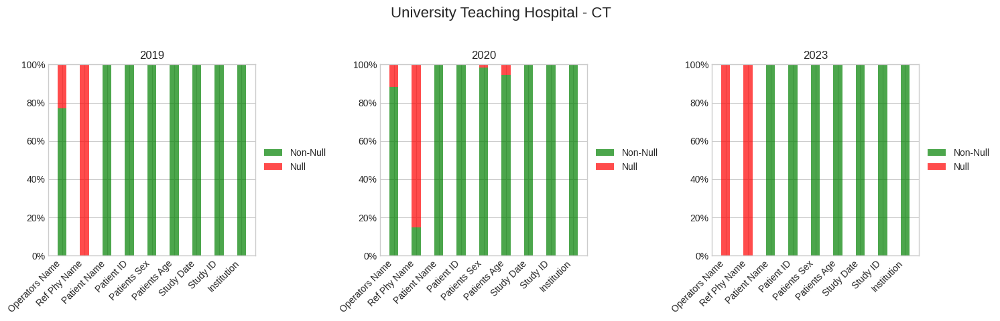

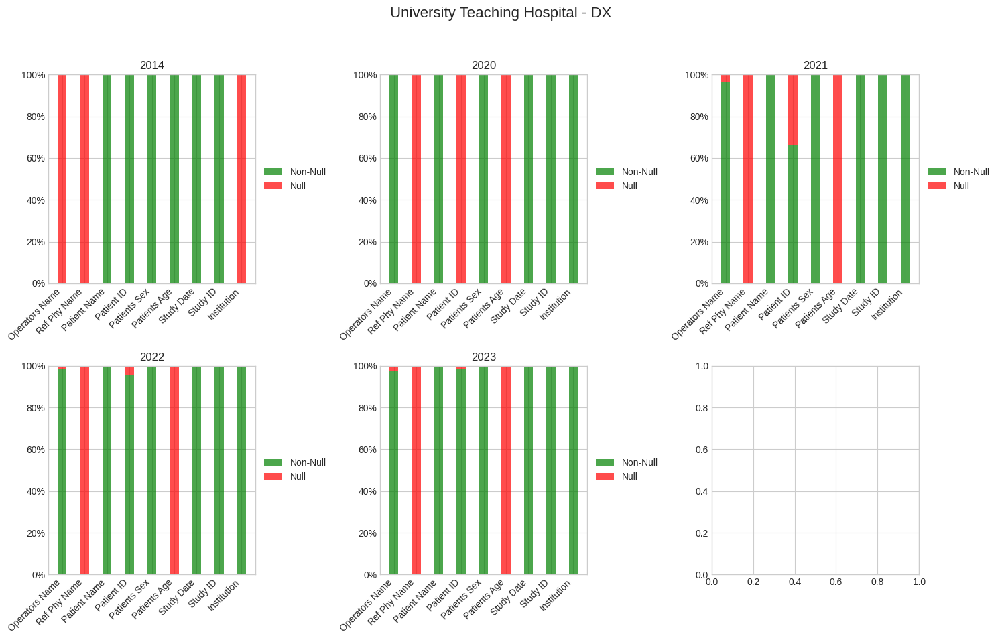

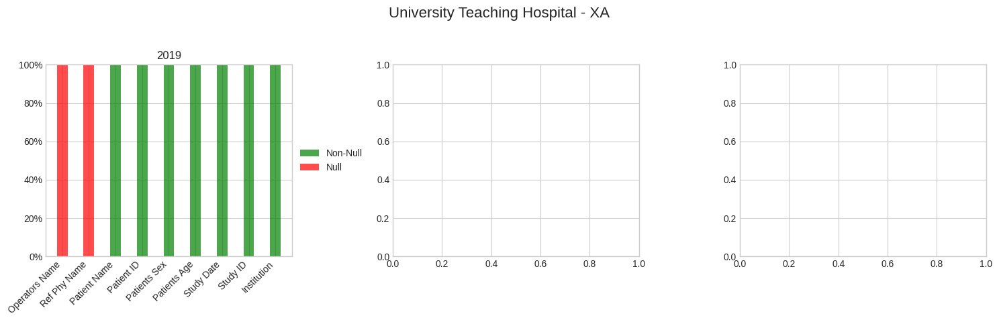

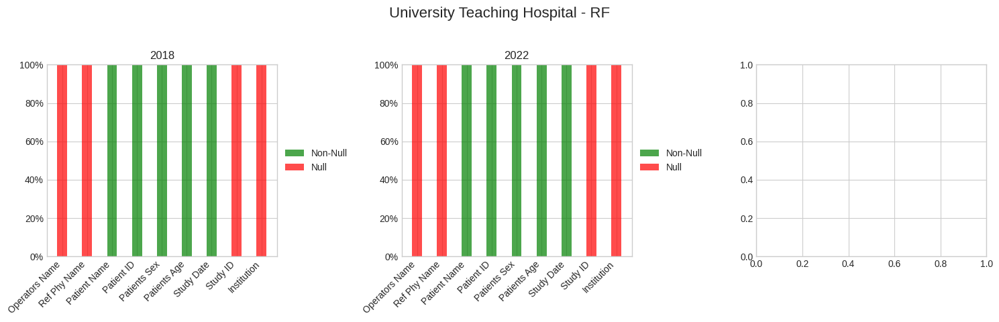

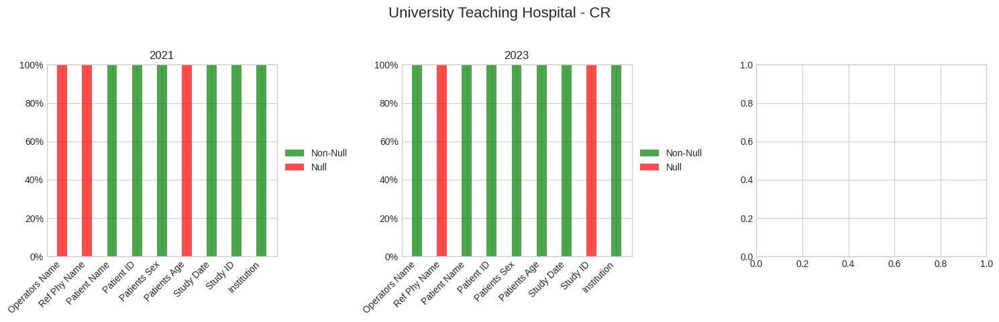

In [7]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Assuming var_uths_dicom_files_DATAFRAME is your dataframe
var_df = var_uths_dicom_files_DATAFRAME.copy()

# Extract the year from the '00080020' (Study Date) column and assign it to a new 'Year' column
var_df['Year'] = pd.to_datetime(var_df['00080020']).dt.year

# Set a nice Matplotlib style
plt.style.use("seaborn-whitegrid")

# Define columns to analyze
var_columns_to_analyze = ['00081070', '00080090', '00100010', '00100020', '00100040', '00101010', '00080020', '00200010', '00080080']

# Create a custom function to format Y-axis labels as percentages
def format_percentage(x, _):
    return f"{x:.0%}"

# Get unique institutions and modalities
var_unique_institutions = var_df['modified_institution'].unique()
var_unique_modalities = var_df['00080060'].unique()

# Modalities to exclude
exclude_modalities = ['KO', 'SR']

var_column_descriptions = {
    '00081070': 'Operators Name',
    '00080090': 'Ref Phy Name',
    '00100010': 'Patient Name',
    '00100020': 'Patient ID',
    '00100040': 'Patients Sex',
    '00101010': 'Patients Age',
    '00200010': 'Study ID',
    '00080020': 'Study Date',
    '00080080': 'Institution'
}

# Calculate the number of years per row
var_years_per_row = 3

# Iterate through each unique institution
for var_institution in var_unique_institutions:
    # Iterate through each unique modality
    for var_modality in var_unique_modalities:
        # Skip modalities in the exclude list
        if var_modality in exclude_modalities:
            continue

        var_institution_modality_data = var_df[
            (var_df['modified_institution'] == var_institution) &
            (var_df['00080060'] == var_modality)
        ]
        
        var_years = sorted(var_institution_modality_data['Year'].unique())
        var_num_years = len(var_years)
        
        # Skip creating subplots if there are no valid years for the institution-modality combination
        if var_num_years == 0:
            continue
        
        var_num_rows = (var_num_years + var_years_per_row - 1) // var_years_per_row
        var_num_cols = var_years_per_row
        
        # Create subplots for each institution-modality combination
        var_fig, var_axs = plt.subplots(var_num_rows, var_num_cols, figsize=(15, 5*var_num_rows))
        var_fig.suptitle(f"{var_institution} - {var_modality}", fontsize=16)
        
        # Loop through rows and columns of subplots
        for i in range(var_num_rows):
            for j in range(var_num_cols):
                var_year_idx = i * var_num_cols + j
                
                # Check if the current year index is within the valid range
                if var_year_idx < var_num_years:
                    # Extract the year and corresponding data for the current subplot
                    var_year = int(var_years[var_year_idx])  # Convert to integer to remove decimal point
                    var_year_data = var_institution_modality_data[var_institution_modality_data['Year'] == var_year]
                    
                    # Initialize lists to store null and non-null counts for each column
                    var_null_counts = []
                    var_non_null_counts = []
                    
                    for var_column in var_columns_to_analyze:
                        var_null_count = var_year_data[var_year_data[var_column].isnull()].shape[0]
                        var_non_null_count = var_year_data[var_year_data[var_column].notnull()].shape[0]
                        
                        total_count = var_null_count + var_non_null_count
                        
                        # Calculate percentages and append to lists
                        var_null_percent = var_null_count / total_count if total_count > 0 else 0
                        var_non_null_percent = var_non_null_count / total_count if total_count > 0 else 0
                        
                        var_null_counts.append(var_null_percent)
                        var_non_null_counts.append(var_non_null_percent)
                    
                    x = range(len(var_columns_to_analyze))
                    width = 0.4  # Width of the bars
                    
                    var_ax = var_axs[i, j] if var_num_rows > 1 else var_axs[j]
                    
                    # Create stacked bars with green at the bottom and red above
                    var_ax.bar(x, var_non_null_counts, width, label='Non-Null', color='green', alpha=0.7)
                    var_ax.bar(x, var_null_counts, width, bottom=var_non_null_counts, label='Null', color='red', alpha=0.7)
                    
                    var_ax.set_title(str(var_year))  # Convert to string to remove decimal point
                    var_ax.set_xticks(x)
                    var_ax.set_xticklabels([var_column_descriptions[col] for col in var_columns_to_analyze], rotation=45, ha="right")
                    var_ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))  # Move the legend to the right side
                    var_ax.grid(True)
                    
                    # Format Y-axis labels as percentages
                    var_ax.yaxis.set_major_formatter(FuncFormatter(format_percentage))

        
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()


In [48]:
# Assuming var_uths_dicom_files_DATAFRAME is your dataframe

var_uths_dicom_files_DATAFRAME["modified_institution"] = None

# Use the values from '00080080' as the 'modified_institution'
var_uths_dicom_files_DATAFRAME['modified_institution'] = var_uths_dicom_files_DATAFRAME['00080080']


/tmp/ipykernel_4391/3104381683.py:12: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use("seaborn-whitegrid")


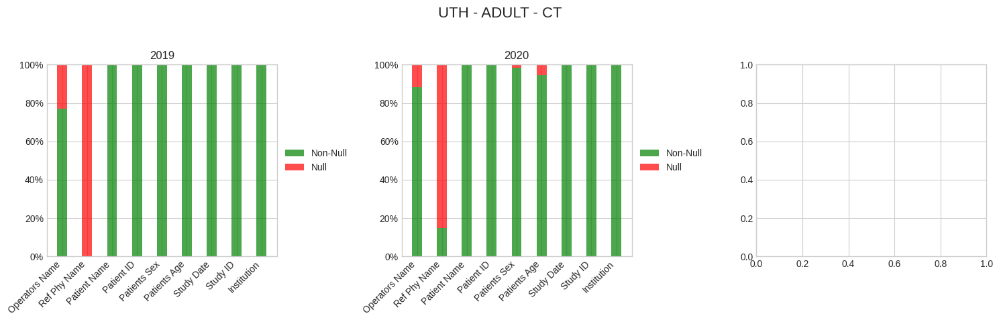

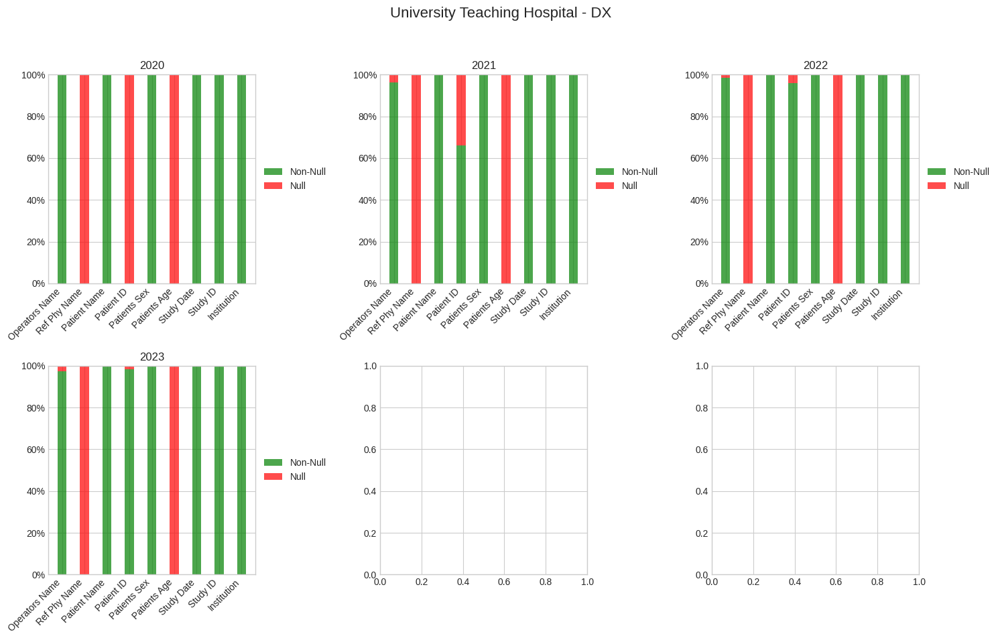

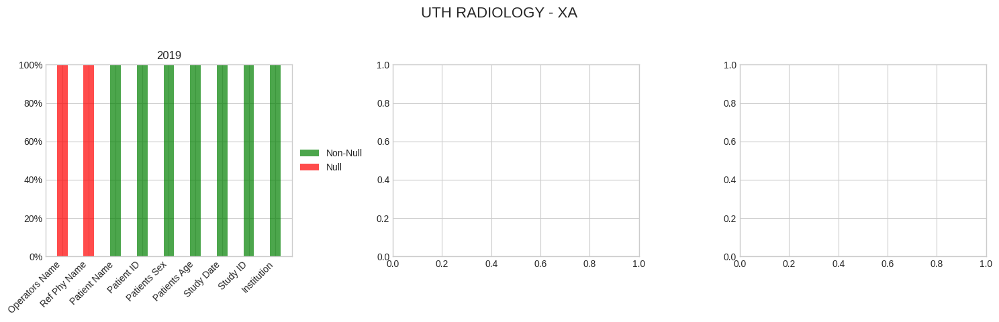

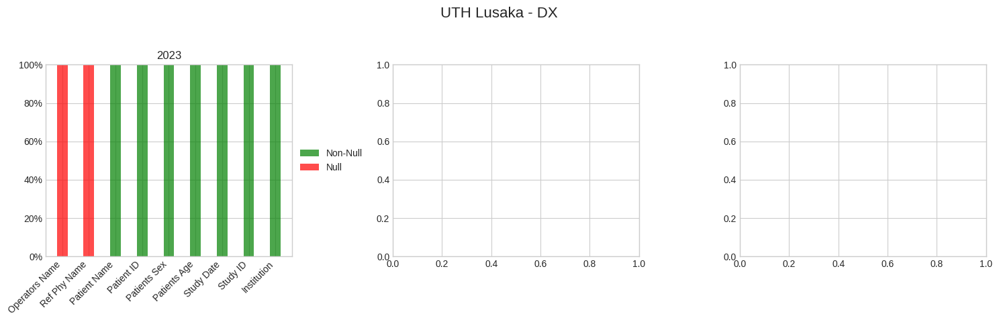

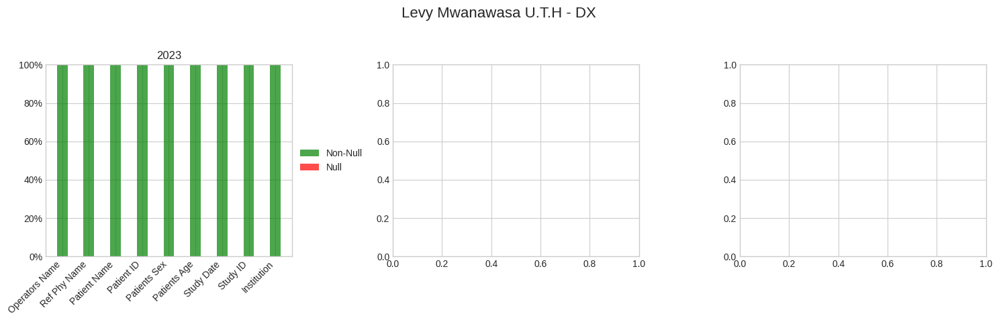

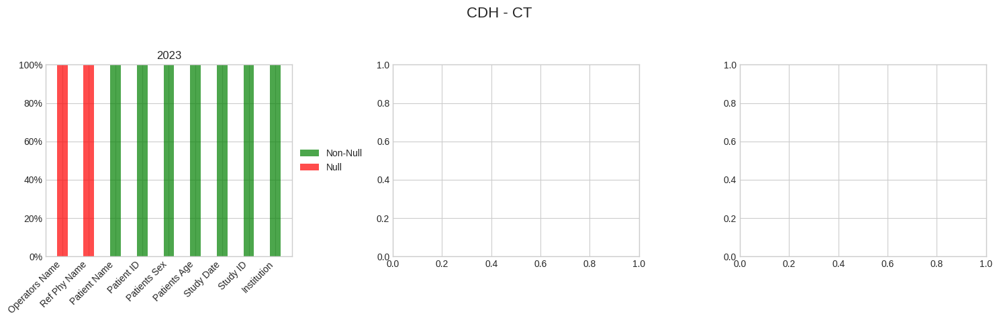

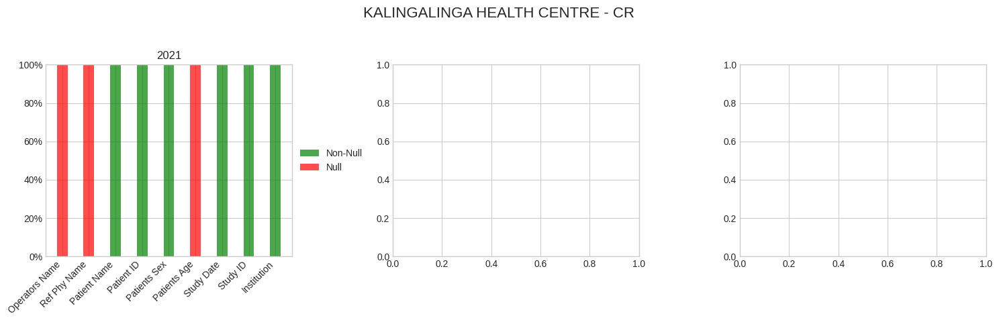

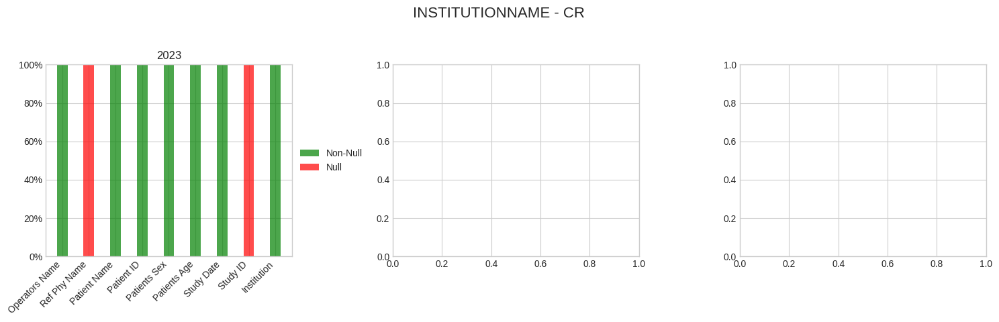

In [78]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Assuming var_uths_dicom_files_DATAFRAME is your dataframe
var_df = var_uths_dicom_files_DATAFRAME.copy()

# Extract the year from the '00080020' (Study Date) column and assign it to a new 'Year' column
var_df['Year'] = pd.to_datetime(var_df['00080020']).dt.year

# Set a nice Matplotlib style
plt.style.use("seaborn-whitegrid")

# Define columns to analyze
var_columns_to_analyze = ['00081070', '00080090', '00100010', '00100020', '00100040', '00101010', '00080020', '00200010', '00080080']

# Create a custom function to format Y-axis labels as percentages
def format_percentage(x, _):
    return f"{x:.0%}"

# Get unique institutions and modalities
var_unique_institutions = var_df['modified_institution'].unique()
var_unique_modalities = var_df['00080060'].unique()

# Modalities to exclude
exclude_modalities = ['KO', 'SR']

var_column_descriptions = {
    '00081070': 'Operators Name',
    '00080090': 'Ref Phy Name',
    '00100010': 'Patient Name',
    '00100020': 'Patient ID',
    '00100040': 'Patients Sex',
    '00101010': 'Patients Age',
    '00200010': 'Study ID',
    '00080020': 'Study Date',
    '00080080': 'Institution'
}

# Calculate the number of years per row
var_years_per_row = 3

# Iterate through each unique institution
for var_institution in var_unique_institutions:
    # Iterate through each unique modality
    for var_modality in var_unique_modalities:
        # Skip modalities in the exclude list
        if var_modality in exclude_modalities:
            continue

        var_institution_modality_data = var_df[
            (var_df['modified_institution'] == var_institution) &
            (var_df['00080060'] == var_modality)
        ]
        
        var_years = sorted(var_institution_modality_data['Year'].unique())
        var_num_years = len(var_years)
        
        # Skip creating subplots if there are no valid years for the institution-modality combination
        if var_num_years == 0:
            continue
        
        var_num_rows = (var_num_years + var_years_per_row - 1) // var_years_per_row
        var_num_cols = var_years_per_row
        
        # Create subplots for each institution-modality combination
        var_fig, var_axs = plt.subplots(var_num_rows, var_num_cols, figsize=(15, 5*var_num_rows))
        var_fig.suptitle(f"{var_institution} - {var_modality}", fontsize=16)
        
        # Loop through rows and columns of subplots
        for i in range(var_num_rows):
            for j in range(var_num_cols):
                var_year_idx = i * var_num_cols + j
                
                # Check if the current year index is within the valid range
                if var_year_idx < var_num_years:
                    # Extract the year and corresponding data for the current subplot
                    var_year = int(var_years[var_year_idx])  # Convert to integer to remove decimal point
                    var_year_data = var_institution_modality_data[var_institution_modality_data['Year'] == var_year]
                    
                    # Initialize lists to store null and non-null counts for each column
                    var_null_counts = []
                    var_non_null_counts = []
                    
                    for var_column in var_columns_to_analyze:
                        var_null_count = var_year_data[var_year_data[var_column].isnull()].shape[0]
                        var_non_null_count = var_year_data[var_year_data[var_column].notnull()].shape[0]
                        
                        total_count = var_null_count + var_non_null_count
                        
                        # Calculate percentages and append to lists
                        var_null_percent = var_null_count / total_count if total_count > 0 else 0
                        var_non_null_percent = var_non_null_count / total_count if total_count > 0 else 0
                        
                        var_null_counts.append(var_null_percent)
                        var_non_null_counts.append(var_non_null_percent)
                    
                    x = range(len(var_columns_to_analyze))
                    width = 0.4  # Width of the bars
                    
                    var_ax = var_axs[i, j] if var_num_rows > 1 else var_axs[j]
                    
                    # Create stacked bars with green at the bottom and red above
                    var_ax.bar(x, var_non_null_counts, width, label='Non-Null', color='green', alpha=0.7)
                    var_ax.bar(x, var_null_counts, width, bottom=var_non_null_counts, label='Null', color='red', alpha=0.7)
                    
                    var_ax.set_title(str(var_year))  # Convert to string to remove decimal point
                    var_ax.set_xticks(x)
                    var_ax.set_xticklabels([var_column_descriptions[col] for col in var_columns_to_analyze], rotation=45, ha="right")
                    var_ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))  # Move the legend to the right side
                    var_ax.grid(True)
                    
                    # Format Y-axis labels as percentages
                    var_ax.yaxis.set_major_formatter(FuncFormatter(format_percentage))

        
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()


In [8]:
##
## Check how many Images, unique patients and unique study ids are available in the dataset

# Assuming var_uths_dicom_files_DATAFRAME is your dataframe
var_df = var_uths_dicom_files_DATAFRAME.copy()

# Filter the dataframe to include only rows with StudyInstanceUID (0020000D)
filtered_df = var_df[var_df['00200010'] != '']

# Group the filtered dataframe by the StudyInstanceUID
grouped_df = filtered_df.groupby('00200010')

total_images = 0  # Initialize a variable to keep track of the total number of images
unique_patients = set()  # Initialize a set to store unique patient IDs
unique_study_ids = set()  # Initialize a set to store unique study IDs
    
# Iterate through the groups and print the StudyInstanceUID and the count of images
for study_uid, group in grouped_df:
    num_images = len(group)
    total_images += num_images
    unique_study_ids.add(study_uid)  # Add the study ID to the set
    unique_patients.update(group['00100010'].astype(str).unique())  # Convert to strings and add unique patient IDs to the set

# Print the total number of images, unique patients, and unique study IDs
print(f"Total Number of Images: {total_images}")
print(f"Total Number of Unique Patients: {len(unique_patients)}")
print(f"Total Number of Unique Study IDs: {len(unique_study_ids)}")


Total Number of Images: 7906
Total Number of Unique Patients: 3901
Total Number of Unique Study IDs: 3334


- Analysis by year indicating total number of records per year for all modalities

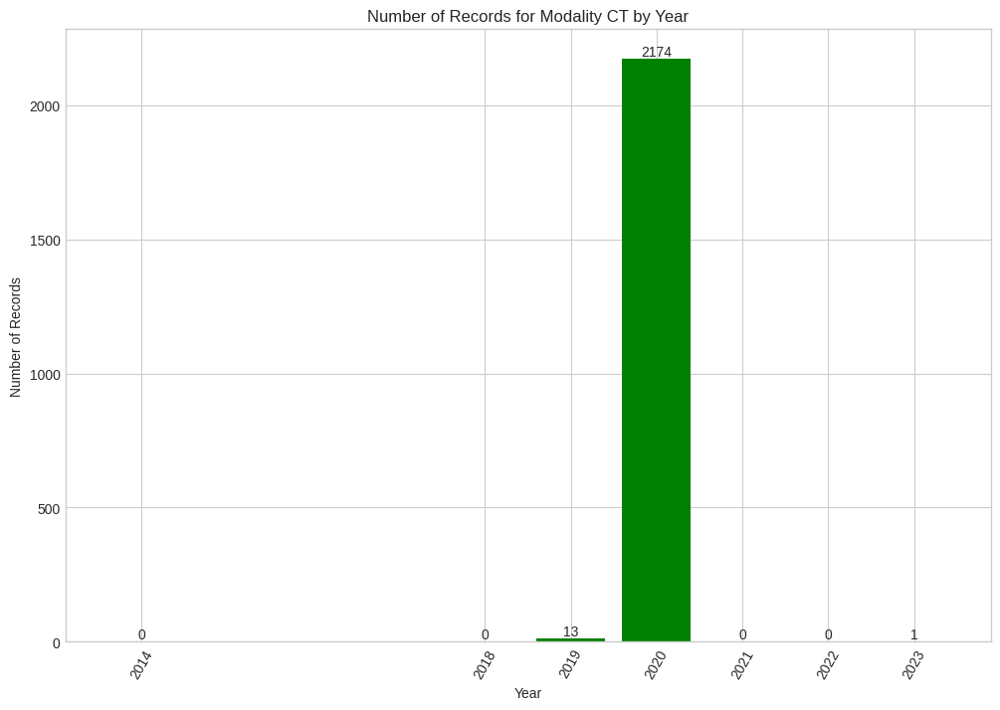

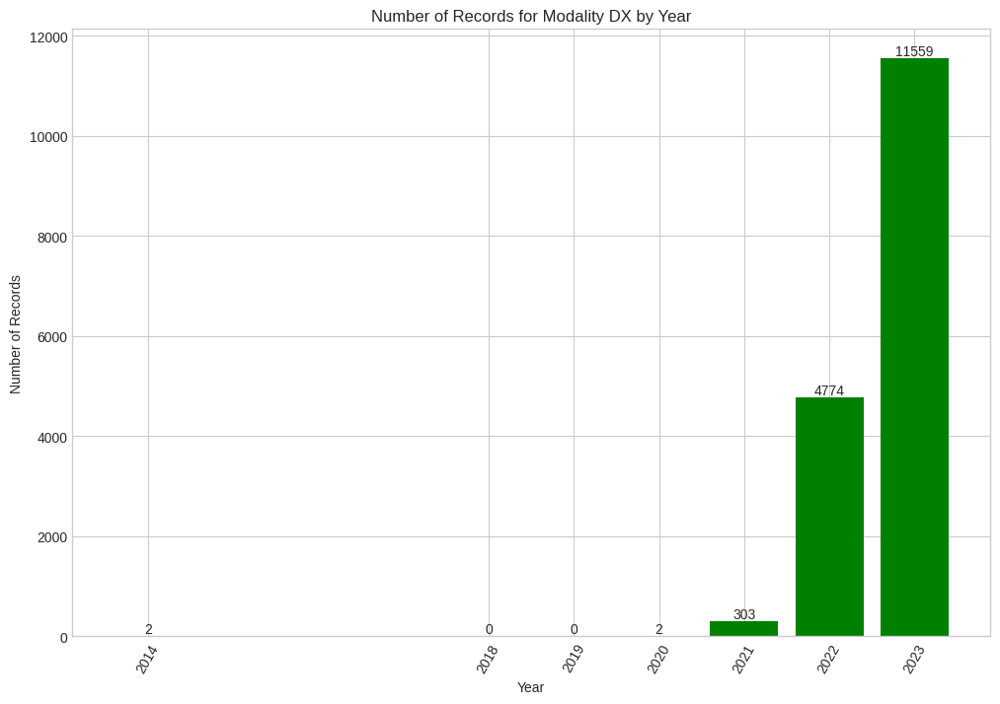

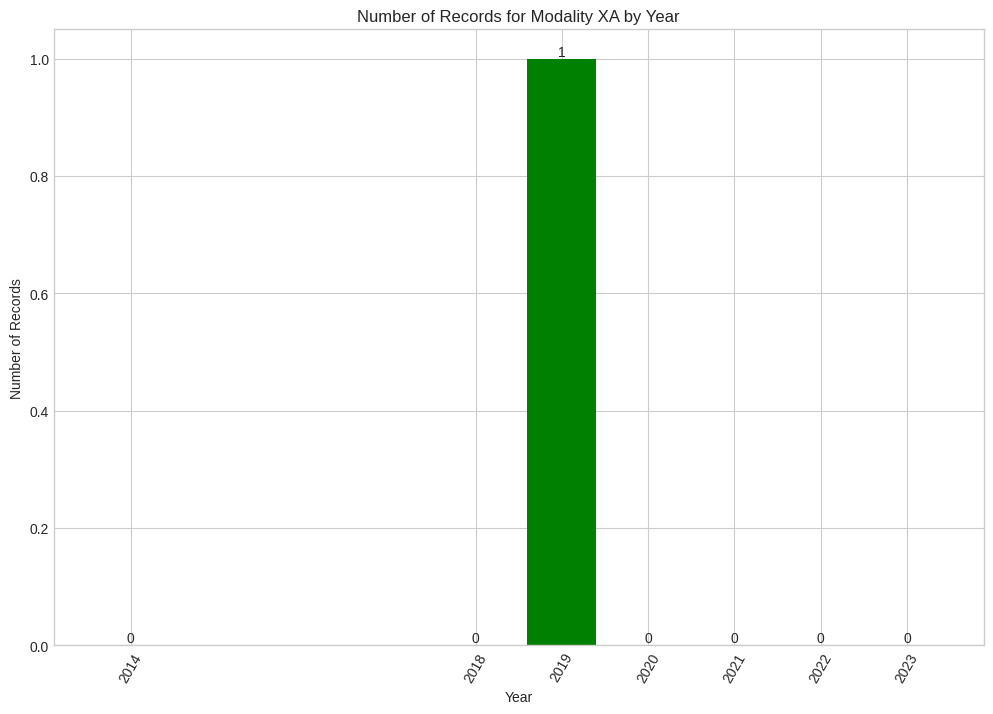

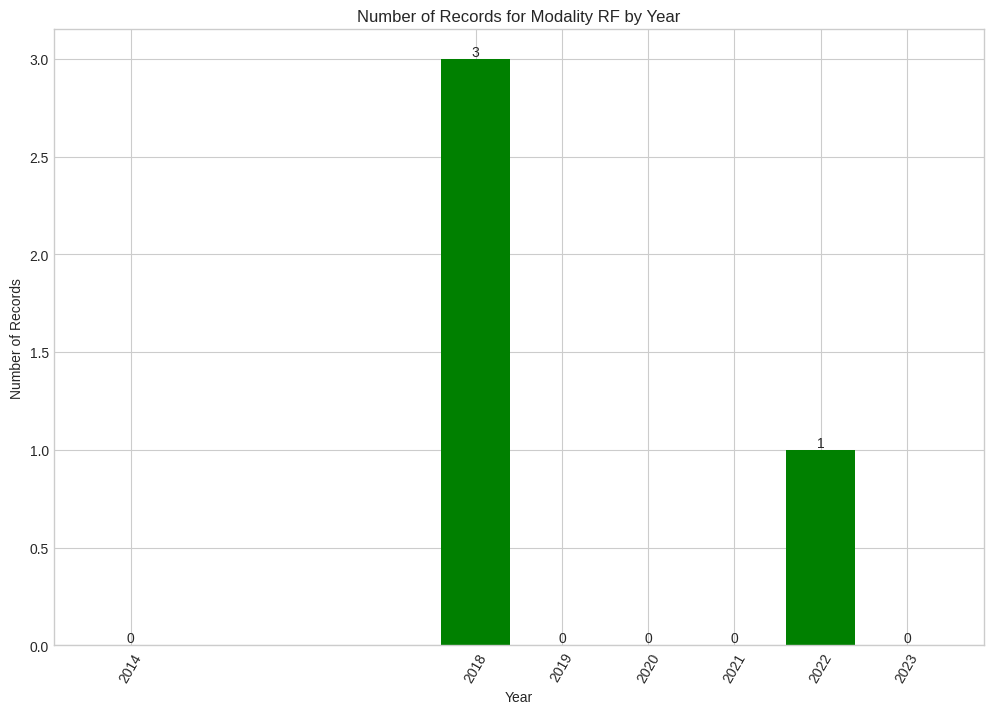

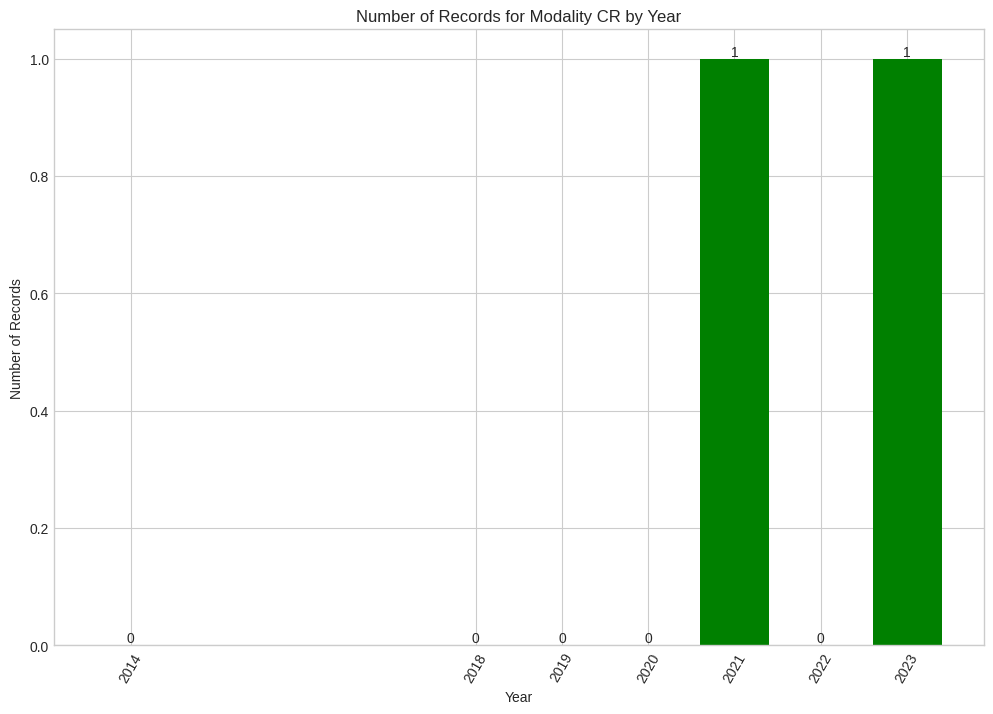

In [88]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Assuming var_uths_dicom_files_DATAFRAME["00080020"] contains dates in the format "YYYYMMDD"
# Extract the year from the dates in the "00080020" column
var_uths_dicom_files_DATAFRAME["Year"] = pd.to_datetime(var_uths_dicom_files_DATAFRAME["00080020"], format="%Y%m%d").dt.year

# Get unique modalities excluding NaN
unique_modalities = var_uths_dicom_files_DATAFRAME["00080060"].unique()

# Find the union of years for all modalities
all_years = set()
for modality in unique_modalities:
    if not pd.isna(modality):
        modality_data = var_uths_dicom_files_DATAFRAME[var_uths_dicom_files_DATAFRAME["00080060"] == modality]
        all_years = all_years.union(set(modality_data["Year"]))

# Convert the set of years to a sorted list
all_years = sorted(list(all_years))

# Iterate through each modality
for modality in unique_modalities:
    if not pd.isna(modality):
        # Filter data for the current modality
        modality_data = var_uths_dicom_files_DATAFRAME[var_uths_dicom_files_DATAFRAME["00080060"] == modality]

        # Count the number of records for each year
        records_by_year = modality_data["Year"].value_counts().sort_index()

        # Pad the records_by_year with zeros for years not present in the current modality
        records_by_year = records_by_year.reindex(all_years, fill_value=0)

        # Plot the bar chart
        plt.figure(figsize=(12, 8))  # Adjust the figure size
        bars = plt.bar(records_by_year.index, records_by_year, color='green')

        # Customize the plot
        plt.xlabel('Year')
        plt.ylabel('Number of Records')
        plt.title(f'Number of Records for Modality {modality} by Year')

        # Annotate each bar with the number of records
        for bar in bars:
            height = bar.get_height()
            plt.text(bar.get_x() + bar.get_width() / 2, height, str(int(height)), ha='center', va='bottom')

        # Set the x-axis ticks to display all the years
        plt.xticks(all_years, rotation=60)

        # Display the plot
        plt.show()


In [1]:
var_uths_dicom_files_DATAFRAME["00100020"]

NameError: name 'var_uths_dicom_files_DATAFRAME' is not defined

- Analysis by year for each modality and counting the number of records

/tmp/ipykernel_4391/3515144107.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  var_uths_dicom_files_DATAFRAME["Modality"] = var_uths_dicom_files_DATAFRAME["00080060"]


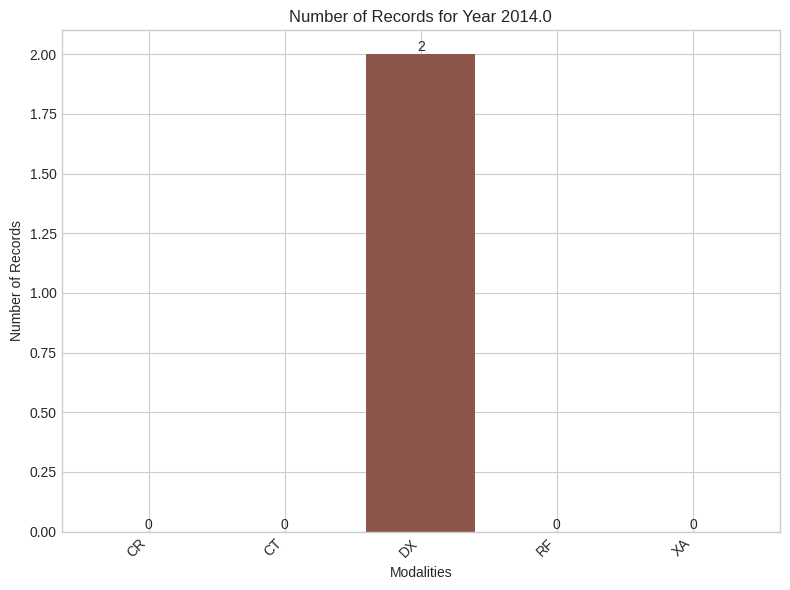

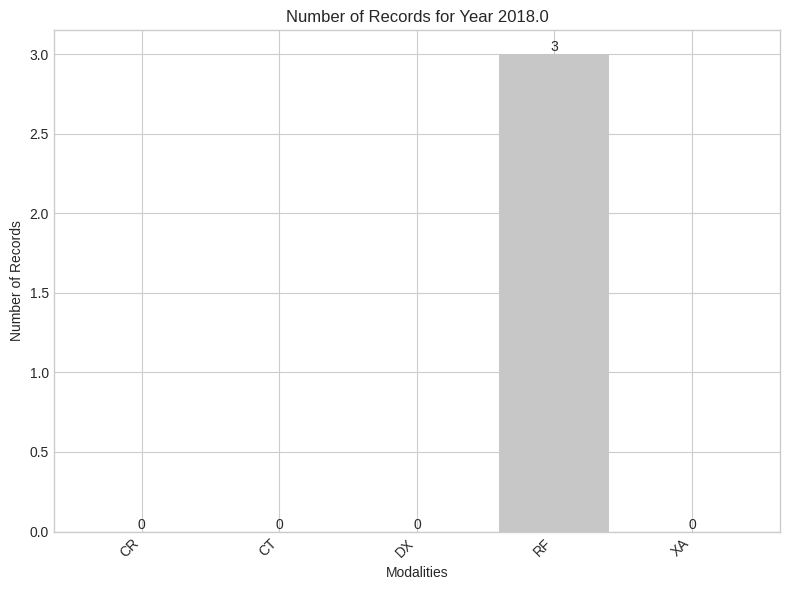

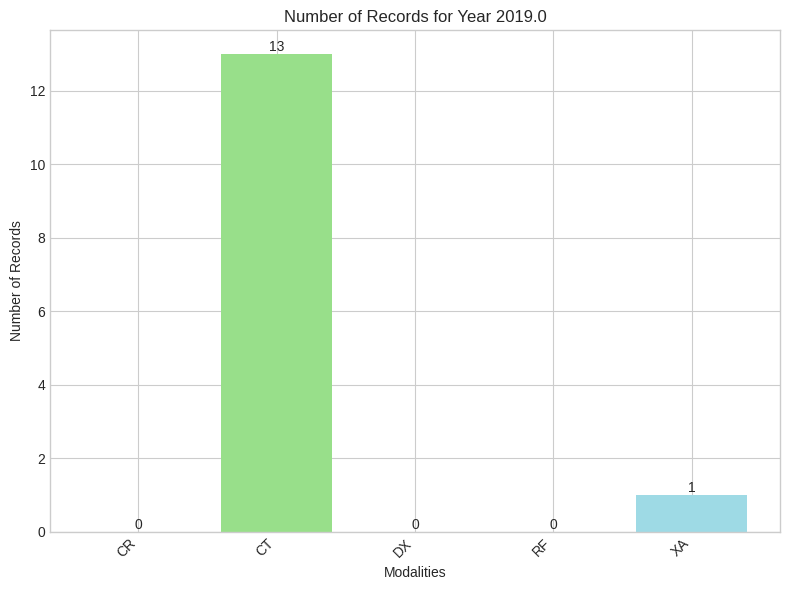

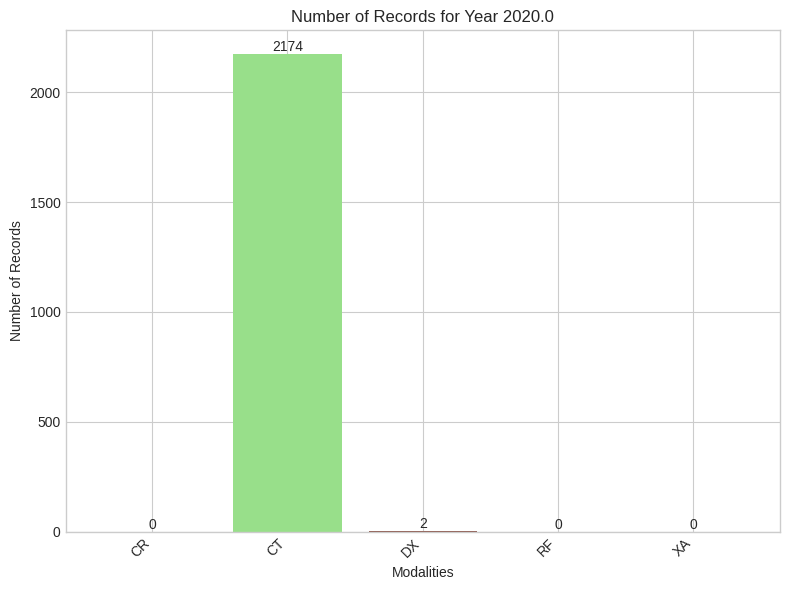

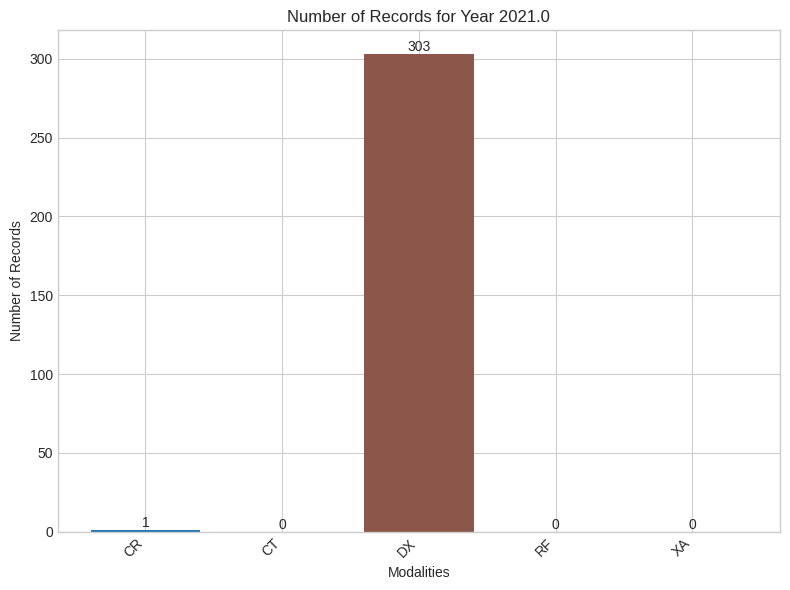

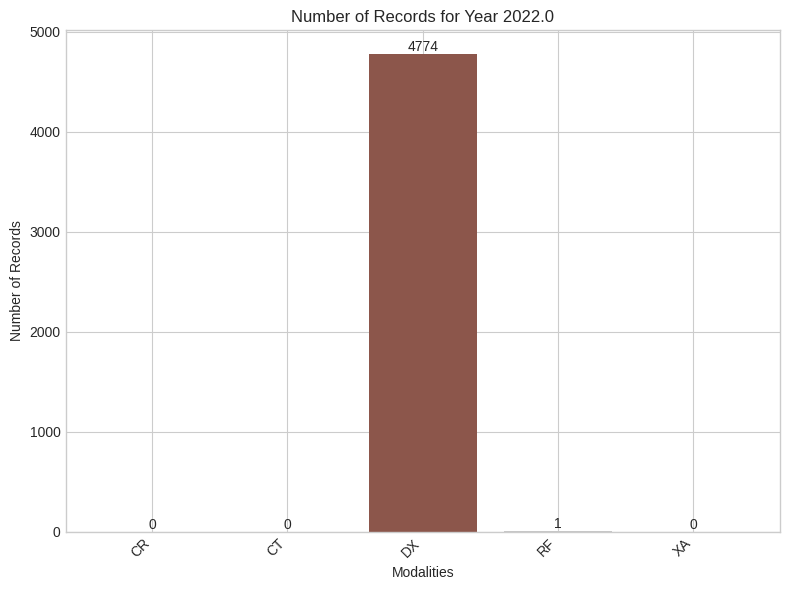

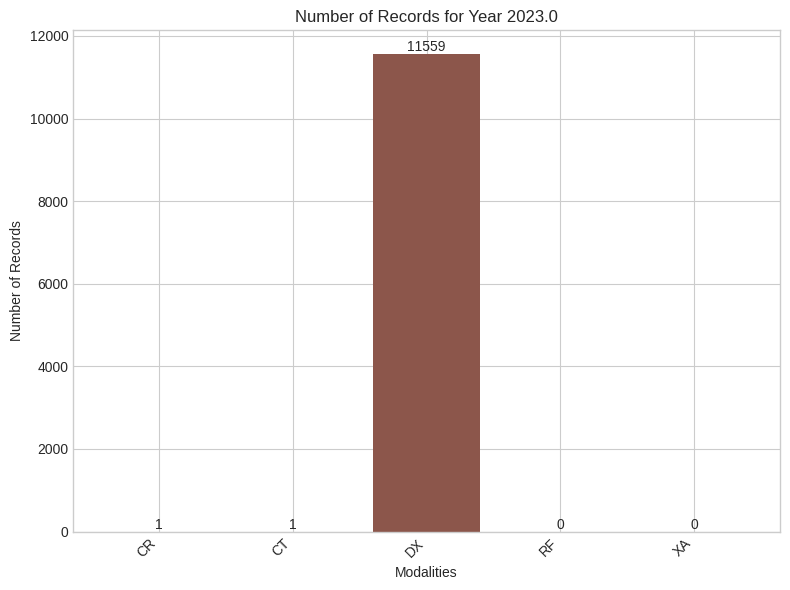

In [90]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Assuming var_uths_dicom_files_DATAFRAME["00080020"] contains dates in the format "YYYYMMDD"
# Extract the year from the dates in the "00080020" column
var_uths_dicom_files_DATAFRAME["Year"] = pd.to_datetime(var_uths_dicom_files_DATAFRAME["00080020"], format="%Y%m%d").dt.year
var_uths_dicom_files_DATAFRAME["Modality"] = var_uths_dicom_files_DATAFRAME["00080060"]

# Count the number of records for each year and modality
records_by_year_modality = var_uths_dicom_files_DATAFRAME.groupby(["Year", "Modality"]).size().unstack(fill_value=0)

# Get the list of years and modalities for plotting
years = records_by_year_modality.index.tolist()
modalities = records_by_year_modality.columns.tolist()

# Create a colormap with a unique color for each modality
num_modalities = len(modalities)
colors = plt.cm.tab20(np.linspace(0, 1, num_modalities))

# Create a separate plot for each year
for year in years:
    # Get the records for the current year
    records = records_by_year_modality.loc[year].tolist()

    # Plot the bar chart for the current year
    plt.figure(figsize=(8, 6))  # Adjust the figure size
    plt.bar(modalities, records, color=colors)

    # Customize the plot
    plt.xlabel('Modalities')
    plt.ylabel('Number of Records')
    plt.title(f'Number of Records for Year {year}')
    plt.xticks(rotation=45, ha='right')

    # Add text labels above each bar with the number of records
    for i, record in enumerate(records):
        plt.text(i, record, str(record), ha='center', va='bottom')

    # Display the plot
    plt.tight_layout()
    plt.show()


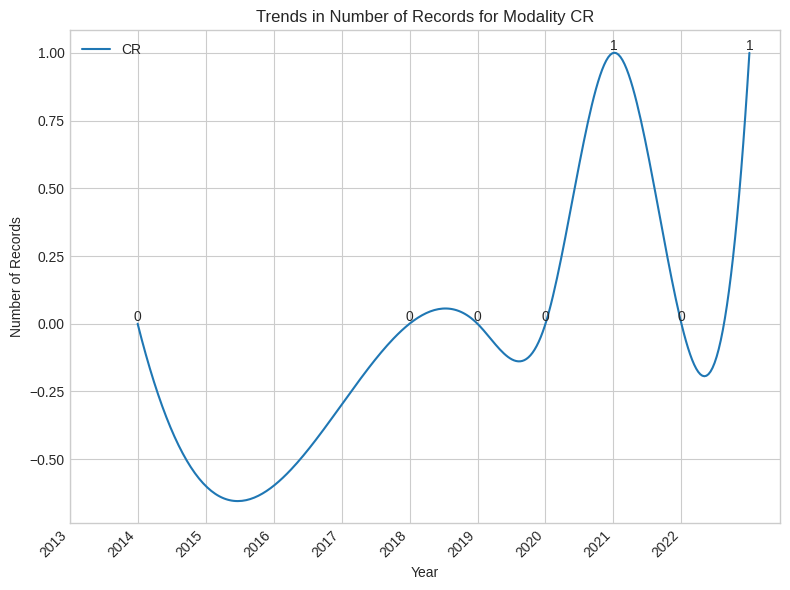

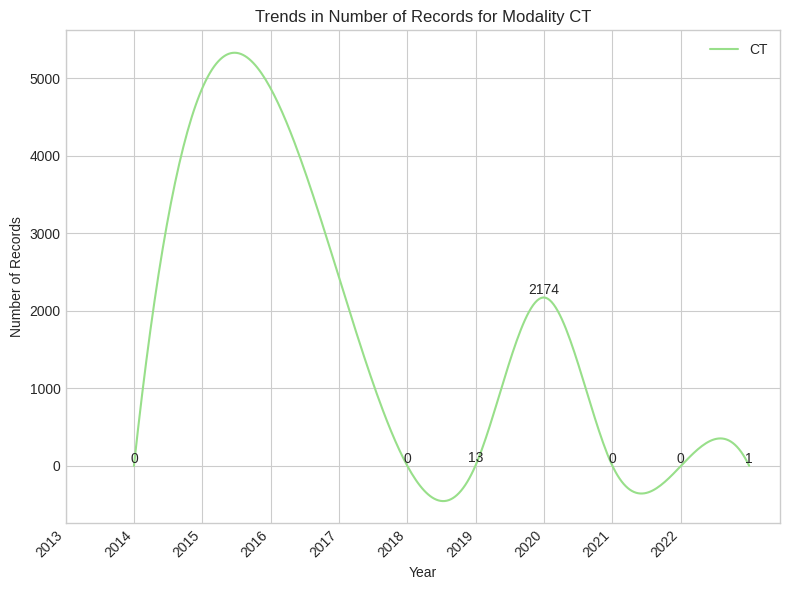

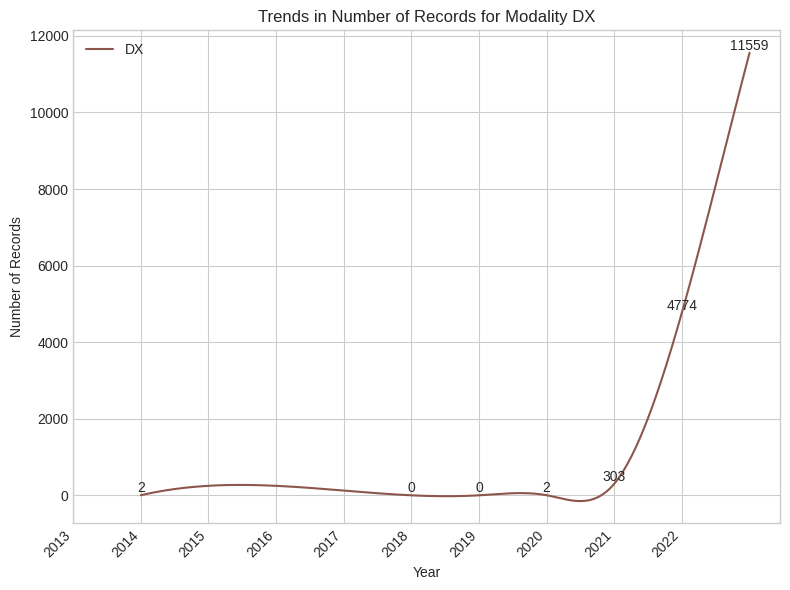

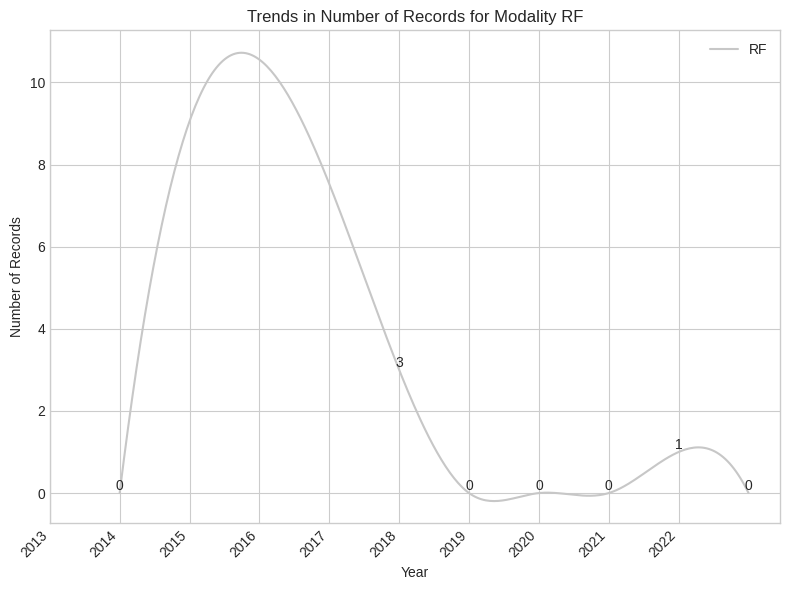

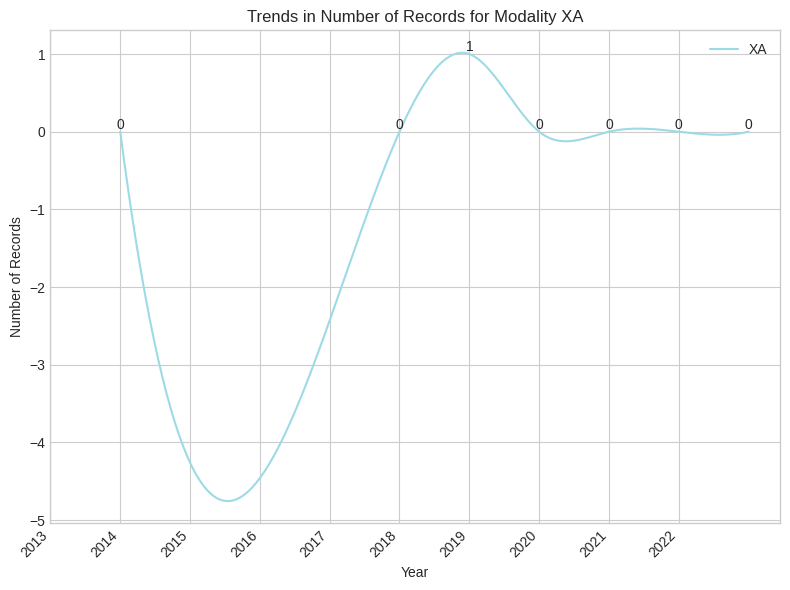

In [91]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import make_interp_spline

# Extract the year from the dates in the "00080020" column
var_uths_dicom_files_DATAFRAME["Year"] = pd.to_datetime(var_uths_dicom_files_DATAFRAME["00080020"], format="%Y%m%d").dt.year
var_uths_dicom_files_DATAFRAME["Modality"] = var_uths_dicom_files_DATAFRAME["00080060"]

# Count the number of records for each year and modality
records_by_year_modality = var_uths_dicom_files_DATAFRAME.groupby(["Year", "Modality"]).size().unstack(fill_value=0)

# Get the list of years and modalities for plotting
years = records_by_year_modality.index.tolist()
modalities = records_by_year_modality.columns.tolist()

# Create a colormap with a unique color for each modality
num_modalities = len(modalities)
colors = plt.cm.tab20(np.linspace(0, 1, num_modalities))

# Set up evenly spaced years for the x-axis
years_smooth = np.linspace(min(years), max(years), 300)

# Create a separate plot for each modality
for modality in modalities:
    # Get the records for the current modality
    records = records_by_year_modality[modality].tolist()

    # Use spline interpolation for smoother curves
    spline = make_interp_spline(years, records)
    records_smooth = spline(years_smooth)

    # Plot the line chart for the current modality
    plt.figure(figsize=(8, 6))  # Adjust the figure size
    plt.plot(years_smooth, records_smooth, color=colors[modalities.index(modality)], label=modality)

    # Customize the plot
    plt.xlabel('Year')
    plt.ylabel('Number of Records')
    plt.title(f'Trends in Number of Records for Modality {modality}')
    plt.xticks(range(2013, 2023), rotation=45, ha='right')  # Set x-axis ticks from 2013 to 2022
    plt.legend()

    # Add text labels above each data point with the number of records
    for x, y in zip(years, records):
        plt.text(x, y, str(y), ha='center', va='bottom')

    # Display the plot
    plt.tight_layout()
    plt.show()


- Access the Speadsheet

In [114]:

# Replace 'path/to/credentials.json' with the path to your downloaded JSON file.
credentials = ServiceAccountCredentials.from_json_keyfile_name('/home/elijah/Downloads/iron-radio-410009-9534231da42b.json', ['https://spreadsheets.google.com/feeds'])

gc = gspread.authorize(credentials)

# Replace 'your-spreadsheet-key' with the key from your Google Sheets URL.
spreadsheet_key = '1WKprsxBRUxuRaexAInKBFjh5ON9p3yOtLyCXhQAJjBY'
worksheet = gc.open_by_key(spreadsheet_key).worksheet("DICOM Tags")

worksheet.add_cols(1)

# Update the header of the new column
worksheet.update_cell(1, 5, 'Weights')

# Get all values from the sheet
rows = worksheet.get_all_values()
var_dicom_registry = pd.DataFrame.from_records(rows[1:], columns=rows[0])

# Display the first 5 rows
var_dicom_registry.head(5)


,Tag,Name,Keyword,,Weights
0,"(0008,0001)",Length to End,Length​To​End,RET,
1,"(0008,0005)",Specific Character Set,Specific​Character​Set,,
2,"(0008,0006)",Language Code Sequence,Language​Code​Sequence,,
3,"(0008,0008)",Image Type,Image​Type,,
4,"(0008,0010)",Recognition Code,Recognition​Code,RET,


In [ ]:
# Conversion of DICOM files dataframe to set
var_dataframe = var_uths_dicom_files_pickle.columns.tolist()

var_converted_dataframe_set_keys = set(var_dataframe)

var_converted_dataframe_set_keys

{'00189433',
 '40101001',
 '300A0793',
 '00189441',
 '00189360',
 '00701907',
 '3010000C',
 '300A063A',
 '00701602',
 '00460080',
 '30100016',
 '30100056',
 '0040A027',
 '0014511A',
 '00700295',
 '003A0302',
 '0022000A',
 '00221225',
 '20000500',
 '30020107',
 '00540032',
 '00409092',
 '00144083',
 '00400620',
 '00189763',
 '00102294',
 '30060014',
 '300A0676',
 '300A0657',
 '00080115',
 '00200100',
 '00189378',
 '00160035',
 '00280710',
 '30100047',
 '0040A13A',
 '00400220',
 '00720056',
 '30080142',
 '30040012',
 '0066001F',
 '00701304',
 '30080064',
 '21300010',
 '00102210',
 '300C0113',
 '300A0782',
 '00181620',
 '00183102',
 '00701507',
 '00404034',
 '00240087',
 '2200000E',
 '00181521',
 '00185212',
 '300A0425',
 '00209153',
 '00181016',
 '00820003',
 '300C0120',
 '300A0198',
 '00189081',
 '00700012',
 '0018113A',
 '00189766',
 '0078002E',
 '00189302',
 '00460203',
 '300A00A2',
 '54000110',
 '300A012E',
 '60xx0012',
 '00221025',
 '50xx200E',
 '00741030',
 '30040052',
 '300A0681',

In [ ]:
# Store set in different variable
var_dicom_files_dataframe_output_keys = set(var_uths_dicom_files_pickle.keys())

# Compute the set difference between the keys and the column names
var_diff = var_dicom_files_dataframe_output_keys - var_converted_dataframe_set_keys

# Print the difference
if var_dicom_files_dataframe_output_keys.issubset(var_converted_dataframe_set_keys):
    print("All keys in var_dicom_files_dataframe_output_keys are also in DataFrame columns.")
else:
    print("Not all keys in var_dicom_files_dataframe_output_keys are in DataFrame columns.")
    var_keys_not_found = var_dicom_files_dataframe_output_keys - var_converted_dataframe_set_keys
    print("Keys in var_dicom_files_dataframe_output_keys but not in DataFrame:", var_keys_not_found)


All keys in var_dicom_files_dataframe_output_keys are also in DataFrame columns.


In [ ]:
#
# Check for missing Refering Physicians Name
#
var_missing_values_ref_phy_name = var_uths_dicom_files_pickle[var_uths_dicom_files_pickle['00080090'].isna()]

num_missing = len(var_missing_values_ref_phy_name)

var_missing_values_ref_phy_name_df = pd.DataFrame(var_missing_values_ref_phy_name)

print(f'Found {num_missing} records with missing values for Referring Physician.')

# Print the records with missing values



Found 1646 records with missing values for Referring Physician.


In [ ]:
#
# Check for missing Operators Name
#
var_missing_values_operator_name = var_uths_dicom_files_pickle[var_uths_dicom_files_pickle['00081070'].isna()]

num_missing = len(var_missing_values_operator_name)

var_missing_values_operator_name_df = pd.DataFrame(var_missing_values_operator_name)

print(f'Found {num_missing} records with missing values for Operators Name')

# Print the records with missing values
var_missing_values_operator_name_df

In [ ]:
#
# Inspect DataFrame



# var_uths_dicom_files.get('00081140', '')

In [ ]:
#
# Creating a DataFrame from 142 test DICOM files takes ~7 minutes
# Save DataFrame to disk
#####var_uths_dicom_files.to_pickle("var_uths_dicom_files_dataframe.pkl")
#####var_uths_dicom_files.to_csv("var_uths_dicom_files_dataframe.csv")

In [ ]:
var_workbook = gc.open_by_url('https://docs.google.com/spreadsheets/d/1ma50T52RWSuCIQFTWbechGzHXsutxTayyYV6mAiZ3qI')
var_worksheet = var_workbook.worksheet("ReferenceDataframeStructure")
var_rows = var_worksheet.get_all_values()
var_dicom_registry = pd.DataFrame.from_records(var_rows[1:], columns=var_rows[0])
pd.DataFrame.from_records(var_rows[1:], columns=var_rows[0]).head(5)

,Tag,Name,Keyword,VR,VM,Status
0,00080001,LengthToEnd,Length​To​End,UL,1,RET
1,00080005,SpecificCharacterSet,Specific​Character​Set,CS,1-n,
2,00080006,LanguageCodeSequence,Language​Code​Sequence,SQ,1,
3,00080008,ImageType,Image​Type,CS,2-n,
4,00080010,RecognitionCode,Recognition​Code,SH,1,RET


In [ ]:
#
# Create dictionary to be used to rename DataFrame with DICOM tag names
#
var_dicom_tags_dict = dict(zip(var_dicom_registry["Tag"], var_dicom_registry["Name"].replace({" ": ""})))

In [ ]:
var_dicom_tags_dict

{'00080001': 'LengthToEnd',
 '00080005': 'SpecificCharacterSet',
 '00080006': 'LanguageCodeSequence',
 '00080008': 'ImageType',
 '00080010': 'RecognitionCode',
 '00080012': 'InstanceCreationDate',
 '00080013': 'InstanceCreationTime',
 '00080014': 'InstanceCreatorUid',
 '00080015': 'InstanceCoercionDatetime',
 '00080016': 'SopClassUid',
 '00080017': 'AcquisitionUid',
 '00080018': 'SopInstanceUid',
 '00080019': 'PyramidUid',
 '0008001A': 'RelatedGeneralSopClassUid',
 '0008001B': 'OriginalSpecializedSopClassUid',
 '00080020': 'StudyDate',
 '00080021': 'SeriesDate',
 '00080022': 'AcquisitionDate',
 '00080023': 'ContentDate',
 '00080024': 'OverlayDate',
 '00080025': 'CurveDate',
 '0008002A': 'AcquisitionDatetime',
 '00080030': 'StudyTime',
 '00080031': 'SeriesTime',
 '00080032': 'AcquisitionTime',
 '00080033': 'ContentTime',
 '00080034': 'OverlayTime',
 '00080035': 'CurveTime',
 '00080040': 'DataSetType',
 '00080041': 'DataSetSubtype',
 '00080042': 'NuclearMedicineSeriesType',
 '00080050': 

In [ ]:
var_uths_dicom_files_dataframe = var_uths_dicom_files.rename(
    columns=var_dicom_tags_dict
)

In [ ]:
#
# Ad hoc analysis: checking for columns linked to unique identifiers
for var_column in var_uths_dicom_files_dataframe.columns.to_list():
  if "uid" in var_column.lower():
    print (var_column)

InstanceCreatorUid
SopClassUid
AcquisitionUid
SopInstanceUid
PyramidUid
RelatedGeneralSopClassUid
OriginalSpecializedSopClassUid
FailedSopInstanceUidList
CodingSchemeUid
ContextGroupExtensionCreatorUid
ContextUid
MappingResourceUid
StoredInstanceTransferSyntaxUid
ListOfUidMatchingSequence
ReferencedSopClassUid
ReferencedSopInstanceUid
Multi-FrameSourceSopInstanceUid
TransactionUid
AvailableTransferSyntaxUid
IrradiationEventUid
RadiopharmaceuticalAdministrationEventUid
Creator-VersionUid
DeviceUid
Manufacturer'SDeviceClassUid
TargetUid
TargetFrameOfReferenceUid
StudyInstanceUid
SeriesInstanceUid
FrameOfReferenceUid
SynchronizationFrameOfReferenceUid
SopInstanceUidOfConcatenationSource
ConcatenationUid
DimensionOrganizationUid
VolumeFrameOfReferenceUid
TableFrameOfReferenceUid
ReferencedColorPaletteInstanceUid
PaletteColorLookupTableUid
LargePaletteColorLookupTableUid
FlowTransferSyntaxUid
MultiplexGroupUid
SpecimenUid
ReferencedGeneralPurposeScheduledProcedureStepTransactionUid
Findings

In [ ]:
###var_uths_dicom_files_dataframe[~var_uths_dicom_files_dataframe["AnatomicRegionSequence"].isnull()]
#var_uths_dicom_files_dataframe["StudyDescription"]
var_uths_dicom_files_dataframe[~var_uths_dicom_files_dataframe["StudyDescription"].isnull()].head(1).T

,232
LengthToEnd,NaN
SpecificCharacterSet,ISO_IR 192
LanguageCodeSequence,NaN
ImageType,PRIMARY
RecognitionCode,NaN
...,...
00191617,NaN
0019161B,NaN
0019161C,NaN
0019161E,NaN


In [ ]:
#
# Inspect entries with the same StudyInstanceUID
#
var_uths_dicom_files_dataframe[var_uths_dicom_files_dataframe["StudyInstanceUid"]=="1.2.840.887072.1.9.20220316035021.156137219"].T

,218,219,220
LengthToEnd,NaN,NaN,NaN
SpecificCharacterSet,ISO_IR 192,ISO_IR 192,ISO_IR 192
LanguageCodeSequence,NaN,NaN,NaN
ImageType,PRIMARY,PRIMARY,PRIMARY
RecognitionCode,NaN,NaN,NaN
...,...,...,...
00191617,NaN,NaN,NaN
0019161B,NaN,NaN,NaN
0019161C,NaN,NaN,NaN
0019161E,NaN,NaN,NaN


In [ ]:
var_pandas_pickle = pd.read_pickle('/content/drive/Shareddrives/Projects | Academic | Medical Imaging Project/projects/misc-emiz23-google_award_for_inclusion_research_program/work_packages/work_package_3-dicom_compliance/implementation/work_package_3-code-pickle-saved_states/var_uths_dicom_files.pickle')

In [ ]:
type(var_pandas_pickle)

pandas.core.frame.DataFrame

In [ ]:
var_pandas_pickle['00081070'].describe()

count       0
unique      0
top       NaN
freq      NaN
Name: 00081070, dtype: object

In [ ]:
!ls '/content/drive/Shareddrives/Projects | Academic | Medical Imaging Project/projects/misc-emiz23-google_award_for_inclusion_research_program/work_packages/work_package_3-dicom_compliance/implementation'

code-emiz23-dicom_metadata_compliance.ipynb
work_package_3-code-pickle-saved_states
work_package_3-converted_json_files-ex


In [17]:
verse = "If you can keep your head when all about you\n  Are losing theirs and blaming it on you,\nIf you can trust yourself when all men doubt you,\n  But make allowance for their doubting too;\nIf you can wait and not be tired by waiting,\n  Or being lied about, don’t deal in lies,\nOr being hated, don’t give way to hating,\n  And yet don’t look too good, nor talk too wise:"

print(verse.rfind('you'))

186
